ACEA Smart Water Feature Analysis via VAR, VECM and LSTM
=====

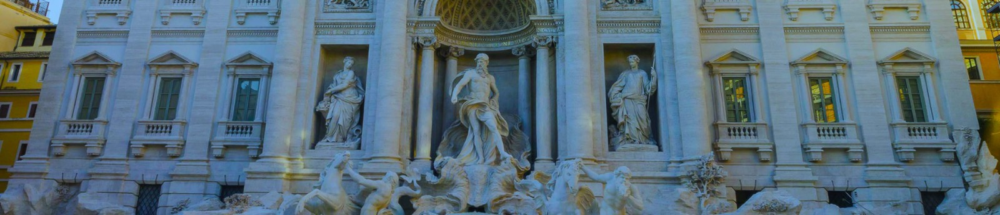

In [10]:
from IPython.display import Image
Image("/Users/mbpr/GitHub/Acea-Smart-Water-Analytics/image/toppic.jpeg")

# Introduction

## Preface

In a time in which climate change causes irregular rainfall while consumers and regulators demand water that is free of chemical pollutants, it is increasingly important to find sustainable sources of water. This is a large challenge because sustainable water treatments and water reclamation are costly. If one could accurately predict the water availability in rivers, lakes, the ground and in water springs, it would be easier to delegate between natural water sources and expensive water treatments. In 2019, people in the region of Toscana paid the highest water prices in Italy. We will be investigating nine datasets and try to predict water levels and flows. 

The datasets contain information like various rainfalls or temperatures, flow rates from water strings, hydrometries from river or a lake and groundwater levels. In the story we tell about how these variables act together, the weather is the exogenous force. Rain pours down and collects into rivers from where it fills lakes and later reaches aquifers, depending on the permeability of the soil. These water bodies may exercise pressure on each other, causing the flow rates of water springs to change. The order of these events is important in our search for causal relationships.

A large part of our work concentrates on the use of parametric models. VAR and VECM models offer nice ways to infer causal relationships. We will use orthogonalised impulse responses (OIR) and forecast error variance decompositions (FEVD) in order to explain the evolution of water levels and flow rates. In addition to this, we also use a long short-term memory (LSTM) neural network as an alternative method to make predictions.

Our models have some imitations: VAR and VECM serve as linear predictors, and the LSTM is sensitive to initial hidden states and requires large datasets to be trained to precision. However, the reasons for choice of our models are as follows: The VAR and VECM models can be expected to be the leased biased due to their linear properties – possibly at the cost of a higher RMSE/MAE. Contrary to complex machine learning models, our models allow for the investigation of causal relationships. The low bias in our models allows for reliable interpretations of the OIR plots which are useful to determine causal relationships between features – such tools are not available for black box models.

## Common Settings

In some sections, **if there is no VECM model**, it means the VECM we've implemented performs poorer than VAR and should be thus dropped. (This means that the loss of estimations efficiency outweighs the gain from cointegration. So we won't look into cointegration matrix to extract insight.)

All datasets are cut into train/val/testing dataset with ratios 90/10/10 out of 100. <br/>
While VAR (require stationary) and VECM (do not need stationary) are trained on training and validation dataset, LSTM model is only trained on training data and is early stopped (and fine tuned) via validation dataset.

All models are tested on testing dataset of various size dependent on the amount of non-missing observations available in different data. The measure we use is RMSE and MAE.

To verify the quality of our time series models, we perform a [Durbin-Watson](https://en.wikipedia.org/wiki/Durbin%E2%80%93Watson_statistic) test and a [Portmanteau test](https://en.wikipedia.org/wiki/Portmanteau_test). While a Durbin-Watson test checks if the error terms are autocorrelated at a lag order of one, the Portmanteau test checks if the autocorrelation of several lags is zero. We always chose the number of lags to be a multiple of the respective model and usually found that there was still autocorrelation left in the error terms. We also checked with a [test for normality(Jarque–Bera test)](https://en.wikipedia.org/wiki/Jarque%E2%80%93Bera_test) of the error terms which was denied in all cases. For the VECM, since it detects conintegration relations among features and thus do not require stationary data, we use [Johansen cointegration test](https://en.wikipedia.org/wiki/Johansen_test) to help select the conitegration rank.

Finally, OIR/FEVD analysis of VAR and sensitivity analysis of LSTM are reported to get insight of feature importance.

# Libraries, Functions, and Classes

## Import Libraries

In [1]:
# Import libraries
import pandas as pd
import numpy as np
import os
import scipy
from datetime import datetime, date 
# from termcolor import colored
import re
import math
import missingno as mnso
from functools import partial

import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.axes._axes import _log as matplotlib_axes_logger
# matplotlib_axes_logger.setLevel('ERROR')

import tensorflow as tf
import keras
from sklearn import linear_model
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.decomposition import PCA

import statsmodels
import statsmodels.stats.stattools
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import grangercausalitytests
from statsmodels.tsa import vector_ar
from statsmodels.tsa.api import VAR
from statsmodels.tsa.vector_ar import vecm
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

import warnings
from statsmodels.tools.sm_exceptions import ValueWarning, HypothesisTestWarning
warnings.simplefilter('ignore', ValueWarning)
warnings.simplefilter('ignore', HypothesisTestWarning)
warnings.filterwarnings('ignore', category=RuntimeWarning)

image_path = '../input/acea-water-images/'
datapath = '../input/acea-water-prediction/'
modelpath = '../input/aceawatermodels/'

## Plotting Functions

In [2]:
# plotting functions
def feature_plots(data):
    """Plot each group of features of aquifer dataframe"""
    date_flag = 0
    df = data.copy()
    if df is pd.Series: 
        df = df.to_frame()
    # create Date column
    if not 'Date' in df.columns.values:
        df['Date'] = df.index
        date_flag = 1
    # plot Rainfalls
    if df.columns.str.contains('Rainfall.*').any():
        sns.relplot(x='Date', y='value', col='Feature', col_wrap=5, kind='line', 
                    data = df.filter(regex='Date|^Rainfall_.+').melt(
                            id_vars='Date', var_name='Feature', ignore_index=False))
        plt.suptitle('Rainfalls', y=1.02)
    # plot gounrdwaters and Volumes
    if df.columns.str.contains('Depth_.*').any():
        sns.relplot(x='Date', y='value', hue='Feature', kind='line', 
                    data = df.filter(regex='Date|^Depth_.+').melt(
                            id_vars='Date', var_name='Feature', ignore_index=False))
        plt.suptitle('Groundwaters', y=1.02)
    if df.columns.str.contains('Volume.*').any():
        sns.relplot(x='Date', y='value', hue='Feature', kind='line', 
                    data = df.filter(regex='Date|^Volume_.+').melt(
                            id_vars='Date', var_name='Feature', ignore_index=False))
        plt.suptitle('Volumes', y=1.02)
    # plot Temperatures
    if df.columns.str.contains('Temperature.*').any():
        sns.relplot(x='Date', y='value', col='Feature', kind='line', 
                    data = df.filter(regex='Date|^Temperature.+').melt(
                            id_vars='Date', var_name='Feature', ignore_index=False))
        plt.suptitle('Temperatures', y=1.02)
    # plot Hydrometry
    if df.columns.str.contains('Hydrome.*').any():
        sns.relplot(x='Date', y='value', col='Feature', kind='line', 
                    data = df.filter(regex='Date|^Hydrometry_.+').melt(
                            id_vars='Date', var_name='Feature', ignore_index=False))
        plt.suptitle('Hydrometries', y=1.02)
    # plot Flow Rate
    if df.columns.str.contains('Flow.*').any():
        sns.relplot(x='Date', y='value', hue='Feature', kind='line', 
                    data = df.filter(regex='Date|^Flow_.+').melt(
                            id_vars='Date', var_name='Feature', ignore_index=False))
        plt.suptitle('Flow Rates', y=1.02)
    if df.columns.str.contains('Lake.*').any():
        sns.relplot(x='Date', y='value', hue='Feature', kind='line', 
                    data = df.filter(regex='Date|^Lake_.+').melt(
                            id_vars='Date', var_name='Feature', ignore_index=False))
        plt.suptitle('Lake Levels', y=1.02)
    plt.show()
    if date_flag:
        df.drop(columns='Date', inplace=True)
        
def water_spring_feature_plots(df):
    """Plot each group of features of aquifer dataframe"""
    date_flag = 0
    # create Date column
    if not 'Date' in df.columns.values:
        df['Date'] = df.index
        date_flag = 1
    # plot rainfalls
    sns.relplot(x='Date', y='value', col='Feature', col_wrap=5, kind='line',
                data = df.filter(regex='Date|^Rainfall_.+').melt(
                        id_vars='Date', var_name='Feature', ignore_index=False))
    plt.suptitle('Rainfalls', y=1.02)
    # plot groundwater depths
    sns.relplot(x='Date', y='value', hue='Feature', kind='line',
                data = df.filter(regex='Date|^Depth_.+').melt(
                        id_vars='Date', var_name='Feature', ignore_index=False))
    plt.suptitle('Groundwaters', y=1.02)
    # plot flow rate
    sns.relplot(x='Date', y='value', hue='Feature', kind='line',
                data = df.filter(regex='Date|^Flow_.+').melt(
                        id_vars='Date', var_name='Feature', ignore_index=False))
    plt.suptitle('Flow Rates', y=1.02)
    # plot temperatures
    sns.relplot(x='Date', y='value', col='Feature', kind='line',
                data = df.filter(regex='Date|^Temperature.+').melt(
                        id_vars='Date', var_name='Feature', ignore_index=False))
    plt.suptitle('Temperatures', y=1.02)
    if date_flag:
        df.drop(columns='Date', inplace=True)

def missingval_plot(df, figsize=(20,6), show=True):
    """
    Visualize index location of missin values of each feature.
    Doesn't work for 1-dim df.
    df: pd.DataFrame 
    """
    # check all are bool
    if (df.dtypes != bool).any():
        df = df.reset_index().T.isna()
    f, ax = plt.subplots(nrows=1, ncols=1, figsize=figsize)
    g = sns.heatmap(df, cmap='Blues', cbar=True, yticklabels=df.index.values)
    # customize colorbar
    colorbar = g.collections[0].colorbar
    colorbar.set_ticks([0, 1])
    colorbar.set_ticklabels(['non-missing', 'missing'])
    # customize title
    ax.set_title('Distribution of Missing Values', fontsize=16)
    # customize font size in ticks
    for tick in ax.xaxis.get_major_ticks():
        tick.label.set_fontsize(12) 
    for tick in ax.yaxis.get_major_ticks():
        tick.label.set_fontsize(12)
    if show: 
        plt.show()

def corrtri_plot(df, figsize=(10,10)):
    """correlation plot of the dataframe"""
    # sns.set() #: will cause plt warning later in lag_plot
    c = df.corr()
    mask = np.triu(c.corr(), k=1)
    plt.figure(figsize=figsize)
    plt.tick_params(axis='both', which='major', labelsize=10, 
                    bottom=False, labelbottom=False, 
                    top=False, labeltop=True)
    g = sns.heatmap(c, annot=True, fmt='.1f', cmap='coolwarm', 
                    square=True, mask=mask, linewidths=1, cbar=False)
    plt.show()

def periodogram(series, division=8):
    """plot periodogram of the series to find most important frequency/periodicity"""
    dt = 1
    T = len(series.index)
    t = np.arange(0, T, dt)
    f = series.fillna(0)
    n = len(t)
    fhat = np.fft.fft(f, n, )
    PSD = np.conj(fhat) / n
    freq = np.arange(n) # * (1/(dt*n))
    L = np.arange(1, np.floor(n/division), dtype="int") # n/4, otherwise too long of a stretch to see anything
    
    plt.plot(freq[L], np.abs(PSD[L]), linewidth=2, label='Lag Importance')
    plt.xlim(freq[L[0]], freq[L[-1]])
    plt.legend()
    plt.hlines(0, xmin=0, xmax=n, colors='black')
    plt.title('Periodogram of ' + series.name)
    plt.show()
    
def rfft_plot(series, ylim=(0,400)):
    """plot real valued fourier transform to find most important frequency/periodicity"""
    fft = tf.signal.rfft(series)
    f_per_dataset = np.arange(0, len(fft))

    n_samples_d = len(series)
    d_per_year = 365.2524
    years_per_dataset = n_samples_d/(d_per_year)
    f_per_year = f_per_dataset/years_per_dataset

    plt.step(f_per_year, np.abs(fft))
    plt.xscale('log')
    plt.ylim(*ylim)
    plt.xlim([0.1, max(plt.xlim())])
    plt.xticks([1, 4, 12, 52, 365.2524], labels=['1/Year', '1/quarter', '1/month', '1/week', '1/day'])
    _ = plt.xlabel('Frequency (log scale)')
    plt.show()

def metrics_plot(valdict, testdict=None, metrics='', verbose=False):
    """
    valdict/testdict (same shape): the dict form {keys : {xtick:value}} where the `metrics'
             should be part of the `keys'. The inner dict will be plotted as a bar.
    metrics: ylabels of the plot and also a list containing part/all of the key(s) of 
             valdict/testdict.
    verbose: report or not.
    """
    x = np.arange(len(valdict))
    width=0.3
    testdict_flag = False
    if testdict is not None: 
        testdict_flag = True
        x2 = np.arange(len(testdict)) + 0.17
        x = x-0.17
    
    fig, axs = plt.subplots(1, len(metrics), figsize=(10,5))
    for i, key in enumerate(metrics):
        val_performance = [valdict[model][key] for model in valdict.keys()]
        axs[i].bar(x, val_performance, width, label='Validation')
        axs[i].set_xticks(np.arange(len(val_performance)))
        axs[i].set_xticklabels(list(valdict.keys()), rotation=90)
        axs[i].set(ylabel=key)
        if testdict_flag:
            test_performance = [testdict[model][key] for model in testdict.keys()]
            axs[i].bar(x2, test_performance, width, label='Test')
        _ = axs[i].legend()
    fig.tight_layout(pad=2)
        
    if verbose: 
        for name, value_dict in valdict.items():
            print(f'{name:16s}')
            for key, val in value_dict.items():
                if key not in metrics: continue
                print(f'  {key:<20s}: {val:6.4f}')
                
def lag_plot(df, lag=1, redcols=None, figsize=(20,15)):
    """
    plot t+lag against t of each feature in df.
    df: pd.dataframe
    redcols: list/array of column names to be colored with red.
    """
    plt.figure(figsize=figsize)
    for i, col in enumerate(df.columns):
        ax = plt.subplot(len(df.columns)//5 +1 , 5, i+1)
        color = 'k'
        if redcols is not None and col in redcols:
            color = 'r'
        pd.plotting.lag_plot(df[col], lag=lag)
        plt.title(col, color=color)
    ax.figure.tight_layout(pad=0.5)
    
def acpac_plot(data, figsize=(10,5)):
    """Autocorrelation and Partial-aurocorrelation plots."""
    for i, col in enumerate(data.columns):
        fig, ax = plt.subplots(1,2,figsize=figsize)
        plot_acf(data[col], lags=30, title='AC: ' + data[col].name, 
                 ax=ax[0])  # missing='drop'
        plot_pacf(data[col], lags=30, title='PAC: ' + data[col].name, 
                 ax=ax[1])
        plt.show()

def pca_plot(data, n_comp=None, regex=None, figsize=(5,3)):
    """
    Plot n_comp pricipal components of data via PCA.
    data:   pd.DataFrame / np.ndarray
    regex:  string pattern to filter data. 
            Use all data if not specified.
    n_comp: number of components desired in PCA. 
            Default to data column numbers if not specified.
    """
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0,0,1,1])
    x = data
    if regex is not None: 
        x = x.filter(regex=regex)
    xSfit = StandardScaler().fit_transform(x)
    if n_comp is None:
        n_comp = xSfit.shape[1]
    pca = PCA(n_components=n_comp)
    pca.fit(xSfit)
    v = pca.explained_variance_ratio_.round(2)
    xtick = range(1,n_comp+1)
    ax.bar(xtick,v) # range(1,n_comp+1)
    plt.xticks(xtick, x.columns, rotation='vertical')
    plt.xlabel("PCA components")
    plt.title("Variance Explained by each dimension")
    plt.show()


## Data Engineering Functions

In [3]:
# data engineering functions
def data_frequency_transform(data, freq, logic_dict):
    """
    Downsampling (daily) data to weekly/monthly/user-defined(freq) data via methods in logic_dict.
    Inputs: 
        data: pd.DataFrame
        freq: a string expressing desired frequency to be transform. Eg, '2D', '7D', 'W', 'M', 'Q'.
        logic_dict: a dict specifying which methods (value) is used for which features/cols (key).
    """
    collector = []
    for regex, method in logic_dict.items(): 
        tmp = data.filter(regex=regex).resample(freq, label='right', closed='right').agg(method)
        collector.append(tmp)
    return pd.concat(collector, axis=1)

def fillna(data, approach, **kwargs):
    """
    fill nan with the specified approach.
    data: pd.DataFrame
    approach: {'constant', 'mean', 'interpolate', 'movingavg', 'regression'}
    """
    if approach == 'constant':
        return data.fillna(-99999)
    elif approach == 'mean':
        return data.fillna(data.mean(axis=0, skipna=True))
    elif approach == 'median':
        return data.fillna(data.median(axis=0, skipna=True))
    elif approach == 'interpolate':
        # data cannot contain datetime columns
        # kwargs: method, axis, limit, limit_direction, limit_area, inplace
        return data.interpolate(**kwargs)
    elif approach == 'movingavg':
        # kwargs: window, min_periods, center, win_type
        return data.fillna(data.rolling(**kwargs).mean())
    elif approach == 'regression':
        # kwargs: window
        df = data.copy()
        names = df.columns.drop('Date', errors='ignore')
        assert df.iloc[0].isna().sum() == 0
        for t in range(1, df.shape[0]):
            for feature in names:
                if not np.isnan(df[feature].iloc[t]):
                    continue
                parameters = names.drop(feature)
                parameters = df[parameters].iloc[t].dropna().index
                model = linear_model.LinearRegression()
                window = kwargs.get('window', 1)
                front = max(t-window,0)
                X = df[parameters].iloc[front:t]
                y = df[feature].iloc[front:t] 
                model.fit(X=X, y=y)
                df[feature].iloc[t] = model.predict(df[parameters].iloc[t:t+1])
        return df
    else:
        raise ValueError('Keyword not found for approach')

# PCA requires no missing values and components to be stationary.
def get_component_number(data, min_variance_share=0.8, leave_out_regex = "Depth.*"):
    """
    Return the number of components that first retrieve the desired share of variance 
    via Principle Component Analysis.
    Inputs: 
        data: pd.DataFrame 
        min_variance_share: desired described share of variance
        leave_out_regex: pattern of columns in data that ought to be ignored.
    """
    names = data.columns.drop('Date', errors='ignore').drop(
        data.filter(regex=leave_out_regex).columns, errors='ignore')
    x = data.loc[:, names].values
    x = StandardScaler().fit_transform(x)
    explained_variance = 0
    n = 0
    while explained_variance < min_variance_share:
        n = n + 1
        pca = PCA(n_components=n)
        #principalComponents = pca.fit_transform(x)
        pca.fit(x)
        explained_variance = pca.explained_variance_ratio_.sum()
    print('Share of decribed variance: ', explained_variance)
    print('Number of components: ', n)
    return n

# Buids you a new dataset with only the desired number of components. Inuputs:
def build_pca_data(data, component_number=5, leave_out_regex="Depth.*", concat=True):
    """
    Builds a new df with only the desired number of components via PCA.
    Inputs: 
        data: pd.DataFrame 
        component_number: desired number of components.
        leave_out_regex: pattern of columns in data that ought to be ignored.
    """
    ori_cols = data.columns
    names = data.columns.drop('Date', errors='ignore').drop(
        data.filter(regex=leave_out_regex).columns, erros='ignore')
    x = data.loc[:, names].values
    # y = data.loc[:, target].values
    x = StandardScaler().fit_transform(x)
    pca = PCA(n_components=component_number)
    principalComponents = pca.fit_transform(x)
    principalDf = pd.DataFrame(data=principalComponents)  # , columns=['PC1', 'PC2', 'PC3'])
    if concat: 
        target = data.filter(regex=leave_out_regex).columns
        finalDf = pd.concat([principalDf, df[target]], axis=1)
        df.reindex(columns = ori_cols)
        return finalDf
    return principalDf

def percent_change(data):
    """
    Calculate the %change between the last value and the mean of previous values.
    Makes data more comparable if the abs values of the data change a lot.
    Usage: df.rolling(window=20).aggregate(percent_change)
    """
    previous_values = data[:-1]
    last_value = values[-1]
    return (last_value - np.mean(previous_values)) / np.mean(previous_values)

def replace_outliers(df, window=7, k=3, method='mean'):
    """
    Inputs:
        df: pd.DataFrame/Series
        window: rolling window size to decide rolling mean/std/median.
        k: multiplier of rolling std.
    Return: 
        pd.DataFrame of the same shape as input df.
    """
    # de-mean
    mean_series = df.rolling(window).mean()[window-1:]
    abs_meandiff = (df[window-1:] - mean_series).abs()
    std_series = df.rolling(window).std()[window-1:]
    median_series = df.rolling(window).median()[window-1:]
    # identify >k(=3 in default) standard deviations from zero
    this_mask = abs_meandiff > (std_series * k)
    tmp = df[:window-1].astype(bool)
    tmp.values[:] = False
    this_mask = pd.concat([tmp, this_mask], axis=0)
    # Replace these values with the median accross the data
    if method == 'median':
        to_use = median_series
    elif method == 'mean':
        to_use = mean_series
    else: 
        raise ValueError(f'method {method} not found.')
    return df.mask( this_mask, to_use )
    
def scale(train, val, test, approach='MinMax'):
    """scale train (and test) data via MinMaxScalar/StandardScalar"""
    if approach == 'MinMax':
        scaler = MinMaxScaler(feature_range=(-1, 1))
    elif approach == 'Standard':
        scaler = StandardScaler()
    # save DataFrame Info
    # fit and transform train
    scaler = scaler.fit(train)
    train_scaled = pd.DataFrame(scaler.transform(train), columns=train.columns, index=train.index)
    # transform val/test
    val_scaled = pd.DataFrame(scaler.transform(val), columns=val.columns, index=val.index)
    test_scaled = pd.DataFrame(scaler.transform(test), columns=test.columns, index=test.index)
    return scaler, train_scaled, val_scaled, test_scaled

# primary function: used by following self-defined classes
def inverse_scale(scaler, data, indices):
    """
    Applies to both single and multi-timestep predictions and groundtruths.
    Inputs:
        scaler: MinMaxScaler/StandardScaler obj from sklearn which 
                has fitted the orignal form of data.
        data: scaled 3D nparray (batch, timestep, n_out). Doesn't accept 2D nparray.
        indices: desired column indices used in scaler to scale each corresponding data columns back.
    Return: 
        inverse-scaled 3D array of the same shape as input data.
    PS: To recover 2D data back, please directly use scaler.inverse_transform().
    """
    batch_size, timestep, n_out = data.shape[0], data.shape[1], data.shape[2]
    
    if 'MinMaxScaler' in str(type(scaler)):
        return ((data.reshape(-1, n_out) - scaler.min_[indices]) / scaler.scale_[indices]
               ).reshape(batch_size, timestep, n_out)
    elif 'StandardScaler' in str(type(scaler)):
        return (data.reshape(-1, n_out) * scaler.scale_[indices] + scaler.mean_[indices]
               ).reshape(batch_size, timestep, n_out)

# primary function: used by following self-defined classes
def inverse_diff(history, pred, start=1):
    """
    Recover corresponding value of prediction in differenced feature back to the one before diff().
    Applies to both single and multi-timestep predictions of a single feature.
    Inputes: 
        history: 1d array/series of the feature.
        pred: 2d nparray (batch, timestep) corresponding to the feature, or 
              1d nparray (collection of 1-step-ahead predictions) corresponding to the feature.
        start: the starting position in history to add on values to pred.
               Usually start = pred[0]'s index -1 since pred is based on previous obersvation 
               due to diff().
    Return: 
        nparray with same shape as pred.
    """
    # if I1, nth steps and mode='normal': varlag+steps-1 :  varlag+steps-1+len(pred)
    # if I1, n-steps and mode='last': gt[-steps-1 :-1]
    # if I0, nth steps and mode='normal': varlag+steps : varlag+steps+len(pred)
    # if I0, n-steps and mode='last': gt[ -steps: ]
    if type(history) is pd.Series:
        history = history.values
    if pred.ndim == 2: 
        # supports 2D last-mode calculation (reshape 1D pred to (1, -1) before calling the function)
        # supports 3D normal-mode calculation
        batch_size, timestep = pred.shape[0], pred.shape[1]
        return pred.cumsum(axis=1) + \
            history[start:start+batch_size].repeat(timestep).reshape(batch_size, timestep)
    if pred.ndim == 1: 
        # only supports normal-mode model calculation.
        return pred + history[start:start+len(pred)]
    


## Testing Functions

In [4]:
# testing functions
def adftest(series, verbose=True, **kwargs):
    """adfuller + printing"""
    # kwargs: maxlag, regression, autolag
    from statsmodels.tsa.stattools import adfuller
    res = adfuller(series.values, **kwargs)
    if verbose:
        print('ADF Statistic: {:13f} \tp-value: {:10f}'.format(res[0], res[1]))
        if 'autolag' in kwargs.keys():
            print('IC: {:6s} \t\t\tbest_lag: {:9d}'.format(kwargs['autolag'], res[2]))
        print('Critical Values: ', end='')
        for key, value in res[4].items():
            print('{:2s}: {:>7.3f}\t'.format(key, value), end='')
    return res

def adfuller_table(df, verbose=False, alpha=0.05, **kwargs):
    """iterate over adftest() to generate a table"""
    columns = [f'AIC_{int(alpha*100)}%level', 'AIC_bestlag', f'BIC_{int(alpha*100)}%level', 'BIC_bestlag']
    table = pd.DataFrame(columns=columns)
    for col in df.columns: 
        row = []
        for autolag in ['AIC', 'BIC']:
            res = adftest(df[col], verbose=verbose, autolag=autolag, **kwargs)
            sig = True if abs(res[0])>abs(res[4][f'{int(alpha*100)}%']) else False
            row.extend([sig, res[2]])
        table = table.append(pd.Series(row, index=table.columns, name=col))
    table.index.name = 'ADFuller Table alpha={}'.format(alpha)
    return table

def grangers_causation_table(data, xnames, ynames, maxlag, test='ssr_chi2test', alpha=None):
    """
    Check Granger Causality of all possible combinations of the Time series.
    The values in the table are the P-Values/boolean (reject H0 or not). 
    H0: X does not cause Y (iff coefs of X on Y is 0)
    Inputs:
        data      : pandas dataframe containing the time series variables
        xnames    : list of TS variable names to test granger causality on ynames.
        ynames    : list of TS variable names to be granger predicted.
        maxlag    : max lags.
        test      : 'ssr_ftest', 'ssr_chi2test', 'lrtest', 'params_ftest'
        alpha     : significance level. Return boolean table if alpha is specified != None.
    """
    res = pd.DataFrame(np.zeros((len(xnames), len(ynames))), columns=ynames, index=xnames)
    for c in res.columns:
        for r in res.index:
            test_result = grangercausalitytests(data[[r, c]], maxlag=maxlag, verbose=False)
            p_values = [ round(test_result[i+1][0][test][1],4) for i in range(maxlag) ]
            min_p_value = np.min(p_values)
            res.loc[r, c] = min_p_value
    res.columns = res.columns + '_y'
    res.index =  res.index + '_x'
    if alpha is None: 
        res.index.name = 'Granger Causation Table'
        return res
    res.index.name = 'Granger Causation Table alpha={}'.format(alpha)
    return res < alpha


## Machine Learning Class

In [5]:
class WindowGenerator:
    """
    Initialize a window generator that helps slice train/val/test_df into inputs and labels
    that is suitable for supervised learning of machine learning approaches.
    
    Explanation for input_width, label_width, shift and total_window_size:
        Given inputs of size (batch, input_width, features), we wish to train a model that 
        its output shape is equivalent to the labels shape (batch, labels_width, features)
        which has a timestep gap = shift. total_window_size = input_width+shift.
    Eg, w=WindowGenerator(input_width=2, label_width=1, shift=1, ...)
        Given past 2 hrs, predict the target values in the next hr. (total window is 3)
    Eg, w=WindowGenerator(input_width=2, label_width=1, shift=2, ...)
        Given past 2 hrs, predict the result values in the 2nd hr. (total window is 4)
    Eg, w=WindowGenerator(input_width=2, label_width=2, shift=2, ...)
        Given past 2 hrs, predict the result values in next 2 hrs. (total window is 4)
    """
    
    def __init__(self, input_width, label_width, shift, train_df, val_df, test_df, 
                 batch_size=1, shuffle=True, mask=None, label_columns=None):
        assert input_width + shift >= label_width, "total_window_size can't be negative."
        # Store the raw data. [batch_size, timestep, features]
        self.train_df = train_df
        self.val_df = val_df
        self.test_df = test_df
        self.batch_size = batch_size
        self.shuffle = shuffle # make_dataset

        # Work out the label column indices.
        self.column_indices = {name: i for i, name in enumerate(train_df.columns)}
        self.label_columns = train_df.columns
        if label_columns is not None:
            self.label_columns = [label_columns] if type(label_columns) is str else label_columns
        self.label_columns_indices = [self.column_indices[la] for la in self.label_columns]
        

        # Work out the window parameters.
        self.input_width = input_width
        self.label_width = label_width
        self.shift = shift

        self.total_window_size = input_width + shift

        self.input_slice = slice(0, input_width) #slice from idx=0 till idx=input_width-1(included)
        self.input_indices = np.arange(self.total_window_size)[self.input_slice]
        
        self.label_start = self.total_window_size - self.label_width
        self.labels_slice = slice(self.label_start, None) # slice from idx=label_start wihout end
        self.label_indices = np.arange(self.total_window_size)[self.labels_slice]
        
        # mask
        self.mask = mask 
        if mask is not None: 
            assert mask.shape[0] == self.test_df.shape[0]
            self.mask = mask[self.label_columns].values[self.label_indices[0]:]
        
    def __repr__(self):
        return '\n'.join([
            f'Total window size: {self.total_window_size}',
            f'Input indices: {self.input_indices}',
            f'Label indices: {self.label_indices}',
            f'shuffle: {self.shuffle}',
            f'Label column name(s): {self.label_columns}'])

    def split_window(self, features):
        """
        Split data into inputs and labels.
        features: [batch=None, self.total_window_size, features=None]
        """
        inputs = features[:, self.input_slice, :]
        # return all features if self.label_columns is None
        # Ow, return only featrues in self.label_columns in order
        labels = features[:, self.labels_slice, :]
        if self.label_columns is not None:
            labels = tf.stack(
                [labels[:, :, self.column_indices[name]] for name in self.label_columns],
                axis=-1)
        # Slicing doesn't preserve static shape information, so set the shapes
        # manually. This way the `tf.data.Datasets` are easier to inspect.
        inputs.set_shape([None, self.input_width, None])
        labels.set_shape([None, self.label_width, None])

        return inputs, labels
    
    def inverse_transform_evaluate(self, model, scaler=None, diff=None, history=None, which='test', 
                               multioutput='uniform_average', return_dict=False, inplace=True):
        # doesn't provide mask evaluation
        assert which in ['val', 'test'], f'not allowed input: which={which}'
        # default test mode
        pred = model.predict(self.test)
        outputs = self.y_test
        start = len(self.train_df)+len(self.val_df)+self.label_indices[0]
        if which == 'val':
            pred = model.predict(self.val)
            outputs = self.y_val
            start = len(self.train_df)+self.label_indices[0]
        # invert scale
        if scaler is not None:
            pred = inverse_scale(scaler, pred, self.label_columns_indices)
            outputs = inverse_scale(scaler, outputs, self.label_columns_indices)
        # invert diff
        if diff is not None: 
            assert history is not None, 'diff is provided but history is not.'
            for i, col in enumerate(self.label_columns):
                if col not in diff:
                    continue
                pred[:,:,i] = inverse_diff(history[col], pred[:,:,i], start)
                outputs[:,:,i] = inverse_diff(history[col], outputs[:,:,i], start )
        # metrics
        rmse, mae = self._core_evaluate(outputs, pred, multioutput)
        if inplace: 
            self._multiout = True if multioutput=='raw_values' else False
            self.pred = pred
            self.outputs = outputs
            self.rmse = rmse
            self.mae = mae
        if return_dict:
            return {'root_mean_squared_error': rmse, 'mean_absolute_error': mae}
        return rmse, mae
    
    def _core_evaluate(self, y_true, y_pred, multioutput):
        # doesn't provide mask evaluation
        n_out = len(self.label_columns)
        rmse = mean_squared_error(y_true.reshape(-1, n_out), y_pred.reshape(-1, n_out), 
                                 multioutput=multioutput, squared=False)
        mae = mean_absolute_error(y_true.reshape(-1, n_out), y_pred.reshape(-1, n_out), 
                                  multioutput=multioutput)
        return rmse, mae
    
    def sample_plot(self, plot_cols, model=None, max_subplots=3, figsize=(15, 10)):
        inputs, labels = self.example # [batch_size, timestep, features]
        plt.figure(figsize=figsize, )
        if type(plot_cols) is str: 
            plot_cols = [plot_cols]
        plot_cols_index = [self.column_indices[col] for col in plot_cols]
        
        max_n = min(max_subplots, len(inputs)) # arg vs batch_size
        max_j = len(plot_cols)
        for n in range(max_n):
            for j in range(max_j):
                ax = plt.subplot(max_n, max_j, max_j*n + j+1)
                ax.figure.tight_layout(pad=1.0)
                # plot_cols[j] as Inputs
                plt.title(f'y:{plot_cols[j]} [scaled]')
                plt.plot(self.input_indices, inputs[n, :, plot_cols_index[j]],
                         label='Inputs', marker='.', zorder=-10)
                # Groundtruth of plots_col[j] == labels[label_col_index] (same string)
                if self.label_columns:
                    tmp = {name: i for i, name in enumerate(self.label_columns)}
                    label_col_index = self.tmp.get(plot_cols[j], None)
                else:
                    label_col_index = plot_cols_index[j]
                if label_col_index is None:
                    continue
                plt.scatter(self.label_indices, labels[n, :, label_col_index], 
                            edgecolors='k', label='Groundtruth', c='#2ca02c', s=64)
                # Prediction of plots_col[j]
                if model is not None:
                    predictions = model(inputs)
                    plt.scatter(self.label_indices, predictions[n, :, label_col_index],
                              marker='X', edgecolors='k', label='Prediction', c='#ff7f0e', s=64)
                if n == 0:
                    plt.legend()
                plt.xlabel(f'Sample {n} in batch.  Timestep [scaled]')
                
    def plot(self, plot_cols=None, model=None, figsize=(20, 15), use_mask=False, ):
        """
        Plot model prediction and groundtruth (untransformed) if model is provided.
        Otherwise, plot prediciton and groundtruth (transformed) stored inside from 
        inverse_transform_evaluate(..., inplace=True), ie, self.pred/outputs. 
        Output error if neither model nor self.pred/outputs is found.
        """
        assert isinstance(use_mask, bool)
        labels = self.test_df[self.label_columns]
        dates = labels[self.label_columns[0]].index[self.label_indices[0]:]
        if plot_cols is None: 
            plot_cols = self.label_columns
        if type(plot_cols) is str: 
            plot_cols = [plot_cols]
        assert set(plot_cols).issubset(set(self.label_columns)), 'plot_cols must be a subset of targets'
        label2idx = {name:i for i, name in enumerate(self.label_columns)}
        plot_cols_index = [label2idx[x] for x in plot_cols]
        
        # pred & gt
        if model is not None: 
            pred = model.predict(self.test)
            gt = labels[self.label_columns].values[self.label_indices[0]:]
            rmse, mae = self._core_evaluate(gt, pred, multioutput='raw_values')
        else:       # fetch from inner storage
            pred = self.pred
            gt = self.outputs
            if self._multiout:
                rmse, mae = self.rmse, self.mae
            else: 
                rmse, mae = self._core_evaluate(gt, pred, multioutput='raw_values')
            if gt.shape[1] == 1: 
                gt = gt.reshape(-1, gt.shape[2])
            else: 
                collector = []
                collector.append( [gt[batch,0,:] for batch in range(gt.shape[0])] )
                collector.append( gt[-1, 1:, :] )
                gt = np.concatenate(collector)

        # plot
        plt.figure(figsize=figsize, )
        for j, name in enumerate(plot_cols):
            ax = plt.subplot(len(plot_cols), 1,  j+1)
            j = plot_cols_index[j]
            # groundtruth
            if use_mask:
                mask = self.mask.copy()
                plt.scatter(dates[~mask[:,j]], gt[~mask[:,j], j], 
                            c='k', linestyle='-', alpha=0.7, marker='+', label='Groundtruth')
            else: 
                plt.scatter(dates, gt[:, j], 
                            c='k', linestyle='-', alpha=0.7, marker='+', label='Groundtruth')
            # prediction: (batch_size, timestep, features)
            if self.label_width == 1: # normal mode
                plt.plot(dates, pred[:, 0, j],
                         c='red', linestyle='-', alpha=0.5, marker='+', label='Prediction')
            else:                     # last mode
                plt.plot(dates[-pred.shape[1]:], pred[-1, :, j],
                         c='red', linestyle='-', alpha=0.5, marker='+', label='Prediction')
            # layout
            ax.legend()
            plt.gca().xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%y-%b'))
            outstr = 'transformed' if model is not None else 'inversed transformed'
            plt.title('{} [{}]: RMSE={:6.4f}, MAE={:6.4f} (imputation incl.)'.format(
                name, outstr, rmse[j], mae[j]), )
        ax.figure.tight_layout(pad=1.0)
        plt.show()

    def _make_dataset(self, data):
        """convert df/data to timeseries dataset format of (inputs, labels) pairs"""
        data = np.array(data, dtype=np.float32)
        ds = tf.keras.preprocessing.timeseries_dataset_from_array(
          data=data,
          targets=None,
          sequence_length=self.total_window_size,
          sequence_stride=1,
          shuffle=self.shuffle,
          batch_size=self.batch_size,)
        # apply split window
        ds = ds.map(self.split_window)
        return ds
    
    @property
    def train(self):
        return self._make_dataset(self.train_df)

    @property
    def val(self):
        return self._make_dataset(self.val_df)

    @property
    def test(self):
        return self._make_dataset(self.test_df)

    @property
    def example(self):
        """Get and cache an example batch of `inputs, labels` for plotting."""
        result = getattr(self, '_example', None)
        if result is None:
            # No example batch was found, so get one from the `.train` dataset
            result = next(iter(self.train))
            # And cache it for next time
            self._example = result
        return result
    
    @property
    def X_train(self):    
        return np.vstack( list(self.train.map(lambda x,y: x).as_numpy_iterator())
                ).reshape(-1, self.input_width, len(self.column_indices) )
    
    @property
    def X_val(self):    
        return np.vstack( list(self.val.map(lambda x,y: x).as_numpy_iterator())
                ).reshape(-1, self.input_width, len(self.column_indices) )
    
    @property
    def X_test(self):    
        return np.vstack( list(self.test.map(lambda x,y: x).as_numpy_iterator())
                ).reshape(-1, self.input_width, len(self.column_indices) )
    
    @property
    def y_train(self):    
        return np.vstack( list(self.train.map(lambda x,y: y).as_numpy_iterator())
                ).reshape(-1, self.label_width, len(self.label_columns) )
    
    @property
    def y_val(self):    
        return np.vstack( list(self.val.map(lambda x,y: y).as_numpy_iterator())
                ).reshape(-1, self.label_width, len(self.label_columns) )
    
    @property
    def y_test(self):
        return np.vstack( list(self.test.map(lambda x,y: y).as_numpy_iterator())
                ).reshape(-1, self.label_width, len(self.label_columns) )

class Baseline(tf.keras.Model):
    """Single-step naive baseline: y(t+1) = y(t)"""
    def __init__(self, label_index=None, return_sequence=False):
        super().__init__()
        self.label_index = [label_index] if type(label_index) is int else label_index
        self.return_sequence = return_sequence

    def call(self, inputs):
        if self.label_index is None:
            return inputs

        if self.return_sequence:
            result = tf.stack( [inputs[:, :, j] for j in self.label_index] ,  axis=2)
            return result
        else: 
            result = tf.stack( [inputs[:, -1, j] for j in self.label_index] ,  axis=1)
            return result[:, tf.newaxis, :]

class MultiStepBaseline(tf.keras.Model):
    """
    Multistep naive baseline
        mode='last': y([t+1,...,t+k]) = y([t, t, ..., t])
        mode='repeat': y([t+1,...,t+k]) = y([t-k+1, t-k+2, ..., t])
    """
    def __init__(self, out_steps, label_index=None, mode='last'):
        super().__init__()
        self.out_steps = out_steps
        self.label_index = [label_index] if type(label_index) is int else label_index
        self.mode = mode
        
    def call(self, inputs):
        if self.label_index is None and self.mode=='last': 
            return tf.tile(inputs[:, -1:, :], [1, self.out_steps, 1])
        elif self.label_index is None and self.mode=='repeat':
            return inputs
        
        if self.mode == 'last':
            result = tf.stack( [inputs[:, -1, j] for j in self.label_index] ,  axis=1)
            return tf.tile(result[:, tf.newaxis, :], [1, self.out_steps, 1])
        elif self.mode == 'repeat':
            k = inputs.shape[1]
            # within 1 cycle repeat
            if self.out_steps <= k:
                return tf.stack([inputs[:, -self.out_steps:, j] for j in self.label_index], axis=2)
            # cyclic repeat
            cycle = self.out_steps // k + 1
            cut = cycle*k - self.out_steps
            tmp = tf.stack( [ inputs[:,:,j] for j in self.label_index ], axis=2)
            results = tf.tile(tmp, [1, cycle, 1])
            return results[:, cut:, :]
        else: 
            raise ValueError(f'No method called {self.mode}')
    
def compile_and_fit(model, window, max_epochs=30, patience=2, lr_rate=0.001, verbose=2):
    """
    Compile the given model and fit it via given window. 
    
    Inputs: 
        model: self-defined machine learning model
        window: object defined by class WindowGenerator()
        max_epochs: desired maximum epochs when fitting model to training data
        patience: Stop fitting if val_loss doesn't decrease for n=patience epochs.
        verbose: show training progress in different ways if 1 or 2. Turn off if 0.
    """
    early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', 
                                                      patience=patience, 
                                                      mode='min')
    model.compile(loss=tf.losses.MeanSquaredError(),
                  optimizer=tf.optimizers.Adam(lr_rate),
                  metrics=[tf.metrics.RootMeanSquaredError(), tf.metrics.MeanAbsoluteError()])

    history = model.fit(window.train, epochs=max_epochs,
                        validation_data=window.val,
                        callbacks=[early_stopping], verbose=verbose)
    return history

def feature_importance(model, Xdata=None, batch_size=1, scale=0.5, 
                       verbose=False, method='const', alpha=0.05):
    """
    Perturb on Xdata and detect feature importance. The larger the rmse/effect is, the more 
    important the feature is.
    Inputs:
        model: that accepts 3-dim data (Xdata)
        Xdata: 3-dim input excluding groundtruth. If None, create a random normal data automatically.
        scale: float in [0,1]. Determine the stdandard deviation of the perturbation. (~N(0, sigma))
        alpha: significance level
    Returns: 
        list of rmse between original prediction and prediction after perturbation of each feature.
    """
    def data_gen(batch, input_width, n_out):
        while True:
            x = np.random.rand(batch, input_width, n_out)  # batch x time x features
            yield x
    # generate base data
    if Xdata is None: 
        g = data_gen(batch_size, model.input_shape[1], model.input_shape[-1]) 
        x = np.concatenate([next(g)[0] for _ in range(50)]) # Get a sample of data
    else: 
        x = Xdata.copy()
    # calculate perturbation effects
    perturbation = None
    if method == 'const':
        perturbation = scale
    elif method == 'random':
        perturbation = np.random.normal(0.0, scale=scale, size=x.shape[:2])
    orig_out = model.predict(x)
    N = orig_out.size
    collector = []
    direction_collector = []
    for i in range(model.input_shape[-1]):  # iterate over the three features
        new_x = x.copy()
        new_x[:, :, i] = new_x[:, :, i] + perturbation
        perturbed_out = model.predict(new_x)
        diff = perturbed_out - orig_out
        
        effect = ((diff) ** 2).mean() ** 0.5
        collector.append(effect)
        
        pos, neg = (diff > 0).sum(), (diff < 0).sum()
        if pos > N*(1-alpha): 
            symbol = '+'
        elif neg > N*(1-alpha): 
            symbol = '-'
        else: 
            symbol = ''
        direction_collector.append( symbol )
        
        if verbose: 
            print('Variable {:>4}, perturbation effect: {:>8.4f}'.format(i+1, effect))
    return collector, direction_collector

def feature_importance_plot(importance, direction=None, names=None, model_str='LSTM', figsize=(10,8)):
    # https://www.analyseup.com/learn-python-for-data-science/python-random-forest-feature-importance-plot.html
    
    #Create arrays from feature importance and feature names
    feature_importance = np.array(importance)
    if names is None: 
        names = np.arange(importance)+1
    feature_names = np.array(names)

    #Create a DataFrame using a Dictionary
    data={'feature_names':feature_names,'feature_importance':feature_importance}
    fi_df = pd.DataFrame(data)

    #Sort the DataFrame in order decreasing feature importance
    fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)
    
    #Define size of bar plot
    plt.figure(figsize=figsize)
    #Plot Searborn bar chart
    adjusted_posi = 0.2
    g = sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'])
    if direction is not None:
        for index, (_, row) in enumerate(fi_df.iterrows()):
            g.text(row.feature_importance, index+adjusted_posi,
                   direction[index], color='black', ha="center", size=15)
    #Add chart labels
    plt.title( model_str + ' Feature Importance')
    plt.xlabel('Feature Importance (rmse)')
    plt.ylabel('Feature Names')

## VAR Class

In [6]:
class VARresults:
    
    def __init__(self, obj, test, mask=None, label_columns=None):
        """
        obj: VARResultsWrapper from statsmodels package.
        label_columns: list of strings as prediction targets.
        mask: shape should be in line with test.
        """
        assert 'VARResultsWrapper' in str(type(obj))
        # test must be pd.DataFrame/Series
        self.model = obj
        self.test = test 
        self.column_indices = {name: i for i, name in enumerate(test.columns)}
        
        self.label_columns = test.columns
        if label_columns is not None:
            self.label_columns = [label_columns] if type(label_columns) is str else label_columns
        self.label_columns_indices = [self.column_indices[la] for la in self.label_columns]
        
        self.gt = self.test[self.label_columns].values[self.model.k_ar:]
        self.mask = mask 
        if mask is not None: 
            assert mask.shape[0] == self.test.shape[0]
            self.mask = np.array(mask)[self.model.k_ar:, self.label_columns_indices]
        
    def initialise(self):
        """Initialise gt and delete pred"""
        self.gt = self.test[self.label_columns].values[self.model.k_ar:]
        if hasattr(self, 'pred'):
            del self.pred
        
    def durbin_watson_test(self, verbose=False):
        res = statsmodels.stats.stattools.durbin_watson(self.model.resid)
        for col, value in zip(self.model.names, res):
            print( '{:32s}: {:>6.2f}'.format(col, value))
        if verbose: 
            print( '\n'.join([
                'Durbin-Watson test-stat of autocorrelation of error terms:', 
                'd=0: perfect autocorrelation', 
                'd=2: no autocorrelation', 
                'd=4: perfect negative autocorrelation.' 
            ]))
        return res
    
    def residac_plot(self, cols=None, figsize=(16, 8), ylim=(-.3, .3)):
        """
        cols: can be integer/str list.
        """
        plt.figure(figsize=figsize)
        # case pd.Series
        if self.model.resid.ndim ==1:
            ax = pd.plotting.autocorrelation_plot(self.model.resid)
            ax.set(ylim=ylim)
            plt.title(f'Residual Autocorrelation: {resid.name}')
            plt.show()

        # case pd.DataFrame         
        assert cols is not None, "cols is required since model dimension > 1."
        if type(cols) is str: cols = [cols]
        resid = self.model.resid
        if type(resid) is np.ndarray: 
            resid = pd.DataFrame(resid, columns=self.endog.columns)
        for count, (name, series) in enumerate(resid[cols].iteritems()):
            ax = plt.subplot( len(cols)//3 +1, 3, count+1)
            ax.figure.tight_layout(pad=0.5)
            ax.set(ylim=ylim)
            pd.plotting.autocorrelation_plot(series, ax=ax)
            plt.title(f'Residual Autocorrelation: {name}')
        plt.tight_layout()
        plt.show()
    
    def predict(self, steps=1, mode='normal', inplace=False):
        """
        steps: n-steps-ahead prediction if steps=n.
        mode: 'normal': predict for each sample.
              'last': only predict the last sample. 
                      Eg, predict 14 days in a row from last sample.
        Return if inplace=False: 
            2D-array (predictions, features).
        """
        assert mode in ['normal', 'last'], 'Error: mode value not allowed'
        varlag = self.model.k_ar
        pred = []
        
        if mode == 'normal':
            pred_collector = []
            for s in range(self.test.shape[0] -varlag +1 -steps):
                pred = self.model.forecast(y=self.test.values[s:s+varlag], steps=steps)
                pred_collector.append(pred)
            pred = np.stack(pred_collector)[:, :, self.label_columns_indices]
            pred = pred[:,-1,:]
        elif mode == 'last':
            s = -steps -varlag
            pred = self.model.forecast(y=self.test.values[s:s+varlag], steps=steps)
            pred = pred[:, self.label_columns_indices]
        if inplace: 
            self.mode = mode
            self.steps = steps
            self.pred = pred
            return ;
        return pred
        
    def inverse_transform(self, diff, history, start=None, inplace=False):
        """
        Inverse transform in-built pred and test on features in the diff list 
        based on history and start and the mode you use in predict() function.
        Applies to both 3D or 2D arrays.
        Return: 
            pred, gt (if inplace=False).
        """
        varlag = self.model.k_ar
        pred = self.pred.copy()
        gt = self.gt.copy()
        if start is None: 
            start = -gt.shape[0] -1
            
        for i, col in enumerate(self.label_columns):
            if col not in diff: 
                continue
            if pred.ndim == 2:
                if self.mode == 'normal':
                    pred[:,i] = inverse_diff(history[col], pred[:,i], start=start)
                elif self.mode == 'last':
                    # -1: based on previous day: only works for I1 variable.
                    pred[:,i] = pred[:,i].cumsum() + history[col][-self.steps-1] 
            elif pred.ndim ==3:
                pred[:,:,i] = inverse_diff(history[col], pred[:,:,i], start=start)
            gt[:,i] = inverse_diff(history[col], gt[:,i], start=start)

        if inplace:
            self.pred = pred
            self.gt = gt
            return ;
        return pred, gt
    
    def evaluate(self, y_true=None, y_pred=None, multioutput='uniform_average', use_mask=True):
        """
        Calculate rmse and mae. 
        mode: can be ['raw_values', 'uniform_average'].
        use_mask: boolean or matrix. 
            Mask prediction and groudtruth when calculating performance.
            It should be the same shape as y_true and y_pred.
        Return: 
            rmse, mae
        """                 
        if y_pred is None: 
            y_pred = self.pred.copy()
        if y_true is None:
            y_true = self.gt.copy()
            if self.mode == 'normal':
                y_true = y_true[self.steps-1:]
            elif self.mode == 'last':
                y_true = y_true[-self.steps:]
        if use_mask is True: 
            mask = self.mask.copy()
            if self.mode == 'normal':
                mask = mask[self.steps-1:]
            elif self.mode == 'last': 
                mask = mask[-self.steps:]
        elif type(use_mask) is [pd.Series, pd.DataFrame, np.array, np.ndarray]:
            mask = use_mask
        else:
            mask = None
        return self._core_evaluate(y_true, y_pred, multioutput, mask)
    
    def _core_evaluate(self, y_true, y_pred, multioutput, mask=None):
        """inner private function. Shouldn't be called from outside by via member functions."""
        if mask is not None: 
            rmse, mae = [], []
            for j in range(len(self.label_columns)):
                rmsee = mean_squared_error(y_true[~mask[:,j], j], y_pred[~mask[:,j], j], squared=False)
                maee = mean_absolute_error(y_true[~mask[:,j], j], y_pred[~mask[:,j], j])
                rmse.append(rmsee)
                mae.append(maee)
            rmse = np.array(rmse)
            mae = np.array(mae)
            if multioutput == 'uniform_average':
                rmse = rmse.mean()
                mae = mae.mean()
        else:
            rmse = mean_squared_error(y_true, y_pred, multioutput=multioutput, squared=False)
            mae = mean_absolute_error(y_true, y_pred, multioutput=multioutput)
        return rmse, mae
    
    def inverse_transform_evaluate(self, diff, history, start=None, steps=1, 
                                   mode='normal', multioutput='uniform_average', use_mask=False):
        """
        do predict(), inverse_transform(), and evaluate() all at once, but with 
        inplace=True setting, which is fixed and not adjustable.
        Return: 
            rmse, mae (follow from evaluate())
        """
        inplace = True
        if inplace:
            self.predict(steps, mode, inplace=inplace)
            self.gt = self.test[self.label_columns].values[self.model.k_ar:] # initialise
            self.inverse_transform(diff, history, start, inplace=inplace)
        return self.evaluate(multioutput=multioutput, use_mask=use_mask)
        
    def plot(self, figsize=(20,15), use_mask=False):
        """
        plot prediction(red line) and groundtruth(black point).
        Inputs: 
            figsize: figure size.
            use_mask: evaluate mae, rmse and plot the groundtruth with or without mask.
        """
        rmse, mae = self.evaluate(multioutput='raw_values', use_mask=use_mask)
        
            
        plt.figure(figsize=figsize)
        for j in range(len(self.label_columns)):
            ax = plt.subplot(len(self.label_columns), 1, j+1)
            dates = test[self.label_columns[j]].index[self.model.k_ar:]
            # groundtruth
            if use_mask: 
                mask = self.mask.copy() if use_mask == True else use_mask
                ax.scatter(dates[~mask[:,j]], self.gt[~mask[:,j], j], 
                           c='k', linestyle='-', alpha=0.7, marker='+', label='Groundtruth')
            else: 
                ax.scatter(dates, self.gt[:, j], 
                           c='k', linestyle='-', alpha=0.7, marker='+', label='Groundtruth')
            # prediction
            if self.mode == 'normal':
                ax.plot(dates[self.steps-1:], self.pred[:,j],
                        c='red', linestyle='-', alpha=0.5, marker='+', label='Prediction')
            elif self.mode == 'last':
                ax.plot(dates[-self.steps:], self.pred[:,j],
                       c='r', linestyle='-', alpha=0.5, marker='+', label='Prediction')
            # title and x/y-labels
            ax.set(title='{:>32s}: RMSE={:6.4f}, MAE={:6.4f}'.format(targets[j], rmse[j], mae[j]), )
            plt.gca().xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%y-%b'))
            ax.legend()
        ax.figure.tight_layout(pad=1)
        plt.show()
        
    def irplot(self, impulse, response, periods=14, orth=False, method='asym', 
           repl=1000, alpha=0.05, seed=None, fontsize=16, supfontsize=24,
           figsize=(17,30), max_col_wrap=3, rect=(0,0,1,0.96)):
        """
        Plot Impulse Reponse of `impulse' on `response'.
        Inputs:
            impulse: a list of strings containing which features cause impulse(s) on response.
            response: a list of strings containing which features response the shock.
            periods: the number of periods in which a shock is observed in plots.
            orth: bool. Plot Orthogonalised IR if True.
            method: {'asym', 'efron', 'hall'}
                'asym': use asymptotic stderr as error band.
                'efron': standard percentile method via bootsrapping.
                'hall': bias-corrected percentile method via bootstrapping.
            repl: number of repetitions of bootstrapping.
            alpha: significance level.
            seed: seed for bootstrapping 
            fontsize: legend and subtitles font sizes.
            supfontsize: super title font size. 
            figsize: size of whole figure.
            max_col_wrp: desired max possible columns when plotting.
                If impulse (columns) number < max_col_wrap, then plot upto impulse numbers.
            rect: 4-tuple. tight_layout argument.
            
        Recommend setting for 5x5: max_col_wrap=5, figsize=(18,20) rect=(0,0,1,0.94~0.95)
        """
        assert method in ['asym', 'efron', 'hall']
        if type(impulse) is str: 
            impulse = [impulse]
        if type(response) is str: 
            response = [response]
        impulse_indices = [self.column_indices[x] for x in impulse]
        response_indices = [self.column_indices[x] for x in response]
        # fetch obj
        irf = self.model.irf(periods, )
        irfcoefs = irf.orth_irfs if orth else irf.irfs
        
        # case Asymptotic CI
        if method == 'asym':
            # shape: (periods, K, K)
            q = scipy.stats.norm.ppf(1-alpha/2)
            lower = irfcoefs - q * irf.stderr(orth=orth)
            upper = irfcoefs + q * irf.stderr(orth=orth)
            
        # case Efron's CI
        elif method == 'efron':
            lower, upper = self.model.irf_errband_mc(orth=orth, repl=repl, steps=periods, 
                           signif=alpha, seed=seed)
        # case Hall's CI
        elif method == 'hall':
            # shape: (simulation, periods, K, K)
            ma_coll = self.model.irf_resim(orth=orth, repl=repl, steps=periods, seed=seed)
            low_idx = int(round(alpha / 2 * repl) - 1)
            upp_idx = int(round((1 - alpha / 2) * repl) - 1)
            
            ma_diff = ma_coll - irfcoefs
            ma_sort = np.sort(ma_diff, axis=0)  # sort to get quantiles
            lower, upper = irfcoefs - ma_sort[upp_idx], irfcoefs - ma_sort[low_idx]
        
        # plot 0
        signif = (1-alpha)*100
        signif = int(signif) if signif.is_integer() else round(signif, 1)
        m, n = len(response), len(impulse)
        threshold = min(n, max_col_wrap)
        x = np.arange(periods+1)
        fig = plt.figure(figsize=figsize)
        title = 'Forecast Error Impulse Response (FEIR)'
        if orth: 
            title = 'Orthogonalised Impulse Response (OIR)'
        plt.suptitle(title, fontsize=supfontsize,)
        for i, residx in enumerate(response_indices):
            for j, impidx in enumerate(impulse_indices):
                ax = plt.subplot( math.ceil((m*n)/threshold), threshold, i*n + j+1)

                ax.plot( irfcoefs[:, residx, impidx], c='b', label='Response')
                ax.plot( lower[:, residx, impidx], c='r', linestyle='-', alpha=1,
                         label='Upper {:.0%} {:s} CI'.format(1-alpha, method.capitalize()))
                ax.plot( upper[:, residx, impidx], c='r', linestyle='-', alpha=1,
                         label='Lower {:.0%} {:s} CI'.format(1-alpha, method.capitalize()))
                ax.axhline(c='k', )#linewidth=1) #hlines
                ax.fill_between(x, lower[:, residx, impidx], upper[:, residx, impidx], color='b', 
                           alpha=.1, label='{:.0%} {:s} CI'.format(1-alpha, method.capitalize()) )
                
                # ax.set_title(f'{response[i]} response to {impulse[j]}', fontsize=fontsize)
                ax.set_title(f'{impulse[j]} shock to\n {response[i]}', fontsize=fontsize)
        handles, labels = ax.get_legend_handles_labels()
        fig.legend(handles, labels, loc='upper right', fontsize=fontsize)
        plt.tight_layout(pad=0.5, rect=rect) # (left, bottom, right, top)
        plt.show()

    def fevd_plot(self, periods=5, top=3, figsize=(14,8), max_str_split=2):
        """
        Calculate Forecast Error Variance Decomposition of each target features
        and plot it.
        Inputs: 
            periods: desired lags to draw on the figure
            top: desired top k components will be selected and shown in each lag.
            figsize: figure size.
        """
        # initialization
        res = self.model.fevd(periods)
        idx2col = np.array(list( self.column_indices.items() ))
        idx2col.sort(axis=-1)
        idx2col = idx2col[:, -1]
        # results
        targets_fevd = res.decomp[self.label_columns_indices, :, :] # (target y, timestep, components x)
        topidx = np.argsort(targets_fevd, axis=-1)[:, :, -top:]
        topidx = topidx[:, :, ::-1]
        data = np.take_along_axis(targets_fevd, topidx, axis=-1) * 100
        names = idx2col[ topidx ]
        
        index = np.arange(periods) + 0.3
        bar_width = 0.4
        columns = ['lag %i' %x for x in np.arange(periods)]
        rows = ['top %i' %(i+1) for i in range(top)]
        colors = plt.cm.BuPu(np.linspace(0, periods*0.1, top))
        
        for i in range(len(self.label_columns)):
            # initialization
            y_offset = np.zeros(periods)
            cell_text = []
            plt.figure(figsize=figsize)
            # main
            for f in range(top):
                plt.bar(index, data[i, :, f], bar_width, bottom=y_offset, color=colors[f])
                y_offset = y_offset + data[i, :, f]
                cell_text.append( list(
                    '\n_'.join(re.split('_(?!to)', x, maxsplit=max_str_split)) for x in names[i, :, f]
                ) )
            # table
            the_table = plt.table(cellText=cell_text, rowLabels=rows, rowColours=colors,
                              colLabels=columns, cellLoc='center',
                              loc='bottom', bbox=[0,-0.8,1,0.8])
            the_table.auto_set_font_size(False)
            the_table.set_fontsize(12)
            the_table.scale(1,4)
            # adjust layout
            plt.subplots_adjust(left=0.0, bottom=0.2)
            plt.ylabel("Percentage(%)")
            values = np.arange(0, 110, 10)
            plt.yticks(values)
            plt.xticks([])
            plt.title('Forecast Erro Variance Decomposition\nfor {}'.format(self.label_columns[i]))
            plt.show()
    
def var_error_I2(test, var_fit, targets, steps=1, I1=[], I2=[]):
    print('VAR: Number of prediction steps: ', steps)
    for i in range(0, len(targets)):
        varobj = VARresults(var_fit, test, label_columns=targets[i])
        beginning = varlag - 1 + steps
        end = test.shape[0]
        y = test[targets[i]][beginning:end]
        length = y.shape[0]
        if targets[i] in I2:
            y      = np.cumsum(y)  # first accumulation
            y      = y + y[0]      # first term correction
            y      = y.cumsum()    # second accumulation
            y      = y + y[0]      # second term correction
            yhat   = np.cumsum(varobj.predict(steps=steps, inplace=False))  # [:, steps-1])
            yhat   = yhat + yhat[0]  # first term correction
            yhat   = np.cumsum(yhat)
            yhat   = yhat + yhat[0]  # second term correction
            rmse   = mean_squared_error(y, yhat)**0.5
            mae    = mean_absolute_error(y, yhat)
            print('{:<28s}: RMSE={:>7.4f}; MAE={:>7.4f}'.format(targets[i], rmse, mae))
        elif targets[i] in I1 and targets[i] not in I2:
            absolute_change = y.abs().sum()
            y      = y.cumsum()
            y      = y + y[0]        # term correction
            yhat   = np.cumsum(varobj.predict(steps=steps, inplace=False))  # [:, steps-1])
            yhat   = yhat + yhat[0]  # term correction
            rmse   = mean_squared_error(y, yhat)**0.5
            mae    = mean_absolute_error(y, yhat)
            print('{:<28s}: RMSE={:>7.4f}; MAE={:>7.4f}'.format(targets[i], rmse, mae))
        else:
            yhat   = varobj.predict(steps=steps, inplace=False)  # [:, steps - 1]
            rmse   = mean_squared_error(y, yhat)**0.5
            mae    = mean_absolute_error(y, yhat)
            absolute_change = y.diff().abs().sum()
            print('{:<28s}: RMSE={:>7.4f}; MAE={:>7.4f}'.format(targets[i], rmse, mae))

## VECM Class

In [7]:
class VECM:
    """
    det: {"nc", "co", "ci", "lo", "li"}
        "nc"- no deterministic terms
        "co"- constant outside the cointegration relation
        "ci"- constant within the cointegration relation
        "lo"- linear trend outside the cointegration relation
        "li"- linear trend within the cointegration relation
    """
    # shared functions
    irplot = VARresults.irplot # only method 'asym' can work for VECM model.
    durbin_watson_test =  VARresults.durbin_watson_test
    residac_plot = VARresults.residac_plot
    _core_evaluate = VARresults._core_evaluate
    
    def __init__(self, endog, test, det=None, mask=None, label_columns=None):
        """
        endog: training dataset.
        test: testing dataset.
        det: please see docstring of build().
        label_columns: list of strings as prediction targets.
        mask: shape should be in line with test.
        """
        # endog, test must be pd.DataFrame
        self.endog = endog
        self.test = test
        # initialization 
        self.lag = np.nan
        self.coint_rank = np.nan
        self.det = det
        if self.det is None: 
            self.det = 'co'
        
        self.column_indices = {name: i for i, name in enumerate(test.columns)}
        self.label_columns = test.columns
        if label_columns is not None:
            self.label_columns = [label_columns] if type(label_columns) is str else label_columns
        self.label_columns_indices = [self.column_indices[la] for la in self.label_columns]
        
        # halfway initialization
        self.gt = self.test[self.label_columns].values
        self.mask = np.array(mask)
        
    def __repr__(self):
        return '\n'.join([
            f'Endogenous data shape: {self.endog.shape}', 
            f'Selected lag order: {self.lag}', 
            f'Cointegration rank: {self.coint_rank}', 
            f'Deterministic term: {self.det}'
        ])
    
    def select_lag(self, maxlags=15, det=None, ic=None, 
                   verbose=False, inplace=False):
        """
        Inputs:
            det: {"nc", "co", "ci", "lo", "li"}
                "nc"- no deterministic terms
                "co"- constant outside the cointegration relation
                "ci"- constant within the cointegration relation
                "lo"- linear trend outside the cointegration relation
                "li"- linear trend within the cointegration relation
            ic: {"aic", "bic", "hqic", "fpe"}
                the desired information criteria to use.
            inplace: bool
                store lag inside if True.
        Returns: 
            lag: scalar
        """
        if det is None: 
            det = self.det
        res = vecm.select_order(self.endog, maxlags=maxlags, deterministic=det)
        
        if verbose: 
            res.summary()
            
        if ic is None:
            return res.selected_orders
        lag = res.selected_orders[ic.lower()]
        if inplace==True: 
            self.lag = lag
        return lag
    
    def select_coint_rank(self, det_order=0, diff_lag=None, method='trace', alpha=0.05, 
                          verbose=False, inplace=False):  
        # method is trace of maxeig
        """
        Perform Cointegration Johansen test based on trace/maxeig to select coint_rank.
        Inputs: 
            det_order : int
                * -1 - no deterministic terms
                * 0 - constant term
                * 1 - linear trend
            diff_lag: number of lagged difference in model.
            method: can be trace or maxeig test method.
            alpha: significance level of the test.
        Return:
            scalar cointegration rank
        """
        if diff_lag is None: 
            diff_lag = self.lag
        coint_obj = vecm.select_coint_rank(self.endog, det_order=det_order, 
            k_ar_diff=diff_lag, method=method, signif=alpha)
        
        if verbose: 
            coint_obj.summary()
        if inplace == True: 
            self.coint_rank = coint_obj.rank
        return coint_obj.rank
    
    def build(self, diff_lag=None, coint_rank=None, det=None, **kwargs):
        """
        Build inplace VECM model. Update parameters if arg(s) is provided.
        Inputs:
            diff_lag: number of lagged difference in model.
            det : {"nc", "co", "ci", "lo", "li"}
                "nc"- no deterministic terms
                "co"- constant outside the cointegration relation
                "ci"- constant within the cointegration relation
                "lo"- linear trend outside the cointegration relation
                "li"- linear trend within the cointegration relation
        """
        if diff_lag is None: 
            diff_lag = self.lag 
        if coint_rank is None: 
            coint_rank = self.coint_rank
        if det is None: 
            det = self.det
        self.model = vecm.VECM(self.endog, k_ar_diff=diff_lag, coint_rank=coint_rank, 
                               deterministic=det, **kwargs
                              ).fit()
        self.diff_lag = diff_lag
        self.coint_rank = self.coint_rank
        self.det = det
        
    def predict(self, steps, inplace=False):
        """
        steps: n-steps-ahead prediction if steps=n. 
        Only 'last' mode is available.
        Return if inplace=False: 
            2D-array (predictions, features).
        """
        pred = self.model.predict(steps)[:, self.label_columns_indices]
        if inplace:
            self.steps = steps
            self.pred = pred 
            return;
        return pred

    def evaluate(self, y_true=None, y_pred=None, multioutput='uniform_average', use_mask=False):
        """
        Calculate rmse and mae. 
        mode: can be ['raw_values', 'uniform_average'].
        use_mask: boolean or matrix. 
            Mask prediction and groudtruth when calculating performance.
            If true, use in-stored mask default to mask[self.steps:, self.label_columns].
            It should be the same shape as y_true and y_pred.
        Return: 
            rmse, mae
        """ 
        if y_pred is None: 
            y_pred = self.pred.copy()
        if y_true is None: 
            y_true = self.gt.copy()
            y_true = y_true[:steps]
        
        if type(use_mask) in [pd.Series, pd.DataFrame]:
            mask = use_mask.values
        elif type(use_mask) in [np.array, np.ndarray]:
            mask = use_mask
        elif use_mask is True: 
            mask = self.mask.copy()
            mask = mask[:y_pred.shape[0], self.label_columns_indices ]
        else:
            mask = None
        return self._core_evaluate(y_true, y_pred, multioutput, mask)
        
    def coint_matrix(self, give='beta', prec=2):
        """
        give: {'beta', 't_stats_beta'}
              The desired target to be returned.
        """
        if give=='beta': 
            values = self.model.beta
        elif give == 't_stats_beta':
            values = self.model.tvalues_beta
        values = np.round(values, prec)
        res = pd.DataFrame(values, columns=self.endog.columns , index=self.endog.columns)
        return res
        
# outside class
def vecm_error_summary(data, nobs, k_ar_diff=1, coint_rank=21, deterministic='ci', 
                       targets=None):
    if targets is None: 
        targets = data.filter(regex='Depth_*').columns
    train_data, test_data = data[0:-nobs], data[-nobs:]
    train_data.index = pd.DatetimeIndex(train_data.index).to_period('D')
    test_data.index = pd.DatetimeIndex(test_data.index).to_period('D')
    vecm_model = vecm.VECM(train_data, k_ar_diff=k_ar_diff, coint_rank=coint_rank, 
                           deterministic=deterministic)
    vecm_fit = vecm_model.fit()
    # Check if residuals are autocorrelated
    out = statsmodels.stats.stattools.durbin_watson(vecm_fit.resid)
    print( '\n'.join([
        'Durbin-Watson test-stat of autocorrelation of error terms:', 
        'd=0: perfect autocorrelation', 
        'd=2: no autocorrelation', 
        'd=4: perfect negative autocorrelation.' 
    ]))
    for col, value in zip(train_data.columns, out):
        print((col), ':', round(value, 2))

    forecast = vecm_fit.predict(nobs)
    forecast = pd.DataFrame(forecast, index=test_data.index, columns=test_data.columns)
    print('\n\nRMSE and MAE of predicted target variables')
    for col in targets:  # train_data.columns:
        rmse = mean_squared_error(forecast[col], test_data[col],
                                  squared=False)
        mae = mean_absolute_error(forecast[col], test_data[col])
        print('{}:\nRMSE = {:6.4f} | MAE = {:6.4f}'.format(col, rmse, mae))

def vecm_coint_matrix(data, give='beta', k_ar_diff=1, coint_rank=21, deterministic='ci'):
    vecm_model = VECM(data, k_ar_diff=k_ar_diff, coint_rank=coint_rank, deterministic=deterministic)
    vecm_fit = vecm_model.fit()
    if give == 'beta':
        values = vecm_fit.beta
    elif give == 't_stats_beta':
        values = vecm_fit.tvalues_beta
    values = np.around(values, 2)
    res = pd.DataFrame(values, index=data.columns)
    return res

def vecm_rmse_mae(train, test, steps=1, vecm_order=1, vecm_coint=1):
    test_len = test.shape[0] - steps
    print('Prediction horizon:', steps)
    vecm_order = vecm_order
    for i in targets_indices:
        yhat = np.array([])
        y    = test.iloc[steps:(test_len+steps), i]
        for t in range(0, test_len):
            vecmobj  = vecm.VECM(endog=train.append(test.iloc[0:t, ]), k_ar_diff=vecm_order, 
                                 coint_rank=vecm_coint, deterministic="ci")
            vecm_fit = vecmobj.fit()
            yhat     = np.append(yhat, vecm_fit.predict(steps=steps)[steps-1, i])
        if test.columns[i] in I2:
            yhat = np.cumsum(yhat)
            y    = np.cumsum(y)
        else:
            pass
        rmse = mean_squared_error(y, yhat)**0.5
        mae  = mean_absolute_error(y, yhat)
        print(test.columns[i], ' : RMSE = ', round(rmse, 4), '; MAE = ', round(mae, 4))

# Aquifer Auser

## Data Cleansing

The Aquifer Auser dataset contains mass missing values, especially for features *Volume_CSA and Volume_CSAL*, till 2013-12-31. We drop them (all data before the red vertical line) and impute the rest with simple linear interpolation in the next section. We also **drop Temperature_Ponte_a_Moriano** since it contains too many missings and the temperature pattern can still be captured by the other temperature features.

A first glance at correlation triangle plot shows that our target features *Depth_to_Groundwater_SAL, _CoS and _LT2* are negatively correlated to temperatures, and positively correlated to Hydrometries, Volumes, and Groundwaters. It seems the target features possess a yearly pattern so we will try to explore it (not shown here).

In the Volume features plot, it seems like the Volume_CSA * \_CSAL have opposite pattern in the beginning of 2016 but have same suddenly-jump-and-back pattern in 2020. On the other hand, Volume_CC1 * \_CC2 have same pattern throughout the dataset and in 2020 they jump simultaneously at exactly the same time when Volume_CSA/\_CSAL suddenly decrease. A story might be that the drinking water plants switch from on place to another making this pattern un-natural. Thus, it would be intuitive to group the volume features when training the model. However, we put the result of that setting into the report at the end of next section and only present the best model in next section in order for better story telling over OIR analysis.

Mask on missing/imputed data is used in order to get more accurate rmse/mae performance of models.

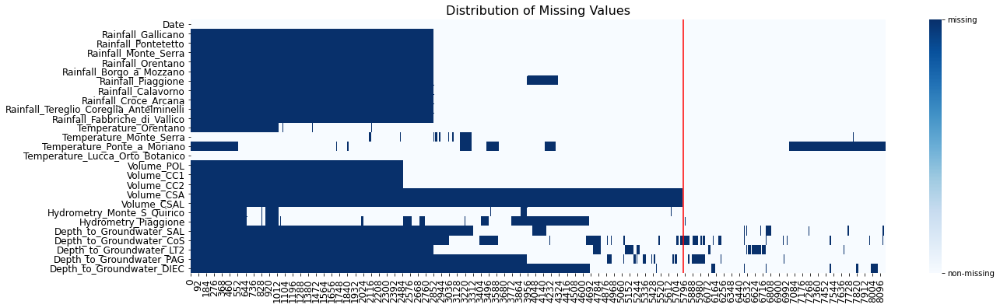

In [8]:
# parameters setting
dataset = 'Aquifer_Auser.csv'
targets = ['Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_LT2'] # orders matter!

# read dataset as DataFrame
dateparse = lambda x: datetime.strptime(x, '%d/%m/%Y')
df = pd.read_csv(os.path.join(datapath, dataset), index_col='Date', parse_dates=['Date'], date_parser=dateparse)

# re-order features
orderlist = ['Rain.*', 'Temp.*', 'Volume.*', 'Hydrom.*', 
             *targets, 'Depth_to_Groundwater_PAG', 'Depth_to_Groundwater_DIEC']
collector = []
for regex in orderlist: 
    collector.append(df.filter(regex=regex).columns)
df = df.reindex(columns= np.concatenate(collector) )

# define frequency and sort accordingly.
df.index.freq = 'd'
df.sort_index(inplace=True)

# Set weird values to nan
## set nan to Groundwater whose values are 0
df[df.filter(regex='Depth_.*').columns] = df.filter(regex='Depth_.*').replace(0, np.nan)
## set nan to Volume whose values are 0
df[df.filter(regex='Volume_.*').columns] = df.filter(regex='Volume_.*').replace(0, np.nan)
## set nan to Temperature whose values are 0
df[df.filter(regex='Temperature_.*').columns] = df.filter(regex='Temperature_.*').replace(0, np.nan)

# visual graph of nan locations for each field
missingval_plot(df, show=False)
plt.axvline(x = 5780, c='r') # 2014-01-01
plt.show()

In [9]:
# Dealing with missing values
## drop old/unuseful data
todrop = df[df.Volume_CSA.isna()].index.max()
df = df[df.index > todrop].copy() # remaining data starts from 2014-01-01

## drop columns (to be further confirmed)
# df.drop(columns=['Temperature_Ponte_a_Moriano', 'Hydrometry_Piaggione'], inplace=True)


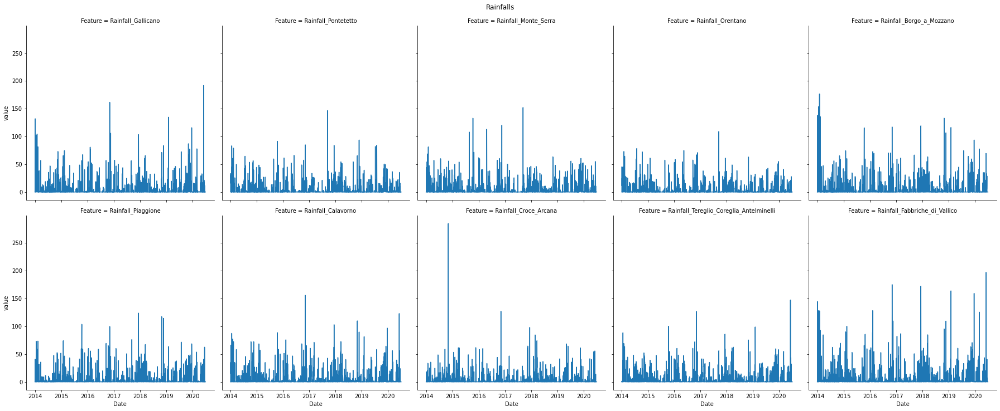

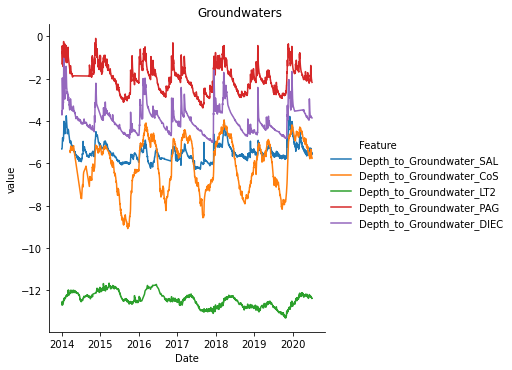

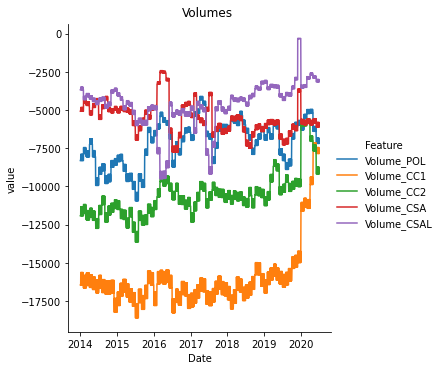

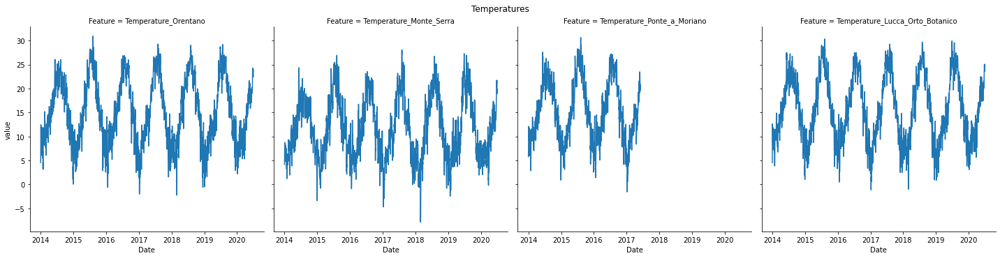

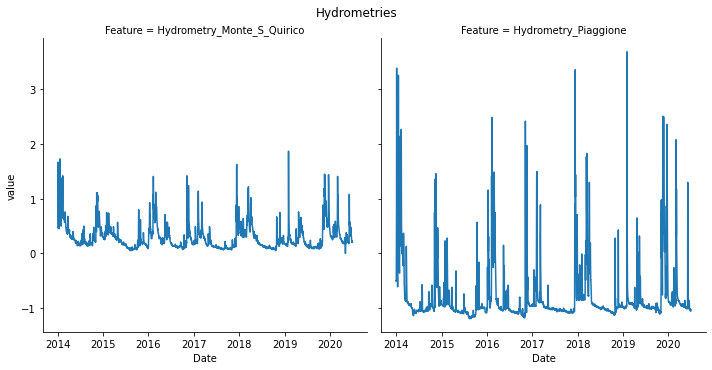

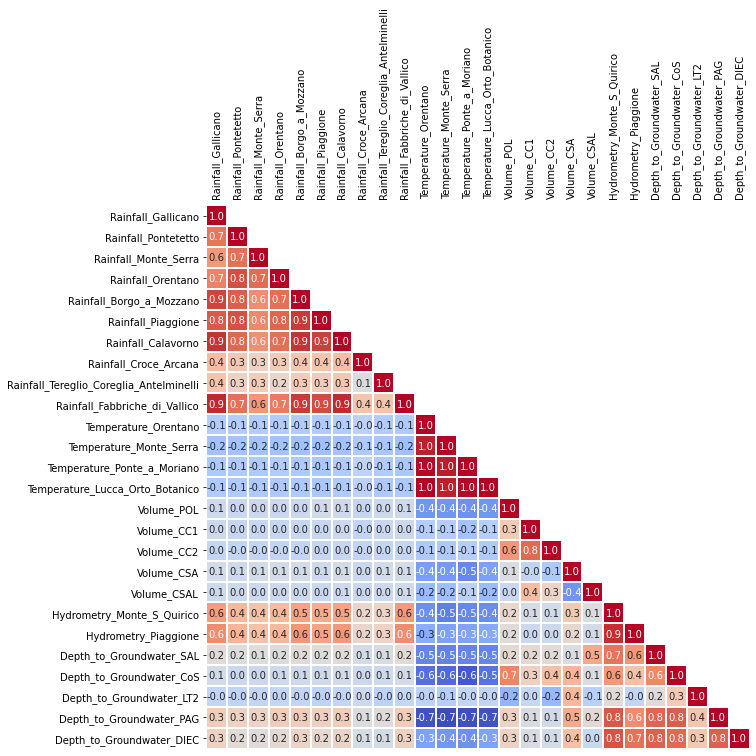

In [10]:
# correlation plot
feature_plots(df)
corrtri_plot(df)

## Auser: Daily VAR

We present the best model here. <br/>
The process to get the best model is: 
1. Conduct analysis on baseline VAR model which includes all features (except the missing Temperature_Ponte_a_Moriano), then pick up the significant features based on OIR plot. 
2. Conduct PCA to further reduce features 
3. make features stationary by first differencing and train the model.

The features we select based on step 1 and 2 are: <br/>
Rainfall:  Tereglio_Coreglia_Antelminelli, Pontetetto, and Monte_serra <br/>
Temperature: Monte_serra <br/>
Volume: POL, CC1, and CSA <br/>
Hydrometry: Monte_S_Quirico <br/>
Groudwater: All except DIEC

As for Granger causality test, none of the selected features fail Granger causality on all three target featres. So do not drop any feature due to Granger.

First differenced features in step 3 are: <br/>
Temperature_Monte_Serra, Volume_POL, Volume_CC1, and Depth_to_Groundwater_LT2

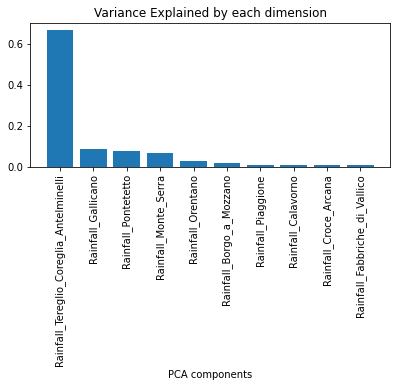

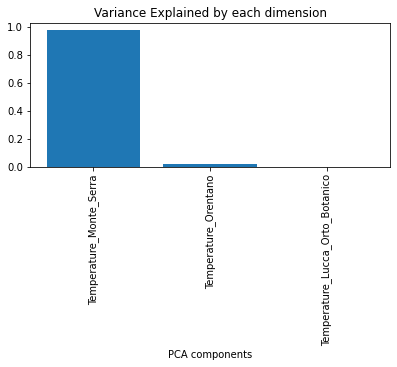

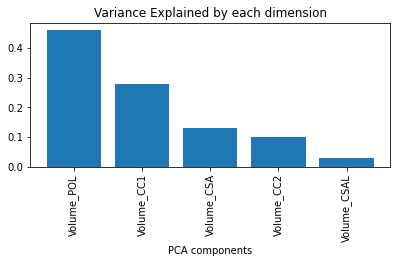

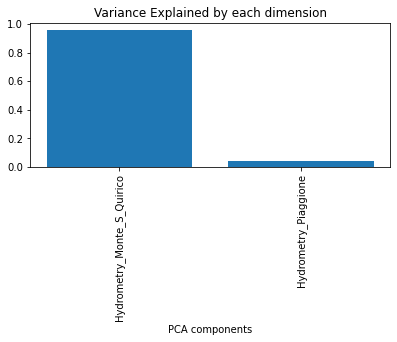

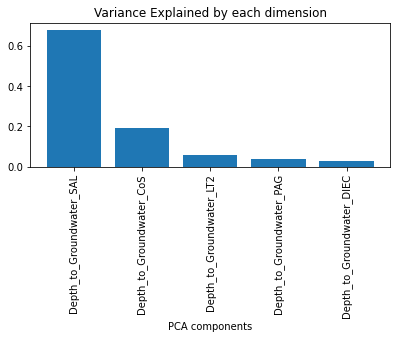

In [11]:
# Feature engineering & imputation
dfimputed = df.copy()
# Record nan positions before imputation
mask = df.isna()

## drop this one with too many missing
dfimputed.drop(columns='Temperature_Ponte_a_Moriano', inplace=True)

## Engineer 1
# dfimputed['Volume_gp1'] = dfimputed[['Volume_POL', 'Volume_CC1', 'Volume_CC2']].mean(axis=1)
# dfimputed['Volume_gp2'] = dfimputed[['Volume_CSA', 'Volume_CSAL']].mean(axis=1)

## imputation
dfimputed = fillna(dfimputed, 'interpolate', method='linear').copy()
## Drop na again for nonimputed observations.
todrop = dfimputed[dfimputed['Depth_to_Groundwater_CoS'].isna()].index.max()
dfimputed = dfimputed[dfimputed.index > todrop].copy()
assert dfimputed.isna().any().any() == False

## Engineer 2: rolling
# tmp = dfimputed.filter(regex='Rain.*').columns
# dfimputed[tmp] = dfimputed[tmp].rolling(30).agg('sum')
# tmp = dfimputed.filter(regex='Vol.*').columns
# dfimputed[tmp] = dfimputed[tmp].rolling(30).agg('mean')
# tmp = dfimputed.filter(regex='Temp.*').columns
# dfimputed[tmp] = dfimputed[tmp].rolling(30).agg('mean')
# tmp = dfimputed.filter(regex='Hydro.*').columns
# dfimputed[tmp] = dfimputed[tmp].rolling(30).agg('mean')
# dfimputed.dropna(inplace=True)


## pca 
tmp = ['Rainfall_Tereglio_Coreglia_Antelminelli', 'Rainfall_Gallicano', 
       'Rainfall_Pontetetto']
tmp.extend(dfimputed.filter(regex='Rain.*').columns.drop(tmp).tolist())
pca_plot(dfimputed[tmp], figsize=(5,2))

pca_plot(dfimputed[['Temperature_Monte_Serra', 'Temperature_Orentano',
                    'Temperature_Lucca_Orto_Botanico']], figsize=(5,2))
tmp = ['Volume_POL', 'Volume_CC1', 
       'Volume_CSA', 'Volume_CC2', 'Volume_CSAL']
pca_plot(dfimputed[tmp], figsize=(5,2))

pca_plot(dfimputed.filter(regex='Hydro.*'), figsize=(5,2))

pca_plot(dfimputed.filter(regex='Depth.*'), figsize=(5,2))

## Dorp due to pca
tmp = ['Rainfall_Tereglio_Coreglia_Antelminelli', 'Rainfall_Pontetetto', 
      'Rainfall_Monte_Serra']
dfimputed.drop(columns=dfimputed.filter(regex='Rain.*').columns.drop(tmp), inplace=True)
dfimputed.drop(columns=['Temperature_Orentano', 'Temperature_Lucca_Orto_Botanico'], inplace=True)
tmp = ['Volume_POL', 'Volume_CC1', 'Volume_CSA']
dfimputed.drop(columns=dfimputed.filter(regex='Vol.*').columns.drop(tmp), inplace=True)
dfimputed.drop(columns='Hydrometry_Piaggione', inplace=True)
dfimputed.drop(columns='Depth_to_Groundwater_DIEC', inplace=True)

## Reorder 
collector = []
for regex in orderlist: # in Sec 2.1.1
    collector.append(dfimputed.filter(regex=regex).columns)
dfimputed = dfimputed.reindex(columns= np.concatenate(collector) )


## so does mask
mask.drop(columns='Temperature_Ponte_a_Moriano')
mask = mask[mask.index > todrop].copy()
# mask['Volume_gp2'] = mask['Volume_gp1'] = False
# mask = mask[29:]
for col in df.columns.drop(dfimputed.columns, errors='ignore'): 
    mask.drop(columns=col, inplace=True)
assert mask.shape == dfimputed.shape, f'mask shape {mask.shape} doesn\'t match dfimputed shape {dfimputed.shape}'
mask = mask.reindex(columns=dfimputed.columns)

In [12]:
# Chekc stationarity
## adftest
adftable = adfuller_table(dfimputed, verbose=False, alpha=0.05, maxlag=15, regression='ct')
# display(adftable)

## collect non-stationary features
I1 = adftable[adftable['AIC_5%level'] == False].index.values
print('Differenced features: ', I1)

Differenced features:  ['Temperature_Monte_Serra' 'Volume_POL' 'Volume_CC1'
 'Depth_to_Groundwater_LT2']


In [13]:
## (Cont'd) take diff() on cols that do not pass the adftest. Here we adopt AIC.
dfstationary = dfimputed.copy()
dfstationary.loc[:,I1] = dfstationary[I1].diff()
dfstationary.dropna(inplace=True)

## adftest again
adftable = adfuller_table(dfstationary, verbose=False, maxlag=15, regression='ct')
# display(adftable) # This time all features pass ADF test in both AIC and BIC criteria.

In [14]:
# Check granger causality
grtable = grangers_causation_table(dfstationary, xnames=dfimputed.columns.drop(labels=targets), 
                          ynames=targets, maxlag=14 ,alpha=0.05)
display(grtable)

## Manually drop non Granger-cause variables
# tmp = ['Volume_gp1', 'Volume_gp2']
# dfstationary.drop(columns=tmp, inplace=True)
# mask.drop(columns=tmp, inplace=True)

,Depth_to_Groundwater_SAL_y,Depth_to_Groundwater_CoS_y,Depth_to_Groundwater_LT2_y
Granger Causation Table alpha=0.05,,,
Rainfall_Pontetetto_x,True,True,True
Rainfall_Monte_Serra_x,True,True,True
Rainfall_Tereglio_Coreglia_Antelminelli_x,True,True,True
Temperature_Monte_Serra_x,False,True,True
Volume_POL_x,False,True,False
Volume_CC1_x,True,True,False
Volume_CSA_x,False,True,False
Hydrometry_Monte_S_Quirico_x,True,True,True
Depth_to_Groundwater_PAG_x,False,True,True


We add `year_sin & year_cos` feature in to check if model can learn better pattern to predict targets. Models that don't include this feature are also reported at the end of this section. 

The best model passes the Durbin Watson Test, meaning that there is no significant serial correlation in residual of each feature. However, it doesn't pass the Portmanteau test, indicating that residual autocorrelatios exists somewhere whit the first 35 lags. It either means that noises are large or the true relationship between features is non-linear. Later we also provide LSTM to check performance.

Failing to pass normality test means that asymptotic standard errors are no longer valid and bootstrapping method such as Efron's or Hall's confidence interval should be used instead when checking impulse response.

In [15]:
# Deal with Time Periodicity 
year = 365.2425
dfstationary['year_sin'] = np.sin(dfstationary.index.dayofyear * 2 * np.pi / year)
dfstationary['year_cos'] = np.cos(dfstationary.index.dayofyear * 2 * np.pi / year)
mask['year_sin'] = False
mask['year_cos'] = False

In [16]:
# Split data
N = dfstationary.shape[0]
train, val, test = dfstationary[:int(0.8*N)], dfstationary[int(0.8*N):int(0.9*N)], dfstationary[int(0.9*N):]
_, vmask, tmask = mask[:int(0.8*N)], mask[int(0.8*N):int(0.9*N)], mask[int(0.9*N):]
column_indices = {name: i for i, name in enumerate(train.columns)}
targets_indices = [column_indices[ta] for ta in targets]

# Scaling and Normalization 
scaler, train_scaled, val_scaled, test_scaled = scale(train, val, test, approach='MinMax')
print('train/val/test shapes:', train_scaled.shape, val_scaled.shape, test_scaled.shape)

train/val/test shapes: (1835, 14) (229, 14) (230, 14)


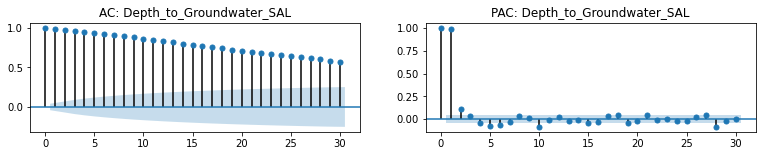

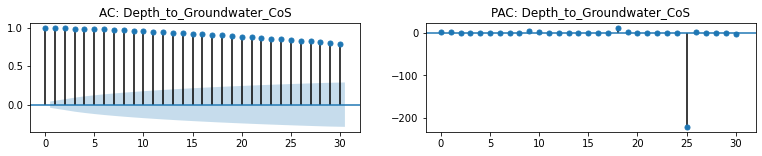

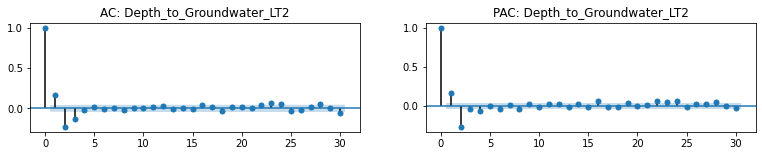

In [17]:
# Get sense: ac & pac plots
acpac_plot(dfstationary[targets], figsize=(13, 2))

In [18]:
# VAR model 
var_model = VAR(endog=train.append(val))
res = var_model.select_order(maxlags=33, trend='c')
print(res.selected_orders)
varlag = res.selected_orders['aic']
var_model = var_model.fit(varlag)
# put result into self-defined class
varobj = VARresults(var_model, test, mask=tmask[1:] , label_columns=targets) #[1:]
print('The model we are using: {1:}-dim VAR({0:}).'.format(*varobj.model.coefs.shape[:2]))

{'aic': 7, 'bic': 2, 'hqic': 7, 'fpe': 7}
The model we are using: 14-dim VAR(7).


In [19]:
# Durbin_watson test of residuals
print('Durbin-Watson test:')
_ = varobj.durbin_watson_test()

Durbin-Watson test:
Rainfall_Pontetetto             :   2.00
Rainfall_Monte_Serra            :   2.00
Rainfall_Tereglio_Coreglia_Antelminelli:   2.00
Temperature_Monte_Serra         :   2.00
Volume_POL                      :   1.97
Volume_CC1                      :   1.85
Volume_CSA                      :   1.99
Hydrometry_Monte_S_Quirico      :   2.01
Depth_to_Groundwater_SAL        :   2.00
Depth_to_Groundwater_CoS        :   2.00
Depth_to_Groundwater_LT2        :   1.99
Depth_to_Groundwater_PAG        :   2.01
year_sin                        :   2.00
year_cos                        :   2.00


Test statistic,Critical value,p-value,df
6764.,5661.,0.000,5488


Test statistic,Critical value,p-value,df
9.744e+07,41.34,0.000,28


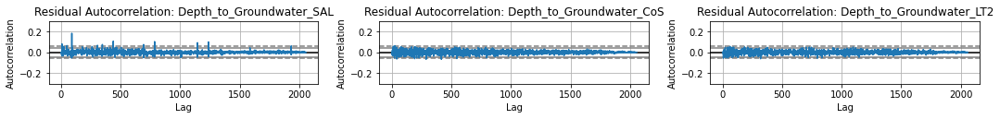

In [20]:
# Adjusted Portmannteau-test & S-K test
display(var_model.test_whiteness(nlags=varlag*5, signif=0.05, adjusted=True).summary())
display(varobj.model.test_normality().summary())
# Residual Autocorrelations
varobj.residac_plot(cols=targets, figsize=(15,3))

As shown in the following, the model perform well on 1D, last 7D, and last 14D predictions: the prediction pattern looks similar to the ground truth data. Looking at the individual rmse/mae measures (shown in titles of graphs), the main errors comes from the prediction on *Depth_to_Groundwater_SAL*. We believe that our model learn necessary info to do make the predictions. So we move on to OIR/FEVD analysis.


uniform rmse :   0.0516
uniform mae:   0.0374


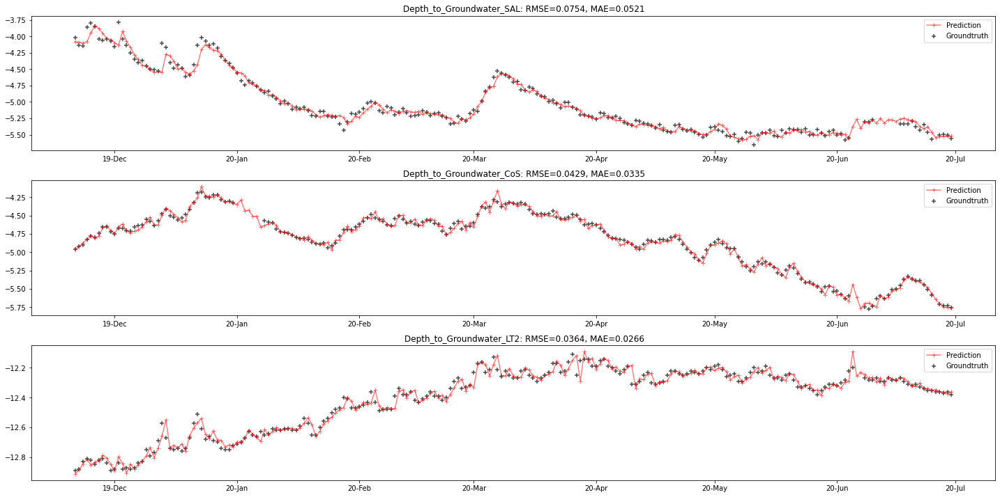

In [21]:
# 1-step-ahead Prediction
## paramters setting:
steps=1
mode = 'normal'
use_mask = True
multioutput = 'raw_values' 

## after trransformation
rmse, mae = varobj.inverse_transform_evaluate(
    I1, dfimputed, steps=steps, mode=mode, multioutput=multioutput, use_mask=use_mask)
print('uniform rmse : {:8.4f}'.format(rmse.mean()))
print('uniform mae: {:8.4f}'.format(mae.mean()))

## plot
varobj.plot(use_mask=True, figsize=(20, 10))

uniform rmse with 7 step:   0.0709
uniform mae with 7 step:   0.0673


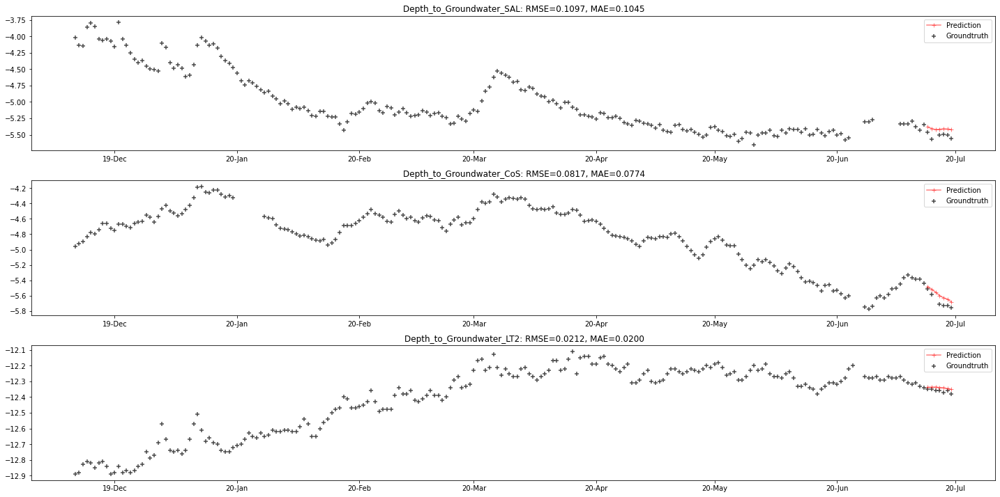

uniform rmse with 14 step:   0.1011
uniform mae with 14 step:   0.0919


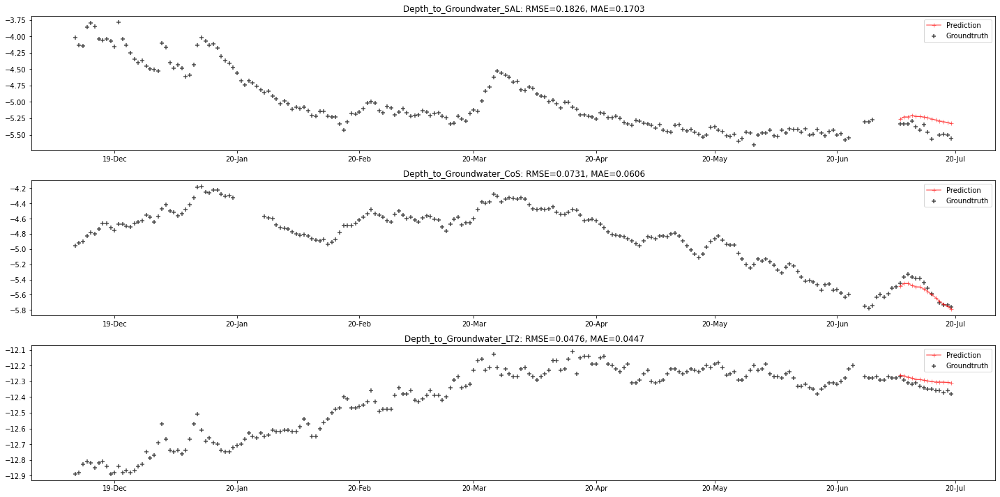

In [22]:
# Last Prediction
## paramters setting:

steps=[7, 14]
mode = 'last'
use_mask = True
multioutput = 'raw_values' 

for step in steps: 
    ## prediction
    rmse, mae = varobj.inverse_transform_evaluate(I1, dfimputed,steps=step, mode=mode, 
                                                  multioutput=multioutput, use_mask=use_mask)
    print('uniform rmse with {:>} step: {:8.4f}'.format(step, rmse.mean() ))
    print('uniform mae with {:>} step: {:8.4f}'.format(step, mae.mean() ))
    ## plot
    varobj.plot(use_mask=use_mask, figsize=(20, 10))

Since forecast error impulse response (FEIR) only analyzes shock occuring in one variable at a time, contemporaneous correlation of error terms cannot be captured by it. We then use orthogonalized impulse response (OIR) to solve this issue, which rely on stronger assumption and thus the order of features in model matters. Besides, the Hall's confidence interval is used since it usually has bias corrected effect compared to Efron.

The feature order we choose is **Rainfall $\rightarrow$ Temperature $\rightarrow$ Volumes $\rightarrow$ Hydrometries $\rightarrow$ Depth_to_Groundwaters**. 

Actually, the order between rainfall and temperature can be reversed since they affect each other. Depth_to_Groundwaters is put at the end because we want to see how the other features affect the targets. Volumes (the amount taken from the dinking water treatment plant) clearly affects Hydrometries, so volumes are put before hydrometries.

The meaning of OIR is to see whether one standard deviation shock to x causes significant (increase/decrease standard deviation) response in y for m periods. Symbols mean the response direction.

For target feature Depth_to_Groundwater_SAL: 
 - Rainfall_Pontetetto(+), Rainfall_Tereglio_Coreglia_Antelminelli(+), Volume_CSA(-), Hydrometry_Monte_S_Quirico(+), 
Depth_to_Groundwater_PAG(+)

For target feature Depth_to_Groundwater_CoS:
 - Rainfall_Pontetetto(+), Rainfall_Monte_Serra(+), Rainfall_Tereglio_Coreglia_Antelminellim(+)
Volume_POL(+), 

For target feature Depth_to_Groundwater_LT2:
 - Rainfall_Tereglio_Coreglia_Antelminelli(+-), Depth_to_Groundwater_CoS(+)
 
Generally, the symbol directions make sense (except the Rainfall_Tereglio_Coreglia_Antelminelli for the final feature): A positive shock to rainfall adds water to aquifer; A positive shock to volume (meaning less water taken from drinking water plant since volume is itself negative) leaves more water in aquifer; a positive shock to hydrometry means also a positive response to groundwater.

OIR for Depth_to_Groundwater_SAL


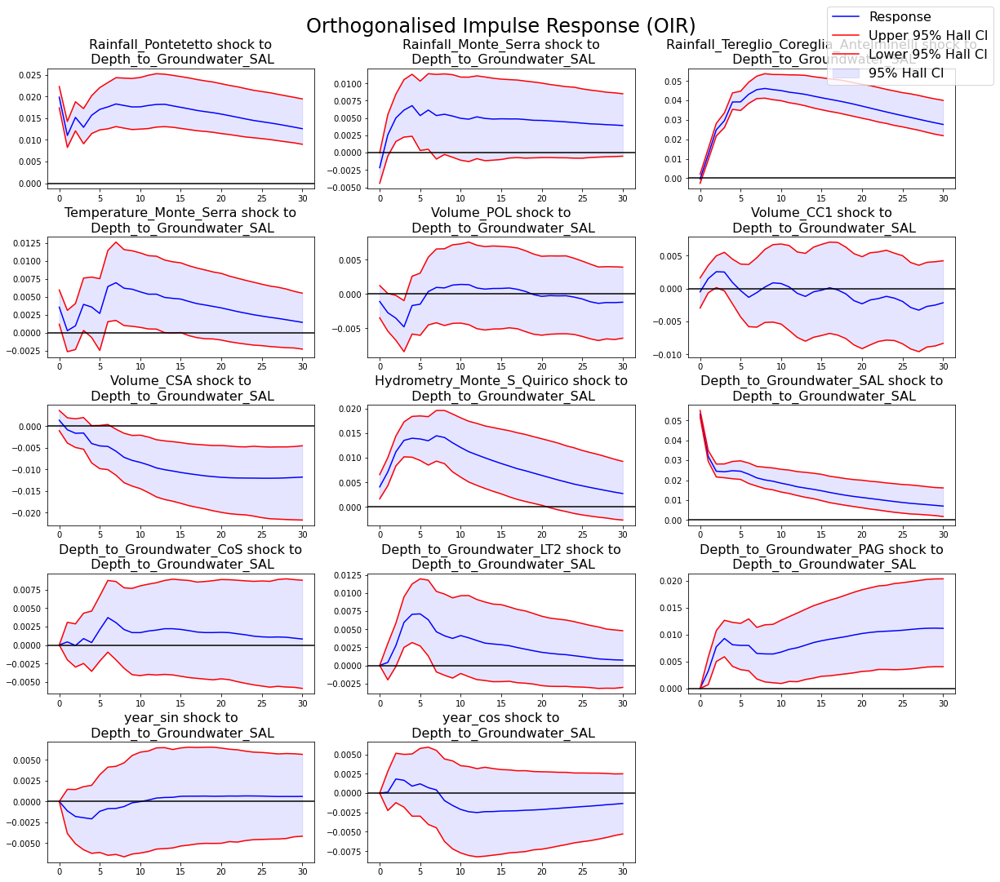

In [23]:
# OIR Plot Analysis
print('OIR for {}'.format(targets[0]))
varobj.irplot(impulse=train.columns, periods=30, response=targets[0], orth=True,
             figsize=(17,15), method='hall')

OIR for Depth_to_Groundwater_CoS


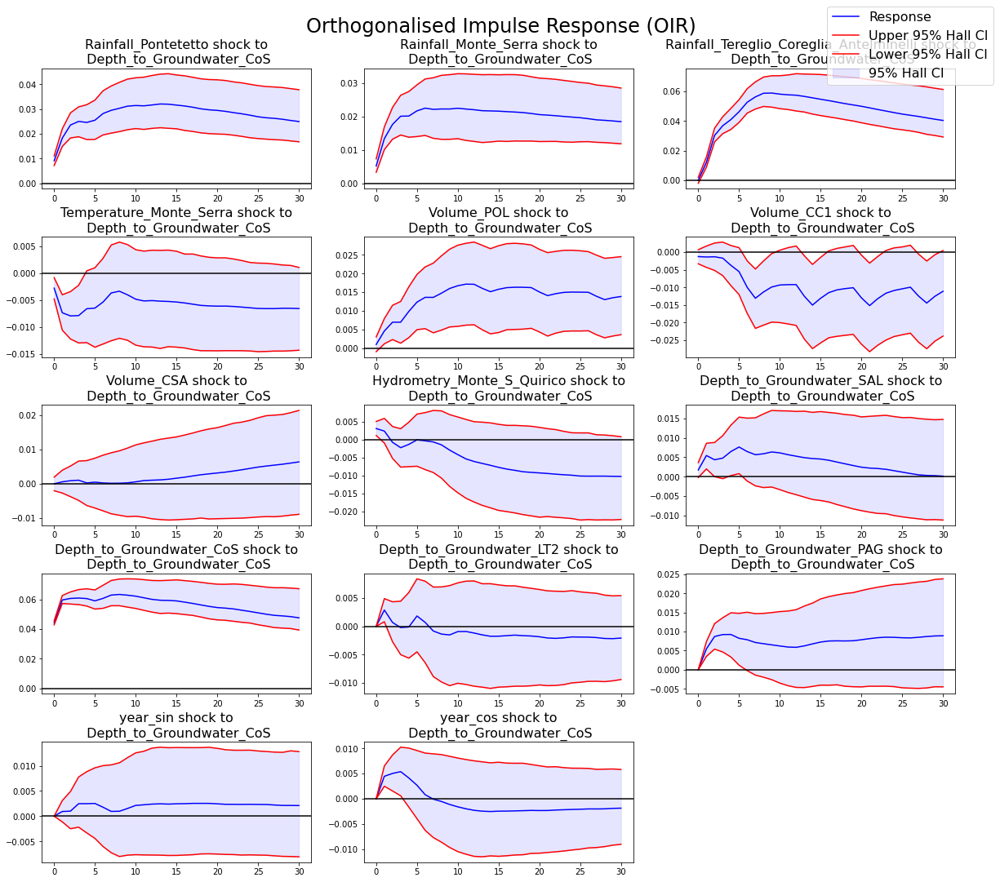

In [24]:
# OIR Plot Analysis
print('OIR for {}'.format(targets[1]))
varobj.irplot(impulse=train.columns, periods=30, response=targets[1], orth=True,
             figsize=(17,15), method='hall')

OIR for Depth_to_Groundwater_LT2


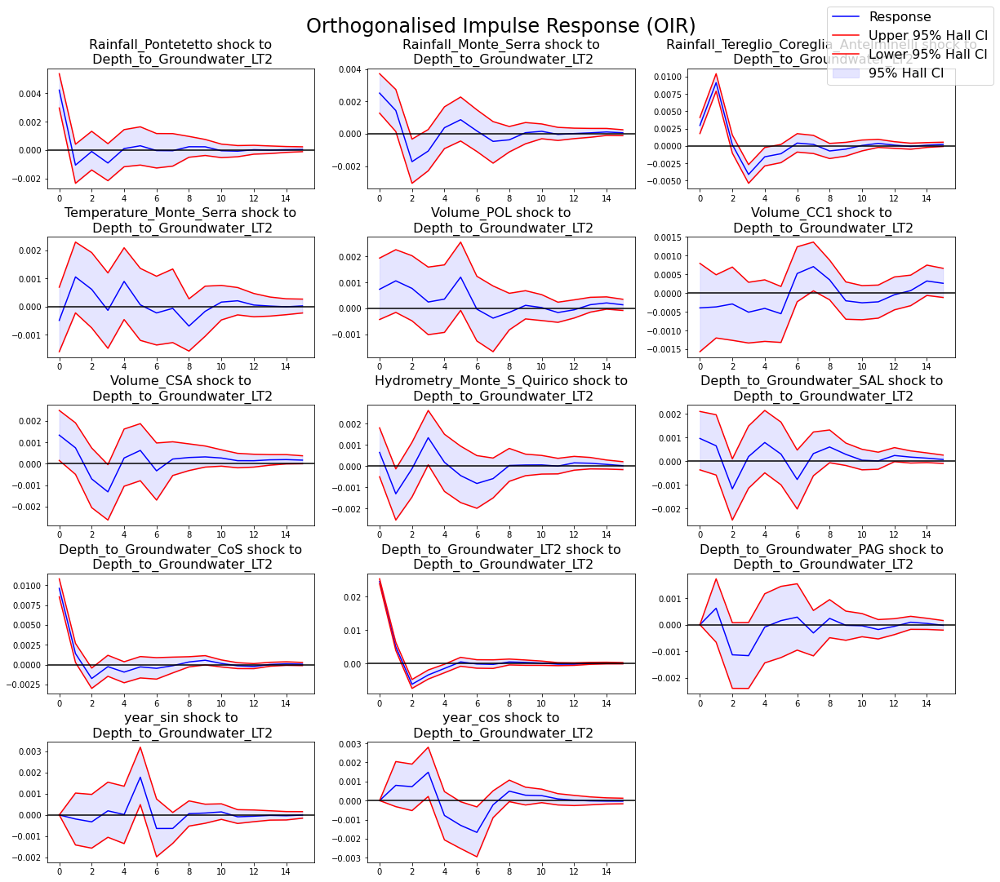

In [25]:
# OIR Plot Analysis
print('OIR for {}'.format(targets[2]))
varobj.irplot(impulse=train.columns, periods=15, response=targets[2], orth=True,
             figsize=(17,15), method='hall')

The FEVD plot is shown below. It illustrates which (orthogonised) feature shocks contribute to the error variance of our target features in different lags. 

The top important features are: <br/>
Depth_to_Groundwater_SAL: 
 - Rainfall_Tereglio_Coreglia_Antelmineli, Rainfall_Pontetetto, Hydrometry_Monte_S_Quirico (accounts for >30% after lag 2)
 
Depth_to_Groundwater_CoS:
 - Rainfall_Tereglio_Coreglia_Antelmineli, Rainfall_Pontetetto, Rainfall_Monte_Serra (accounts for >30% after lag 2)
 
Depth_to_Groundwater_LT2: 
 - Rainfall_Tereglio_Coreglia_Antelmineli, Depth_to_Groundwater_CoS, Rainfall_Pontetetto, Rainfall_Monte_Serra (accounts for >25% after lag 2)


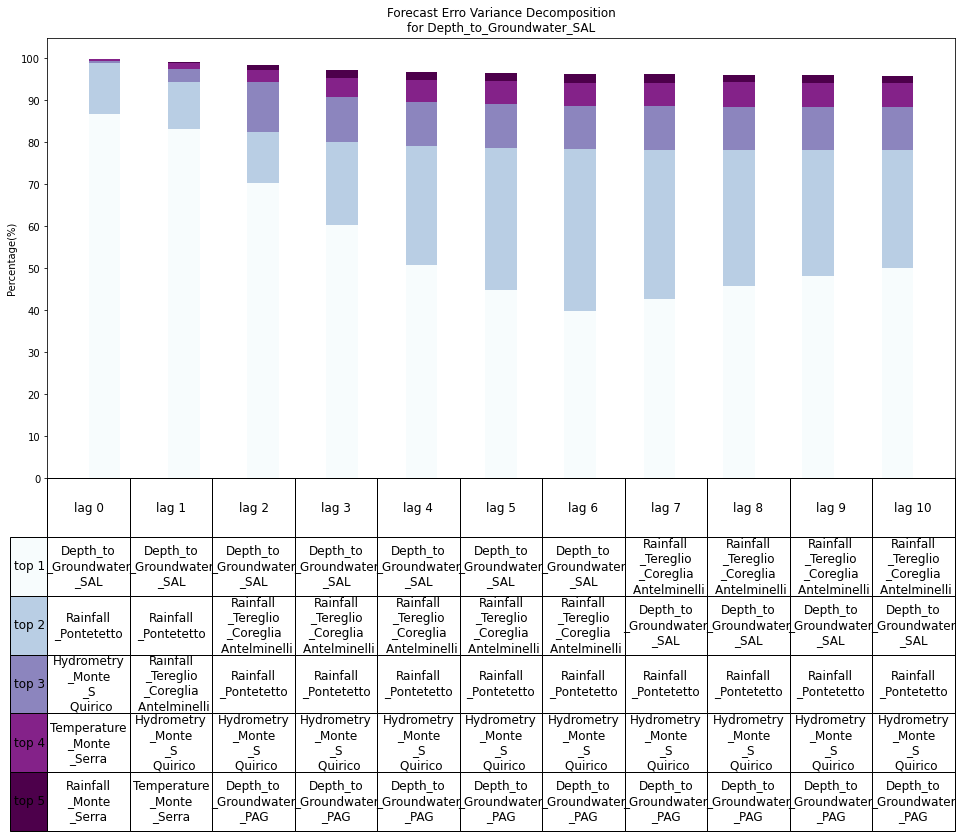

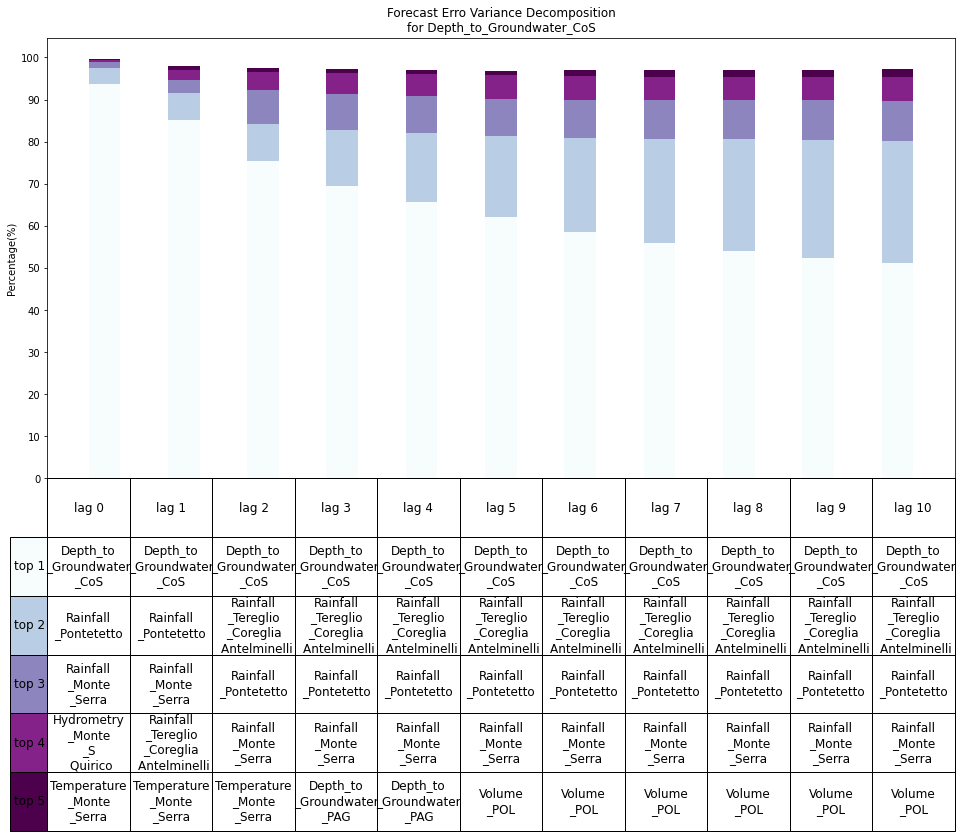

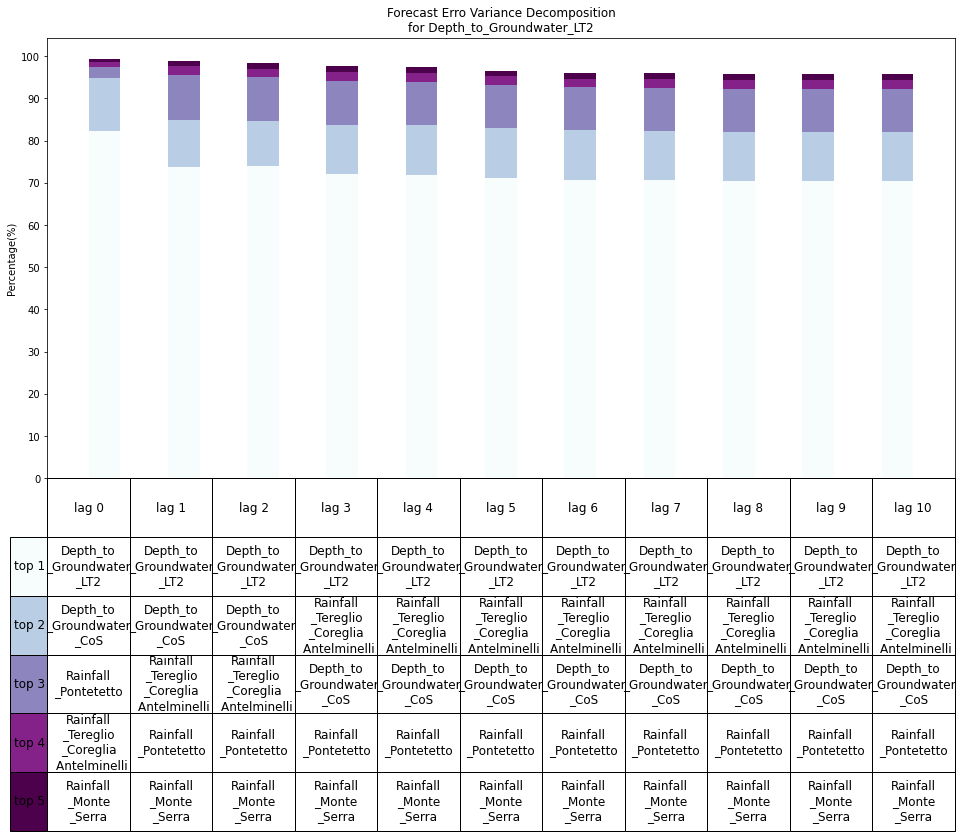

In [26]:
# FEVD Plot Analysis 
varobj.fevd_plot(periods=11, top=5, figsize=(14, 9), max_str_split=3) 
# put smaller periods or tune-up max_str_split(max=3) if texts overlap.

We've implemented various setting of model and find that **model No. 5 and 9 performs the best** on 1D and 7D/14D , respectively.

1. Selected features presented as far (ie, features listed in No.5) are indeed important features for the model to perform the best. (better than put everything inside, ie., baseline model.)
2. The setting of grouping volumes in No. 6 performs nearly best compared to No. 5.
3. Based on No. 6 but smooth features via rolling mean of 30 days can improve long term (7D/14D) predictions a lot, as shown in No. 9.

Since VAR model is linear and thus can only capture local linear prediction, we present LSTM as well trying to capture the possible non-linear relationship between target and features in the following.

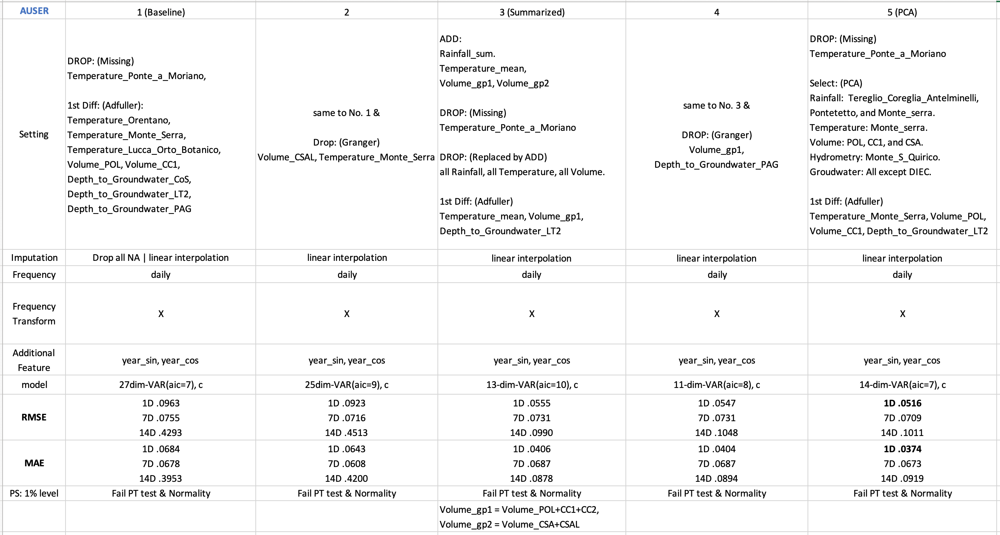

In [22]:
Image("/Users/mbpr/GitHub/Acea-Smart-Water-Analytics/image/auser1.png")

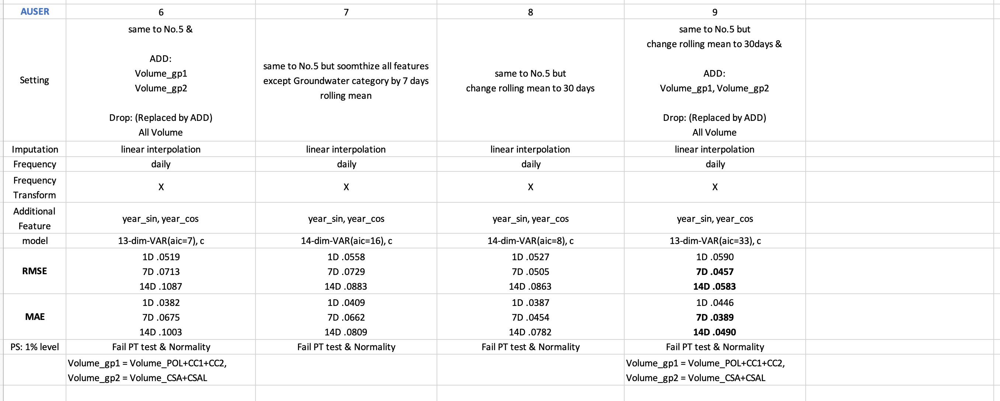

In [23]:
Image("/Users/mbpr/GitHub/Acea-Smart-Water-Analytics/image/auser2.png")

## Auser: Daily LSTM

LSTM model doesn't require data to be stationary but better scaled since tanh() is used by LSTM. We then use `MinMaxScaler()` to scale data into $[-1,1]$. One can also use alternative scaler such as `StandardScaler()` by simply changing the `approach='Standard'` in the scale function. `year_sin` is NOT included based on previous discussions in the VAR part.

Here we use the same lag as VAR to train the LSTM in order for 1D prediction performance comparison. The model can thus be futher fine tuned based on different lags together with other parameters, which we will omit here (by fixing lag=varlag) and focus only on the feature importance learned by the LSTM.

We didn't implement the LSTM model that predicts 7D/14D in a row since it's intuitive to directly predict on target features instead of predicting on all features and then feed the prediction to the model again, which is like the behaviour of VAR model.

Notice: due to the large lag(=7), the training/val/test sample sizes are small. Machine learning models usually require a huge amount of samples and thus may not perform well on small samples. Our goal here is to explore the important features to LSTM via the sensitivity analysis.

In [27]:
# Feature engineering & imputation
dfimputed = df.copy()
# Record nan positions before imputation
mask = df.isna()

## drop this one with too many missing
dfimputed.drop(columns='Temperature_Ponte_a_Moriano', inplace=True)

## Engineer 1
# dfimputed['Volume_gp1'] = dfimputed[['Volume_POL', 'Volume_CC1', 'Volume_CC2']].mean(axis=1)
# dfimputed['Volume_gp2'] = dfimputed[['Volume_CSA', 'Volume_CSAL']].mean(axis=1)

## imputation
dfimputed = fillna(dfimputed, 'interpolate', method='linear').copy()
## Drop na again for nonimputed observations.
todrop = dfimputed[dfimputed['Depth_to_Groundwater_CoS'].isna()].index.max()
dfimputed = dfimputed[dfimputed.index > todrop].copy()
assert dfimputed.isna().any().any() == False

## Engineer 2: rolling
# tmp = dfimputed.filter(regex='Rain.*').columns
# dfimputed[tmp] = dfimputed[tmp].rolling(30).agg('sum')
# tmp = dfimputed.filter(regex='Vol.*').columns
# dfimputed[tmp] = dfimputed[tmp].rolling(30).agg('mean')
# tmp = dfimputed.filter(regex='Temp.*').columns
# dfimputed[tmp] = dfimputed[tmp].rolling(30).agg('mean')
# tmp = dfimputed.filter(regex='Hydro.*').columns
# dfimputed[tmp] = dfimputed[tmp].rolling(30).agg('mean')
# dfimputed.dropna(inplace=True)

## pca 
# tmp = ['Rainfall_Tereglio_Coreglia_Antelminelli', 'Rainfall_Gallicano', 
#        'Rainfall_Pontetetto']
# tmp.extend(dfimputed.filter(regex='Rain.*').columns.drop(tmp).tolist())
# pca_plot(dfimputed[tmp], figsize=(5,2))
# pca_plot(dfimputed[['Temperature_Monte_Serra', 'Temperature_Orentano',
#                     'Temperature_Lucca_Orto_Botanico']], figsize=(5,2))
# tmp = ['Volume_POL', 'Volume_CC1', 
#        'Volume_CSA', 'Volume_CC2', 'Volume_CSAL']
# pca_plot(dfimputed[tmp], figsize=(5,2))
# pca_plot(dfimputed.filter(regex='Hydro.*'), figsize=(5,2))
# pca_plot(dfimputed.filter(regex='Depth.*'), figsize=(5,2))

## Dorp due to pca
tmp = ['Rainfall_Tereglio_Coreglia_Antelminelli', 'Rainfall_Pontetetto', 
      'Rainfall_Monte_Serra']
dfimputed.drop(columns=dfimputed.filter(regex='Rain.*').columns.drop(tmp), inplace=True)
dfimputed.drop(columns=['Temperature_Orentano', 'Temperature_Lucca_Orto_Botanico'], inplace=True)
tmp = ['Volume_POL', 'Volume_CC1', 'Volume_CSA']
dfimputed.drop(columns=dfimputed.filter(regex='Vol.*').columns.drop(tmp), inplace=True)
dfimputed.drop(columns='Hydrometry_Piaggione', inplace=True)
dfimputed.drop(columns='Depth_to_Groundwater_DIEC', inplace=True)

## Reorder 
collector = []
for regex in orderlist: # in Sec 2.1.1
    collector.append(dfimputed.filter(regex=regex).columns)
dfimputed = dfimputed.reindex(columns= np.concatenate(collector) )


## so does mask
mask.drop(columns='Temperature_Ponte_a_Moriano')
mask = mask[mask.index > todrop].copy()
# mask['Volume_gp2'] = mask['Volume_gp1'] = False
# mask = mask[29:]
for col in df.columns.drop(dfimputed.columns, errors='ignore'): 
    mask.drop(columns=col, inplace=True)
assert mask.shape == dfimputed.shape, f'mask shape {mask.shape} doesn\'t match dfimputed shape {dfimputed.shape}'
mask = mask.reindex(columns=dfimputed.columns)

In [28]:
# Split data
N = dfimputed.shape[0]
train, val, test = dfimputed[:int(0.8*N)], dfimputed[int(0.8*N):int(0.9*N)], dfimputed[int(0.9*N):]
_, vmask, tmask = mask[:int(0.8*N)], mask[int(0.8*N):int(0.9*N)], mask[int(0.9*N):]
column_indices = {name: i for i, name in enumerate(train.columns)}
targets_indices = [column_indices[ta] for ta in [targets[0]]]

# Scaling and Normalization 
# normalization won't make sense if the TS is trending upward/downward. This is why stationary first.
scaler, train_scaled, val_scaled, test_scaled = scale(train, val, test, approach='MinMax')
print('train/val/test shapes:', train_scaled.shape, val_scaled.shape, test_scaled.shape)

train/val/test shapes: (1836, 12) (229, 12) (230, 12)


In [29]:
# Initialize data loader: 1-step-ahead prediction
## parameters setting
input_width = varlag     # suggested by VAR
label_width = 1       
shift = 1
batch_size = 4

## generate window
window = WindowGenerator(input_width, label_width, shift, train_scaled, val_scaled, test_scaled, 
                         batch_size=batch_size, shuffle=False, mask=tmask, 
                         label_columns=targets)
print(window)
print('Inputs/labels shapes of window: {} {}'.format(
    window.example[0].shape, window.example[1].shape))

Total window size: 8
Input indices: [0 1 2 3 4 5 6]
Label indices: [7]
shuffle: False
Label column name(s): ['Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_LT2']
Inputs/labels shapes of window: (4, 7, 12) (4, 1, 3)


evaluation before scaling back:
56/56 - 0s - loss: 0.0230 - root_mean_squared_error: 0.1516 - mean_absolute_error: 0.1129
evaluation after scaling back: root_mean_squared_error: 0.2089 - mean_absolute_error: 0.1640


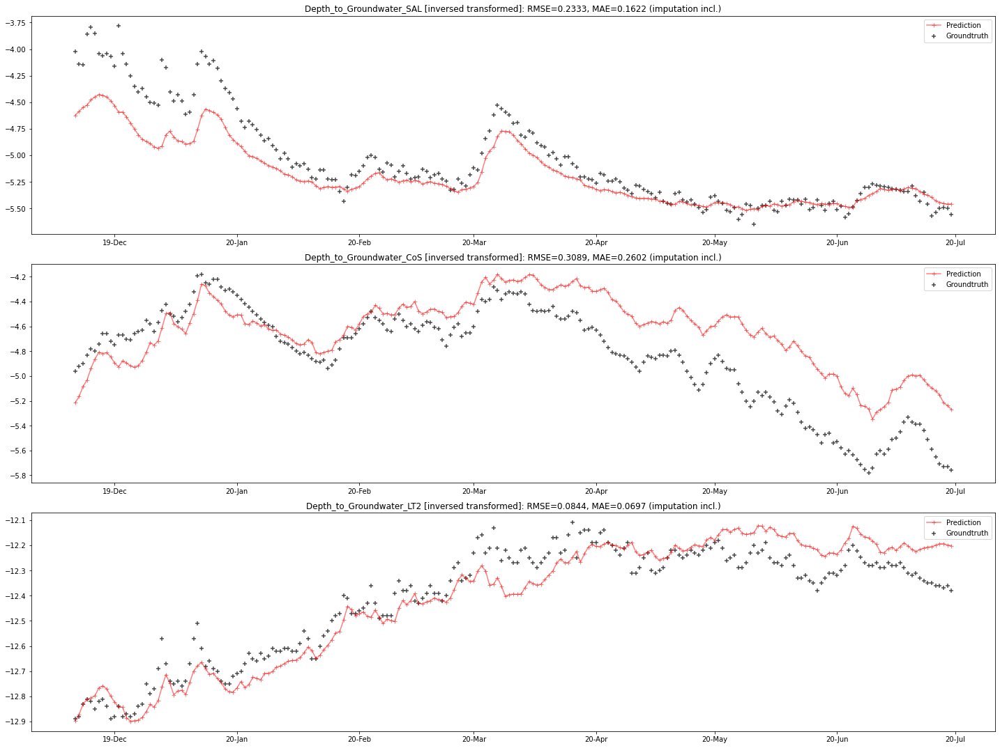

In [30]:
# 1-step-ahead LSTM prediction

lstm_model = None
if os.path.isfile(os.path.join(modelpath, 'auser.keras')):
    lstm_model = tf.keras.models.load_model( os.path.join(modelpath, 'auser.keras'))
else: 
    ## Parameters setting:
    MAX_EPOCHS = 100
    patience = 10        # stop training if loss increase for 'patience' periods in total.
    lr_rate = 1e-3
    train_verbose = 0    # 0: no output, 1: progress, 2: report
    lstm_kernel = 16
    stateful = False     # batchsize must be 1 if True. (takes 10 mins)
    dropout = 0.2        # dropout rate in [0,1]
    
    ## fixed setting
    n_features = train_scaled.shape[1]
    n_out = len(targets)
    OUT_STEPS = window.label_width
    ## RNN: LSTM
    lstm_model = tf.keras.Sequential([
        # Shape [batch, time, features] => [batch, lstm_units]
        tf.keras.layers.LSTM(lstm_kernel, return_sequences=True, stateful=stateful),
        tf.keras.layers.Dropout(dropout),
        tf.keras.layers.LSTM(int(lstm_kernel/2), return_sequences=False, stateful=stateful),
        # Shape => [batch, out_steps*features]
        tf.keras.layers.Dropout(dropout),
        tf.keras.layers.Dense(OUT_STEPS*n_out),
        # Shape => [batch, out_steps, features]
        tf.keras.layers.Reshape([OUT_STEPS, n_out])
    ])
    ## compile and fit
    print('window RNN')
    print('Xtrain shape: ', window.example[0].shape, 'ytrain shape: ', window.example[1].shape, end='')
    print('\toutput shape: ', lstm_model(window.example[0]).shape, end='\n\n')
    history = compile_and_fit(lstm_model, window, MAX_EPOCHS, patience, lr_rate, verbose=train_verbose)
    ## save model
    lstm_model.save(os.path.join(modelpath, 'auser.keras'), overwrite=False)
    
## evaluate on test
print('evaluation before scaling back:')
lstm_model.evaluate(window.test, verbose=2, return_dict=True)
#window.plot(lstm_model, use_mask=True)

## inverse_transform_evaluate on test
di = window.inverse_transform_evaluate(lstm_model, scaler, which='test', return_dict=True)
print('evaluation after scaling back: {0}: {2:6.4f} - {1}: {3:6.4f}'.format(*di.keys(), *di.values()))
window.plot(use_mask=False, figsize=(20, 15))

Compared to VAR model, our LSTM doesn't perform well (even though the rmse/mae for LSTM includes imputed observations while VAR has masked them). One can fine tune the model to achieve better results (here we fix the lag in order for consistency with VAR model). We instead put efforts on explaining feature importance for LSTM.

We use the sensitivity analysis to determine the feature importance, that is, when perturbing a particular feature based on testing data, given the values of the other feature unchanged, how much will rmse change by comparing the prediction before and after perturbation. A feature is more important if the larger the rmse is.

In the figure below we find that, besides the target features themselves, **Hydrometry_Monte_S_Quirico and Rainfall_Tereglio_Coreglia_Antelminelli** are most important features to LSTM. The other features are sub-important. We summarize the comparison of important features in the next section.

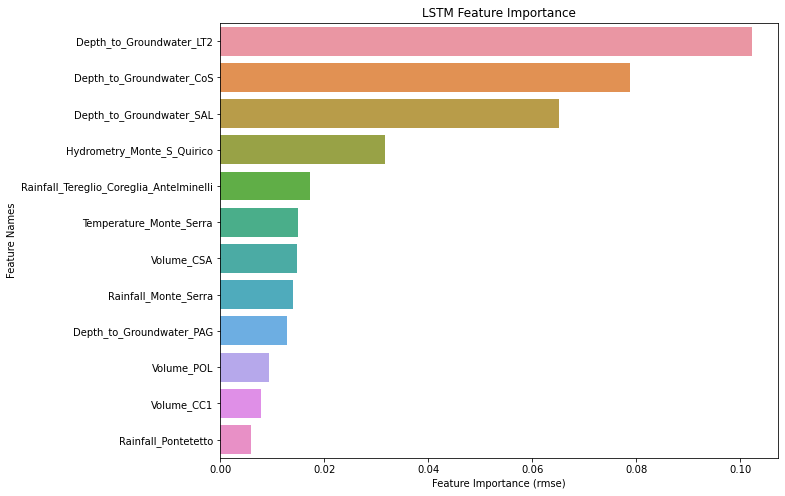

In [31]:
# LSTM feature importance plot
importance, direction = feature_importance(lstm_model, window.X_test, scale=0.2, method='const')
feature_importance_plot(importance, names=train_scaled.columns) 

## Summary

We summarize here what we've gotten from the above analysis <br/>
Target feature: Depth_to_Groundwater_SAL, Depth_to_Groundwater_CoS, Depth_to_Groundwater_LT2 <br/>
Testing size: 230.

Most important Features: <br/>
From the VAR model: 1D/7D/14D RMSE - .0516/.0457/.0583 (inverse transformd)
 - For SAL: Rainfall_Tereglio_Coreglia_Antelmineli, Rainfall_Pontetetto, Hydrometry_Monte_S_Quirico, Volume_CSA, Depth_to_Groundwater_PAG
 - For CoS: Rainfall_Pontetetto, Rainfall_Monte_Serra, Rainfall_Tereglio_Coreglia_Antelmineli, Volume_POL
 - For LT2: Rainfall_Tereglio_Coreglia_Antelminelli, Depth_to_Groundwater_CoS, Rainfall_Pontetetto, Rainfall_Monte_Serra

From the LSTM model: 1D RMSE - 0.2089 (inverse transformed and includes imputed values)
 - (Depth_to_Groundwater_SAL, Depth_to_Groundwater_CoS, Depth_to_Groundwater_LT2),
 - Hydrometry_Monte_S_Quirico, Rainfall_Tereglio_Coreglia_Antelminelli

Common important features: 
 - For SAL: Hydrometry_Monte_S_Quirico, Rainfall_Tereglio_Coreglia_Antelminelli
 - For CoS: Rainfall_Tereglio_Coreglia_Antelminelli
 - For LT2: Rainfall_Tereglio_Coreglia_Antelminelli

# Aquifer Doganella

## Data Cleansing

The Aquifer Doganella dataset contains large missing values for various features: 
 - Rainfall: missing in 2015-2018
 - Temperature: missing in 2015-2018
 - Volume: missing from past to 2016-10-07
 - Groundwater: missing from past to 2015-06-01

We firstly impute data in 2015-2018 and then select observations after 2016-10-07 due to mass missing in the past.<br/> 
The imputation on Rainfalls and Temperatures uses past 4 years as a rolling window to caculate the mean value of the same date. So 365(366) days are calculated and imputed to the target year. The target year is looped over 2015-2018. <br/>
As for imputation on volumes and groundwaters, we simply use linear interpolation since the missing patterns are not complicated. <br/>
Finally, all data before 2016-10-07 are dropped due to mass missing. 

We will omit the pairwise correlation plot of features and directly move on to prediction and OIR/FEVD part since it's complicated to get insight of all nine target features.

Mask on missing/imputed data is used in order to get more accurate rmse/mae performance of models.

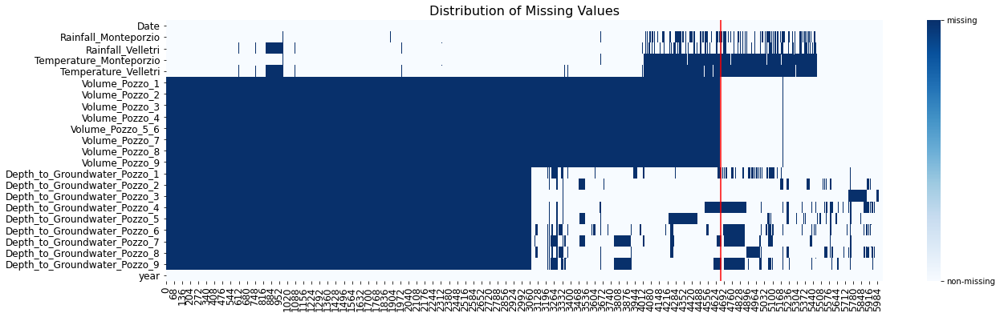

In [32]:
# parameters setting
dataset = 'Aquifer_Doganella.csv'
targets = []
for i in range(9):
    targets.append('Depth_to_Groundwater_Pozzo_%i' %(i+1))

# read dataset as DataFrame
dateparse = lambda x: datetime.strptime(x, '%d/%m/%Y')
df = pd.read_csv(os.path.join(datapath, dataset), index_col='Date', parse_dates=['Date'], date_parser=dateparse)
df.rename(columns={'Volume_Pozzo_5+6':'Volume_Pozzo_5_6'}, inplace=True)

# re-order features
orderlist = ['Rain.*', 'Temp.*', 'Volume.*', *targets]
collector = []
for regex in orderlist: 
    collector.append(df.filter(regex=regex).columns)
df = df.reindex(columns= np.concatenate(collector) )

# define frequency and sort accordingly.
df.index.freq = 'd'
df.sort_index(inplace=True)
df['year'] = df.index.year

# set weird values to nan
df[df.filter(regex='Depth_.*').columns] = df.filter(regex='Depth_.*').replace(0, np.nan)

# record missing positions
maskdf = df.isna()

# missing plot
missingval_plot(df, show=False)
plt.axvline(x = 4663, c='r') # 2016-10-07
plt.show()

## Rainfall: missing in 2015-2018
## Temperature: missing in 2015-2018
## Volume: past missing till 2016-10-07
## Groundewater: past missing till 2015-06-01

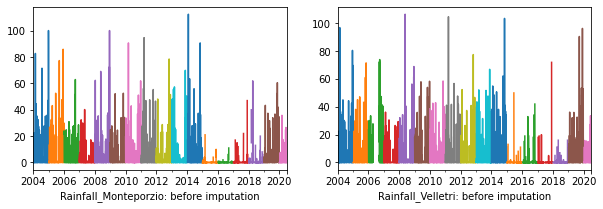

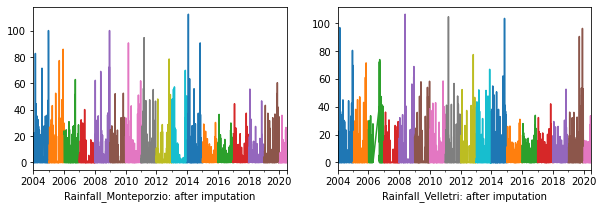

In [33]:
# imputation I

## for Rainfall & Temperature
cols = df.filter(regex='Rainfall.*').columns
### summarize missing values by year 
# display(df[cols].isna().groupby(df.index.year).sum())
fig, ax = plt.subplots(1,2, figsize=(10,3))
df.Rainfall_Monteporzio.groupby(df.index.year).plot(
    xlabel='Rainfall_Monteporzio: before imputation', ax=ax[0])
df.Rainfall_Velletri.groupby(df.index.year).plot(
    xlabel='Rainfall_Velletri: before imputation', ax=ax[1])
plt.show()

### main
df.loc[:'2015-01-01', cols] = fillna(df.loc[:'2015-01-01', cols], approach='interpolate').copy()
df.loc['2019-01-01':, cols] = fillna(df.loc['2019-01-01':, cols], approach='interpolate').copy()

missing_year = [2015, 2016, 2017, 2018]
for missing_y in missing_year: 
    # use previouse 4 years to impute next year
    base_idx = df.query('year >= @missing_y - 4 and year < @missing_y').index
    missing_idx = df[df.index.year == missing_y].index 
    dfbase = df.loc[base_idx, cols].copy()
    dfbase['month'] = dfbase.index.month
    dfbase['day'] = dfbase.index.day
    res = dfbase.groupby(['month', 'day']).agg('mean')
    if df.loc[missing_idx, cols].shape[0] == 365:
        res.drop(index=(2,29), inplace=True)
    df.loc[missing_idx, cols] = res.values
df[cols] = fillna(df[cols], approach='interpolate')
assert df[cols].isna().sum().sum() == 0

### plot again
fig, ax = plt.subplots(1,2, figsize=(10,3))
df.Rainfall_Monteporzio.groupby(df.index.year).plot(
    xlabel='Rainfall_Monteporzio: after imputation', ax=ax[0])
df.Rainfall_Velletri.groupby(df.index.year).plot(
    xlabel='Rainfall_Velletri: after imputation', ax=ax[1])
plt.show()

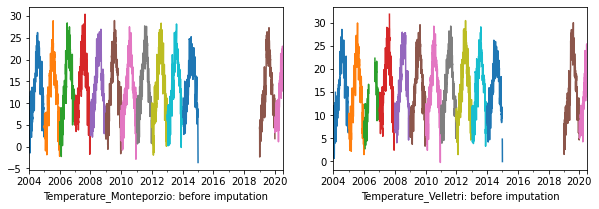

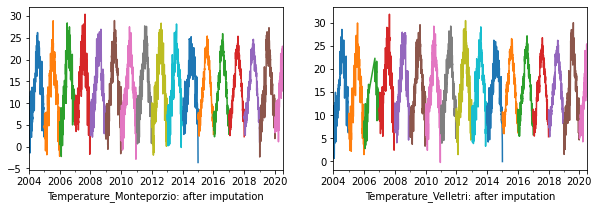

In [34]:
# imputation II 

## for Temperature
cols = df.filter(regex='Temp.*').columns
### summarize missing values by year 
# display(df[cols].isna().groupby(df.index.year).sum())
fig, ax = plt.subplots(1,2, figsize=(10,3))
df.Temperature_Monteporzio.groupby(df.index.year).plot(
    xlabel='Temperature_Monteporzio: before imputation', ax=ax[0])
df.Temperature_Velletri.groupby(df.index.year).plot(
    xlabel='Temperature_Velletri: before imputation', ax=ax[1])
plt.show()

### main
df.loc[:'2015-01-01', cols] = fillna(df.loc[:'2015-01-01', cols], approach='interpolate').copy()
df.loc['2019-01-01':, cols] = fillna(df.loc['2019-01-01':, cols], approach='interpolate').copy()

missing_year = [2015, 2016, 2017, 2018]
for missing_y in missing_year: 
    # use previouse 4 years to impute next year
    base_idx = df.query('year >= @missing_y - 4 and year < @missing_y').index
    missing_idx = df[df.index.year == missing_y].index 
    
    dfbase = df.loc[base_idx, cols].copy()
    dfbase['month'] = dfbase.index.month
    dfbase['day'] = dfbase.index.day
    res = dfbase.groupby(['month', 'day']).agg('mean')
    if df.loc[missing_idx, cols].shape[0] == 365:
        res.drop(index=(2,29), inplace=True)
    df.loc[missing_idx, cols] = res.values
df[cols] = fillna(df[cols], approach='interpolate')
assert df[cols].isna().sum().sum() == 0

### plot again
fig, ax = plt.subplots(1,2, figsize=(10,3))
df.Temperature_Monteporzio.groupby(df.index.year).plot(
    xlabel='Temperature_Monteporzio: after imputation', ax=ax[0])
df.Temperature_Velletri.groupby(df.index.year).plot(
    xlabel='Temperature_Velletri: after imputation', ax=ax[1])
plt.show()

In [35]:
# imputation III
df = df['2015-06-01':]
maskdf = maskdf['2015-06-01':]
## for Depth_to_Groundwater: linear interpolation (rude but easy)
cols = df.filter(regex='Depth.*').columns
# display(df[cols].isna().groupby(df.index.year).sum())

df[cols] = fillna(df[cols], approach='interpolate')
assert df[cols].isna().sum().sum() == 0

In [36]:
# imputation IV: still keep missing data before 2016-10-07
df = df['2016-10-07':]
maskdf = maskdf['2016-10-07':]
## for Volume_Pozzo_xxx: linear interpolation
cols = df.filter(regex='Volume.*').columns
# display(df[cols].isna().groupby(df.index.year).sum())
df[cols] = df[cols].replace(0, np.nan)
df.loc[:, cols] = fillna(df[cols], approach='interpolate').copy()
assert df[cols].isna().sum().sum() == 0
assert df.shape == maskdf.shape

From the volumes plots below, we may sum Volume_Pozzo_2, \_4, \_5_6, and \_8 due to the similar reason as specified in Section 3.1 (Aquifer Auser), ie., they possess similar pattern. We also try various grouping and find that this setting performs the best on 1D prediction.

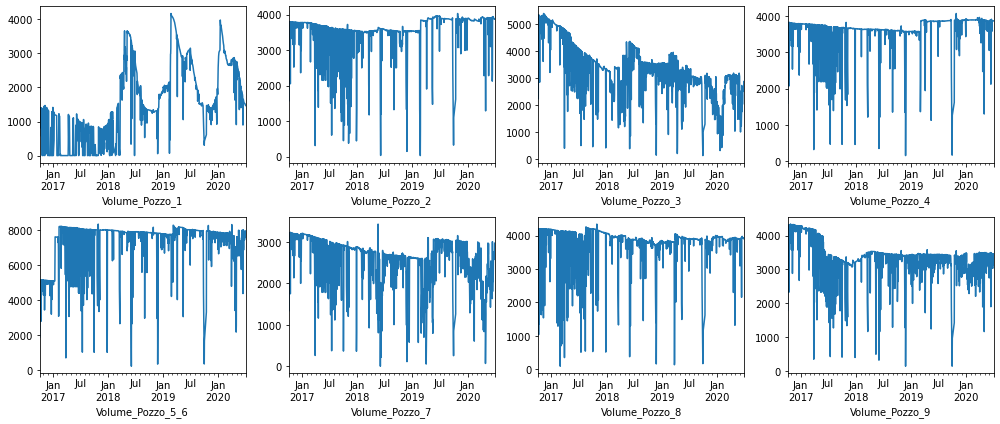

In [37]:
plt.figure(figsize=(14,6))
for i, col in enumerate(df.filter(regex='Vol.*').columns): 
    plt.subplot(2,4,i+1)
    df[col].plot(xlabel=col)
plt.tight_layout()
plt.show()

## Doganella: Daily VAR

We present the model No. 4 (reported at the end of this section) which performs the best on 1D prediction. The model is obtained by:
 - sum up Volume_Pozzo_2, \_4, \_5_6, \_8 to a new feature Volume_gp1 and drop them.
 - first difference on Temperature_Monteporzio, Temperature_Velletri, Volume_Pozzo_1 and 3, Depth_to_Groundwater: 1, 2, 3, 4, 5, 6, 8, 9.
 
Other possible settings are also reported at the end of this section.

In [38]:
# Feature engineering
dfextended = df.copy()
mask = maskdf.copy()
dfextended.drop(columns='year', inplace=True, errors='ignore')
mask.drop(columns='year', inplace=True, errors='ignore')

## Engineer 1
tmp = ['Volume_Pozzo_2', 'Volume_Pozzo_4', 'Volume_Pozzo_5_6', 'Volume_Pozzo_8']
dfextended['Volume_gp1'] = dfextended[tmp].mean(axis=1)
dfextended.drop(columns=tmp, inplace=True)

## Engineer 2: rolling
# tmp = dfextended.filter(regex='Rain.*').columns
# dfextended[tmp] = dfextended[tmp].rolling(30).agg('sum')
# tmp = dfextended.filter(regex='Temp.*').columns
# dfextended[tmp] = dfextended[tmp].rolling(30).agg('mean')
# tmp = dfextended.filter(regex='Vol.*').columns
# dfextended[tmp] = dfextended[tmp].rolling(30).agg('mean')
# dfextended.dropna(inplace=True)

## pca 
# pca_plot(dfextended[['Rainfall_Velletri', 'Rainfall_Monteporzio']])
# pca_plot(dfextended[['Temperature_Velletri', 'Temperature_Monteporzio']])
# tmp = ['Volume_gp1']
# tmp.extend(dfextended.filter(regex='Vol.*').columns.drop(tmp).tolist())
# pca_plot(dfextended[tmp])
# pca_plot(dfextended.filter(regex='Depth.*'))

## Drop due to pca
# dfextended.drop(columns=['Rainfall_Monteporzio'], inplace=True)
# dfextended.drop(columns=['Temperature_Monteporzio'], inplace=True)
# dfextended.drop(columns=['Volume_Pozzo_7'], inplace=True)

## Reorder 
collector = []
for regex in orderlist: # in Sec 2.2
    collector.append(dfextended.filter(regex=regex).columns)
dfextended = dfextended.reindex(columns= np.concatenate(collector) )

## so does mask
mask['Volume_gp1'] = False
# mask = mask[29:] # due to rolling
for col in df.columns.drop(dfextended.columns, errors='ignore'): 
    mask.drop(columns=col, inplace=True, errors='ignore')
assert mask.shape == dfextended.shape, f'mask & dfextended shape don\'t match: {mask.shape}, {dfextended.shape}'
mask = mask.reindex(columns=dfextended.columns)

In [39]:
# Check stationarity
## adftest
adftable = adfuller_table(dfextended, verbose=False, alpha=0.05, maxlag=30, regression='c')
# display(adftable)

## collect non-stationary features
I1 = adftable[adftable['AIC_5%level'] == False].index.values
print('Differenced features: ', I1)

## (Cont'd) take diff() on cols that do not pass the adftest. Here we adopt AIC.
dfstationary = dfextended.copy()
dfstationary.loc[:,I1] = dfstationary[I1].diff()
dfstationary.dropna(inplace=True)

## adftest again
adftable = adfuller_table(dfstationary, verbose=False, maxlag=30, regression='c')
# display(adftable) # This time all features pass ADF test in both AIC and BIC criteria.

Differenced features:  ['Temperature_Monteporzio' 'Temperature_Velletri' 'Volume_Pozzo_1'
 'Volume_Pozzo_3' 'Depth_to_Groundwater_Pozzo_1'
 'Depth_to_Groundwater_Pozzo_2' 'Depth_to_Groundwater_Pozzo_3'
 'Depth_to_Groundwater_Pozzo_4' 'Depth_to_Groundwater_Pozzo_5'
 'Depth_to_Groundwater_Pozzo_6' 'Depth_to_Groundwater_Pozzo_8'
 'Depth_to_Groundwater_Pozzo_9']


In [40]:
# Check granger causality
grtable = grangers_causation_table(dfstationary, xnames=dfextended.columns.drop(labels=targets), 
                          ynames=targets, maxlag=30 ,alpha=0.05)
display(grtable)
# # Manually drop non Granger-cause variables
# tmp = ['Rainfall_Velletri', 'Temperature_Monteporzio']
# dfstationary.drop(columns=tmp, inplace=True)
# mask.drop(columns=tmp, inplace=True)

,Depth_to_Groundwater_Pozzo_1_y,Depth_to_Groundwater_Pozzo_2_y,Depth_to_Groundwater_Pozzo_3_y,Depth_to_Groundwater_Pozzo_4_y,Depth_to_Groundwater_Pozzo_5_y,Depth_to_Groundwater_Pozzo_6_y,Depth_to_Groundwater_Pozzo_7_y,Depth_to_Groundwater_Pozzo_8_y,Depth_to_Groundwater_Pozzo_9_y
Granger Causation Table alpha=0.05,,,,,,,,,
Rainfall_Monteporzio_x,False,False,False,False,False,False,True,True,False
Rainfall_Velletri_x,False,True,False,False,False,False,True,True,False
Temperature_Monteporzio_x,False,False,False,True,False,False,True,False,False
Temperature_Velletri_x,True,True,True,False,False,False,False,True,False
Volume_Pozzo_1_x,True,False,True,False,False,False,True,False,True
Volume_Pozzo_3_x,False,False,True,False,True,False,True,False,True
Volume_Pozzo_7_x,False,True,True,True,True,False,True,False,False
Volume_Pozzo_9_x,False,False,True,True,True,True,True,False,True
Volume_gp1_x,False,False,False,True,True,False,False,False,False


We add `year_sin` feature in to check if model can learn better pattern to predict targets. Models that don't include this feature are also reported at the end of this section. 

The model passes the Durbin Watson Test, meaning that there is no significant serial correlation in residual of each feature. However, it doesn't pass the Portmanteau test, indicating that residual autocorrelatios exists somewhere whit the first 60 lags. It either means that noises are large or the true relationship between features is non-linear. Later we also provide LSTM to check performance.

Failing to pass normality test means that asymptotic standard errors are no longer valid and bootstrapping method such as Efron's or Hall's confidence interval should be used instead when checking impulse response.

In [41]:
# Deal with Time Periodicity 
year = 365.2425
dfstationary['year_sin'] = np.sin(dfstationary.index.dayofyear * 2 * np.pi / year)
dfstationary['year_cos'] = np.cos(dfstationary.index.dayofyear * 2 * np.pi / year)
mask['year_sin'] = False
mask['year_cos'] = False

In [42]:
# Split data
N = dfstationary.shape[0]
train, val, test = dfstationary[:int(0.8*N)], dfstationary[int(0.8*N):int(0.9*N)], dfstationary[int(0.9*N):]
_, vmask, tmask = mask[:int(0.8*N)], mask[int(0.8*N):int(0.9*N)], mask[int(0.9*N):]
column_indices = {name: i for i, name in enumerate(train.columns)}
targets_indices = [column_indices[ta] for ta in targets]

# Scaling and Normalization 
scaler, train_scaled, val_scaled, test_scaled = scale(train, val, test, approach='MinMax')
print('train/val/test shapes:', train_scaled.shape, val_scaled.shape, test_scaled.shape)

train/val/test shapes: (1089, 20) (136, 20) (137, 20)


In [43]:
# Get sense: ac & pac plots
# acpac_plot(dfstationary[targets], figsize=(10, 2) )

In [44]:
# VAR model 
var_model = VAR(endog=train.append(val))
res = var_model.select_order(maxlags=30, trend='c')
print(res.selected_orders)
varlag = res.selected_orders['aic']
var_model = var_model.fit(varlag)
# put result into self-defined class
varobj = VARresults(var_model, test, mask=tmask[1:] , label_columns=targets) #[1:]
print('The model we are using: {1:}-dim VAR({0:}).'.format(*varobj.model.coefs.shape[:2]))

{'aic': 2, 'bic': 1, 'hqic': 1, 'fpe': 2}
The model we are using: 20-dim VAR(2).


In [45]:
# Durbin_watson test of residuals
print('Durbin-Watson test:')
_ = varobj.durbin_watson_test()

Durbin-Watson test:
Rainfall_Monteporzio            :   2.01
Rainfall_Velletri               :   1.99
Temperature_Monteporzio         :   2.04
Temperature_Velletri            :   2.05
Volume_Pozzo_1                  :   2.04
Volume_Pozzo_3                  :   2.08
Volume_Pozzo_7                  :   2.03
Volume_Pozzo_9                  :   2.02
Volume_gp1                      :   2.01
Depth_to_Groundwater_Pozzo_1    :   1.98
Depth_to_Groundwater_Pozzo_2    :   2.00
Depth_to_Groundwater_Pozzo_3    :   1.99
Depth_to_Groundwater_Pozzo_4    :   1.99
Depth_to_Groundwater_Pozzo_5    :   2.00
Depth_to_Groundwater_Pozzo_6    :   2.02
Depth_to_Groundwater_Pozzo_7    :   2.02
Depth_to_Groundwater_Pozzo_8    :   2.00
Depth_to_Groundwater_Pozzo_9    :   2.00
year_sin                        :   2.00
year_cos                        :   2.00


Test statistic,Critical value,p-value,df
4318.,3333.,0.000,3200


Test statistic,Critical value,p-value,df
6.252e+07,55.76,0.000,40


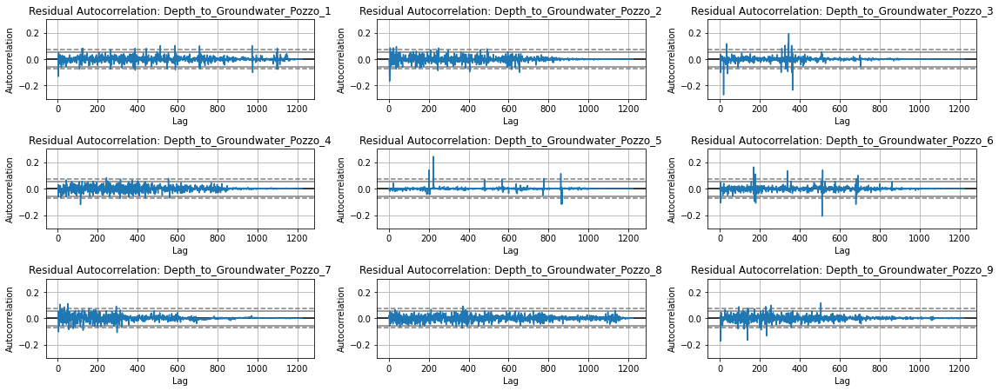

In [46]:
# Adjusted Portmannteau-test & S-K test
display(var_model.test_whiteness(nlags=varlag*5, signif=0.05, adjusted=True).summary())
display(varobj.model.test_normality(signif=0.05).summary())
# Residual Autocorrelations
varobj.residac_plot(cols=targets)

1D predictions of the model is neither good nor bad but the 7D/14D are the best among the settings we've tried (reported at the end of this section).

The 1D prediction error mainly comes from the sudden jump target features: 1, 2, 8. <br/>
For the 7D/14D prediction errors, they mainly come from 1,3,5,7,9.

The model seems can only capture long term patterns since it always predict a line rather than a curve.

uniform rmse:   0.6215
uniform mae:   0.1945


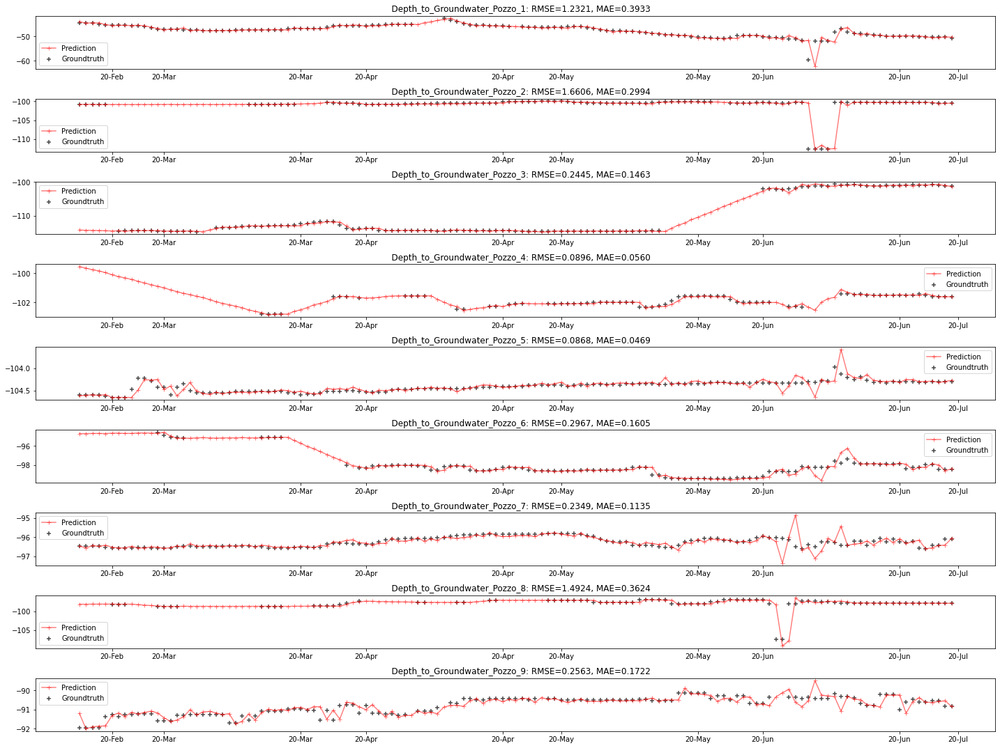

In [47]:
# 1-step-ahead Prediction
## paramters setting:
steps=1
mode = 'normal'
use_mask = True
multioutput = 'raw_values' 

## after trransformation
rmse, mae = varobj.inverse_transform_evaluate(
    I1, dfextended, steps=steps, mode=mode, multioutput=multioutput, use_mask=True)
print('uniform rmse: {:8.4f}'.format(rmse.mean()))
print('uniform mae: {:8.4f}'.format(mae.mean()))

## plot
varobj.plot(use_mask=True)

uniform rmse with 7 step:   0.1863
uniform mae with 7 step:   0.1554


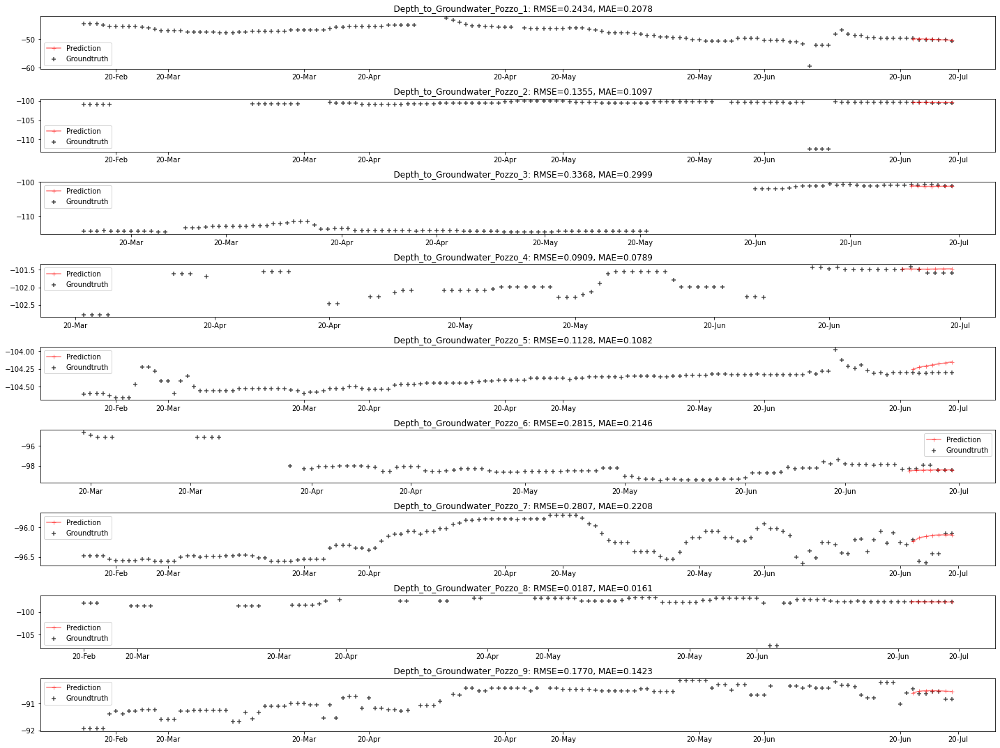

uniform rmse with 14 step:   0.2257
uniform mae with 14 step:   0.1912


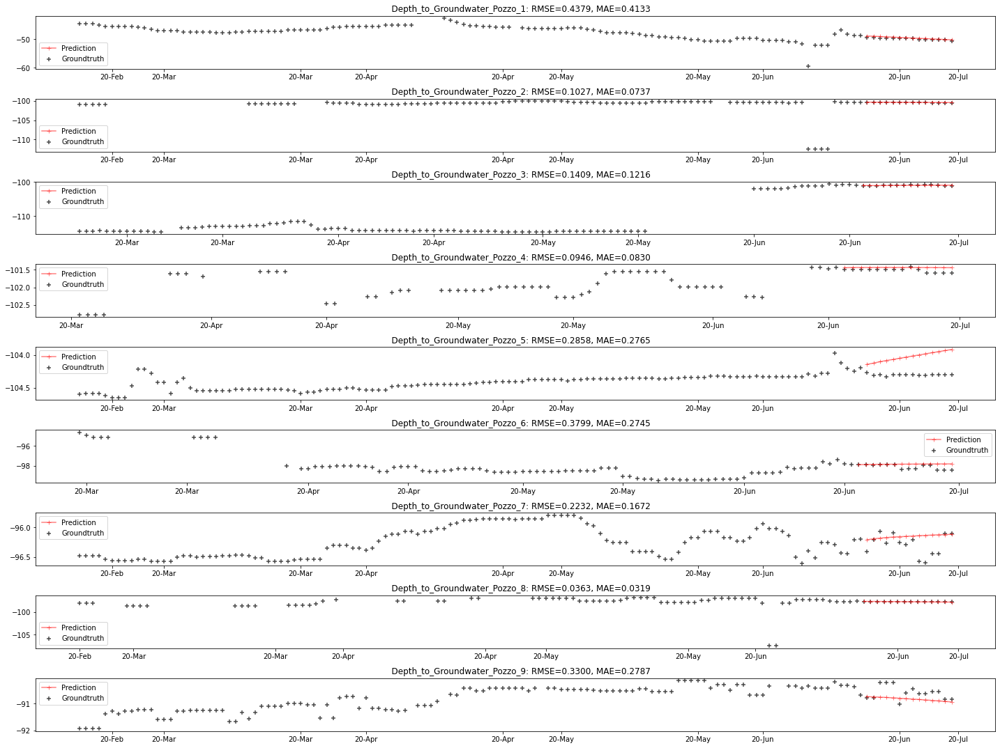

In [48]:
# Last Prediction
## paramters setting:

steps=[7, 14]
mode = 'last'
use_mask = True
multioutput = 'raw_values' 

for step in steps: 
    ## prediction
    rmse, mae = varobj.inverse_transform_evaluate(I1, dfextended,steps=step, mode=mode, 
                                                  multioutput=multioutput, use_mask=use_mask)
    print('uniform rmse with {:>} step: {:8.4f}'.format(step, rmse.mean() ))
    print('uniform mae with {:>} step: {:8.4f}'.format(step, mae.mean() ))
    ## plot
    varobj.plot(use_mask=use_mask, figsize=(20, 15))

Since forecast error impulse response (FEIR) only analyzes shock occuring in one variable at a time, contemporaneous correlation of error terms cannot be captured by it. We then use orthogonalized impulse response (OIR) to solve this issue, which rely on stronger assumption and thus the order of features in model matters. Besides, the Hall's confidence interval is used since it usually has bias corrected effect compared to Efron.

The feature order we choose is **Rainfall $\rightarrow$ Temperature $\rightarrow$ Volumes ($\rightarrow$ Hydrometries) $\rightarrow$ Depth_to_Groundwaters**. 

Actually, the order between rainfall and temperature can be reversed since they affect each other. Depth_to_Groundwaters is put at the end because we want to see how the other features affect the targets. Volumes (the amount taken from the drinking water treatment plant) clearly affects Hydrometries, so volumes are put before hydrometries.

The meaning of OIR is to see whether one standard deviation shock to x causes significant (increase/decrease standard deviation) response in y for m periods. 


To save space we directly write OIR restuls instead of prining them out: <br/>
format- target feature number: impotant features (GWi means Depth_to_Groundwater_Pozzo_i)
1. Volume_Pozzo_1, GW7
2. GW4
3. GW6
4. GW2, GW5, GW6
5. None
6. GW2, GW4
7. GW1
8. None
9. None

As one can see, (GW1,GW7) affect each other, so do (GW2, GW4, GW6). Unfortunately, neither rainfalls nor temperatures have significant IR on our target features.

In [49]:
# OIR Plot Analysis
# are of interest in econometric studies: they are the estimated responses to a unit impulse in one 
# of the variables.
# varobj.irplot(impulse=train.columns, periods=15, response=targets, orth=True,
#              figsize=(17,100), method='hall')

The FEVD plot is shown below. It illustrates which (orthogonised) feature shocks contribute to the error variance of our target features in different lags. 

To save space again, we won't draw the FEVD figures, but they give similar conclusion as what we have seen in OIR analysis. We omit this part.

In [50]:
# FEVD Plot Analysis 
# varobj.fevd_plot(periods=11, top=5, figsize=(14, 9), max_str_split=3) 

We've implemented various settings of models and are reported below. As far what we have implmented is the model No. 4, which performs the best on 14D among our settings. From the report we find that:

1. `year_sin & year_cos` doesn't help for better pattern learning.
2. rolling mean of 30 days on all features may or may not be helpful on long term prediction.
3. The naive baseline model (No. 3), which includes only the nine target features, performs the best on 1D. 
4. Perhaps 3. is alinged with our findings that none of the temperatures and rainfalls have significant OIR on target features.
5. It's hard to decrease RMSE/MAE on 1D prediction for all settings probably due to the difficulty in predicting sudden jumps, as discussed early in this section.

Since VAR model is linear and thus can only capture local linear prediction, we present LSTM as well trying to capture the possible non-linear relationship between target and features in the following.

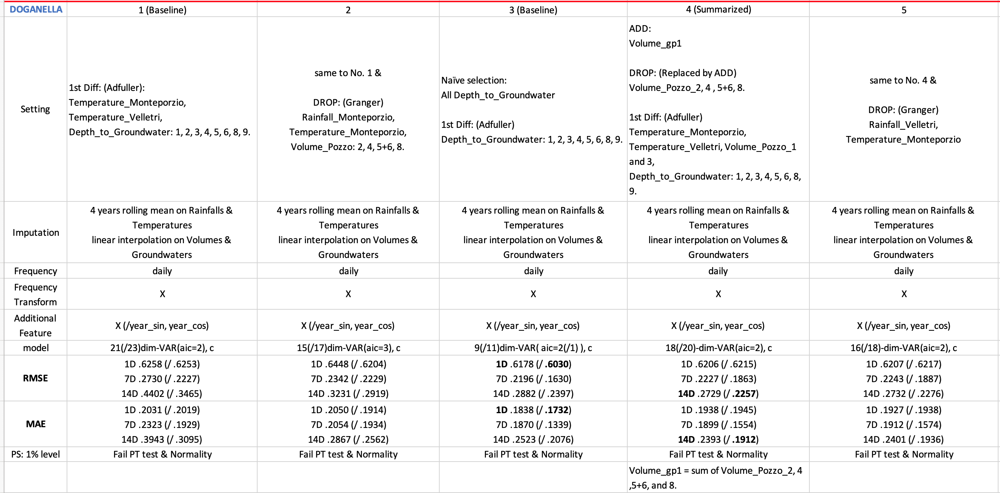

In [24]:
Image("/Users/mbpr/GitHub/Acea-Smart-Water-Analytics/image/doganella1.png")

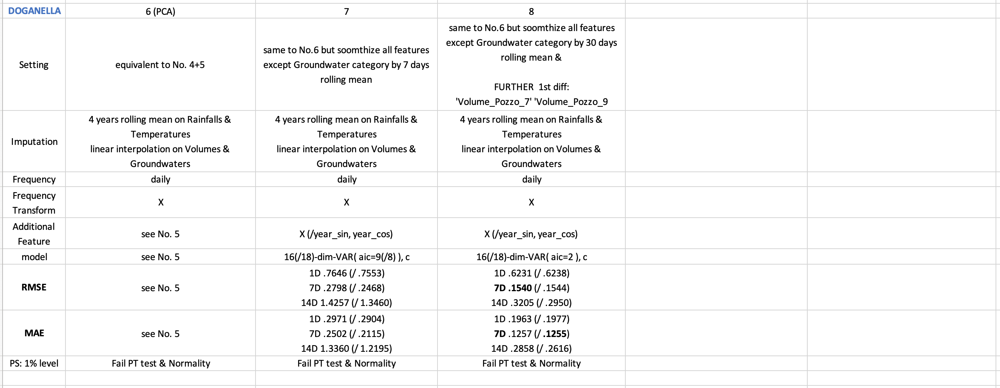

In [25]:
Image("/Users/mbpr/GitHub/Acea-Smart-Water-Analytics/image/doganella2.png")

## Doganella: Daily LSTM

LSTM model doesn't require data to be stationary but better scaled since tanh() is used by LSTM. We then use `MinMaxScaler()` to scale data into $[-1,1]$. One can also use alternative scaler such as `StandardScaler()` by simply changing the `approach='Standard'` in the scale function. `year_sin` is added into the LSTM model for experiment.

Here we use the same lag as VAR to train the LSTM in order for 1D prediction performance comparison. The model can thus be futher fine tuned based on different lags together with other parameters, which we will omit here (by fixing lag=varlag) and focus only on the feature importance learned by the LSTM.

We didn't implement the LSTM model that predicts 7D/14D in a row since it's intuitive to directly predict on target features instead of predicting on all features and then feed the prediction to the model again, which is like the behaviour of VAR model.

Notice: due to the large lag(=2), the training/val/test sample sizes are small. Machine learning models usually require a huge amount of samples and thus may not perform well on small samples. Our goal here is to explore the important features to LSTM via the sensitivity analysis.

In [51]:
# Feature engineering & imputation
## no mask to deal with
dfextended = df.copy()

## Reorder 
collector = []
for regex in orderlist:
    collector.append(dfextended.filter(regex=regex).columns)
dfextended = dfextended.reindex(columns= np.concatenate(collector) )

# Deal with Time Periodicity 
year = 365.2425
dfextended['year_sin'] = np.sin(dfextended.index.dayofyear * 2 * np.pi / year)

In [52]:
# Split data
N = dfextended.shape[0]
train, val, test = dfextended[:int(0.8*N)], dfextended[int(0.8*N):int(0.9*N)], dfextended[int(0.9*N):]

## define indices
column_indices = {name: i for i, name in enumerate(train.columns)}
targets_indices = [column_indices[ta] for ta in targets]

# Scaling and Normalization 
scaler, train_scaled, val_scaled, test_scaled = scale(train, val, test, approach='MinMax')
print('train/val/test shapes are:', train_scaled.shape, val_scaled.shape, test_scaled.shape)

train/val/test shapes are: (1090, 22) (136, 22) (137, 22)


In [53]:
# Initialize data loader: 1-step-ahead prediction
## parameters setting
input_width = varlag     # suggested by VAR
label_width = 1       
shift = 1
batch_size = 2
## generate window
window = WindowGenerator(input_width, label_width, shift, train_scaled, val_scaled, test_scaled, 
                         batch_size=batch_size, shuffle=False, mask=None, 
                         label_columns=targets)
print(window)
print('Inputs/labels shapes of window: {} {}'.format(
    window.example[0].shape, window.example[1].shape))

Total window size: 3
Input indices: [0 1]
Label indices: [2]
shuffle: False
Label column name(s): ['Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2', 'Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4', 'Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6', 'Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8', 'Depth_to_Groundwater_Pozzo_9']
Inputs/labels shapes of window: (2, 2, 22) (2, 1, 9)


evaluation before scaling back:
68/68 - 0s - loss: 0.1502 - root_mean_squared_error: 0.3875 - mean_absolute_error: 0.2525
evaluation after scaling back: root_mean_squared_error: 1.7477 - mean_absolute_error: 1.3480


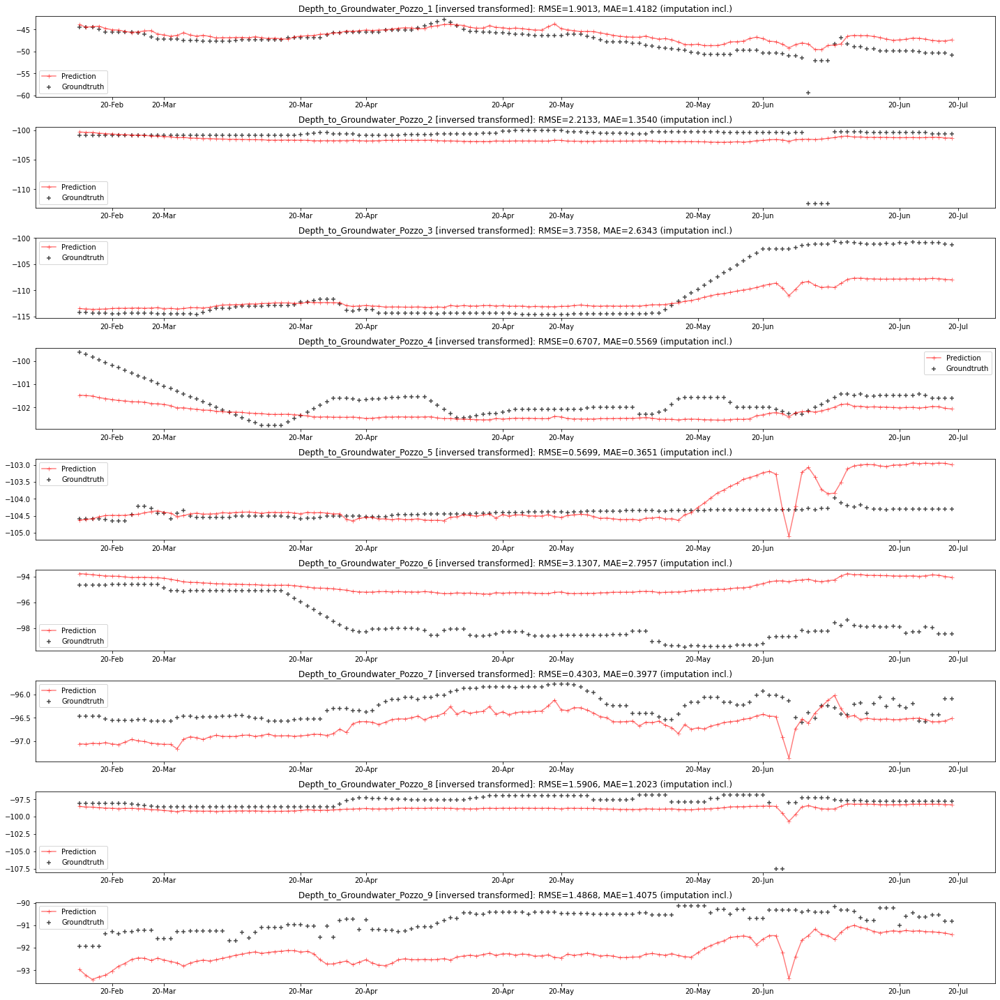

In [54]:
# 1-step-ahead LSTM prediction

lstm_model = None
if os.path.isfile(os.path.join(modelpath, 'doganella.keras')):
    lstm_model = tf.keras.models.load_model(os.path.join(modelpath, 'doganella.keras'))
else: 
    # ## Parameters setting:
    MAX_EPOCHS = 200
    patience = 10        # stop training if loss increase for 'patience' periods in total.
    lr_rate = 1e-3
    train_verbose = 0    # 0: no output, 1: progress, 2: report
    lstm_kernel = 16
    stateful = False     # batchsize must be 1 if True. (takes 10 mins)
    dropout = 0.2        # dropout rate in [0,1]

    ## fixed setting
    n_features = train_scaled.shape[1]
    n_out = len(targets)
    OUT_STEPS = window.label_width

    ## RNN: LSTM
    lstm_model = tf.keras.Sequential([
        # Shape [batch, time, features] => [batch, lstm_units]
        tf.keras.layers.LSTM(lstm_kernel, return_sequences=True, stateful=stateful),
        tf.keras.layers.Dropout(dropout),
        tf.keras.layers.LSTM(int(lstm_kernel/2), return_sequences=False, stateful=stateful),
        # Shape => [batch, out_steps*features]
        tf.keras.layers.Dropout(dropout),
        tf.keras.layers.Dense(OUT_STEPS*n_out),
        # Shape => [batch, out_steps, features]
        tf.keras.layers.Reshape([OUT_STEPS, n_out])
    ])
    ## compile and fit
    print('window RNN')
    print('Xtrain shape: ', window.example[0].shape, 'ytrain shape: ', window.example[1].shape, end='')
    print('\toutput shape: ', lstm_model(window.example[0]).shape, end='\n\n')
    history = compile_and_fit(lstm_model, window, MAX_EPOCHS, patience, lr_rate, verbose=train_verbose)
    ## save model
    lstm_model.save(os.path.join(modelpath, 'doganella.keras'), overwrite=False)
    
## evaluate on test
print('evaluation before scaling back:')
lstm_model.evaluate(window.test, verbose=2, return_dict=True)
#window.plot(lstm_model, use_mask=True)

## inverse_transform_evaluate on test
di = window.inverse_transform_evaluate(lstm_model, scaler, which='test', return_dict=True)
print('evaluation after scaling back: {0}: {2:6.4f} - {1}: {3:6.4f}'.format(*di.keys(), *di.values()))
window.plot(use_mask=False, figsize=(20, 20))

We use the sensitivity analysis to determine the feature importance, that is, when perturbing a particular feature based on testing data, given the values of the other feature unchanged, how much will rmse change by comparing the prediction before and after perturbation. A feature is more important if the larger the rmse is.

As one can see, the LSTM model perform very worse on the prediction tasks. So we omit the discussion here.
But one thing worth notice is that it seems like the nine target features are most important to the LSTM (which is the same as what we've seen in the VAR part), followed by volume features.

We conclude that besides target features, all rainfalls except Cavallina and S_Agata important feature to LSTM when predicting Lake_Level and Flow_Rate.

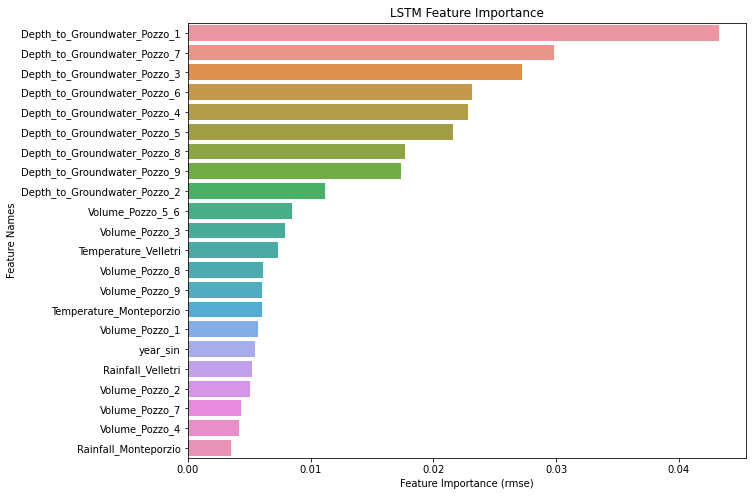

In [55]:
# LSTM feature importance plot
importance, direction = feature_importance(lstm_model, window.X_test, scale=0.2, method='const')
feature_importance_plot(importance, direction, names=train_scaled.columns)

## Summary

We summarize here what we've gotten from the above analysis <br/>
Target feature: Depth_to_Groundwater_Pozzo_1,2,3,4,5,6,7,8,9. (Abbreviated as GW) <br/>
Testing size: 137.

Most important Features: <br/>
From the VAR model: 1D/7D/14D RMSE - .0516/.0457/.0583 (inverse transformd)
1. Volume_Pozzo_1, GW7
2. GW4
3. GW6
4. GW2, GW5, GW6
5. None
6. GW2, GW4
7. GW1
8. None
9. None

PS. (GW1,GW7) affect each other, so do (GW2, GW4, GW6). Unfortunately, neither rainfalls nor temperatures have significant IR on our target features.

# Aquifer Luco

## Data Cleansing

The Aquifer Luco dataset only contains large missing values so we can only focus on 2017-09-01 - 2019-01-11, where all features are preserved and can be imputed easily by linear regression. (as shown in between red vertical lines in the folloing figure)

We also drop the two features **Rainfall_Siena_Poggio_al_Vento**, and **Temperature_Siena_Poggio_al_Vento** since we have tested on the model that includes them in various settings but usually performs poorer than the one without them.

A first glance at correlation triangle plot shows that our target feature *Depth_to_Groundwater_Podere_Casetta* is correlated all *Temperatures* and the *Volume_Pozzo_4*. It's unclear whether target features possess a yearly pattern so we will try to explore it.

Mask on missing/imputed data is used in order to get more accurate rmse/mae performance of models.

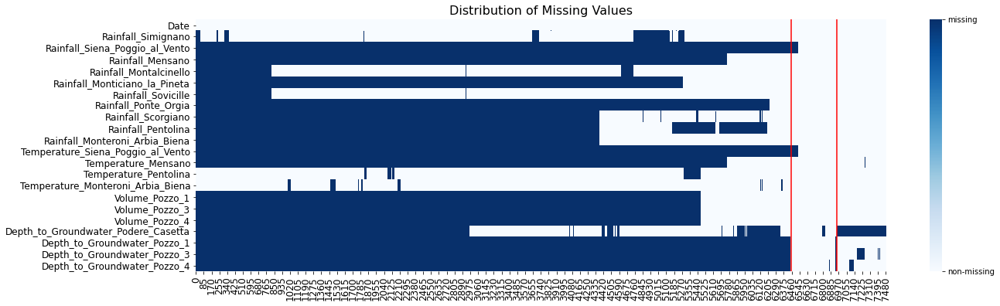

In [56]:
# parameters setting
dataset = 'Aquifer_Luco.csv'
targets = ['Depth_to_Groundwater_Podere_Casetta']

# read dataset as DataFrame
dateparse = lambda x: datetime.strptime(x, '%d/%m/%Y')
df = pd.read_csv(os.path.join(datapath, dataset), index_col='Date', parse_dates=['Date'], date_parser=dateparse)

# re-order features
orderlist = ['Rain.*', 'Temp.*', 'Volume.*', 'Depth.*']
collector = []
for regex in orderlist: 
    collector.append(df.filter(regex=regex).columns)
df = df.reindex(columns= np.concatenate(collector) )

# define frequency and sort accordingly.
df.index.freq = 'd'
df.sort_index(inplace=True)

# Set weird values to nan
## set nan to Groundwater whose values are 0
df[df.filter(regex='Temperature_.*').columns] = df.filter(regex='Temperature_.*').replace(0, np.nan)
df['Depth_to_Groundwater_Pozzo_4'].replace(0, np.nan, inplace=True)

# visual graph of nan locations for each field
missingval_plot(df, show=False)
plt.axvline(x = 6453, c='r') # 2017-09-01
plt.axvline(x = 6951, c='r') # 2019-01-11
plt.show()

# Depth_to_Groundwater_Podere_Casetta: missing after 2019-01-12
# Depth_to_Groundwater_1,3,4: mass missing till 2017-08-31 (included)
# Rainfall_Siena_Poggio_al_Vento & Temperature_Siena_Poggio_al_Vento: mmass missing till 2017-11-22
# Volumes: missing till 2014-12-31 (included)

In [57]:
# Dealing with missing values
df = df['2017-09-01':'2019-01-12']

## drop columns
df.drop(columns=['Rainfall_Siena_Poggio_al_Vento'], inplace=True)
df.drop(columns=['Temperature_Siena_Poggio_al_Vento'], inplace=True)

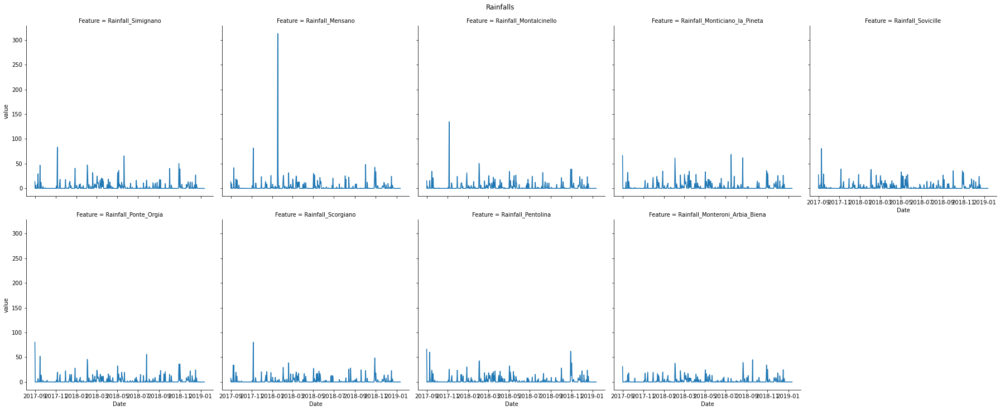

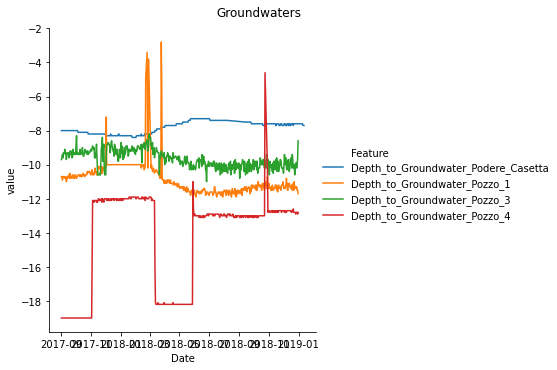

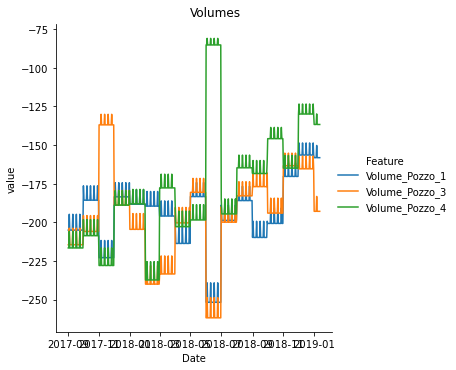

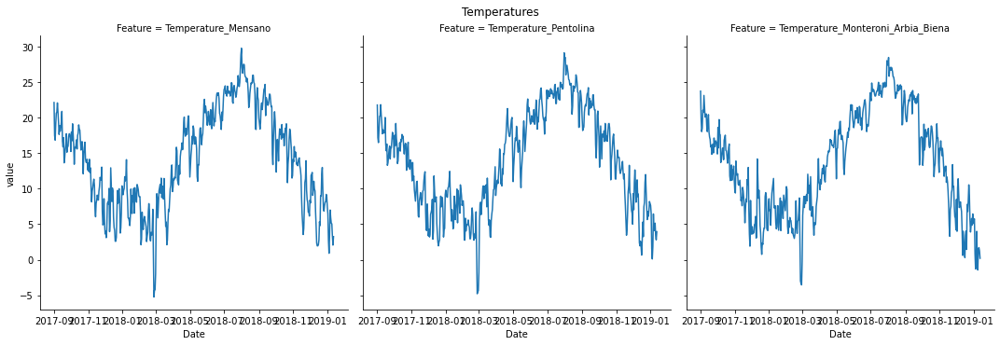

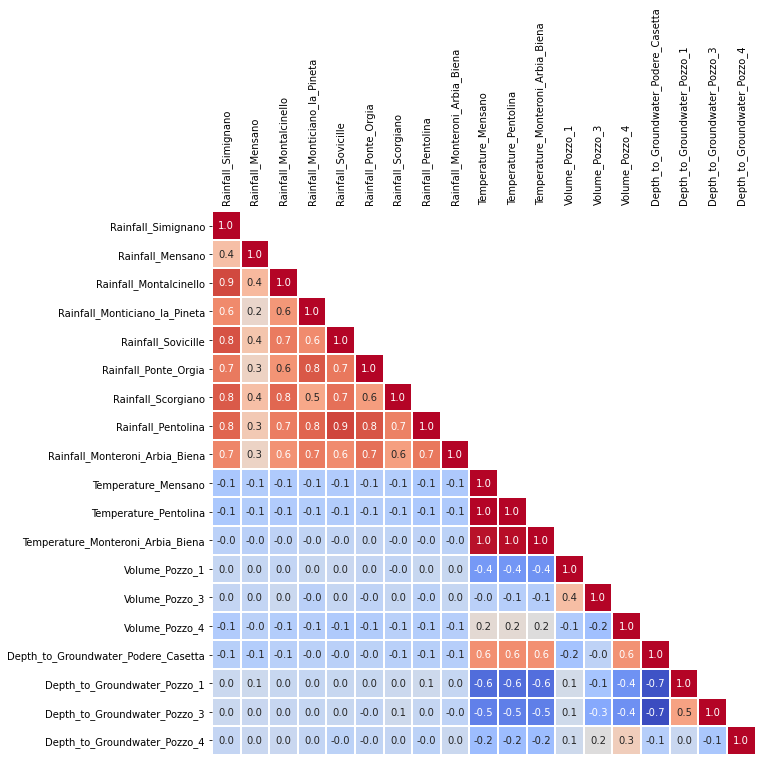

In [58]:
# correlation plot
feature_plots(df)
corrtri_plot(df)

## Luco: Daily VAR

We present the baseline model here which includes all features without further engineering but being stationary. All temperatures, Volume_Pozzo_3, and all Depth_to_Groundwaters, including our target feature, are thus first differenced. 

Half of the rainfall features and all the volume features together with Depth_to_Groundwater_Pozzo_3 do NOT pass the Grager in the setting of baseline model (5% level with lag=20), as showned below, but we still inclue them in the following setting and put the one that excludes them into the report at the end of this section.

Notice that the model we're **presenting here is not the best** model, but helps us on OIR analysis, further feature selection, and finally the best model is created. 

In addition, since the data left is not much, the VAR lag order cannot be chosen too large or otherwise the model will complain a maxlag too large error because the total variables will be larger than the observations we have.

In [59]:
# Feature engineering & imputation
dfimputed = df.copy()
# Record nan positions before imputation
mask = df.isna()

# imputation
dfimputed = fillna(dfimputed, approach='regression', window=1)
assert dfimputed.isna().any().any() == False

## Engineer 1
# tmp = dfimputed.filter(regex='Rain.*').columns
# dfimputed['Rainfall_sum'] = dfimputed[tmp].sum(axis=1)
# dfimputed.drop(columns=tmp, inplace=True)

# tmp = dfimputed.filter(regex='Temp.*').columns
# dfimputed['Temperature_mean'] = dfimputed[tmp].mean(axis=1)
# dfimputed.drop(columns=tmp, inplace=True)

# tmp = dfimputed.filter(regex='Vol.*').columns
# dfimputed['Volume_sum'] = dfimputed[tmp].sum(axis=1)
# dfimputed.drop(columns=tmp, inplace=True)

## Engineer 2: rolling
# tmp = dfimputed.filter(regex='Rain.*').columns
# dfimputed[tmp] = dfimputed[tmp].rolling(30).agg('sum')
# tmp = dfimputed.filter(regex='Vol.*').columns
# dfimputed[tmp] = dfimputed[tmp].rolling(30).agg('mean')
# tmp = dfimputed.filter(regex='Temp.*').columns
# dfimputed[tmp] = dfimputed[tmp].rolling(30).agg('mean')
# dfimputed.dropna(inplace=True)

## pca 
# tmp = ['Rainfall_Monticiano_la_Pineta', 'Rainfall_Simignano', 'Rainfall_Montalcinello']
# tmp.extend(dfimputed.filter(regex='Rain.*').columns.drop(tmp).tolist())
# pca_plot(dfimputed[tmp])

# tmp = ['Temperature_Monteroni_Arbia_Biena']
# tmp.extend(dfimputed.filter(regex='Temp.*').columns.drop(tmp).tolist())
# pca_plot(dfimputed[tmp])
# tmp = ['Volume_Pozzo_1', 'Volume_Pozzo_3', 'Volume_Pozzo_4']
# tmp.extend(dfimputed.filter(regex='Vol.*').columns.drop(tmp).tolist())
# pca_plot(dfimputed[tmp])

# pca_plot(dfimputed.filter(regex='Depth.*'))

## Dorp due to pca
# tmp = ['Rainfall_Montalcinello', 'Rainfall_Monticiano_la_Pineta', 'Rainfall_Simignano']
# dfimputed.drop(columns=dfimputed.filter(regex='Rain.*').columns.drop(tmp), inplace=True)
# tmp = ['Temperature_Monteroni_Arbia_Biena']
# dfimputed.drop(columns=dfimputed.filter(regex='Temp.*').columns.drop(tmp), inplace=True)
# # tmp = ['Volume_sum', 'Volume_Pozzo_1', 'Volume_Pozzo_3']
# # dfimputed.drop(columns=dfimputed.filter(regex='Vol.*').columns.drop(tmp), inplace=True)
# dfimputed.drop(columns='Depth_to_Groundwater_Pozzo_4', inplace=True)

## Reorder 
collector = []
for regex in orderlist: # in Sec 2.1.1
    collector.append(dfimputed.filter(regex=regex).columns)
dfimputed = dfimputed.reindex(columns= np.concatenate(collector) )


## so does mask
# mask['Volume_sum'] = mask['Rainfall_sum'] = mask['Temperature_mean'] = False
# mask = mask[29:]
for col in df.columns.drop(dfimputed.columns, errors='ignore'): 
    mask.drop(columns=col, inplace=True)
assert mask.shape == dfimputed.shape, f'mask shape {mask.shape} doesn\'t match dfimputed shape {dfimputed.shape}'
mask = mask.reindex(columns=dfimputed.columns)

In [60]:
# Chekc stationarity
## adftest
adftable = adfuller_table(dfimputed, verbose=False, alpha=0.05, maxlag=21, regression='ct')
# display(adftable)

## collect non-stationary features
I1 = adftable[adftable['AIC_5%level'] == False].index.values
print('Differenced features: ', I1)

## (Cont'd) take diff() on cols that do not pass the adftest. Here we adopt AIC.
dfstationary = dfimputed.copy()
dfstationary.loc[:,I1] = dfstationary[I1].diff()
dfstationary.dropna(inplace=True)

## adftest again
adftable = adfuller_table(dfstationary, verbose=False, maxlag=21, regression='ct')
# display(adftable) # This time all features pass ADF test in both AIC and BIC criteria.

Differenced features:  ['Temperature_Mensano' 'Temperature_Pentolina'
 'Temperature_Monteroni_Arbia_Biena' 'Volume_Pozzo_3'
 'Depth_to_Groundwater_Podere_Casetta' 'Depth_to_Groundwater_Pozzo_1'
 'Depth_to_Groundwater_Pozzo_3' 'Depth_to_Groundwater_Pozzo_4']


In [61]:
# Check granger causality
grtable = grangers_causation_table(dfstationary, xnames=dfimputed.columns.drop(labels=targets), 
                          ynames=targets, maxlag=20 ,alpha=0.05)
display(grtable)
## Manually drop non Granger-cause variables
# fail_feature = grtable[grtable.iloc[:,0] == False].index.str.strip('_x').values
# print('features not pass Granger:\n', fail_feature)
# dfstationary.drop(columns=fail_feature, inplace=True)
# mask.drop(columns=fail_feature, inplace=True)

,Depth_to_Groundwater_Podere_Casetta_y
Granger Causation Table alpha=0.05,
Rainfall_Simignano_x,True
Rainfall_Mensano_x,False
Rainfall_Montalcinello_x,True
Rainfall_Monticiano_la_Pineta_x,False
Rainfall_Sovicille_x,False
Rainfall_Ponte_Orgia_x,True
Rainfall_Scorgiano_x,True
Rainfall_Pentolina_x,True
Rainfall_Monteroni_Arbia_Biena_x,False


We add `year_sin` feature in to check if model can learn better pattern to predict targets. Models that don't include this feature are also reported at the end of this section. 

The baseline model sort of passes the Durbin Watson Test, meaning that there is no significant serial correlation in residual of each feature. Some features get scores around 1.6 which is a bit low. Although we didn't drop them in order to see full OIR analysis, it would be interesting as further studies to see that if dropping the features will make performance of the model better.

The baseline model, however, doesn't pass the Portmanteau test, indicating that residual autocorrelatios exists somewhere whit the first 60 lags. It either means that noises are large or the true relationship between features is non-linear. Later we also provide LSTM to check performance.

Failing to pass normality test means that asymptotic standard errors are no longer valid and bootstrapping method such as Efron's or Hall's confidence interval should be used instead when checking impulse response.

In [62]:
# Deal with Time Periodicity 
year = 365.2425

dfstationary['year_sin'] = np.sin(dfstationary.index.dayofyear * 2 * np.pi / year)
mask['year_sin'] = False
print(dfstationary.shape, mask.shape)

(498, 20) (499, 20)


In [63]:
# Split data
N = dfstationary.shape[0]
train, val, test = dfstationary[:int(0.8*N)], dfstationary[int(0.8*N):int(0.9*N)], dfstationary[int(0.9*N):]
_, vmask, tmask = mask[:int(0.8*N)], mask[int(0.8*N):int(0.9*N)], mask[int(0.9*N):]
column_indices = {name: i for i, name in enumerate(train.columns)}
targets_indices = [column_indices[ta] for ta in targets]

# Scaling and Normalization 
# normalization won't make sense if the TS is trending upward/downward. This is why stationary first.
scaler, train_scaled, val_scaled, test_scaled = scale(train, val, test, approach='MinMax')
print('train/val/test shapes:', train_scaled.shape, val_scaled.shape, test_scaled.shape)

train/val/test shapes: (398, 20) (50, 20) (50, 20)


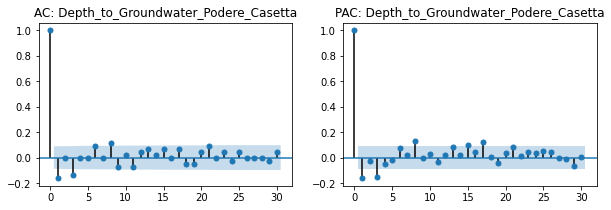

In [64]:
# Get sense: ac & pac plots
acpac_plot(dfstationary[targets], figsize=(10, 3))

In [65]:
# VAR model 
var_model = VAR(endog=train.append(val))
res = var_model.select_order(maxlags=20, trend='ct')
print(res.selected_orders)
varlag = res.selected_orders['aic']
var_model = var_model.fit(varlag)
# put result into self-defined class
varobj = VARresults(var_model, test, mask=tmask[1:] , label_columns=targets) #[1:]
print('The model we are using: {1:}-dim VAR({0:}).'.format(*varobj.model.coefs.shape[:2]))

{'aic': 20, 'bic': 2, 'hqic': 20, 'fpe': 20}
The model we are using: 20-dim VAR(20).


In [66]:
# Durbin_watson test of residuals
print('Durbin-Watson test:')
_ = varobj.durbin_watson_test()

Durbin-Watson test:
Rainfall_Simignano              :   2.04
Rainfall_Mensano                :   2.05
Rainfall_Montalcinello          :   2.03
Rainfall_Monticiano_la_Pineta   :   2.34
Rainfall_Sovicille              :   2.10
Rainfall_Ponte_Orgia            :   2.11
Rainfall_Scorgiano              :   2.11
Rainfall_Pentolina              :   2.05
Rainfall_Monteroni_Arbia_Biena  :   1.85
Temperature_Mensano             :   2.12
Temperature_Pentolina           :   2.16
Temperature_Monteroni_Arbia_Biena:   2.07
Volume_Pozzo_1                  :   1.84
Volume_Pozzo_3                  :   1.65
Volume_Pozzo_4                  :   1.63
Depth_to_Groundwater_Podere_Casetta:   1.81
Depth_to_Groundwater_Pozzo_1    :   2.12
Depth_to_Groundwater_Pozzo_3    :   2.11
Depth_to_Groundwater_Pozzo_4    :   2.22
year_sin                        :   1.91


Test statistic,Critical value,p-value,df
4.221e+04,2.436e+04,0.000,24000


Test statistic,Critical value,p-value,df
1661.,55.76,0.000,40


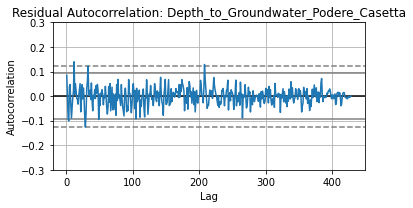

In [67]:
# Adjusted Portmannteau-test & S-K test
display(var_model.test_whiteness(nlags=varlag*4, signif=0.05, adjusted=True).summary())
display(varobj.model.test_normality().summary())
# Residual Autocorrelations
varobj.residac_plot(cols=targets, figsize=(15, 3))

As shown in the following, neither the 1D nor the 7D/14D performs well for our baseline model. Compared to this, the best model we present at the end of this section can reduce rmse to roughly 0.05, 0.05, and 0.04 on 1D/7D/14D predictions. However, the prediction plot of it still doesn't look good. We reckon that this is because the ground truth possesses the pattern of a horizontal line with several suddenly jumpus, which makes the VAR model (even non-linear/ML model) hard to predict them correctly. Further feature transformation/engineer can also be conducted but then we can only explain OIR on the transformed or summarized features instead of the original features.

An observation worth noticed is that even though the **rmse/mae seems very small (at 1e-2 level), the performance shouldn't be concluded as a good one** since it's caused by the small values of the groud truth itself, not because the model really learn the pattern.

uniform rmse:   0.1049
uniform mae:   0.0772


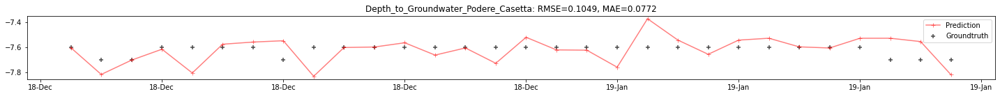

In [68]:
# 1-step-ahead Prediction
## paramters setting:
steps=1
mode = 'normal'
use_mask = True
multioutput = 'raw_values' 

## after trransformation
rmse, mae = varobj.inverse_transform_evaluate(
    I1, dfimputed, steps=steps, mode=mode, multioutput=multioutput, use_mask=use_mask)
print('uniform rmse: {:8.4f}'.format(rmse.mean()))
print('uniform mae: {:8.4f}'.format(mae.mean()))

## plot
varobj.plot(use_mask=True, figsize=(20, 2))

uniform rmse with 7 step:   0.1101
uniform mae with 7 step:   0.0997


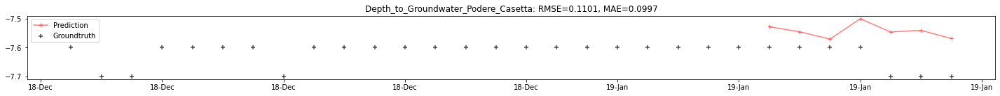

uniform rmse with 14 step:   0.0838
uniform mae with 14 step:   0.0647


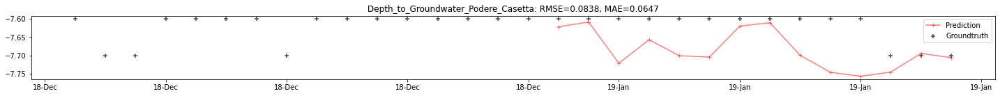

In [69]:
# Last Prediction
## paramters setting:

steps=[7, 14]
mode = 'last'
use_mask = True
multioutput = 'raw_values' 
for step in steps: 
    ## prediction
    rmse, mae = varobj.inverse_transform_evaluate(I1, dfimputed,steps=step, mode=mode, 
                                                  multioutput=multioutput, use_mask=use_mask)
    print('uniform rmse with {:>} step: {:8.4f}'.format(step, rmse.mean() ))
    print('uniform mae with {:>} step: {:8.4f}'.format(step, mae.mean() ))
    ## plot
    varobj.plot(use_mask=use_mask, figsize=(20, 2))

Since forecast error impulse response (FEIR) only analyzes shock occuring in one variable at a time, contemporaneous correlation of error terms cannot be captured by it. We then use orthogonalized impulse response (OIR) to solve this issue, which rely on stronger assumption and thus the order of features in model matters. Besides, the Hall's confidence interval is used since it usually has bias corrected effect compared to Efron.

The feature order we choose is **Rainfall $\rightarrow$ Temperature $\rightarrow$ Volumes ($\rightarrow$ Hydrometries) $\rightarrow$ Depth_to_Groundwaters**. 

Actually, the order between rainfall and temperature can be reversed since they affect each other. Depth_to_Groundwaters is put at the end because we want to see how the other features affect the targets. Volumes (the amount taken from the dinking water treatment plant) clearly affects Hydrometries, so volumes are put before hydrometries.

The meaning of OIR is to see whether one standard deviation shock to x causes significant (increase/decrease standard deviation) response in y for m periods. We show response of the first target feature only since the two targets are perfectly correlated with each other and the level patterns in data are the same. 

Since OIR plot will compain Non-Positive-Definite-Matrix Error of the error term, so Choelsky decomposition cannot be applied, we then turn to FEIR plot (`orth=False`). Unfortunately, none of the features causes a significant orthogonalized impulse response to our target feature *Depth_to_Groundwater_Podere_Casetta*. FEIR plot is thus not showned here. We move on to FEVD plot in the following to see further analysis of these features.


In [70]:
# OIR Plot Analysis
# varobj.irplot(impulse=train.columns, periods=15, response=targets, orth=False,
#              figsize=(17,15), method='hall')

The FEVD plot is shown below. It illustrates which (orthogonised) feature shocks contribute to the error variance of our target features in different lags. 

Both target features have similar pattern in FEVD plots. The top 3 features excluding our target features are **Rainfall_Pentolina, Volume_Pozzo_3, Rainfall_Montalcinello, Temperature_Monteroni_Arbia_Biena, and Rainfall_Mensano**, which contribute to 70% of the error variance of our target feature in the beginning but later decrease to on 50%.

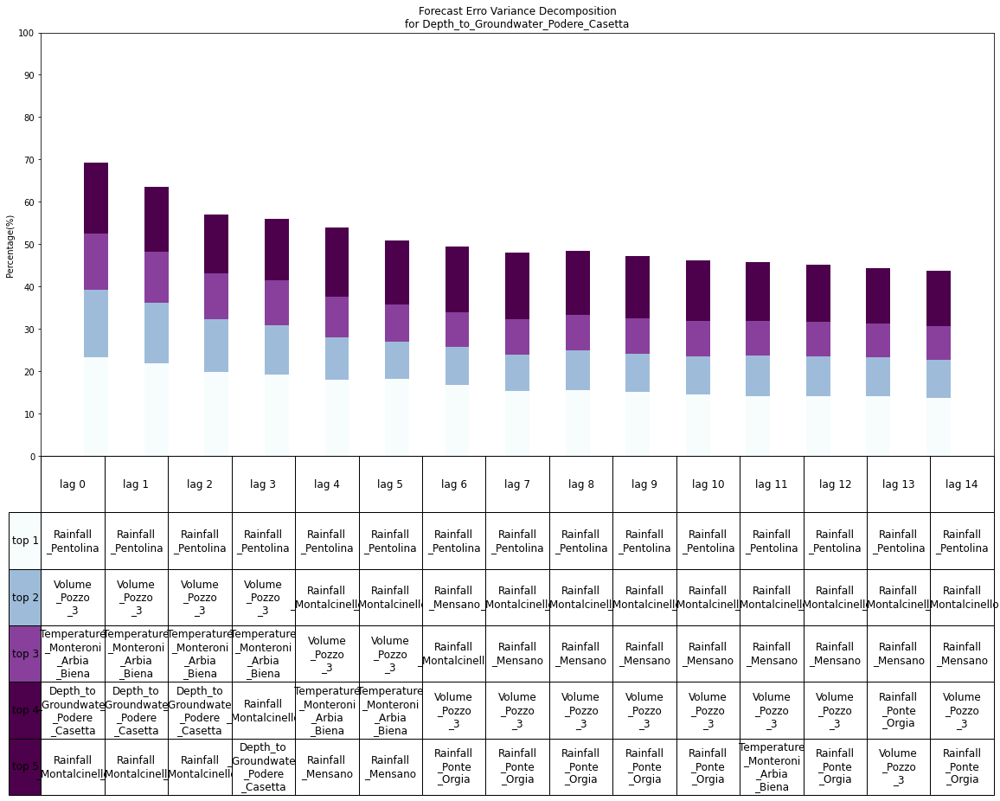

In [71]:
# FEVD Plot Analysis
varobj.fevd_plot(periods=15, top=5, figsize=(17, 10), max_str_split=3) 

We've implemented various setting of model and find that it is difficlut to conclude which one is the best: some performs the best on 1D when using rmse as the measure but it no longer is the best model when using mae measure.
At least we still can get some insights from these experiments.

Firstly, models created by summary features or PCA performs generally better on longer term predictions. Secondly, 
dropping features either via Granger or via PCA makes rmse/mae smaller, meaning that multiple features are reptead inforamtion or just a noise to confuse the model. Thirdly, smoothing all features except the target does the sub-optimal performance, indicating that this transformation doens't make the model learn daily pattern. Finally, `year_sin` genearlly doesn't improve performance, so the target doesn't possess a cycle pattern in testing data.

Since VAR model is linear and thus can only capture local linear prediction, we present LSTM as well trying to capture the possible non-linear relationship between target and features in the following.

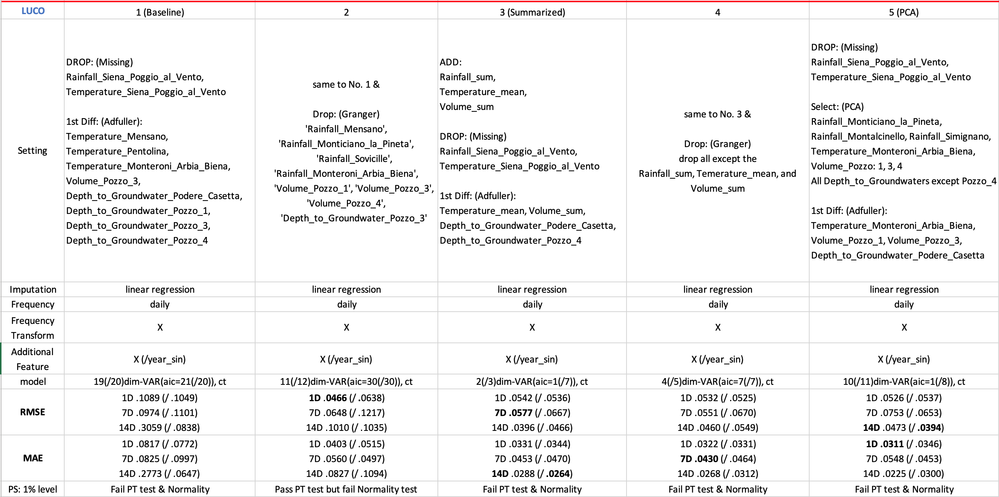

In [26]:
Image("/Users/mbpr/GitHub/Acea-Smart-Water-Analytics/image/luco1.png")

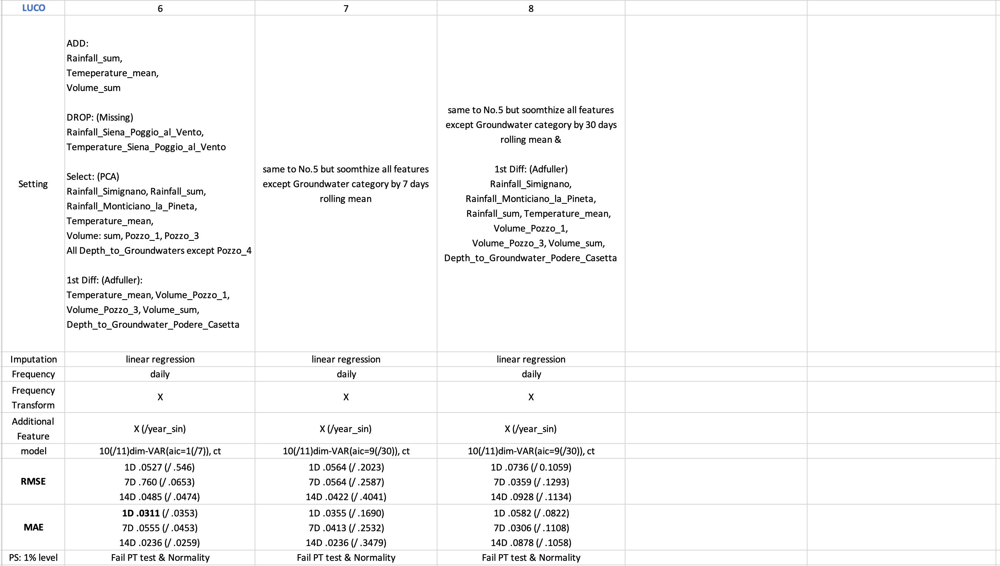

In [27]:
Image("/Users/mbpr/GitHub/Acea-Smart-Water-Analytics/image/luco2.png")

## Luco: Daily LSTM

LSTM model doesn't require data to be stationary but better scaled since tanh() is used by LSTM. We then use `MinMaxScaler()` to scale data into $[-1,1]$. One can also use alternative scaler such as `StandardScaler()` by simply changing the `approach='Standard'` in the scale function. `year_sin` is NOT included based on previous discussions of the VAR part.

Here we use the same lag as VAR to train the LSTM in order for 1D prediction performance comparison. The model can thus be futher fine tuned based on different lags together with other parameters, which we will omit here (by fixing lag=varlag) and focus only on the feature importance learned by the LSTM.

We didn't implement the LSTM model that predicts 7D/14D in a row since it's intuitive to directly predict on target features instead of predicting on all features and then feed the prediction to the model again, which is like the behaviour of VAR model.

Notice: due to the large lag(=20), the training/val/test sample sizes are small. Machine learning models usually require a huge amount of samples and thus may not perform well on small samples. Our goal here is to explore the important features to LSTM via the sensitivity analysis.

In [72]:
# Feature engineering & imputation
dfimputed = df.copy()
# Record nan positions before imputation
mask = df.isna()

# imputation
dfimputed = fillna(dfimputed, approach='interpolate')
assert dfimputed.isna().any().any() == False

## Reorder 
collector = []
for regex in orderlist: # in Sec 2.1.1
    collector.append(dfimputed.filter(regex=regex).columns)
dfimputed = dfimputed.reindex(columns= np.concatenate(collector) )

## so does mask
# mask['Temperature_mean'] = False
for col in df.columns.drop(dfimputed.columns, errors='ignore'): 
    mask.drop(columns=col, inplace=True)
assert mask.shape == dfimputed.shape, f'mask shape {mask.shape} doesn\'t match dfimputed shape {dfimputed.shape}'
mask = mask.reindex(columns=dfimputed.columns)
# print(dfimputed.shape, mask.shape)

# Deal with Time Periodicity 
# year = 365.2425
# dfimputedputed['year_sin'] = np.sin(dfimputed.index.dayofyear * 2 * np.pi / year)
# mask['year_sin'] = False

In [73]:
# Split data
N = dfimputed.shape[0]
train, val, test = dfimputed[:int(0.8*N)], dfimputed[int(0.8*N):int(0.9*N)], dfimputed[int(0.9*N):]
_, vmask, tmask = mask[:int(0.8*N)], mask[int(0.8*N):int(0.9*N)], mask[int(0.9*N):]
column_indices = {name: i for i, name in enumerate(train.columns)}
targets_indices = [column_indices[ta] for ta in [targets[0]]]

# Scaling and Normalization 
scaler, train_scaled, val_scaled, test_scaled = scale(train, val, test, approach='MinMax')
print('train/val/test shapes:', train_scaled.shape, val_scaled.shape, test_scaled.shape)

train/val/test shapes: (399, 19) (50, 19) (50, 19)


In [74]:
# Initialize data loader: 1-step-ahead prediction
## parameters setting
input_width = varlag     # suggested by VAR
label_width = 1       
shift = 1
batch_size = 1
## generate window
window = WindowGenerator(input_width, label_width, shift, train_scaled, val_scaled, test_scaled, 
                         batch_size=batch_size, shuffle=False, mask=tmask, 
                         label_columns=targets)
print(window)
print('Inputs/labels shapes of window: {} {}'.format(
    window.example[0].shape, window.example[1].shape))

Total window size: 21
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]
Label indices: [20]
shuffle: False
Label column name(s): ['Depth_to_Groundwater_Podere_Casetta']
Inputs/labels shapes of window: (1, 20, 19) (1, 1, 1)


evaluation before scaling back:
30/30 - 0s - loss: 0.0071 - root_mean_squared_error: 0.0843 - mean_absolute_error: 0.0647
evaluation after scaling back: root_mean_squared_error: 0.0464 - mean_absolute_error: 0.0356


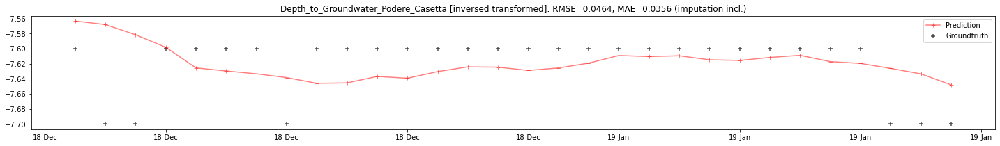

In [75]:
# 1-step-ahead LSTM prediction

lstm_model = None
if os.path.isfile(os.path.join(modelpath, 'luco.keras')):
    lstm_model = tf.keras.models.load_model(os.path.join(modelpath, 'luco.keras'))
else: 
    # ## Parameters setting:
    MAX_EPOCHS = 100
    patience = 10        # stop training if loss increase for 'patience' periods in total.
    lr_rate = 1e-3
    train_verbose = 0    # 0: no output, 1: progress, 2: report
    lstm_kernel = 16
    stateful = False     # batchsize must be 1 if True. (takes 10 mins)
    dropout = 0.2        # dropout rate in [0,1]

    ## fixed setting
    n_features = train_scaled.shape[1]
    n_out = len(targets)
    OUT_STEPS = window.label_width

    ## RNN: LSTM
    lstm_model = tf.keras.Sequential([
        # Shape [batch, time, features] => [batch, lstm_units]
        tf.keras.layers.LSTM(lstm_kernel, return_sequences=True, stateful=stateful),
        tf.keras.layers.Dropout(dropout),
        tf.keras.layers.LSTM(int(lstm_kernel/2), return_sequences=False, stateful=stateful),
        # Shape => [batch, out_steps*features]
        tf.keras.layers.Dropout(dropout),
        tf.keras.layers.Dense(OUT_STEPS*n_out),
        # Shape => [batch, out_steps, features]
        tf.keras.layers.Reshape([OUT_STEPS, n_out])
    ])
    ## compile and fit
    print('window RNN')
    print('Xtrain shape: ', window.example[0].shape, 'ytrain shape: ', window.example[1].shape, end='')
    print('\toutput shape: ', lstm_model(window.example[0]).shape, end='\n\n')
    history = compile_and_fit(lstm_model, window, MAX_EPOCHS, patience, lr_rate, verbose=train_verbose)
    ## save model
    lstm_model.save(os.path.join(modelpath, 'luco.keras'), overwrite=False)
    
## evaluate on test
print('evaluation before scaling back:')
lstm_model.evaluate(window.test, verbose=2, return_dict=True)

## inverse_transform_evaluate on test
di = window.inverse_transform_evaluate(lstm_model, scaler, which='test', return_dict=True)
print('evaluation after scaling back: {0}: {2:6.4f} - {1}: {3:6.4f}'.format(*di.keys(), *di.values()))
window.plot(use_mask=False, figsize=(20, 3))

We use the sensitivity analysis to determine the feature importance, that is, when perturbing a particular feature based on testing data, given the values of the other feature unchanged, how much will rmse change by comparing the prediction before and after perturbation. A feature is more important if the larger the rmse is.

In the figure below we find that **Temperature_Monteroni_Arbia_Biena, Depth_to_Groundwater_Pozzo_4, and Depth_to_Groundwater_Pozzo_3** etc. are important features to LSTM. We summarize the comparison of important features in the next section.

It's worth to notice that the LSTM model takes very different featuers imporance into account comapred to VAR model. Due to the mass missing and difficulty of this dataset, we probably have non-linear pattern so VAR models may not perform well; and we have limited data available to train LSTM so that LSTM model result may not be reliable as well. We thus present all results but do not conclude which features are indeed important confirmed by both models.


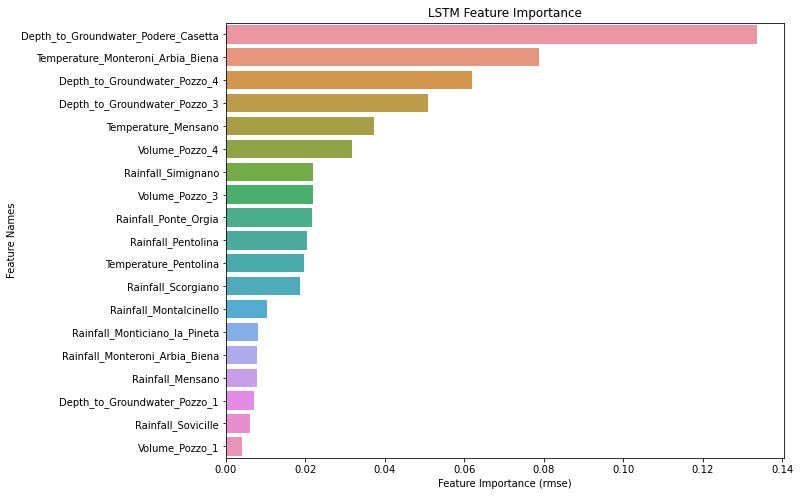

In [76]:
# LSTM feature importance plot
importance, direction = feature_importance(lstm_model, window.X_test, scale=0.2, method='const')
feature_importance_plot(importance, names=train_scaled.columns)

## Summary

We summarize here what we've gotten from the above analysis <br/>
Target feature: Depth_to_Groundwater_Podere_Casetta <br/>
Testing size: 50.

Most important Features: <br/>
From the VAR model: 1D/7D/14D RMSE - .0466/.0577/.0394 (inverse transformd)
 - Rainfall_Pentolina, Volume_Pozzo_3, Rainfall_Montalcinello, Temperature_Monteroni_Arbia_Biena, and Rainfall_Mensano

From the LSTM model: 1D RMSE - 0.0464 (inverse transformed and includes imputed values)
 - (Depth_to_Groundwater_Podere_Casetta), 
 - (Temperature_Monteroni_Arbia_Biena, Depth_to_Groundwater_Pozzo_4, and Depth_to_Groundwater_Pozzo_3)

Common important features: 
 - Inconclusive (see the previouse comment)


# Aquifer Petrignano

## Data Cleansing

The Aquifer Petrignano dataset only contains, as shown below, missing values before 2009-01-01 and in between 2015-04-25 and 2015-09-21. We drop the massing missing part before 2009-01-01 and impute the rest with simple linear interpolation in the next section.

A first glance at correlation triangle plot shows that our target features *Depth_to_Groundwater_P24 & _P25* are perfect correlated with each other and some what correlated with *Volume_C10_Petrignano* and *Hydrometry_Fiume_Chiascio_Petrignano*. It's unclear whether target features possess a yearly pattern so we will try to explore it.

Mask on missing/imputed data is used in order to get more accurate rmse/mae performance of models.

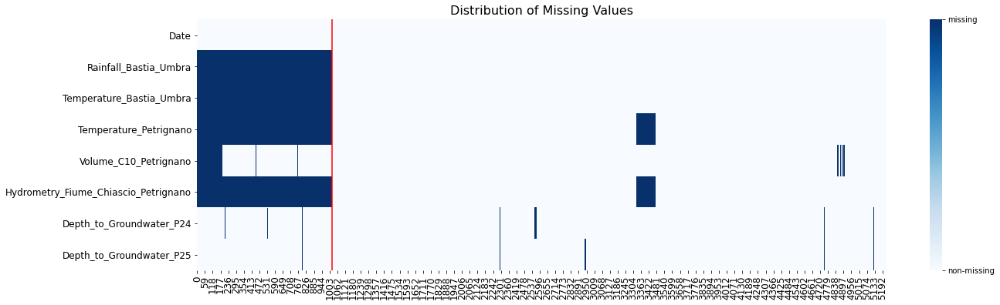

In [77]:
# parameters setting
dataset = 'Aquifer_Petrignano.csv'
targets = ['Depth_to_Groundwater_P24', 'Depth_to_Groundwater_P25']

# read dataset as DataFrame
dateparse = lambda x: datetime.strptime(x, '%d/%m/%Y')
df = pd.read_csv(os.path.join(datapath, dataset), index_col='Date', parse_dates=['Date'], date_parser=dateparse)

# re-order features
orderlist = ['Rain.*', 'Temp.*', 'Volume.*', 'Hydrom.*', 'Depth.*']
collector = []
for regex in orderlist: 
    collector.append(df.filter(regex=regex).columns)
df = df.reindex(columns= np.concatenate(collector) )

# define frequency and sort accordingly.
df.index.freq = 'd'
df.sort_index(inplace=True)

# Set weird values to nan
## set nan to Groundwater whose values are 0
df.loc['2015-04-25':'2016-01-01', 'Temperature_Petrignano'].replace(0, np.nan, inplace=True)
df.Volume_C10_Petrignano.replace(0, np.nan, inplace=True)
df.Hydrometry_Fiume_Chiascio_Petrignano.replace(0, np.nan, inplace=True)

# visual graph of nan locations for each field
missingval_plot(df, show=False)
plt.axvline(x = 1024, c='r') # 2009-01-11
plt.show()

# mass missing till 2018-12-31 (included) and small missing in betwwen 2015-04-25 & 2015-09-21

In [78]:
# Dealing with missing values
todrop = df[df['Rainfall_Bastia_Umbra'].isna()].index.max()
df = df[df.index > todrop]


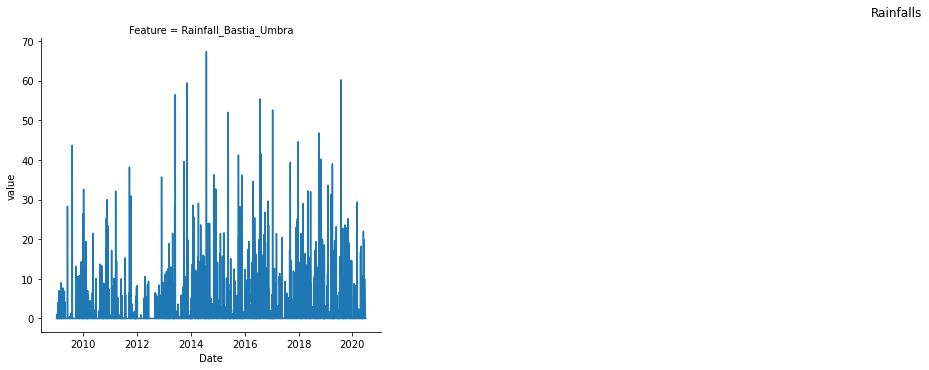

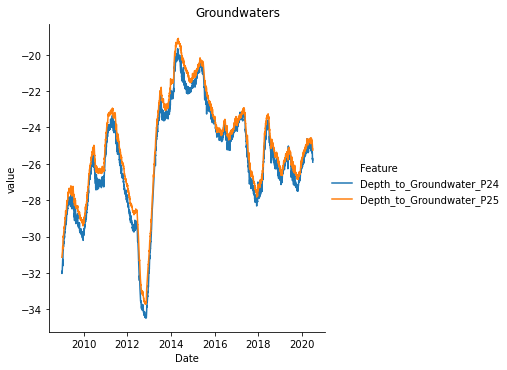

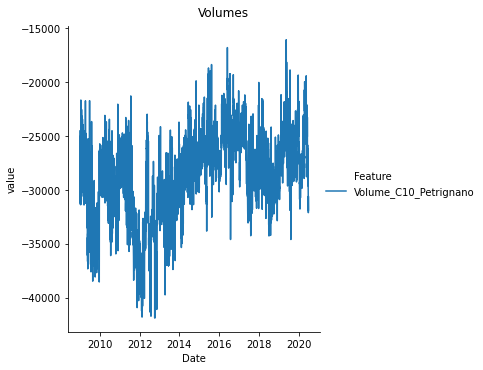

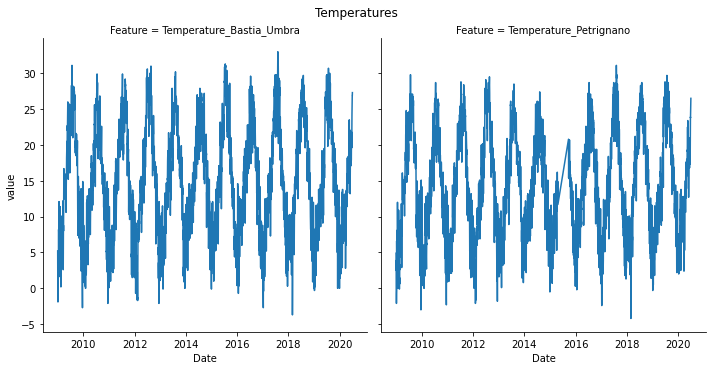

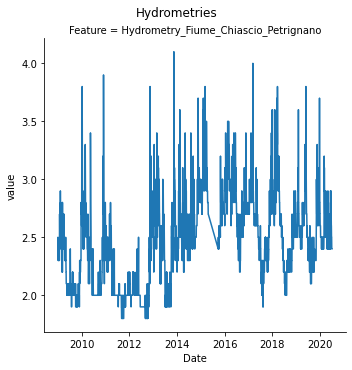

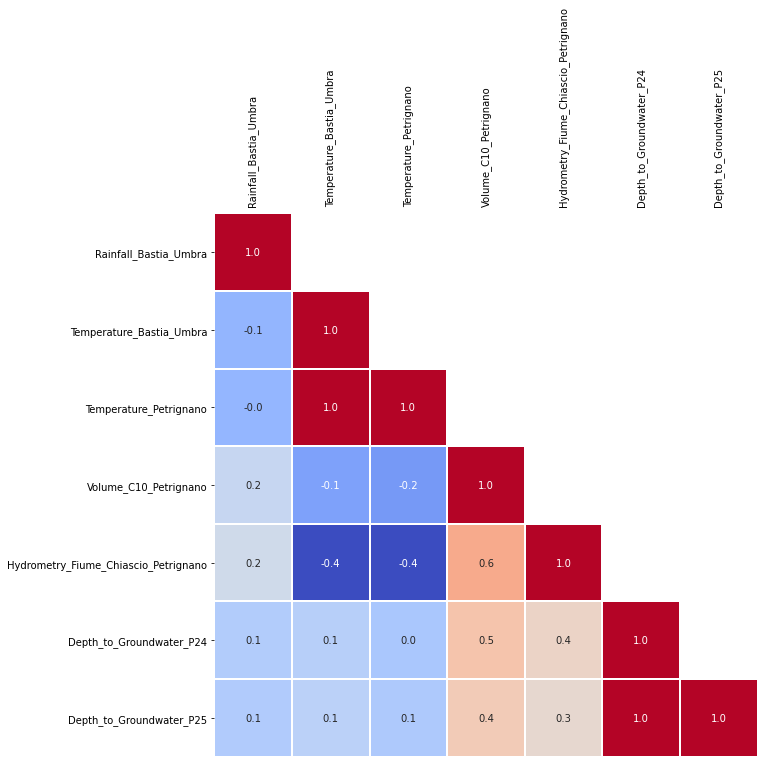

In [79]:
# correlation plot
feature_plots(df)
corrtri_plot(df)

## Petrignano: Daily VAR

We present the baseline model here which includes all features without further engineering but being stationary. The target features are first differenced and all features pass the Granger test at 5% level of lag=15 (chosen by later VAR model). 

Notice that the model we're **presenting here is not the best** model, but helps us on OIR analysis, further feature selection, and finally the best model is created. It is created by selecting the important features via OIR plots, dropping features via PCA and first differencing on target features, which will be reported at the end of this section.

In [80]:
# Feature engineering & imputation
dfimputed = df.copy()
# Record nan positions before imputation
mask = df.isna()

# imputation
dfimputed = fillna(dfimputed, approach='interpolate')
assert dfimputed.isna().any().any() == False

## Engineer 1
# tmp = dfimputed.filter(regex='Temp.*').columns
# dfimputed['Temperature_mean'] = dfimputed[tmp].mean(axis=1)
# dfimputed.drop(columns=tmp, inplace=True)

# tmp = ['Hydrometry_Fiume_Chiascio_Petrignano']
# dfimputed[tmp] = replace_outliers(dfimputed[tmp], window=7, k=1, method='mean')

# tmp = ['Volume_C10_Petrignano']
# dfimputed[tmp] = replace_outliers(dfimputed[tmp], window=7, k=1, method='mean')

## Engineer 2: rolling
# tmp = dfimputed.filter(regex='Rain.*').columns
# dfimputed[tmp] = dfimputed[tmp].rolling(30).agg('sum')
# tmp = dfimputed.filter(regex='Vol.*').columns
# dfimputed[tmp] = dfimputed[tmp].rolling(30).agg('mean')
# tmp = dfimputed.filter(regex='Temp.*').columns
# dfimputed[tmp] = dfimputed[tmp].rolling(30).agg('mean')
# tmp = dfimputed.filter(regex='Hydro.*').columns
# dfimputed[tmp] = dfimputed[tmp].rolling(30).agg('mean')
# dfimputed.dropna(inplace=True)

## pca 
# pca_plot(dfimputed.filter(regex='Temp.*')  )

## Dorp due to pca
# dfimputed.drop(columns='Temperature_Petrignano', inplace=True)
# dfimputed.drop(columns='Depth_to_Groundwater_P25', inplace=True)

## Reorder 
collector = []
for regex in orderlist: # in Sec 2.1.1
    collector.append(dfimputed.filter(regex=regex).columns)
dfimputed = dfimputed.reindex(columns= np.concatenate(collector) )

## so does mask
# mask['Temperature_mean'] = False
# mask = mask[29:]
for col in df.columns.drop(dfimputed.columns, errors='ignore'): 
    mask.drop(columns=col, inplace=True)
assert mask.shape == dfimputed.shape, f'mask shape {mask.shape} doesn\'t match dfimputed shape {dfimputed.shape}'
mask = mask.reindex(columns=dfimputed.columns)

In [81]:
# Chekc stationarity
## adftest
adftable = adfuller_table(dfimputed, verbose=False, alpha=0.05, maxlag=16, regression='ct')
# display(adftable)

## collect non-stationary features
I1 = adftable[adftable['AIC_5%level'] == False].index.values
print('Differenced features: ', I1)

## (Cont'd) take diff() on cols that do not pass the adftest. Here we adopt AIC.
dfstationary = dfimputed.copy()
dfstationary.loc[:,I1] = dfstationary[I1].diff()
dfstationary.dropna(inplace=True)

## adftest again
adftable = adfuller_table(dfstationary, verbose=False, maxlag=16, regression='ct')
# display(adftable) # This time all features pass ADF test in both AIC and BIC criteria.

Differenced features:  ['Depth_to_Groundwater_P24' 'Depth_to_Groundwater_P25']


In [82]:
# Check granger causality
grtable = grangers_causation_table(dfstationary, xnames=dfimputed.columns.drop(labels=targets), 
                          ynames=targets, maxlag=15 ,alpha=0.05)
display(grtable)

,Depth_to_Groundwater_P24_y,Depth_to_Groundwater_P25_y
Granger Causation Table alpha=0.05,,
Rainfall_Bastia_Umbra_x,True,True
Temperature_Bastia_Umbra_x,True,True
Temperature_Petrignano_x,True,True
Volume_C10_Petrignano_x,True,True
Hydrometry_Fiume_Chiascio_Petrignano_x,True,True


We add `year_sin` feature in to check if model can learn better pattern to predict targets. Models that don't include this feature are also reported at the end of this section. 

The baseline model passes the Durbin Watson Test, meaning that there is no significant (5%) serial correlation in residual of each feature. But it doesn't pass the Portmanteau test, indicating that residual autocorrelatios exists somewhere whit the first 60 lags. It either means that noises are large or the true relationship between features is non-linear. Later we also provide LSTM to check performance.

Failing to pass normality test means that asymptotic standard errors are no longer valid and bootstrapping method such as Efron's or Hall's confidence interval should be used instead when checking impulse response.

In [83]:
# Deal with Time Periodicity 
year = 365.2425
dfstationary['year_sin'] = np.sin(dfstationary.index.dayofyear * 2 * np.pi / year)
mask['year_sin'] = False

In [84]:
# Split data
N = dfstationary.shape[0]
train, val, test = dfstationary[:int(0.8*N)], dfstationary[int(0.8*N):int(0.9*N)], dfstationary[int(0.9*N):]
_, vmask, tmask = mask[:int(0.8*N)], mask[int(0.8*N):int(0.9*N)], mask[int(0.9*N):]
column_indices = {name: i for i, name in enumerate(train.columns)}
targets_indices = [column_indices[ta] for ta in [targets[0]]]

# Scaling and Normalization 
# normalization won't make sense if the TS is trending upward/downward. This is why stationary first.
scaler, train_scaled, val_scaled, test_scaled = scale(train, val, test, approach='MinMax')
print('train/val/test shapes:', train_scaled.shape, val_scaled.shape, test_scaled.shape)

train/val/test shapes: (3358, 8) (420, 8) (420, 8)


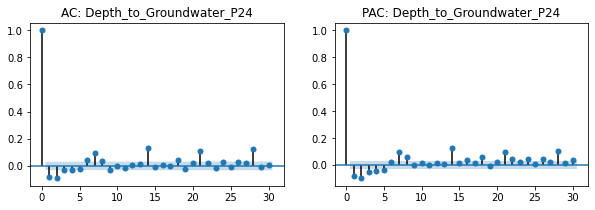

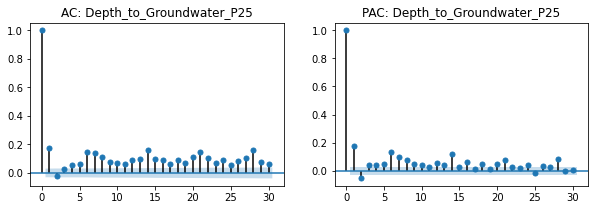

In [85]:
# Get sense: ac & pac plots
acpac_plot(dfstationary[targets], figsize=(10, 3))

In [86]:
# VAR model 
var_model = VAR(endog=train.append(val))
res = var_model.select_order(maxlags=37, trend='ct')
print(res.selected_orders)
varlag = res.selected_orders['aic']
var_model = var_model.fit(varlag)
# put result into self-defined class
varobj = VARresults(var_model, test, mask=tmask[1:] , label_columns=targets) #[1:]
print('The model we are using: {1:}-dim VAR({0:}).'.format(*varobj.model.coefs.shape[:2]))

{'aic': 15, 'bic': 4, 'hqic': 6, 'fpe': 15}
The model we are using: 8-dim VAR(15).


In [87]:
# Durbin_watson test of residuals
print('Durbin-Watson test:')
_ = varobj.durbin_watson_test()
# comment: all values are near 2 => no significant serial correlation in the residual.

Durbin-Watson test:
Rainfall_Bastia_Umbra           :   2.00
Temperature_Bastia_Umbra        :   2.00
Temperature_Petrignano          :   2.00
Volume_C10_Petrignano           :   2.00
Hydrometry_Fiume_Chiascio_Petrignano:   2.00
Depth_to_Groundwater_P24        :   2.00
Depth_to_Groundwater_P25        :   2.00
year_sin                        :   2.01


Test statistic,Critical value,p-value,df
3429.,3006.,0.000,2880


Test statistic,Critical value,p-value,df
1.091e+08,26.30,0.000,16


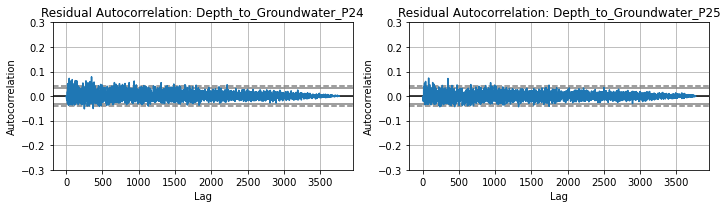

In [88]:
# Adjusted Portmannteau-test & S-K test
display(var_model.test_whiteness(nlags=varlag*4, signif=0.05, adjusted=True).summary())
display(varobj.model.test_normality().summary())
# Residual Autocorrelations
varobj.residac_plot(cols=targets, figsize=(15, 3))

The 1D prediction of baseline is good but not the 7D/14D predictions. Prediction errors are roughly the same for both features.

uniform rmse:   0.1016
uniform mae:   0.0741


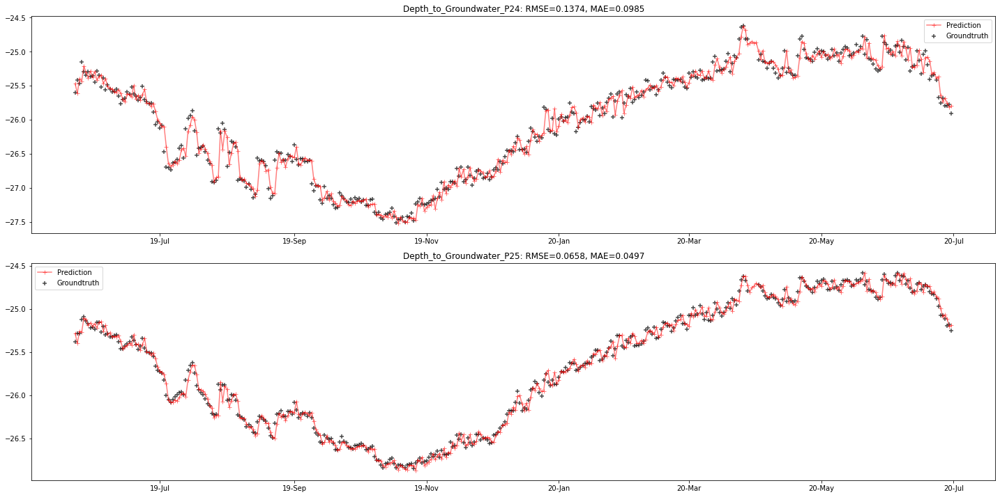

In [89]:
# 1-step-ahead Prediction
## paramters setting:
steps=1
mode = 'normal'
use_mask = True
multioutput = 'raw_values' 
## after trransformation
rmse, mae = varobj.inverse_transform_evaluate(
    I1, dfimputed, steps=steps, mode=mode, multioutput=multioutput, use_mask=use_mask)
print('uniform rmse: {:8.4f}'.format(rmse.mean()))
print('uniform mae: {:8.4f}'.format(mae.mean()))

## plot
varobj.plot(use_mask=True, figsize=(20, 10))

uniform rmse with 7 step:   0.3035
uniform mae with 7 step:   0.2953


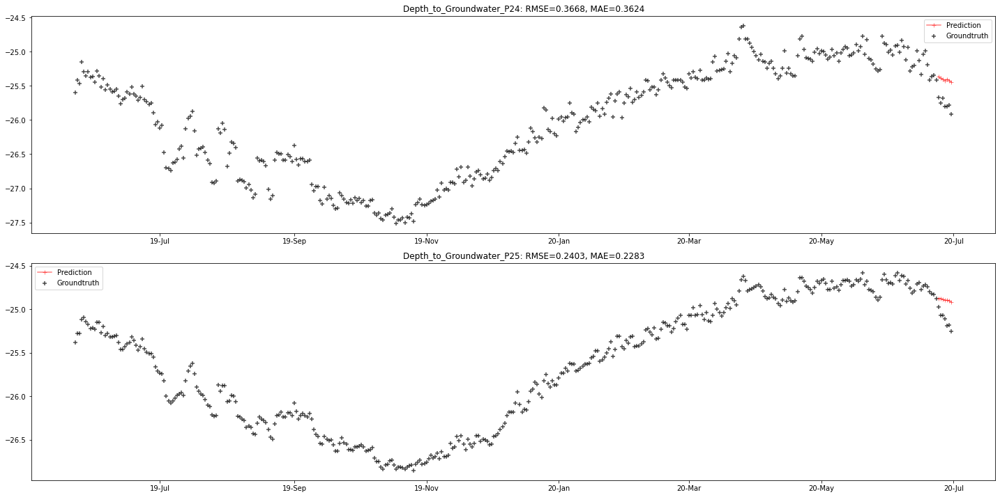

uniform rmse with 14 step:   0.2739
uniform mae with 14 step:   0.2309


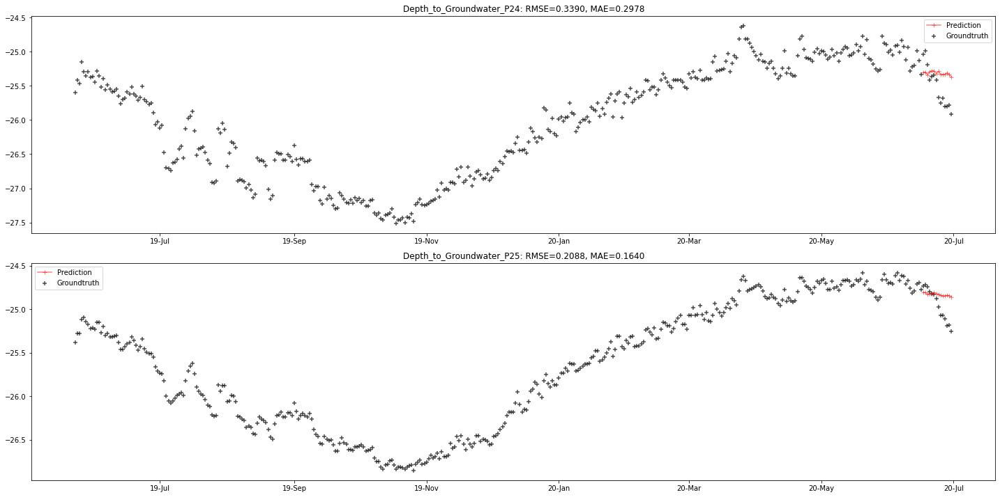

In [90]:
# Last Prediction
## paramters setting:
steps=[7, 14]
mode = 'last'
use_mask = False
multioutput = 'raw_values' 
for step in steps: 
    ## prediction
    rmse, mae = varobj.inverse_transform_evaluate(I1, dfimputed,steps=step, mode=mode, 
                                                  multioutput=multioutput, use_mask=use_mask)
    print('uniform rmse with {:>} step: {:8.4f}'.format(step, rmse.mean() ))
    print('uniform mae with {:>} step: {:8.4f}'.format(step, mae.mean() ))
    ## plot
    varobj.plot(use_mask=use_mask, figsize=(20, 10))

Since forecast error impulse response (FEIR) only analyzes shock occuring in one variable at a time, contemporaneous correlation of error terms cannot be captured by it. We then use orthogonalized impulse response (OIR) to solve this issue, which rely on stronger assumption and thus the order of features in model matters. Besides, the Hall's confidence interval is used since it usually has bias corrected effect compared to Efron.

The feature order we choose is **Rainfall $\rightarrow$ Temperature $\rightarrow$ Volumes $\rightarrow$ Hydrometries $\rightarrow$ Depth_to_Groundwaters**. 

Actually, the order between rainfall and temperature can be reversed since they affect each other. Depth_to_Groundwaters is put at the end because we want to see how the other features affect the targets. Volumes (the amount taken from the dinking water treatment plant) clearly affects Hydrometries, so volumes are put before hydrometries.

The meaning of OIR is to see whether one standard deviation shock to x causes significant (increase/decrease standard deviation) response in y for m periods. We show response of the first target feature only since the two targets are perfectly correlated with each other and the level patterns in data are the same. 

We find that in the OIR plot the *Volume_C10_Petrignano* shock causees significant positive response to our *Depth_to_Groundwaters* at lag 0. This makes sense since less water taken from plant (note: Volume is negative, so one positive shock to volume means less water taken) results in more groundwaters. Notice that the volume feature also causes significant positive response to *Hydrometry_Flume_Chiascio_Petrignano* (but not the other features). 

The feature *Temperature_Bastia_Umbra* also causes significant NEGATIVE response to the target features since higher temperatures vaporizes groundwaters quicker. *ainfall_Bastia_Umbra* also has some positive effect on groundwaters.


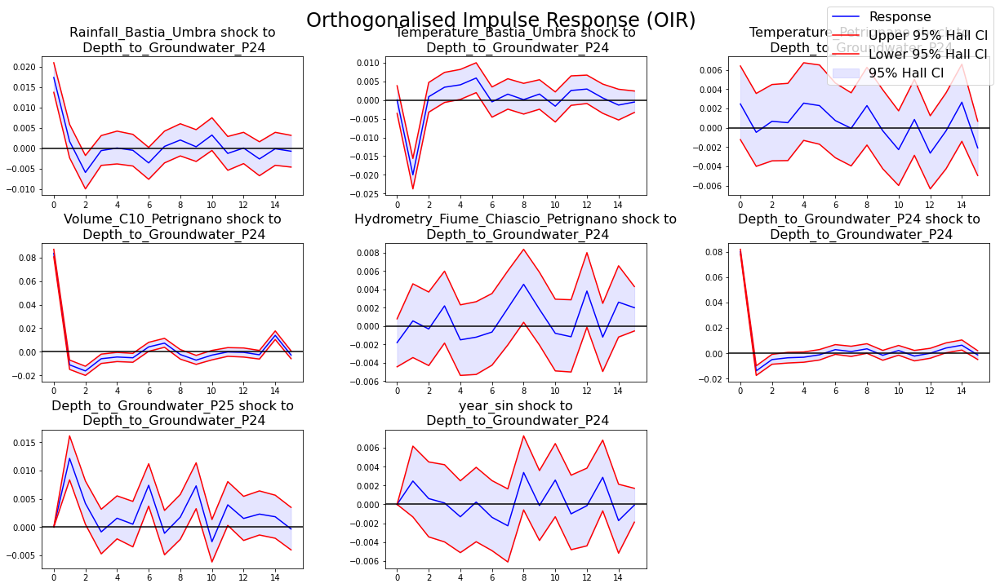

In [91]:
# OIR Plot Analysis
varobj.irplot(impulse=train.columns, periods=15, response=targets[0], orth=True,
             figsize=(17,10), method='hall')

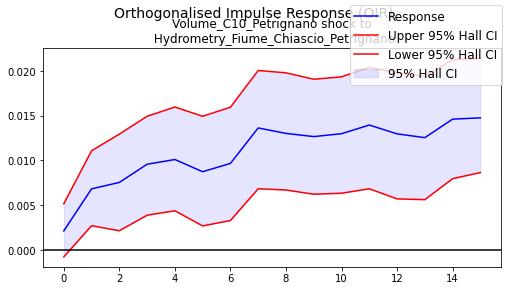

In [92]:
# OIR Plot Analysis
varobj.irplot(impulse=['Volume_C10_Petrignano'], periods=15, 
              response=['Hydrometry_Fiume_Chiascio_Petrignano'], orth=True, supfontsize=14, fontsize=12,
              figsize=(7,4), method='hall')

The FEVD plot is shown below. It illustrates which (orthogonised) feature shocks contribute to the error variance of our target features in different lags. 

Both target features have similar pattern in FEVD plots. The top 3 features excluding the *Depth_to_Groundwater_P24/P25* itself are *Volume_C10_Petrignano, Temperature_Bastia_Umbra, and Rainfall_Bastia_Umbra*, which contribute to roughtly 30%-50%, 30%-50%, and 2%-5% of the error variance in later periods, respectively. The fifth important feature is ignored due to too small contributions.

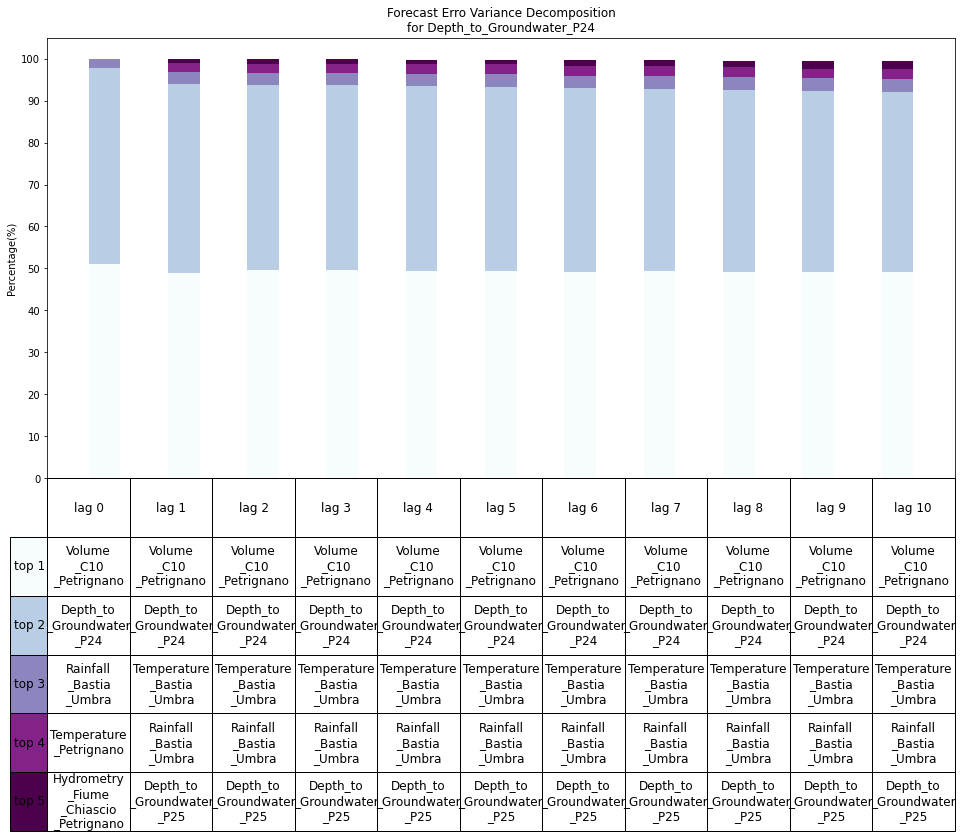

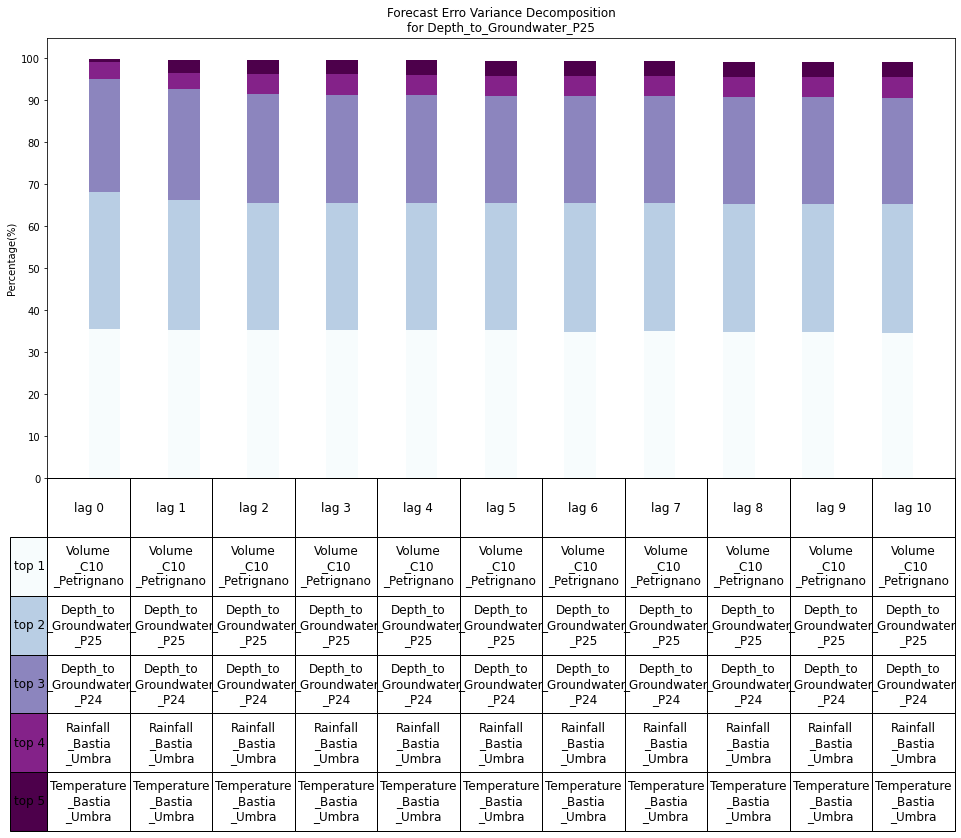

In [93]:
# FEVD Plot Analysis 
varobj.fevd_plot(periods=11, top=5, figsize=(14, 9), max_str_split=3) 

We've implemented various setting of model and find that experiment **No.3 performs the best** on 1D/7D/14D predictions. The model No.3 is created by selecting features via OIR of baseline (No.1 model) and then dropping unnecessary features via PCA. First difference on targets features are still required to make data stationary.

`year_sin` helps improve longer term prediction but not on 1D prediction, and smoothing all features except targets via rolling mean on both window=7, 30 are not helpful here. All the models here fail the Portmanteau test. This is probably why VAR model prefers predicting a long term trend instead of jumps in the prediction figures.

Since VAR model is linear and thus can only capture local linear prediction, we present LSTM as well trying to capture the possible non-linear relationship between target and features in the following.

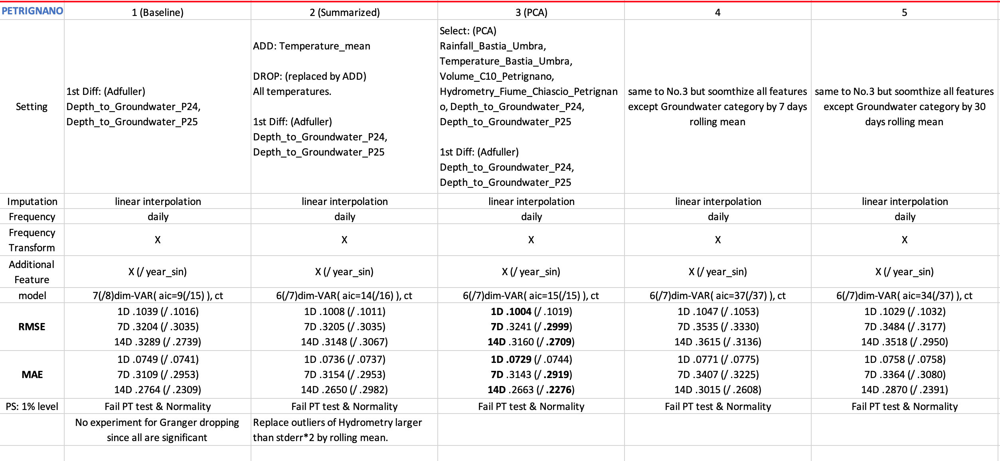

In [28]:
Image("/Users/mbpr/GitHub/Acea-Smart-Water-Analytics/image/petrignano.png")

## Petrignano: Daily LSTM

LSTM model doesn't require data to be stationary but better scaled since tanh() is used by LSTM. We then use `MinMaxScaler()` to scale data into $[-1,1]$. One can also use alternative scaler such as `StandardScaler()` by simply changing the `approach='Standard'` in the scale function. `year_sin` is also included to make model learn the yearly pattern better. 

Here we use the same lag as VAR to train the LSTM in order for 1D prediction performance comparison. The model can thus be futher fine tuned based on different lags together with other parameters, which we will omit here (by fixing lag=varlag) and focus only on the feature importance learned by the LSTM.

We didn't implement the LSTM model that predicts 7D/14D in a row since it's intuitive to directly predict on target features instead of predicting on all features and then feed the prediction to the model again, which is like the behaviour of VAR model.

In [94]:
# Feature engineering & imputation
dfimputed = df.copy()
# Record nan positions before imputation
mask = df.isna()

# imputation
dfimputed = fillna(dfimputed, approach='interpolate')
assert dfimputed.isna().any().any() == False

## Reorder 
collector = []
for regex in orderlist: # in Sec 2.1.1
    collector.append(dfimputed.filter(regex=regex).columns)
dfimputed = dfimputed.reindex(columns= np.concatenate(collector) )

## so does mask
# mask['Temperature_mean'] = False
for col in df.columns.drop(dfimputed.columns, errors='ignore'): 
    mask.drop(columns=col, inplace=True)
assert mask.shape == dfimputed.shape, f'mask shape {mask.shape} doesn\'t match dfimputed shape {dfimputed.shape}'
mask = mask.reindex(columns=dfimputed.columns)
# print(dfimputed.shape, mask.shape)

# Deal with Time Periodicity 
year = 365.2425
dfimputed['year_sin'] = np.sin(dfimputed.index.dayofyear * 2 * np.pi / year)
mask['year_sin'] = False

In [95]:
# Split data
N = dfimputed.shape[0]
train, val, test = dfimputed[:int(0.8*N)], dfimputed[int(0.8*N):int(0.9*N)], dfimputed[int(0.9*N):]
_, vmask, tmask = mask[:int(0.8*N)], mask[int(0.8*N):int(0.9*N)], mask[int(0.9*N):]
column_indices = {name: i for i, name in enumerate(train.columns)}
targets_indices = [column_indices[ta] for ta in [targets[0]]]

# Scaling and Normalization 
scaler, train_scaled, val_scaled, test_scaled = scale(train, val, test, approach='MinMax')
print('train/val/test shapes:', train_scaled.shape, val_scaled.shape, test_scaled.shape)

train/val/test shapes: (3359, 8) (420, 8) (420, 8)


In [96]:
# Initialize data loader: 1-step-ahead prediction
## parameters setting
input_width = varlag     # suggested by VAR
label_width = 1       
shift = 1
batch_size = 2

## generate window
window = WindowGenerator(input_width, label_width, shift, train_scaled, val_scaled, test_scaled, 
                         batch_size=batch_size, shuffle=False, mask=tmask, 
                         label_columns=targets)
print(window)
print('Inputs/labels shapes of window: {} {}'.format(
    window.example[0].shape, window.example[1].shape))

Total window size: 16
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14]
Label indices: [15]
shuffle: False
Label column name(s): ['Depth_to_Groundwater_P24', 'Depth_to_Groundwater_P25']
Inputs/labels shapes of window: (2, 15, 8) (2, 1, 2)


evaluation before scaling back:
203/203 - 1s - loss: 0.0010 - root_mean_squared_error: 0.0319 - mean_absolute_error: 0.0256
evaluation after scaling back: root_mean_squared_error: 0.2346 - mean_absolute_error: 0.1884


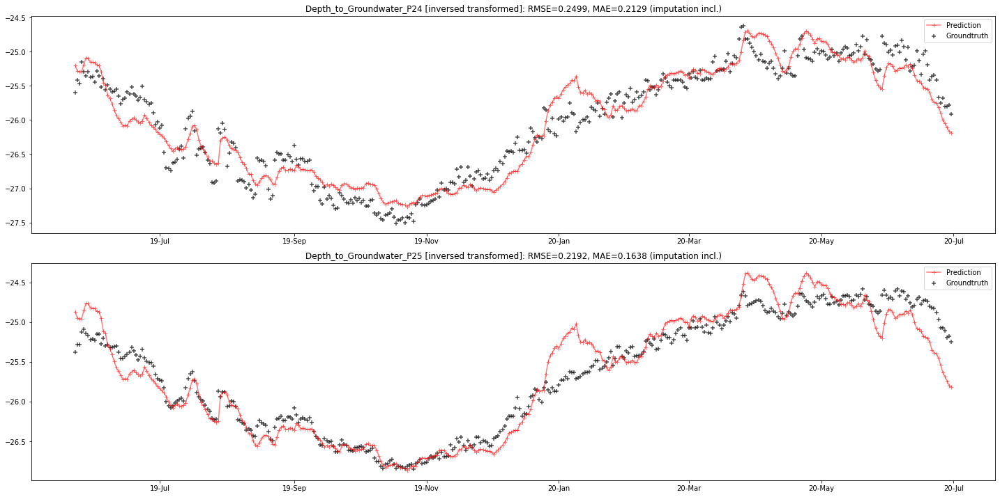

In [97]:
# 1-step-ahead LSTM prediction

lstm_model = None
if os.path.isfile(os.path.join(modelpath, 'petrignano.keras')):
    lstm_model = tf.keras.models.load_model(os.path.join(modelpath, 'petrignano.keras'))
else: 
    # ## Parameters setting:
    MAX_EPOCHS = 100
    patience = 10        # stop training if loss increase for 'patience' periods in total.
    lr_rate = 1e-3
    train_verbose = 0    # 0: no output, 1: progress, 2: report
    lstm_kernel = 16
    stateful = False     # batchsize must be 1 if True. (takes 10 mins)
    dropout = 0.2        # dropout rate in [0,1]

    ## fixed setting
    n_features = train_scaled.shape[1]
    n_out = len(targets)
    OUT_STEPS = window.label_width

    ## RNN: LSTM
    lstm_model = tf.keras.Sequential([
        # Shape [batch, time, features] => [batch, lstm_units]
        tf.keras.layers.LSTM(lstm_kernel, return_sequences=True, stateful=stateful),
        tf.keras.layers.Dropout(dropout),
        tf.keras.layers.LSTM(int(lstm_kernel/2), return_sequences=False, stateful=stateful),
        # Shape => [batch, out_steps*features]
        tf.keras.layers.Dropout(dropout),
        tf.keras.layers.Dense(OUT_STEPS*n_out),
        # Shape => [batch, out_steps, features]
        tf.keras.layers.Reshape([OUT_STEPS, n_out])
    ])
    ## compile and fit
    print('window RNN')
    print('Xtrain shape: ', window.example[0].shape, 'ytrain shape: ', window.example[1].shape, end='')
    print('\toutput shape: ', lstm_model(window.example[0]).shape, end='\n\n')
    history = compile_and_fit(lstm_model, window, MAX_EPOCHS, patience, lr_rate, verbose=train_verbose)
    ## save model
    lstm_model.save(os.path.join(modelpath, 'petrignano.keras'), overwrite=False)
    
## evaluate on test
print('evaluation before scaling back:')
lstm_model.evaluate(window.test, verbose=2, return_dict=True)
#window.plot(lstm_model, use_mask=True)

## inverse_transform_evaluate on test
di = window.inverse_transform_evaluate(lstm_model, scaler, which='test', return_dict=True)
print('evaluation after scaling back: {0}: {2:6.4f} - {1}: {3:6.4f}'.format(*di.keys(), *di.values()))
window.plot(use_mask=False, figsize=(20, 10))

We use the sensitivity analysis to determine the feature importance, that is, when perturbing a particular feature based on testing data, given the values of the other feature unchanged, how much will rmse change by comparing the prediction before and after perturbation. A feature is more important if the larger the rmse is.

In the figure below we find that *Flow_Rate*, *Temperature_Le_Croci*, and 'Rainfall_Mangona' etc. are important features to LSTM. We summarize the comparison of important features in the next section.

We conclude that besides target features, all rainfalls except Cavallina and S_Agata important feature to LSTM when predicting Lake_Level and Flow_Rate.

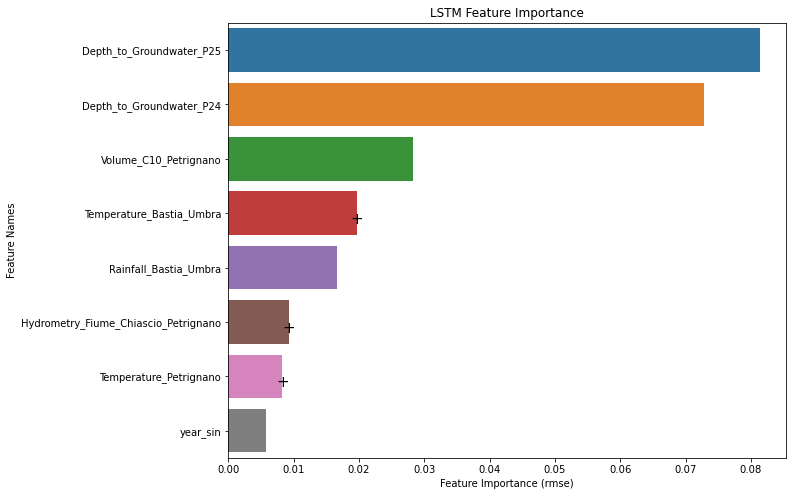

In [98]:
# LSTM feature importance plot
importance, direction = feature_importance(lstm_model, window.X_test, scale=0.2, method='const')
feature_importance_plot(importance, direction, names=train_scaled.columns)

## Summary

We summarize here what we've gotten from the above analysis.<br/>
Target feature: Flow_Rate, Lake_Level.<br/>
Testing size: 238.

Most important Features:<br/>
From the VAR model: 1D/7D/14D RMSE - 0.1004/0.2999/0.2709 (inverse transformd)
 - For Depth_to_Groundwater_P24: Volume_C10_Petrignano, Temperature_Bastia_Umbra, and Rainfall_Bastia_Umbra
 - For Depth_to_Groundwater_P25: same

From the LSTM model: 1D RMSE - 0.2346 (inverse transformed and includes imputed values)
 - (Depth_to_Groundwater_P24, Depth_to_Groundwater_P25), 
 - (Volume_C10_Petrignano, Temperature_Bastia_Umbra, and Rainfall_Bastia_Umbra)

Common important features: 
 - For Depth_to_Groundwater_P24: Volume_C10_Petrignano, Temperature_Bastia_Umbra, and Rainfall_Bastia_Umbra
 - For Depth_to_Groundwater_P25: same

# Lake Bilancino

## Data Cleansing

The Lake Bilancino dataset only contains missing value till 2004-01-01, so we drop them and focus on data during 2004-01-02 - 2020-06-30. A first glance at correlation triangle plot shows that our target features *Flow_Rate* and *Lake_Level* seems have no correlation with the other features. Fourier plot indicates both features have a yearly frequency. We will explore more feature engineering in the next session. Notice that we didn't use mask here to correct rmse/mae performance since no missing value needs to be imputed in the data after 2004-01-02.

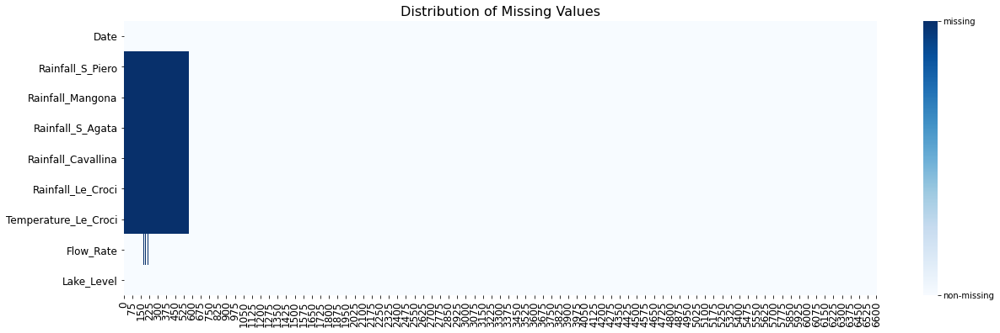

In [99]:
# parameters setting
dataset = 'Lake_Bilancino.csv'
targets = ['Flow_Rate', 'Lake_Level']

# read dataset as DataFrame
dateparse = lambda x: datetime.strptime(x, '%d/%m/%Y')
df = pd.read_csv(os.path.join(datapath, dataset), index_col='Date', parse_dates=['Date'], date_parser=dateparse)

# re-order features
orderlist = ['Rain.*', 'Temp.*', *targets]
collector = []
for regex in orderlist: 
    collector.append(df.filter(regex=regex).columns)
df = df.reindex(columns= np.concatenate(collector) )

# define frequency and sort accordingly.
df.index.freq = 'd'
df.sort_index(inplace=True)

# Set weird values to nan
# visual graph of nan locations for each field
missingval_plot(df,show=False)
# mass missing till 2004-01-01 (included)

In [100]:
# Dealing with missing values
df = df['2004-01-02':]
# no mask since no missing data after 2014-01-02

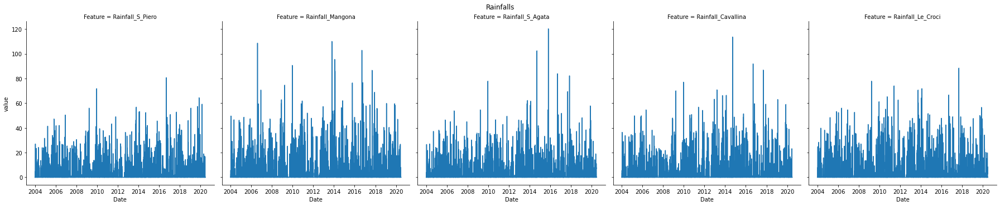

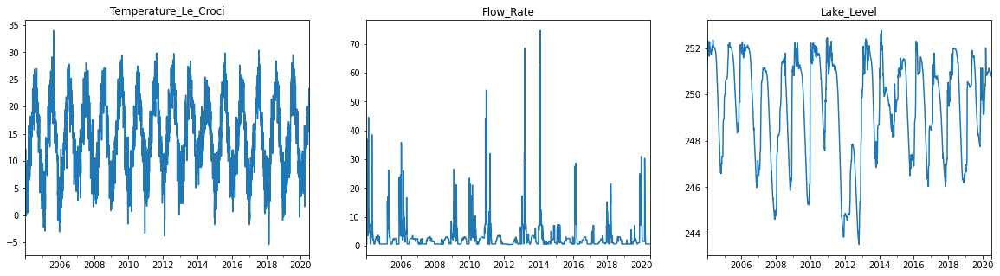

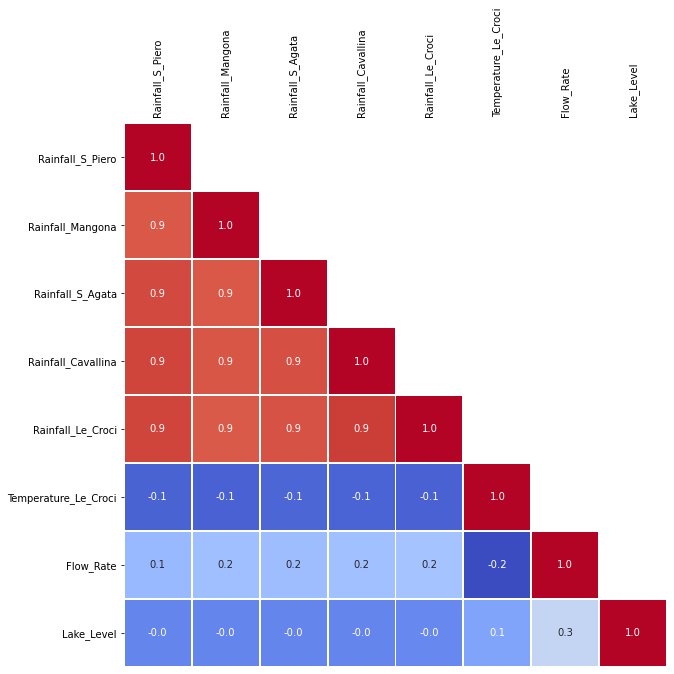

In [101]:
# correlation plot
feature_plots(df.filter(regex='Rain.*'))
plt.subplot(1,3,1)
df.Temperature_Le_Croci.plot(xlabel='', title='Temperature_Le_Croci', figsize=(20,5))
plt.subplot(1,3,2)
df.Flow_Rate.plot(xlabel='', title='Flow_Rate')
plt.subplot(1,3,3)
df.Lake_Level.plot(xlabel='', title='Lake_Level')
plt.show()
corrtri_plot(df)

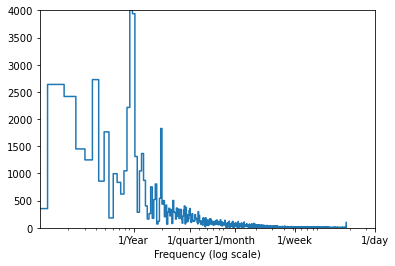

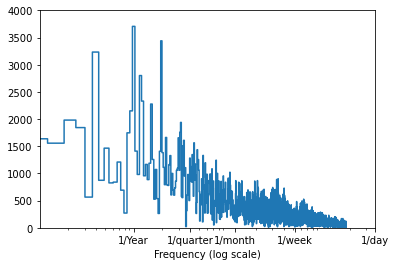

In [102]:
# feature plot
rfft_plot(df.Lake_Level, ylim=(0, 4000))
rfft_plot(df.Flow_Rate, ylim=(0, 4000))

## Bilancino: Daily VAR

We present the baseline model here which includes all features without further engineering but stationary. All features pass the ADFuller test and Granger test, so no need to difference or drop features. 

Notice that the model we're **presenting here performs the best on 1-step-ahead prediction (1D)**. Another model that performs the best on the last 14D, and additionally the last 30D, is the one that average all rainfall features, which will not be presented here but reported at the end of this section.

In [103]:
# Feature engineering & imputation
dfextended = df.copy()
# Record nan positions before imputation

## Engineer 1
# tmp = dfextended.filter(regex='Rainfall.*').columns
# dfextended['Rainfall_mean'] = dfextended[tmp].sum(axis=1)
# dfextended.drop(columns=tmp, inplace=True)

## Engineer 2: rolling
# tmp = dfextended.filter(regex='Rain.*').columns
# dfextended[tmp] = dfextended[tmp].rolling(30).agg('sum')
# tmp = dfextended.filter(regex='Vol.*').columns
# dfextended[tmp] = dfextended[tmp].rolling(30).agg('mean')
# tmp = dfextended.filter(regex='Temp.*').columns
# dfextended[tmp] = dfextended[tmp].rolling(30).agg('mean')
# dfextended.dropna(inplace=True)

## pca 
# ['Rainfall_S_Piero', 'Rainfall_Mangona', 'Rainfall_Le_Croci', 'Rainfall_S_Agata']
# pca_plot(dfextended.filter(regex='Rain.*')  )

## Drop due to pca
# tmp = ['Rainfall_S_Piero']
# dfextended.drop(columns=dfextended.filter(regex='Rain.*').columns.drop(tmp), inplace=True)

## Reorder 
collector = []
for regex in orderlist:
    collector.append(dfextended.filter(regex=regex).columns)
dfextended = dfextended.reindex(columns= np.concatenate(collector) )

In [104]:
# Chekc stationarity
## adftest
adftable = adfuller_table(dfextended, verbose=False, alpha=0.05, maxlag=11, regression='ct')
# display(adftable)

## collect non-stationary features
I1 = adftable[adftable['AIC_5%level'] == False].index.values
print('Differenced features: ', I1)

Differenced features:  []


In [105]:
## (Cont'd) take diff() on cols that do not pass the adftest. Here we adopt AIC.
dfstationary = dfextended.copy()
dfstationary.loc[:,I1] = dfstationary[I1].diff()
dfstationary.dropna(inplace=True)

## adftest again
adftable = adfuller_table(dfstationary, verbose=False, alpha=0.05, maxlag=13, regression='ct')
# display(adftable) # This time all features pass ADF test in both AIC and BIC criteria.

In [106]:
# # first difference on other features
# I11 = adftable[adftable['AIC_5%level'] == False].index.values
# dfstationary.loc[:,I11] = dfstationary[I11].diff()
# dfstationary.dropna(inplace=True)
# adftable = adfuller_table(dfstationary, verbose=False, alpha=0.05, maxlag=13, regression='ct')
# # display(adftable) # This time all features pass ADF test in both AIC and BIC criteria.

# ## update I1
# I1 = np.append(I1, I11)
# print('Differenced Features:', I1)

In [107]:
# Check granger causality
grtable = grangers_causation_table(dfstationary, xnames=dfextended.columns.drop(labels=targets), 
                          ynames=targets, maxlag=10, alpha=0.05)
display(grtable)

fail_feature = grtable[grtable.iloc[:,0] == False].index.str.strip('_x').values
# Manually drop non Granger-cause variables
# dfstationary.drop(columns=fail_feature, inplace=True)

,Flow_Rate_y,Lake_Level_y
Granger Causation Table alpha=0.05,,
Rainfall_S_Piero_x,False,True
Rainfall_Mangona_x,True,True
Rainfall_S_Agata_x,True,True
Rainfall_Cavallina_x,True,True
Rainfall_Le_Croci_x,True,True
Temperature_Le_Croci_x,True,True


Rainfall, Temperature and target features represent yearly pattern, so we add `year_sin` feature in hope that the model can predict better by learning yearly pattern. Models that don't include this feature are also reported at the end of this section. 

The model passes the Durbin Watson Test, meaning that there is no significant (5%) serial correlation in residual of each feature. It doesn't pass the Portmanteau test, indicating that some residual autocorrelatios within 30 lags are nonzero. From the residual AC plot we can see there exists a periodic bar that streches the 95% boundary, meaning that the model may not capture some info (probably due to non-linear relationship). Later, we present LSTM to check the issue.

Failing to pass normality test means that asymptotic standard errors are no longer valid and bootstrapping method such as Efron's or Hall's confidence interval should be used instead when checking impulse response.

In [108]:
# Deal with Time Periodicity 
year = 365.2425
dfstationary['year_sin'] = np.sin(dfstationary.index.dayofyear * 2 * np.pi / year)

In [109]:
# Split data
N = dfstationary.shape[0]
train, val, test = dfstationary[:int(0.8*N)], dfstationary[int(0.8*N):int(0.9*N)], dfstationary[int(0.9*N):]
column_indices = {name: i for i, name in enumerate(train.columns)}
targets_indices = [column_indices[ta] for ta in [targets[0]]]

# Scaling and Normalization 
scaler, train_scaled, val_scaled, test_scaled = scale(train, val, test, approach='MinMax')
print('train/val/test shapes:', train_scaled.shape, val_scaled.shape, test_scaled.shape)

train/val/test shapes: (4820, 9) (602, 9) (603, 9)


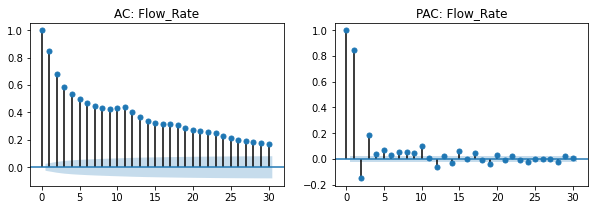

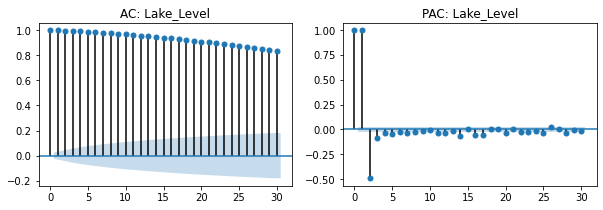

In [110]:
# Get sense: ac & pac plots
acpac_plot(dfstationary[targets], figsize=(10,3))

In [111]:
# VAR model 
var_model = VAR(endog=train.append(val))
res = var_model.select_order(maxlags=30, trend='ct')
print(res.selected_orders)
varlag = res.selected_orders['aic']
var_model = var_model.fit(varlag)
# put result into self-defined class
varobj = VARresults(var_model, test, mask=None , label_columns=targets) #[1:]
print('The model we are using: {1:}-dim VAR({0:}).'.format(*varobj.model.coefs.shape[:2]))

{'aic': 10, 'bic': 4, 'hqic': 5, 'fpe': 10}
The model we are using: 9-dim VAR(10).


In [112]:
# Durbin_watson test of residuals
print('Durbin-Watson test:')
_ = varobj.durbin_watson_test()

Durbin-Watson test:
Rainfall_S_Piero                :   2.00
Rainfall_Mangona                :   2.00
Rainfall_S_Agata                :   2.00
Rainfall_Cavallina              :   2.00
Rainfall_Le_Croci               :   2.00
Temperature_Le_Croci            :   2.00
Flow_Rate                       :   2.00
Lake_Level                      :   2.00
year_sin                        :   2.02


Test statistic,Critical value,p-value,df
3225.,2546.,0.000,2430


Test statistic,Critical value,p-value,df
1.330e+08,28.87,0.000,18


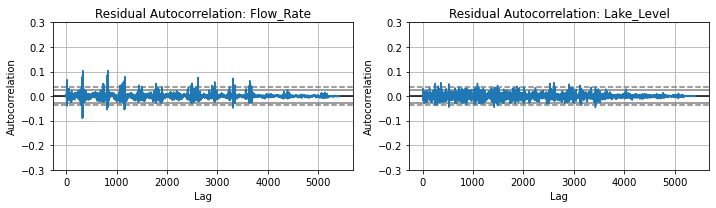

In [113]:
# Adjusted Portmannteau-test & S-K test
display(var_model.test_whiteness(nlags=varlag*4, signif=0.05, adjusted=True).summary())
display(varobj.model.test_normality().summary())
# Residual Autocorrelations
varobj.residac_plot(cols=targets, figsize=(15, 3))

The prediction seems quite OK on 14D/30D, but summarize all rainfalls by averaging performs much better. Actually, all the models of different setting do not vary much on 1D prediction.

uniform rmse:   0.8905
uniform mae:   0.3375


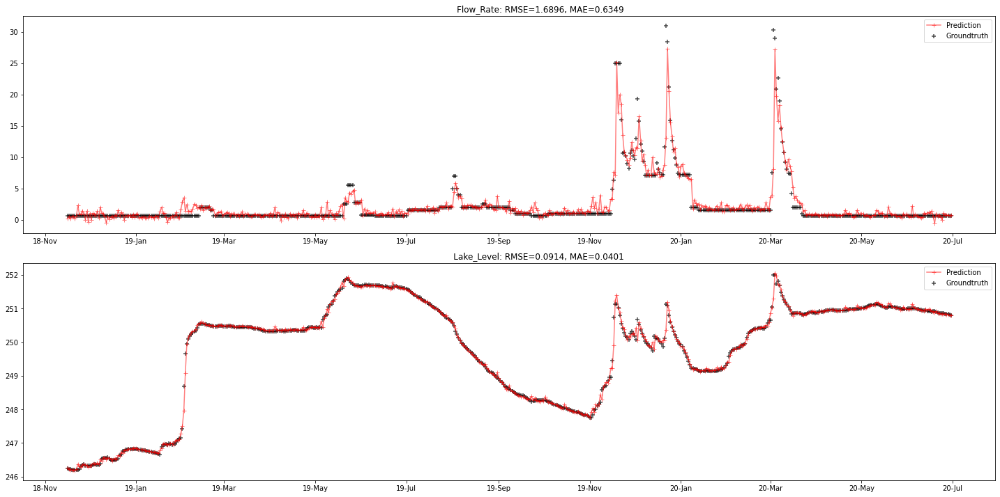

In [114]:
# 1-step-ahead Prediction
## paramters setting:
steps=1
mode = 'normal'
use_mask = False
multioutput = 'raw_values' 
## after trransformation
rmse, mae = varobj.inverse_transform_evaluate(
    I1, dfextended, steps=steps, mode=mode, multioutput=multioutput, use_mask=use_mask)
print('uniform rmse: {:8.4f}'.format(rmse.mean()))
print('uniform mae: {:8.4f}'.format(mae.mean()))
## plot
varobj.plot(use_mask=use_mask, figsize=(20,10))

uniform rmse with 7 step:   0.2221
uniform mae with 7 step:   0.2050


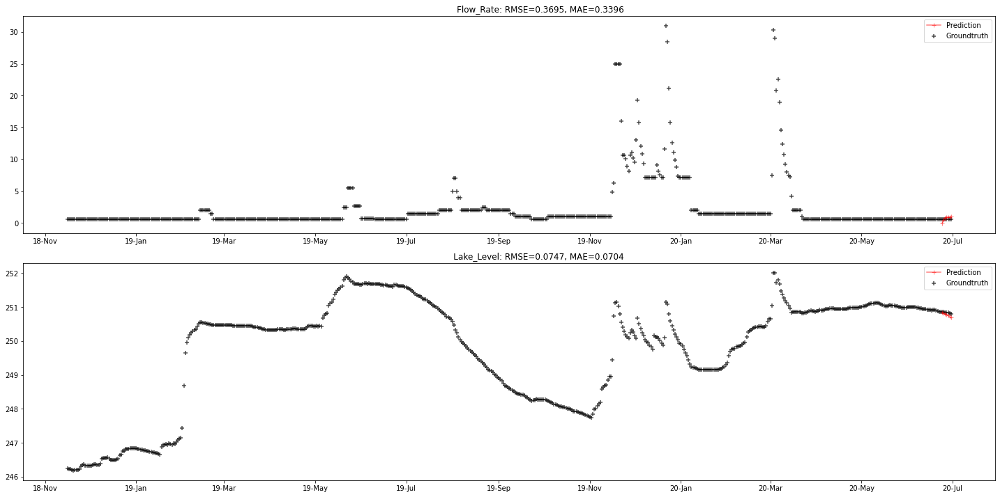

uniform rmse with 14 step:   0.2408
uniform mae with 14 step:   0.2045


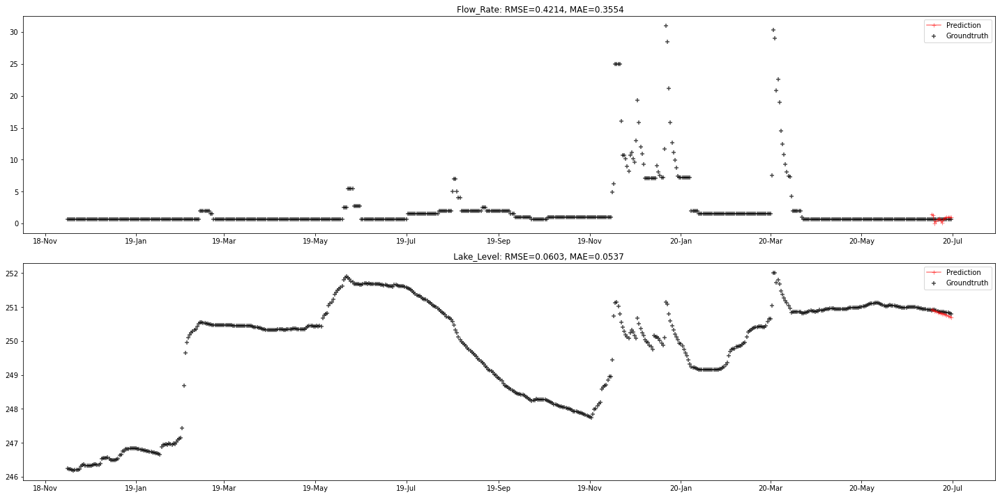

uniform rmse with 30 step:   0.3613
uniform mae with 30 step:   0.3228


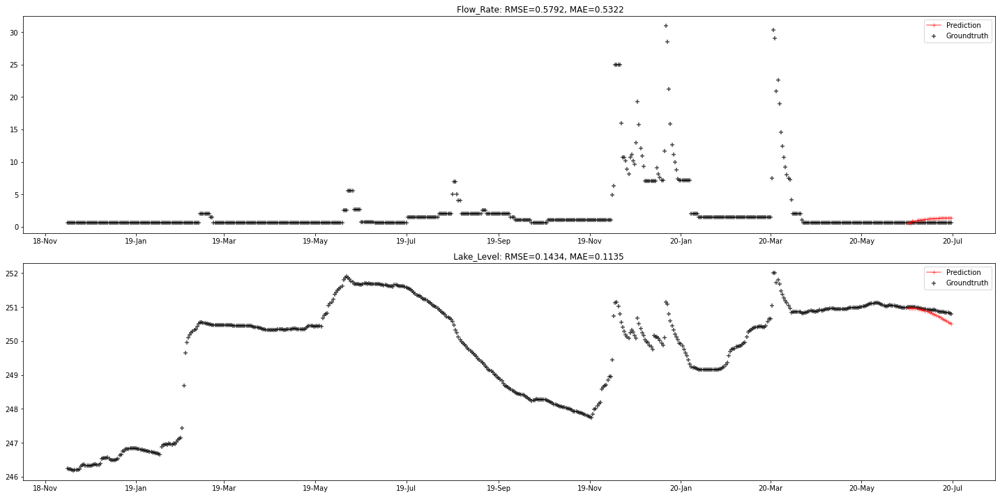

In [115]:
# Last Prediction
## paramters setting:
steps=[7, 14, 30]
mode = 'last'
use_mask = False
multioutput = 'raw_values' 
for step in steps: 
    ## prediction
    rmse, mae = varobj.inverse_transform_evaluate(I1, dfextended,steps=step, mode=mode, 
                                                  multioutput=multioutput, use_mask=use_mask)
    print('uniform rmse with {:>} step: {:8.4f}'.format(step, rmse.mean() ))
    print('uniform mae with {:>} step: {:8.4f}'.format(step, mae.mean() ))
    ## plot
    varobj.plot(use_mask=use_mask, figsize=(20, 10))

Since forecast error impulse response (FEIR) only analyzes shock occuring in one variable at a time, contemporaneous correlation of error terms cannot be captured by it. We then use orthogonalized impulse response (OIR) to solve this issue, which rely on stronger assumption and thus the order of features in model matters. Besides, the Hall's confidence interval is used since it usually has bias corrected effect compared to Efron.

The feature order we choose is **Rainfall $\rightarrow$ Temperature $\rightarrow$ Flow_Rate $\rightarrow$ Lake_Level**. Actually, the order between rainfall and temperature can be reversed since they affect each other, and it seems like the lake level reaches its peak when flow_rate increase base on the figures in `df['Flow_Rate'].plot(); df['Lake_Level'].plot()`. But one can also explain the relation reversely, so Flow_Rate and Lake_Level order can be exchanged. Here we just assume the order and see the effect of each feature on targets. At least it makes sense that rainfall and temperature can affect the flow rate and lake level.

The meaning of OIR is to see whether one standard deviation shock to x causes significant (increase/decrease standard deviation) response in y for m periods. 

We find that in the OIR plot the **Rainfall_S_Piero, Rainfall_Mangona, Rainfall_Cavallina, and Rainfall_Le_Croci** shocks cause significant positive response to *Flow_Rate*. **Although Flow_Rate doesn't response immediately to Lake_Level shock due to the orthogonalized assumption (Cholesky decomposition/order selection in previous paragraph), but var lags help it to response significant after lag 8** with value= 0.1 standard deviation as shown in the plot. TemperatureLe_Croci schock is also significant but the effect is only half of 0.1.

**Rainfall_S_Piero and Rainfall_Mangona** causes significantly positive effect to *Lake_Level*. **Flow_Rate** cuases significantly NEGATIVE effect to *Lake_Level*, the later the larger. This matches the observation that a drop of *Lake_Level* starts when a shock to Flow_Rate appears after a while in the *Flow_Rate* and *Lake_Level* level plots (colored blue). **Intuitively, an increase of flow rate speeds up the reduction of lake levels.**

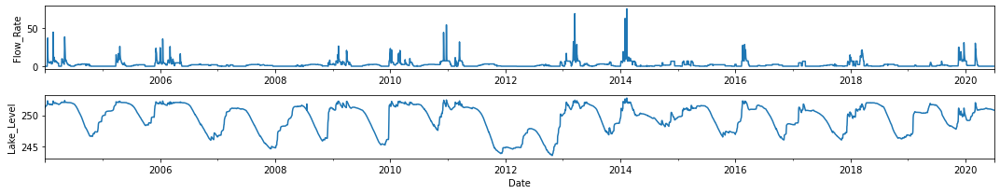

In [116]:
# targets plot
plt.subplot(2,1,1)
df['Flow_Rate'].plot(figsize=(15, 3), ylabel='Flow_Rate', xlabel='')
plt.subplot(2,1,2)
df['Lake_Level'].plot(figsize=(15, 3), ylabel='Lake_Level')
plt.tight_layout()
plt.show()

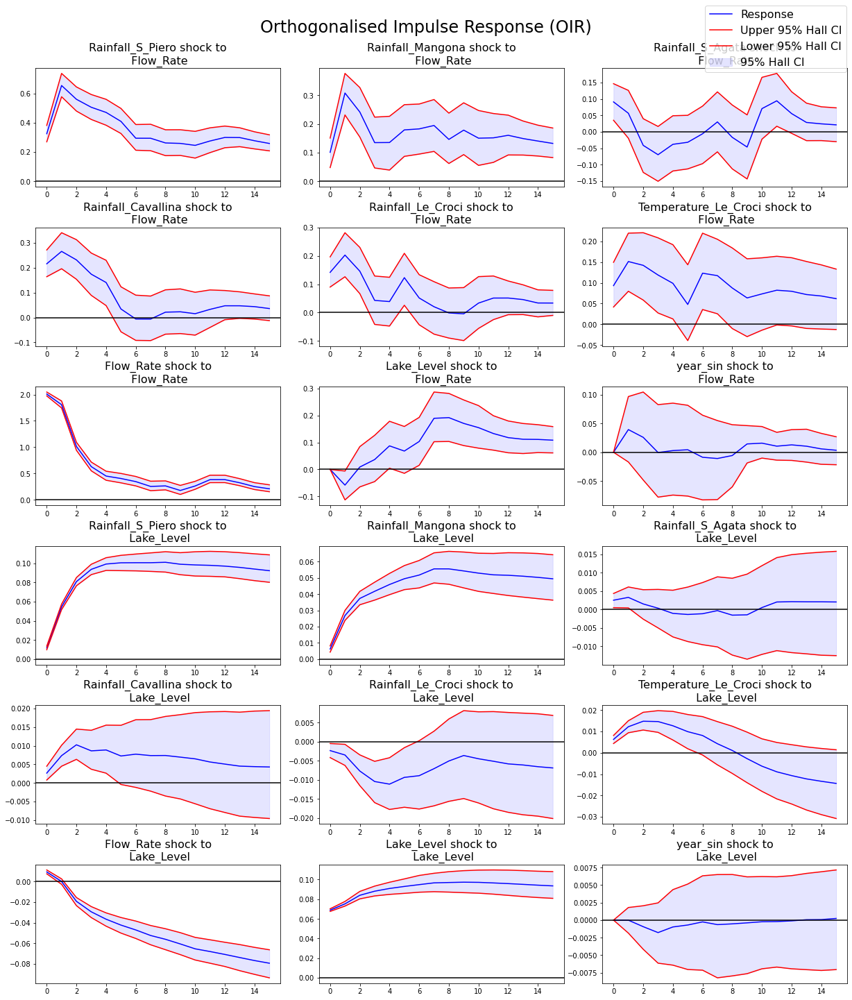

In [117]:
# OIR Plot Analysis
varobj.irplot(impulse=train.columns, periods=15, response=targets, orth=True,
             figsize=(17,20), method='hall')

The FEVD plot is shown below. It illustrates which (orthogonised) feature shocks contribute to the error variance of our target features in different lags. 

For the target feature *Flow_Rate*, the top 3 features excluding the Flow_rate itself are **Rainfall_S_Piero, Rainfall_Mangona, and Rainfall_Cavallina**, which contribute roughly 10%-20% of the error variance in later periods. Rainfall_Le_Croci & Temperature_Le_Croci, and Lake_Level have similar but small effecs.

For the target feature *Lake_Level*, **Rainfall_S_Piero, Rainfall_Mangona, and Flow_Rate** are most important features accounting for 20% error variance in later lags.

The FEVD analysis are (usually) aligned with the OIR analysis.

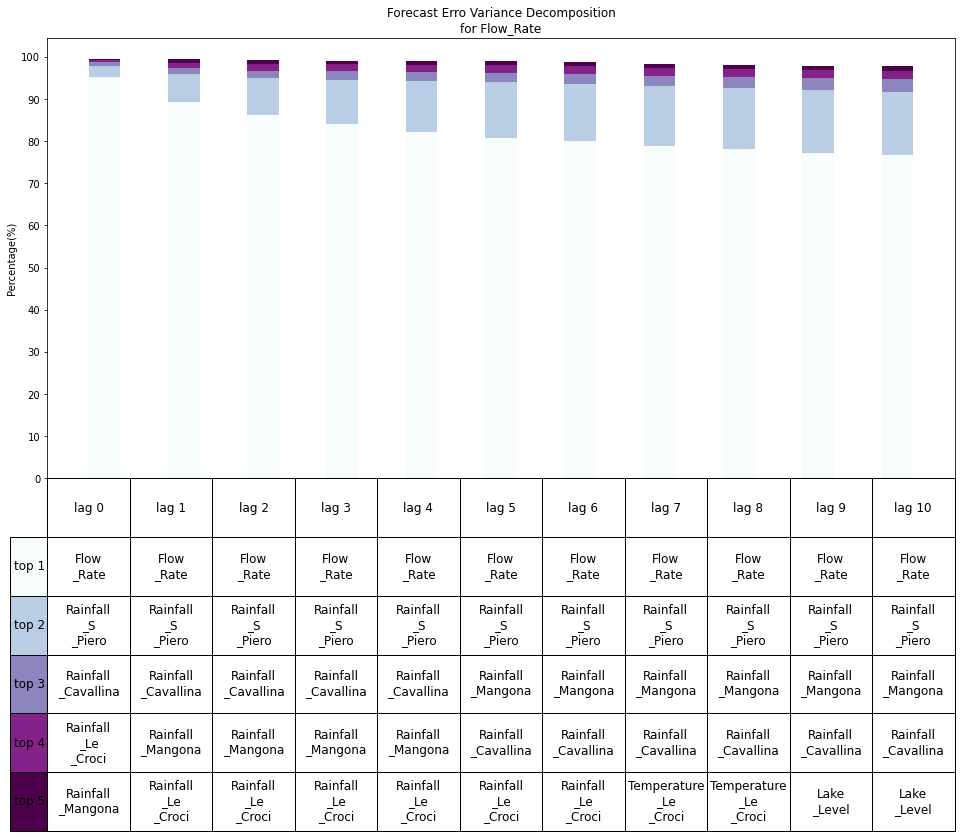

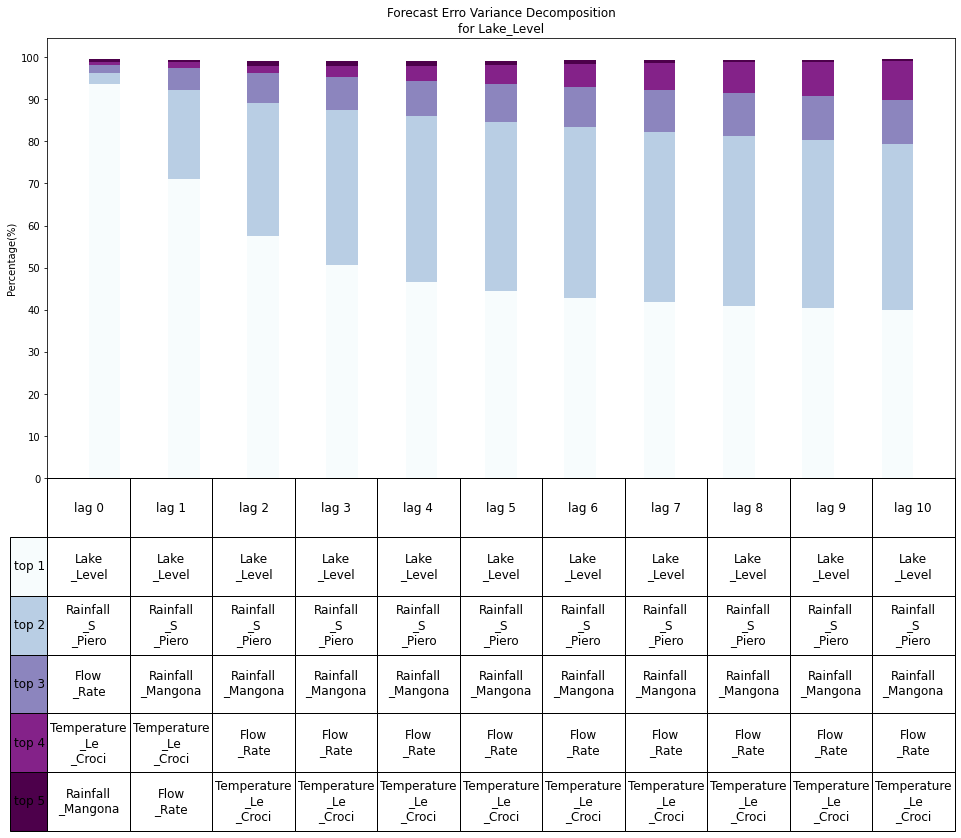

In [118]:
# FEVD Plot Analysis 
varobj.fevd_plot(periods=11, top=5, figsize=(14, 9), max_str_split=3) 

We've implemented various setting of model and reported their performance here. As far we have shown that the baseline model predict best on 1D and its interesting and consistency feature explanation. By the report we also find that experiment **No.3 perform the best** on 14D/30D predictions. Findings from the report are given below: 
1. summarizing rainfalls via average helps capture info and improve long term predictions, though the 1D prediction is also not bad compared to No.1 baseline.
2. `year_sin` in most cases help capture long term pattern and thus improve performance.
3. Rolling method in No.5 and No.6 doesn't make model perform better. Intuition that 30 days smoothing should help capture long term prediction breaks.

Failing PT test means that the model may be interfered by short but large noise or that a linear model may not capture all necessary information to predict target. Hence some info are left in the error lags.

Since VAR model is linear and thus can only capture local linear prediction, we present LSTM as well trying to capture the possible non-linear relationship between target and features in the following.

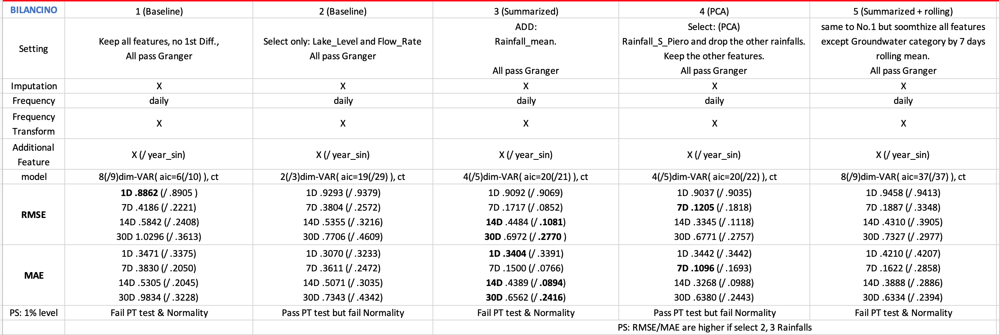

In [30]:
Image("/Users/mbpr/GitHub/Acea-Smart-Water-Analytics/image/bilancino1.png")

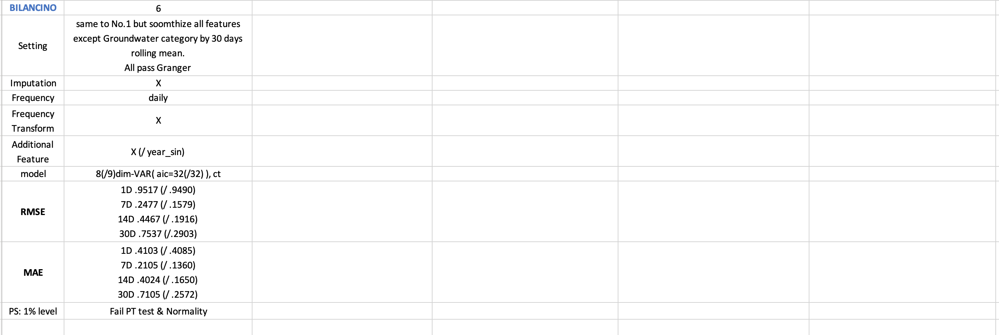

In [31]:
Image("/Users/mbpr/GitHub/Acea-Smart-Water-Analytics/image/bilancino2.png")

## Bilancino: Daily LSTM

LSTM model doesn't require data to be stationary but better scaled since tanh() is used by LSTM. We then use `MinMaxScaler()` to scale data into $[-1,1]$. One can also use alternative scaler such as `StandardScaler()` by simply changing the `approach='Standard'` in the scale function. `year_sin` is also included to make model learn the yearly pattern better. 

Here we use the same lag as VAR to train the LSTM in order for 1D prediction performance comparison. The model can thus be futher fine tuned based on different lags together with other parameters, which we will omit here (by fixing lag=varlag) and focus only on the feature importance learned by the LSTM.

We didn't implement the LSTM model that predicts 7D/14D in a row since it's intuitive to directly predict on target features instead of predicting on all features and then feed the prediction to the model again, which is like the behaviour of VAR model.

In [119]:
# Feature engineering & imputation
## no mask to deal with
dfextended = df.copy()
## Reorder 
collector = []
for regex in orderlist:
    collector.append(dfextended.filter(regex=regex).columns)
dfextended = dfextended.reindex(columns= np.concatenate(collector) )
# Deal with Time Periodicity 
year = 365.2425
dfextended['year_sin'] = np.sin(dfextended.index.dayofyear * 2 * np.pi / year)

In [120]:
# Split data
N = dfextended.shape[0]
train, val, test = dfextended[:int(0.8*N)], dfextended[int(0.8*N):int(0.9*N)], dfextended[int(0.9*N):]

## define indices
column_indices = {name: i for i, name in enumerate(train.columns)}
targets_indices = [column_indices[ta] for ta in targets]

# Scaling and Normalization 
scaler, train_scaled, val_scaled, test_scaled = scale(train, val, test, approach='MinMax')
print('train/val/test shapes are:', train_scaled.shape, val_scaled.shape, test_scaled.shape)

train/val/test shapes are: (4820, 9) (602, 9) (603, 9)


In [121]:
# Initialize data loader: 1-step-ahead prediction
## parameters setting
input_width = varlag     # suggested by VAR
label_width = 1       
shift = 1
batch_size = 2
## generate window
window = WindowGenerator(input_width, label_width, shift, train_scaled, val_scaled, test_scaled, 
                         batch_size=batch_size, shuffle=False, mask=None, 
                         label_columns=targets)
print(window)
print('Inputs/labels shapes of window: {} {}'.format(
    window.example[0].shape, window.example[1].shape))

Total window size: 11
Input indices: [0 1 2 3 4 5 6 7 8 9]
Label indices: [10]
shuffle: False
Label column name(s): ['Flow_Rate', 'Lake_Level']
Inputs/labels shapes of window: (2, 10, 9) (2, 1, 2)


evaluation before scaling back:
297/297 - 1s - loss: 0.0034 - root_mean_squared_error: 0.0585 - mean_absolute_error: 0.0388
evaluation after scaling back: root_mean_squared_error: 1.1897 - mean_absolute_error: 0.7056


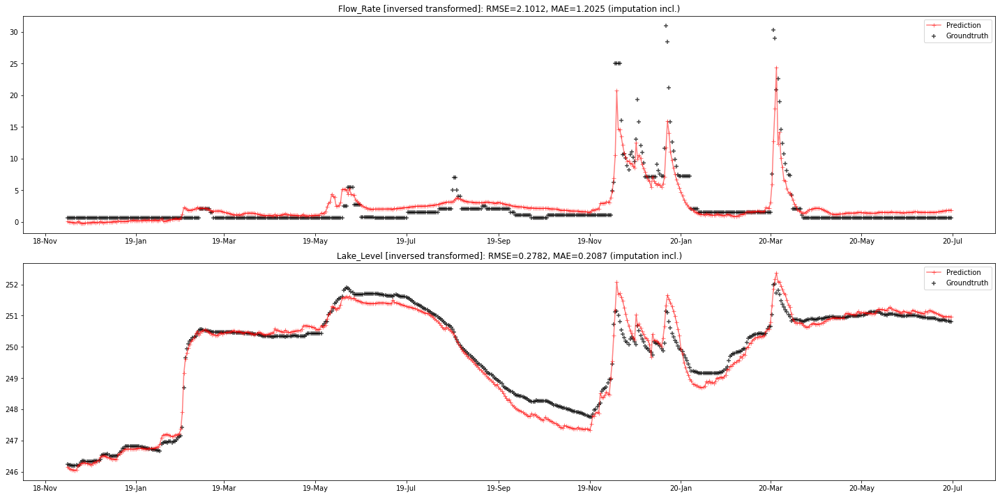

In [122]:
# 1-step-ahead LSTM prediction

lstm_model = None
if os.path.isfile(os.path.join(modelpath, 'bilancino.keras')):
    lstm_model = tf.keras.models.load_model(os.path.join(modelpath, 'bilancino.keras'))
else: 
    # ## Parameters setting:
    MAX_EPOCHS = 100
    patience = 10        # stop training if loss increase for 'patience' periods in total.
    lr_rate = 1e-3
    train_verbose = 0    # 0: no output, 1: progress, 2: report
    lstm_kernel = 16
    stateful = False     # batchsize must be 1 if True. (takes 10 mins)
    dropout = 0.2        # dropout rate in [0,1]

    ## fixed setting
    n_features = train_scaled.shape[1]
    n_out = len(targets)
    OUT_STEPS = window.label_width

    ## RNN: LSTM
    lstm_model = tf.keras.Sequential([
        # Shape [batch, time, features] => [batch, lstm_units]
        tf.keras.layers.LSTM(lstm_kernel, return_sequences=True, stateful=stateful),
        tf.keras.layers.Dropout(dropout),
        tf.keras.layers.LSTM(int(lstm_kernel/2), return_sequences=False, stateful=stateful),
        # Shape => [batch, out_steps*features]
        tf.keras.layers.Dropout(dropout),
        tf.keras.layers.Dense(OUT_STEPS*n_out),
        # Shape => [batch, out_steps, features]
        tf.keras.layers.Reshape([OUT_STEPS, n_out])
    ])
    ## compile and fit
    print('window RNN')
    print('Xtrain shape: ', window.example[0].shape, 'ytrain shape: ', window.example[1].shape, end='')
    print('\toutput shape: ', lstm_model(window.example[0]).shape, end='\n\n')
    history = compile_and_fit(lstm_model, window, MAX_EPOCHS, patience, lr_rate, verbose=train_verbose)
    ## save model
    lstm_model.save(os.path.join(modelpath, 'bilancino.keras'), overwrite=False)
    
## evaluate on test
print('evaluation before scaling back:')
lstm_model.evaluate(window.test, verbose=2, return_dict=True)
#window.plot(lstm_model, use_mask=True)

## inverse_transform_evaluate on test
di = window.inverse_transform_evaluate(lstm_model, scaler, which='test', return_dict=True)
print('evaluation after scaling back: {0}: {2:6.4f} - {1}: {3:6.4f}'.format(*di.keys(), *di.values()))
window.plot(use_mask=False, figsize=(20, 10))

We use the sensitivity analysis to determine the feature importance, that is, when perturbing a particular feature based on testing data, given the values of the other feature unchanged, how much will rmse change by comparing the prediction before and after perturbation. A feature is more important if the larger the rmse is.

In the figure below we find that **Rainfall_Le_Croci, Rainfall_Cavallina, Temperature_Le_Croci, and Rainfall_Mangona** are important features to LSTM. '+' sign means when adding epsilon on each testing observation, 95% of which makes higher prediction than original prediction. We summarize the comparison of important features in the summary section.

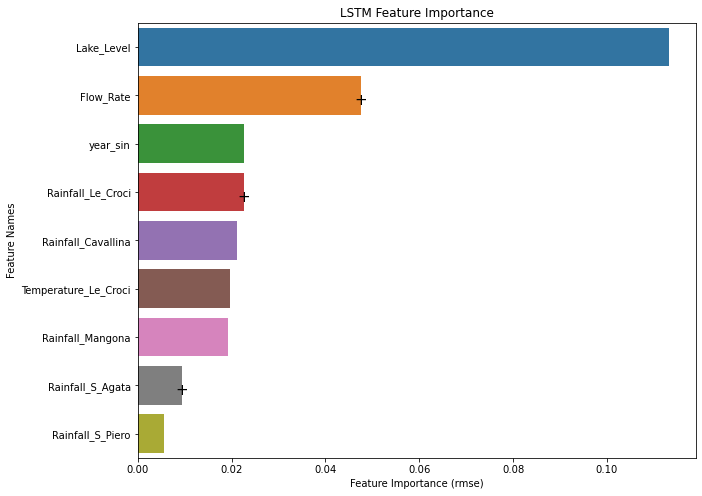

In [123]:
# LSTM feature importance plot
importance, direction = feature_importance(lstm_model, window.X_test, scale=0.2, method='const')
feature_importance_plot(importance, direction, names=train_scaled.columns)

## Summary

We summarize here what we've gotten from the above analysis.<br/>
Target feature: Flow_Rate, Lake_Level.<br/>
Testing size: 603.

Most important Features:<br/>
From the VAR model: 1D/7D/14D/30D RMSE - .8862/.1205/.1081/.2770 (inverse transformd)
 - For Flow_Rate:  Rainfall_S_Piero, Rainfall_Mangona, Rainfall_Cavallina, and Rainfall_Le_Croci 
 - For Lake_Level: Rainfall_S_Piero, Rainfall_Mangona, Flow_Rate

From the LSTM model: 1D RMSE - 1.1897 (inverse transformed)
 - (Lake_Level, Flow_Rate), 
 - (Rainfall_Le_Croci, Rainfall_Cavallina, Temperature_Le_Croci, and Rainfall_Mangona)

Common important features: 
 - For Flow_Rate: Rainfall_Mangona, Rainfall_Cavallina, and Rainfall_Le_Croci 
 - For Lake_Level: Rainfall_Mangona, Flow_Rate

# River Arno

## Data Cleansing

As shown in the following missing value plot, since the dataset of River Arno contains mass missing data before 2004-01-01 and after 2007-07-07, we drop them and focus our prediction task only on the period 2004-01-01 - 2007-07-06. Linear regression is used to impute missing data during the period.

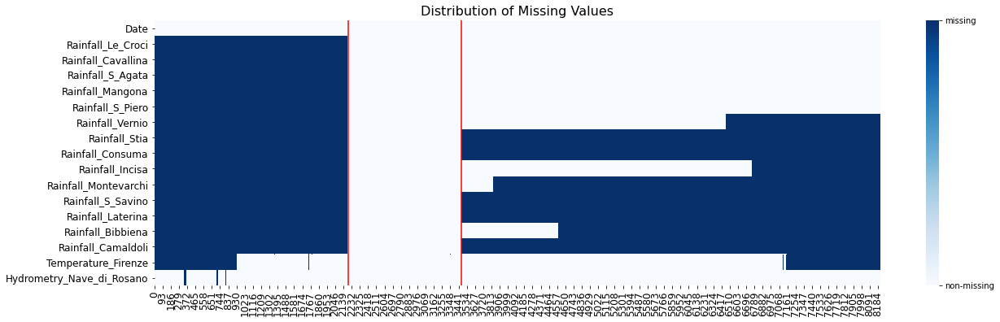

In [124]:
# parameters setting
dataset = 'River_Arno.csv'
targets = ['Hydrometry_Nave_di_Rosano']

# read dataset as DataFrame
dateparse = lambda x: datetime.strptime(x, '%d/%m/%Y')
df = pd.read_csv(os.path.join(datapath, dataset), index_col='Date', parse_dates=['Date'], date_parser=dateparse)

# re-order features
orderlist = ['Rain.*', 'Temp.*', *targets] # 14 rainfalls, 1 Temperature, 1 Hydrometry
collector = []
for regex in orderlist: 
    collector.append(df.filter(regex=regex).columns)
df = df.reindex(columns= np.concatenate(collector) )

# define frequency and sort accordingly.
df.index.freq = 'd'
df.sort_index(inplace=True)
# df.describe()

# Set weird values to nan
# visual graph of nan locations for each field
missingval_plot(df, show=False)
plt.axvline(x = 2191, c='r') # 2004-01-01
plt.axvline(x = 3473, c='r') # 2007-07-06
plt.show()
# mass missing in 1998-01-01 -- 2003-12-31 and 2007-07-07 -- 2020-06-30

In [125]:
# Dealing with missing values
df = df['2004-01-01':'2007-07-06']
# imputation & create mask
maskdf = df.isna()
df = fillna(df, approach='regression')

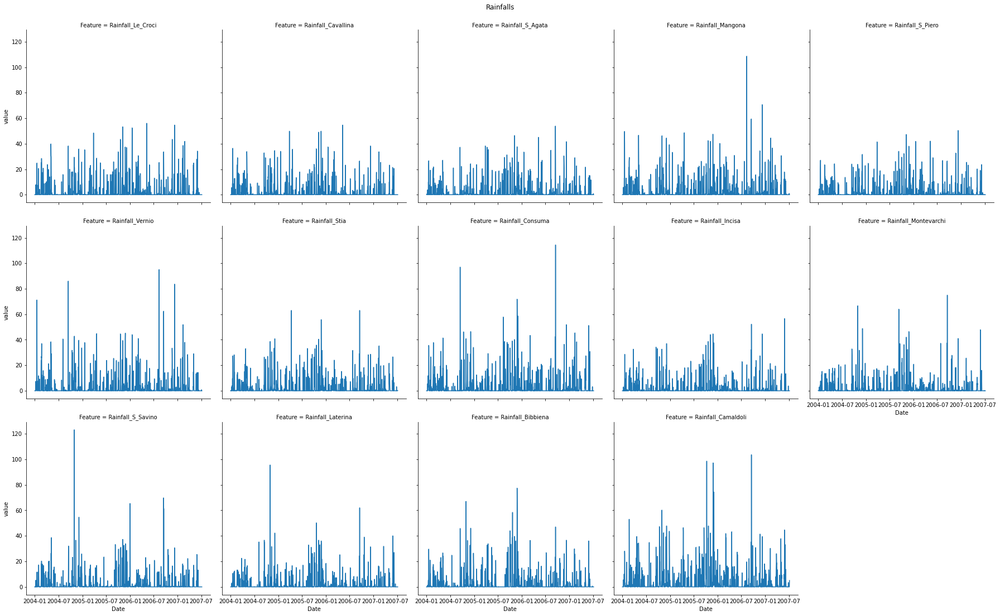

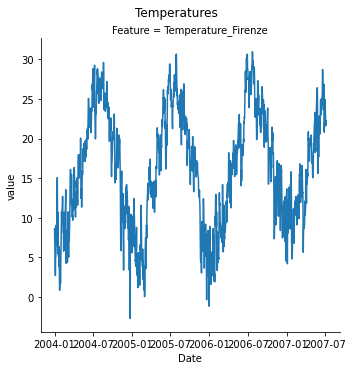

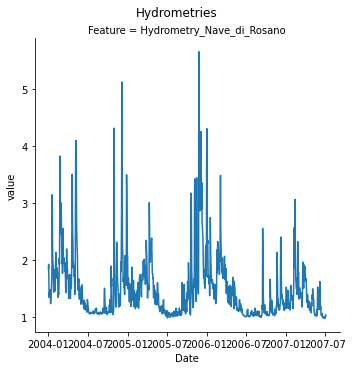

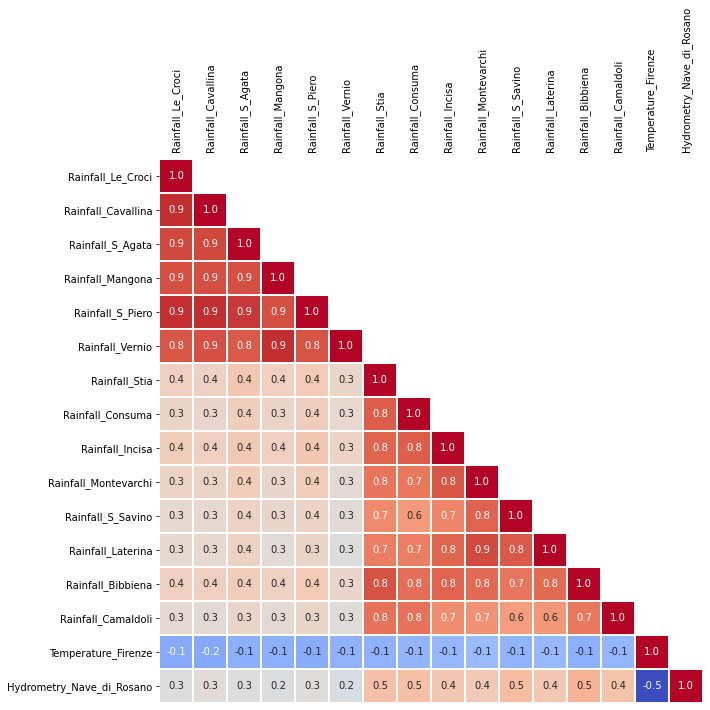

In [126]:
# correlation plot
feature_plots(df)
corrtri_plot(df)

## Arno: Daily VAR

In this section we implement the baseline daily VAR model including all features and only the Temperature_Firenze is differenced to make the data stationary. We find that 5 rainfall features and the Temperature_Firenze don't pass the Granger test at 5% level of lag=3 (chosen by later VAR model). However, we still include them in our model in order to see OIR on those features as well. The model that excludes the non-Granger features and other possible variations are reported at the end of this section.

Notice that the model we're **presenting here is not the best** model, but helps us on OIR analysis, further feature selection, and finally the best model is created, which is also reported at the end.

In [127]:
# Feature engineering & imputation
dfextended = df.copy()
mask = maskdf.copy()

## Engineer 1
# tmp = dfextended.filter(regex='Rainfall.*').columns
# dfextended['Rainfall_mean'] = dfextended[tmp].sum(axis=1)
# dfextended.drop(columns=tmp, inplace=True)

## Engineer 2: rolling
# tmp = dfextended.filter(regex='Rain.*').columns
# dfextended[tmp] = dfextended[tmp].rolling(30).agg('sum')
# tmp = dfextended.filter(regex='Vol.*').columns
# dfextended[tmp] = dfextended[tmp].rolling(30).agg('mean')
# tmp = dfextended.filter(regex='Temp.*').columns
# dfextended[tmp] = dfextended[tmp].rolling(30).agg('mean')
# dfextended.dropna(inplace=True)

## pca 
# pca_plot(dfextended.filter(regex='Rain.*')  )
## Drop due to pca
# tmp = ['Rainfall_Le_Croci', 'Rainfall_Cavallina', 'Rainfall_Stia', 'Rainfall_Bibbiena']
# dfextended.drop(columns=dfextended.filter(regex='Rain.*').columns.drop(tmp), inplace=True)

## Reorder 
collector = []
for regex in orderlist:
    collector.append(dfextended.filter(regex=regex).columns)
dfextended = dfextended.reindex(columns= np.concatenate(collector) )

## so does mask
# mask['Rainfall_mean'] = False
# mask = mask[29:]
for col in df.columns.drop(dfextended.columns, errors='ignore'): 
    mask.drop(columns=col, inplace=True)
assert mask.shape == dfextended.shape, f'mask shape {mask.shape} doesn\'t match dfimputed shape {dfextended.shape}'
mask = mask.reindex(columns=dfextended.columns)

In [128]:
# Chekc stationarity
## adftest
adftable = adfuller_table(dfextended, verbose=False, alpha=0.05, maxlag=5, regression='ct')
# display(adftable)

## collect non-stationary features
I1 = adftable[adftable['AIC_5%level'] == False].index.values
print('Differenced features: ', I1)

Differenced features:  ['Temperature_Firenze']


In [129]:
## (Cont'd) take diff() on cols that do not pass the adftest. Here we adopt AIC.
dfstationary = dfextended.copy()
dfstationary.loc[:,I1] = dfstationary[I1].diff()
dfstationary.dropna(inplace=True)

## adftest again
adftable = adfuller_table(dfstationary, verbose=False, alpha=0.05, maxlag=5, regression='ct')
# display(adftable) # This time all features pass ADF test in both AIC and BIC criteria.

In [130]:
# Check granger causality
grtable = grangers_causation_table(dfstationary, xnames=dfextended.columns.drop(labels=targets), 
                          ynames=targets, maxlag=3,alpha=0.05)
display(grtable)
# record features that don't pass Granger
fail_feature = grtable[grtable.iloc[:,0] == False].index.str.strip('_x').values

# Manually drop non Granger-cause variables
# dfstationary.drop(columns=fail_feature, inplace=True)
# mask.drop(columns=fail_feature, inplace=True)

,Hydrometry_Nave_di_Rosano_y
Granger Causation Table alpha=0.05,
Rainfall_Le_Croci_x,False
Rainfall_Cavallina_x,True
Rainfall_S_Agata_x,False
Rainfall_Mangona_x,False
Rainfall_S_Piero_x,False
Rainfall_Vernio_x,False
Rainfall_Stia_x,True
Rainfall_Consuma_x,True
Rainfall_Incisa_x,True


Rainfall and Temperature represents yearly pattern, so we add `year_sin` feature in hope that the model can predict better by learning yearly pattern. Models that don't include this feature are also reported at the end of this section. Here our model is trained on training plus validation data and is tested on testing data. It passes the Durbin Watson Test, meaning that there is no significant (5%) serial correlation in residual of each feature.

Althouth the model passes the Portmanteau Test, meaning that residual auto correlation as a whole is zero, it doesn't pass normality test. So asymptotic standard errors are no longer valid and bootstrapping method such as Efron's or Hall's confidence interval should be used instead when checking impulse response.

In [131]:
# Deal with Time Periodicity 
year = 365.2425
dfstationary['year_sin'] = np.sin(dfstationary.index.dayofyear * 2 * np.pi / year)

In [132]:
# Split data
N = dfstationary.shape[0]
train, val, test = dfstationary[:int(0.8*N)], dfstationary[int(0.8*N):int(0.9*N)], dfstationary[int(0.9*N):]
_, vmask, tmask = mask[:int(0.8*N)], mask[int(0.8*N):int(0.9*N)], mask[int(0.9*N):]
column_indices = {name: i for i, name in enumerate(train.columns)}
targets_indices = [column_indices[ta] for ta in [targets[0]]]

# Scaling and Normalization 
scaler, train_scaled, val_scaled, test_scaled = scale(train, val, test, approach='MinMax')
print('train/val/test shapes:', train_scaled.shape, val_scaled.shape, test_scaled.shape)

train/val/test shapes: (1025, 17) (128, 17) (129, 17)


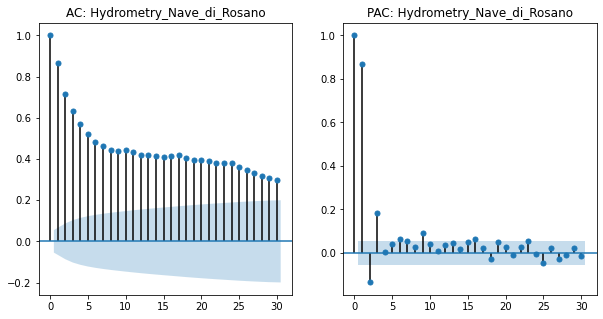

In [133]:
# Get sense: ac & pac plots
acpac_plot(dfstationary[targets], )

In [134]:
# VAR model 
var_model = VAR(endog=train.append(val))
res = var_model.select_order(maxlags=33, trend='ct')
print(res.selected_orders)
varlag = res.selected_orders['aic']
var_model = var_model.fit(varlag)
# put result into self-defined class
varobj = VARresults(var_model, test, mask=tmask[1:] , label_columns=targets) #[1:]
print('The model we are using: {1:}-dim VAR({0:}).'.format(*varobj.model.coefs.shape[:2]))

{'aic': 3, 'bic': 2, 'hqic': 2, 'fpe': 3}
The model we are using: 17-dim VAR(3).


In [135]:
# Durbin_watson test of residuals
print('Durbin-Watson test:')
_ = varobj.durbin_watson_test()

Durbin-Watson test:
Rainfall_Le_Croci               :   2.00
Rainfall_Cavallina              :   2.00
Rainfall_S_Agata                :   2.00
Rainfall_Mangona                :   2.00
Rainfall_S_Piero                :   2.00
Rainfall_Vernio                 :   2.00
Rainfall_Stia                   :   1.99
Rainfall_Consuma                :   1.99
Rainfall_Incisa                 :   2.00
Rainfall_Montevarchi            :   2.00
Rainfall_S_Savino               :   2.00
Rainfall_Laterina               :   2.00
Rainfall_Bibbiena               :   1.99
Rainfall_Camaldoli              :   1.99
Temperature_Firenze             :   2.01
Hydrometry_Nave_di_Rosano       :   1.99
year_sin                        :   2.32


Test statistic,Critical value,p-value,df
2539.,2721.,0.803,2601


Test statistic,Critical value,p-value,df
1.117e+07,48.60,0.000,34


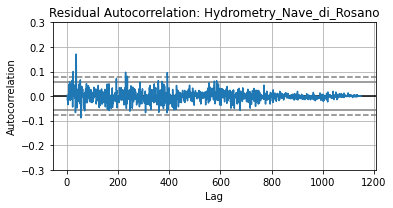

In [136]:
# Adjusted Portmannteau-test & S-K test
display(var_model.test_whiteness(nlags=varlag*4, signif=0.05, adjusted=True).summary())
display(varobj.model.test_normality().summary())
# Residual Autocorrelations
varobj.residac_plot(cols=targets, figsize=(15, 3))

As one can see, the 1-step-ahead prediction and 7 days in a row prediction are not bad but the model breaks when predicting 14 days in a row. Our goal here, however, is to do the OIR analysis and select feature based on it to create the best model. We've also tried other possible feature engineering and re-train the VAR model, which will be discussed later in this section.

uniform rmse:   0.1258
uniform mae:   0.0817


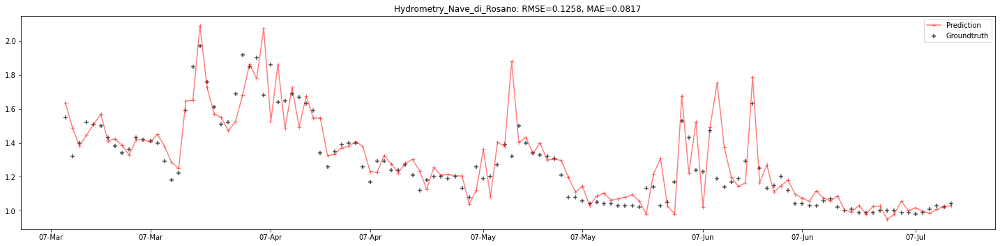

In [137]:
# 1-step-ahead Prediction
## paramters setting:
steps=1
mode = 'normal'
use_mask = True
multioutput = 'raw_values' 

## after trransformation
rmse, mae = varobj.inverse_transform_evaluate(
    I1, dfextended, steps=steps, mode=mode, multioutput=multioutput, use_mask=use_mask)
print('uniform rmse: {:8.4f}'.format(rmse.mean()))
print('uniform mae: {:8.4f}'.format(mae.mean()))

## plot
varobj.plot(use_mask=use_mask, figsize=(20, 5))

uniform rmse with 7 step:   0.0588
uniform mae with 7 step:   0.0550


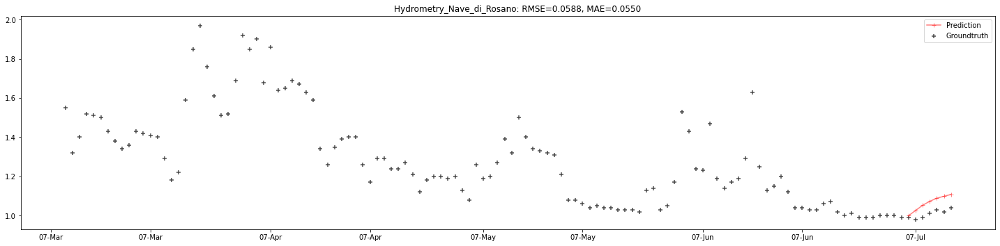

uniform rmse with 14 step:   0.1281
uniform mae with 14 step:   0.1240


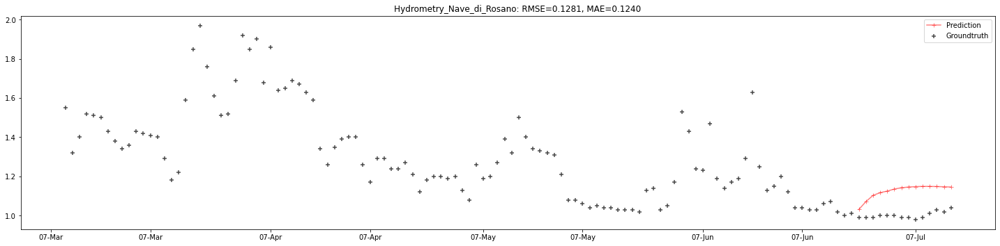

In [138]:
# Last Prediction
## paramters setting
steps=[7, 14]
mode = 'last'
use_mask = True
multioutput = 'raw_values' 
## prediction
for step in steps:
    rmse, mae = varobj.inverse_transform_evaluate(
        I1, dfextended, steps=step, mode=mode, multioutput=multioutput, use_mask=use_mask)
    print('uniform rmse with {:>} step: {:8.4f}'.format(step, rmse.mean()))
    print('uniform mae with {:>} step: {:8.4f}'.format(step, mae.mean()))
    ## plot
    varobj.plot(use_mask=use_mask, figsize=(20, 5))

Since forecast error impulse response (FEIR) only analyzes shock occuring in one variable at a time, contemporaneous correlation of error terms cannot be captured by it. We then use orthogonalized impulse response (OIR) to solve this issue, which rely on stronger assumption and thus the order of features in model matters. Besides, the Hall's confidence interval is used since it usually has bias corrected effect compared to Efron.

The feature order we choose is **Rainfall $\rightarrow$ Temperature $\rightarrow$ Hydrometry**, so the former can have a shock on later but not in the other way around. The meaning of OIR is to see whether one standard deviation shock to x causes significant (increase/decrease standard deviation) response in y for m periods. 

We find that in the OIR plot the *Rainfall_Le_Croci, Rainfall_Cavallina, Rainfall_Stia, Rainfall_S_Savino and Rainfall_Bibbiena* shocks cause significant positive response to *Hydrometry_Nave_di_Rosano*. Although some other Rainfall are significant but the response value is not large nor long enough. (As for the Temperature, none of the rainfalls cause it significantly. To save space, we didn't show the graph here but one can change `response='Temperature_Firenze'` to see the result.)
    

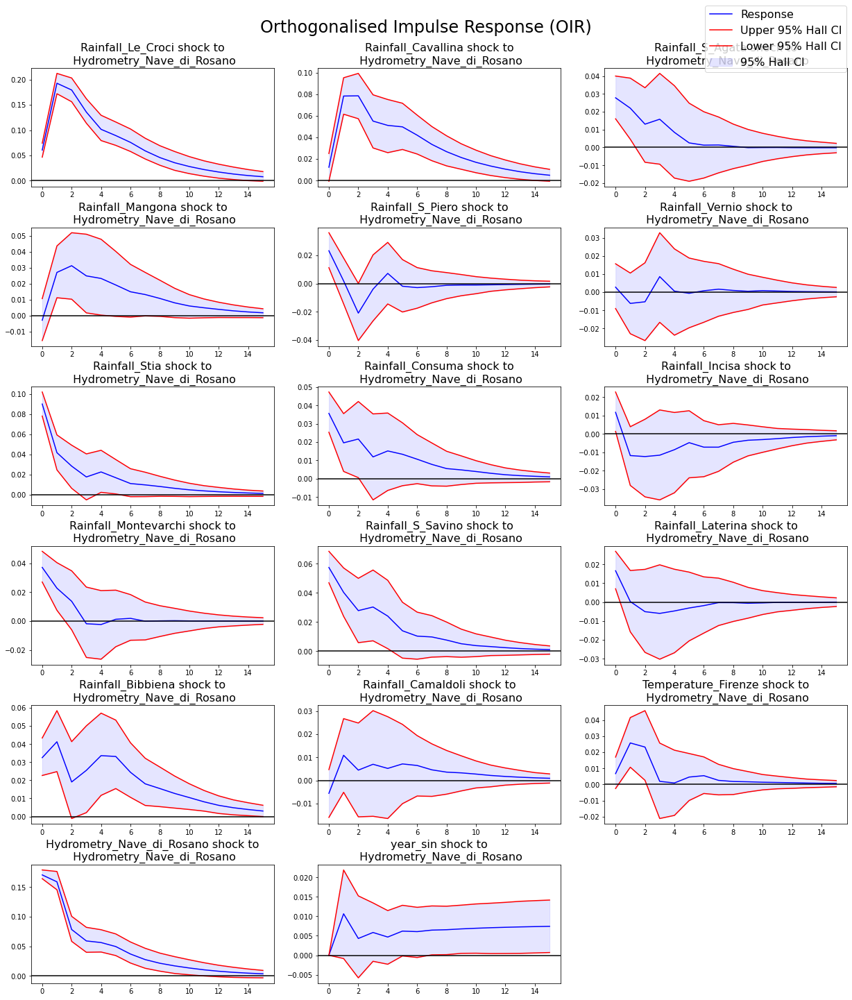

In [139]:
# OIR Plot Analysis
varobj.irplot(impulse=train.columns, periods=15, response=targets, orth=True,
             figsize=(17,20), method='hall')

The FEVD plot is shown below. It illustrates which (orthogonised) feature shocks contribute to the error variance of our target feature *Hydrometry_Nave_di_Rosano* in different lags. In lag 0, *Hydrometry shock* is the top 1 that contributes to the error variance of itself, followed by *Rainfall_Stia, Le_Croci, S_Savino, and Montevarchi*. It becomes stable that the top 5 features are *Rainfall_Le_Croci, Hydrometry, Rainfall_Cavallina, Stia, and S_Savino* in later periods. Note that these rainfalls contribute above 40% FEVD to the target. Another 40% comes from the Hydrometry feature itself.

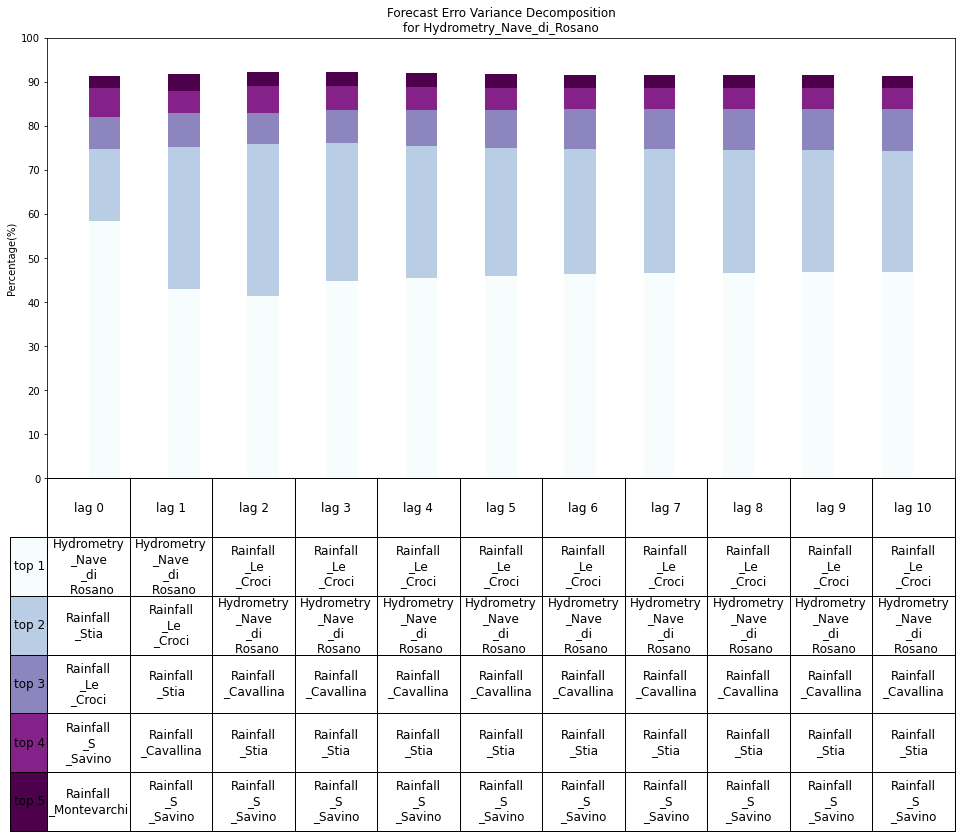

In [140]:
# FEVD Plot Analysis 
varobj.fevd_plot(periods=11, top=5, figsize=(14, 9), max_str_split=3) 

We've implemented various setting of model and find that experiment **No.4 performs the best** on 1D normal prediction and last 14 days prediction. Besides, year_sin usually help improve performance. Thirdly, summarize all rainfall features with a mean in experiemnt No. 3 also performs well compared to the others. Some setting fail Portmanteau test but sill perform better than the one does. 

Since VAR model is linear and thus can only capture local linear prediction, we present LSTM as well trying to capture the possible non-linear relationship between target and features in the following.

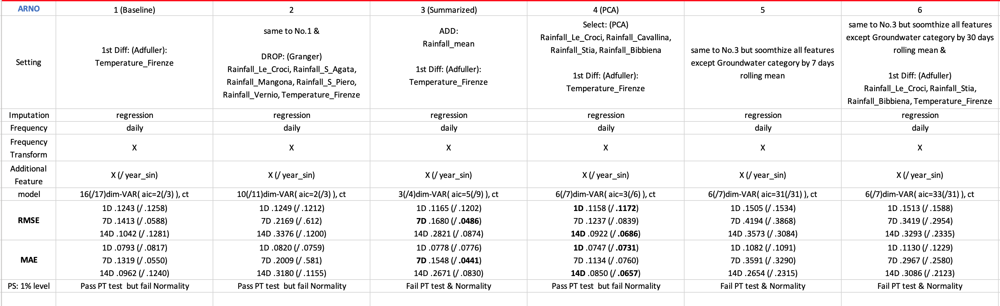

In [29]:
Image("/Users/mbpr/GitHub/Acea-Smart-Water-Analytics/image/arno.png")

## Arno: Daily LSTM

LSTM model doesn't require data to be stationary but better scaled since tanh() is used by LSTM. We then use `MinMaxScaler()` to scale data into $[-1,1]$. One can also use alternative scaler such as `StandardScaler()` by simply changing the `approach='Standard'` in the scale function. `year_sin` is also included to make model learn the yearly pattern better. 

Here we use the same lag as VAR to train the LSTM in order for 1D prediction performance comparison. The model can thus be futher fine tuned based on different lags together with other parameters, which we will omit here (by fixing lag=varlag) and focus only on the feature importance learned by the LSTM.

We didn't implement the LSTM model that predicts 7D/14D in a row since it's intuitive to directly predict on target features instead of predicting on all features and then feed the prediction to the model again, which is like the behaviour of VAR model.

In [141]:
# Feature engineering & imputation
dfextended = df.copy()
mask = maskdf.copy()

## FE
# tmp = ['Rainfall_Le_Croci', 'Rainfall_Cavallina', 'Rainfall_Stia', 'Rainfall_Bibbiena']
# dfextended.drop(columns=dfextended.filter(regex='Rain.*').columns.drop(tmp), inplace=True)

## Reorder 
collector = []
for regex in orderlist:
    collector.append(dfextended.filter(regex=regex).columns)
dfextended = dfextended.reindex(columns= np.concatenate(collector) )

# Deal with Time Periodicity 
year = 365.2425
dfextended['year_sin'] = np.sin(dfextended.index.dayofyear * 2 * np.pi / year)
mask['year_sin'] = False

for col in df.columns.drop(dfextended.columns, errors='ignore'): 
    mask.drop(columns=col, inplace=True)
assert mask.shape == dfextended.shape, f'mask shape {mask.shape} doesn\'t match dfextended shape {dfextended.shape}'
mask = mask.reindex(columns=dfextended.columns)

In [142]:
# Split data
N = dfextended.shape[0]
train, val, test = dfextended[:int(0.8*N)], dfextended[int(0.8*N):int(0.9*N)], dfextended[int(0.9*N):]
_, vmask, tmask = mask[:int(0.8*N)], mask[int(0.8*N):int(0.9*N)], mask[int(0.9*N):]

## define indices
column_indices = {name: i for i, name in enumerate(train.columns)}
targets_indices = [column_indices[ta] for ta in [targets[0]]]

# Scaling and Normalization 
scaler, train_scaled, val_scaled, test_scaled = scale(train, val, test, approach='MinMax')
print('train/val/test shapes are:', train_scaled.shape, val_scaled.shape, test_scaled.shape)

train/val/test shapes are: (1026, 17) (128, 17) (129, 17)


In [143]:
# Initialize data loader: 1-step-ahead prediction
## parameters setting
input_width = varlag     # suggested by VAR
label_width = 1       
shift = 1
batch_size = 4
## generate window
window = WindowGenerator(input_width, label_width, shift, train_scaled, val_scaled, test_scaled, 
                         batch_size=batch_size, shuffle=False, mask=tmask, 
                         label_columns=targets)
print(window)
print('Inputs/labels shapes of window: {} {}'.format(
    window.example[0].shape, window.example[1].shape))

Total window size: 4
Input indices: [0 1 2]
Label indices: [3]
shuffle: False
Label column name(s): ['Hydrometry_Nave_di_Rosano']
Inputs/labels shapes of window: (4, 3, 17) (4, 1, 1)


evaluation before scaling back:
32/32 - 0s - loss: 0.0034 - root_mean_squared_error: 0.0582 - mean_absolute_error: 0.0436
evaluation after scaling back: root_mean_squared_error: 0.1358 - mean_absolute_error: 0.1017


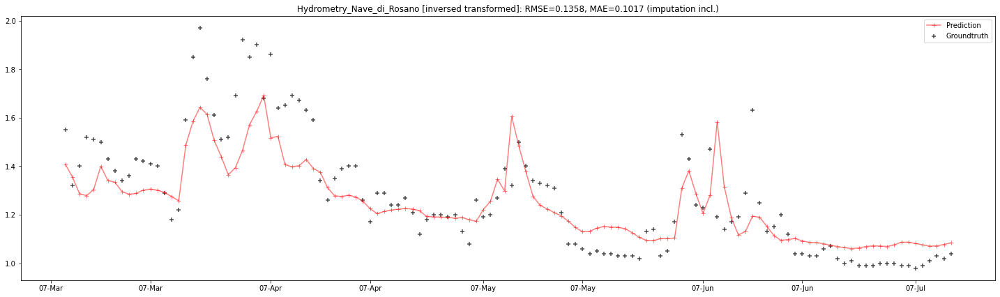

In [144]:
# 1-step-ahead LSTM prediction

lstm_model = None
if os.path.isfile(os.path.join(modelpath, 'arno.keras')):
    lstm_model = tf.keras.models.load_model(os.path.join(modelpath, 'arno.keras'))
else: 
    # ## Parameters setting:
    MAX_EPOCHS = 100
    patience = 10        # stop training if loss increase for 'patience' periods in total.
    lr_rate = 1e-3
    train_verbose = 0    # 0: no output, 1: progress, 2: report
    lstm_kernel = 16
    stateful = False     # batchsize must be 1 if True. (takes 10 mins)
    dropout = 0.3        # dropout rate in [0,1]

    n_features = train_scaled.shape[1]
    n_out = len(targets)
    OUT_STEPS = window.label_width

    ## RNN: LSTM
    lstm_model = tf.keras.Sequential([
        # Shape [batch, time, features] => [batch, lstm_units]
        tf.keras.layers.LSTM(lstm_kernel, return_sequences=True, stateful=stateful),
        tf.keras.layers.Dropout(dropout),
        tf.keras.layers.LSTM(int(lstm_kernel/2), return_sequences=False, stateful=stateful),
        # Shape => [batch, out_steps*features]
        tf.keras.layers.Dropout(dropout),
        tf.keras.layers.Dense(OUT_STEPS*n_out),
        # Shape => [batch, out_steps, features]
        tf.keras.layers.Reshape([OUT_STEPS, n_out])
    ])
    ## compile and fit
    print('window RNN')
    print('Xtrain shape: ', window.example[0].shape, 'ytrain shape: ', window.example[1].shape, end='')
    print('\toutput shape: ', lstm_model(window.example[0]).shape, end='\n\n')
    history = compile_and_fit(lstm_model, window, MAX_EPOCHS, patience, lr_rate, verbose=train_verbose)
    ## save model
    lstm_model.save(os.path.join(modelpath, 'arno.keras'), overwrite=False)
    
## evaluate on test
print('evaluation before scaling back:')
lstm_model.evaluate(window.test, verbose=2, return_dict=True)
#window.plot(lstm_model, use_mask=True)

## inverse_transform_evaluate on test
di = window.inverse_transform_evaluate(lstm_model, scaler, which='test', return_dict=True)
print('evaluation after scaling back: {0}: {2:6.4f} - {1}: {3:6.4f}'.format(*di.keys(), *di.values()))
window.plot(use_mask=True, figsize=(20, 6))

We use the sensitivity analysis to determine the feature importance, that is, when perturbing a particular feature based on testing data, given the values of the other feature unchanged, how much will rmse change by comparing the prediction before and after perturbation. A feature is more important if the larger the rmse is.

In the figure below we find that *Rainfall_Le_Croci, Temperature_Firenze, Rainfall_Cavallina* etc. are important features to LSTM. Compared to OIR analysis in VAR, **only Rainfall_Cavallina, Rainfall_Le_Croci** are in common.

We conclude that Rainfall_Cavallina and Le_Croci are most important feature to Hydrometry_Nave_di_Rosano. Other previous mentioned features are sub-important, part of them to linear model and part of them to non-linear LSTM model.

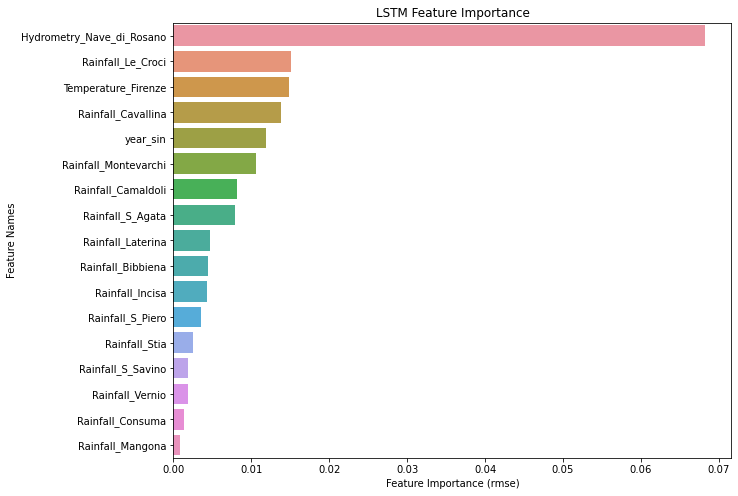

In [145]:
# LSTM feature importance plot
importance, _ = feature_importance(lstm_model, window.X_test, scale=0.2, method='const')
feature_importance_plot(importance, names=train_scaled.columns)

## Summary

We summarize here what we've gotten from the above analysis.<br/>
Target feature: Hydrometry_Nave_di_Rosano.<br/>
Testing size: 129

Most important Features:<br/>
From the VAR model: 1D/7D/14D RMSE - .1172/.0486/.0686 (inverse transformed)
 - Rainfall_Le_croci, Rainfall_Cavallina, Rainfall_Stia, Rainfall_S_Savino

From the LSTM model: 1D - .1358 (inverse transformed and includes imputed values)
 - Rainfall_Le_Croci, Temperature_Firenze, Rainfall_Cavallina

Common important features: Rainfall_Le_Croci, Rainfall_Cavallina

# Water Spring Amiata

Now we get to analyse the water springs and try to estimate the rate at which water flows out of the water springs. The water that flows out of water springs stems from a groundwater body. The groundwater body gets filled with rainwater such that it overflows and releases the excess water through the spring. Therefore, we will assume in our analysis that rain and temperature are exogeneously impacting groundwater levels. Finally, higher groundwater levels should increase the flowing rate of the water springs.

## Data Cleansing

In [146]:
dataset = 'Water_Spring_Amiata.csv'
targets = ['Flow_Rate_Bugnano', 'Flow_Rate_Arbure', 'Flow_Rate_Ermicciolo', 'Flow_Rate_Galleria_Alta']
dateparse = lambda x: datetime.strptime(x, '%d/%m/%Y')

df = pd.read_csv(os.path.join(datapath, dataset), index_col='Date', parse_dates=['Date'], date_parser=dateparse)

# The order of the variables matters for the later analysis.
orderlist = ['Rain.*', 'Temp.*', 'Depth.*', *targets]
collector = []
for regex in orderlist:
    collector.append(df.filter(regex=regex).columns)
df = df.reindex(columns= np.concatenate(collector) )

# define frequency and sort accordingly.
df.index.freq = 'd'
df.sort_index(inplace=True)

# Set weird values to nan
## set nan to Groundwater whose values are 0
df[df.filter(regex='Depth_.*').columns] = df.filter(regex='Depth_.*').replace(0, np.nan)
## set nan to Volume whose values are 0
df[df.filter(regex='Flow_.*').columns] = df.filter(regex='Flow.*').replace(0, np.nan)

In the following, some plots will reveal some features of the data that are relevant for the later analysis. In order to have a time slot that is representative of all the variables, we will use those data from 2016 onwards. The depths to groundwater – as in the previous datasets – appear very laggy and non-stationary. The same case can be made for flow rates.

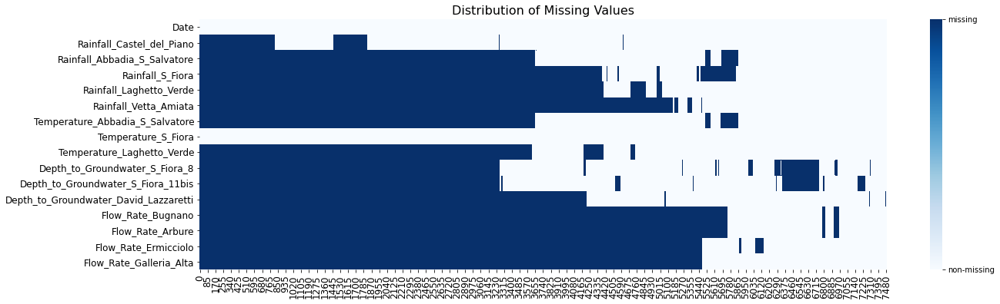

In [147]:
# water_spring_feature_plots(df)
missingval_plot(df.reset_index().T.isna())

In [148]:
# Record nan positions before imputation
mask = df.isna()
dfimputed = df.copy()
dfimputed = fillna(dfimputed, approach='interpolate', method='linear').copy()
todrop = df[df.Temperature_Abbadia_S_Salvatore.isna()].index.max()
dfimputed = dfimputed[dfimputed.index > todrop].copy()
mask = mask[mask.index > todrop].copy()

In [149]:
# Stationarity tests
adftable = adfuller_table(dfimputed, verbose=False, alpha=0.05, maxlag=30, regression='ct')
display(adftable)

I1 = adftable[adftable['AIC_5%level'] == False].index.values
dfstationary = dfimputed.copy()
dfstationary.loc[:, I1] = dfstationary[I1].diff()
dfstationary.dropna(inplace=True)

,AIC_5%level,AIC_bestlag,BIC_5%level,BIC_bestlag
ADFuller Table alpha=0.05,,,,
Rainfall_Castel_del_Piano,True,0,True,0
Rainfall_Abbadia_S_Salvatore,True,0,True,0
Rainfall_S_Fiora,True,2,True,0
Rainfall_Laghetto_Verde,True,0,True,0
Rainfall_Vetta_Amiata,True,2,True,0
Temperature_Abbadia_S_Salvatore,False,5,False,5
Temperature_S_Fiora,False,6,False,5
Temperature_Laghetto_Verde,False,6,False,5
Depth_to_Groundwater_S_Fiora_8,False,2,False,2


After differencing all non-stationary variables, we check for stationarity again. The depth to groundwater in David Lazzaretti is still non-stationary so we difference it for a second time.

,AIC_5%level,AIC_bestlag,BIC_5%level,BIC_bestlag
ADFuller Table alpha=0.05,,,,
Rainfall_Castel_del_Piano,True,0,True,0
Rainfall_Abbadia_S_Salvatore,True,0,True,0
Rainfall_S_Fiora,True,2,True,0
Rainfall_Laghetto_Verde,True,0,True,0
Rainfall_Vetta_Amiata,True,2,True,0
Temperature_Abbadia_S_Salvatore,True,6,True,4
Temperature_S_Fiora,True,5,True,4
Temperature_Laghetto_Verde,True,5,True,4
Depth_to_Groundwater_S_Fiora_8,True,1,True,1


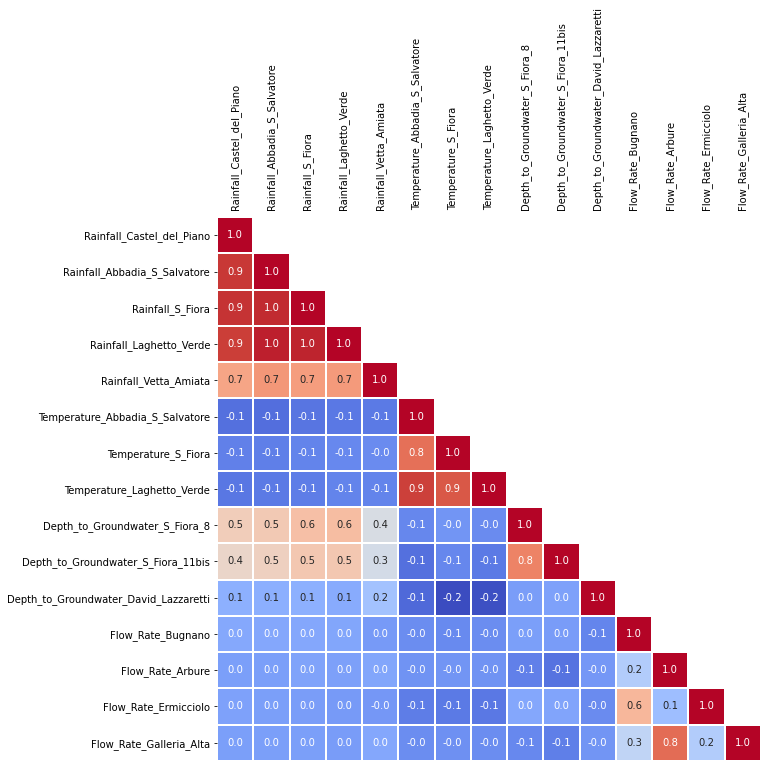

In [150]:
adftable = adfuller_table(dfstationary, verbose=False, alpha=0.05, maxlag=30, regression='ct')
display(adftable)

I2 = adftable[adftable['AIC_5%level'] == False].index.values
dfstationary2 = dfstationary.copy()
dfstationary2.loc[:, I2] = dfstationary[I2].diff()
dfstationary2.dropna(inplace=True)

corrtri_plot(dfstationary2)

In [151]:
N = dfstationary2.shape[0]
train, val, test = dfstationary2[:int(0.8*N)], dfstationary2[int(0.8*N):int(0.9*N)], dfstationary2[int(0.9*N):]
trmask, vmask, tmask = mask[:int(0.8*N)], mask[int(0.8*N):int(0.9*N)], mask[int(0.9*N):]
column_indices = {name: i for i, name in enumerate(train.columns)}
targets_indices = [column_indices[ta] for ta in targets]

The flow rates appear to have a regular pattern.

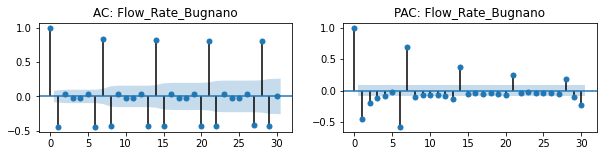

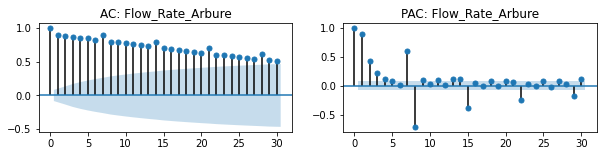

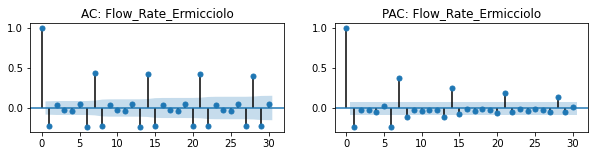

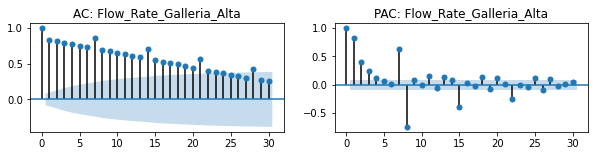

In [152]:
acpac_plot(dfstationary2[targets], figsize=(10, 2))

## Amiata: Daily VAR

Lag orders accoring to information criteria:
{'aic': 8, 'bic': 1, 'hqic': 1, 'fpe': 8}

Durbin-Watson test:
Rainfall_Castel_del_Piano       :   1.98
Rainfall_Abbadia_S_Salvatore    :   1.99
Rainfall_S_Fiora                :   1.97
Rainfall_Laghetto_Verde         :   1.99
Rainfall_Vetta_Amiata           :   1.97
Temperature_Abbadia_S_Salvatore :   2.03
Temperature_S_Fiora             :   2.01
Temperature_Laghetto_Verde      :   2.03
Depth_to_Groundwater_S_Fiora_8  :   2.04
Depth_to_Groundwater_S_Fiora_11bis:   2.06
Depth_to_Groundwater_David_Lazzaretti:   2.06
Flow_Rate_Bugnano               :   1.98
Flow_Rate_Arbure                :   1.97
Flow_Rate_Ermicciolo            :   1.99
Flow_Rate_Galleria_Alta         :   1.98


Test statistic,Critical value,p-value,df
7305.,7399.,0.190,7200


Test statistic,Critical value,p-value,df
7.598e+05,43.77,0.000,30


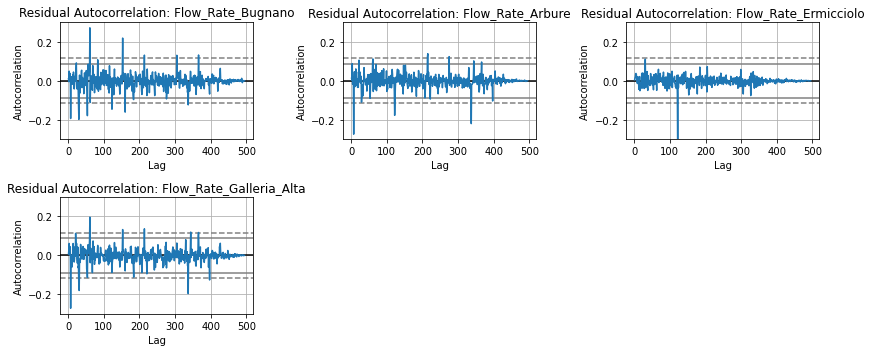

In [153]:
# VAR model 
var_model = VAR(endog=train.append(val))
res = var_model.select_order(maxlags=10, trend='ct')
print('Lag orders accoring to information criteria:')
print(res.selected_orders)
varlag = res.selected_orders['aic']
var_model = var_model.fit(varlag)
# put result into self-defined class
varobj = VARresults(var_model, test , label_columns=targets)  # , mask=tmask[1:])
print('\nDurbin-Watson test:')
_ = varobj.durbin_watson_test()
display(var_model.test_whiteness(nlags=varlag*5, signif=0.05, adjusted=False).summary())
display(varobj.model.test_normality().summary())
varobj.residac_plot(cols=targets, figsize=(12, 5))

The Durbin-Watson and the Portmanteau test indicate that there is no major autocorrelation. The autocorrelation plots still show some peaks which is typical for the water spring datasets.

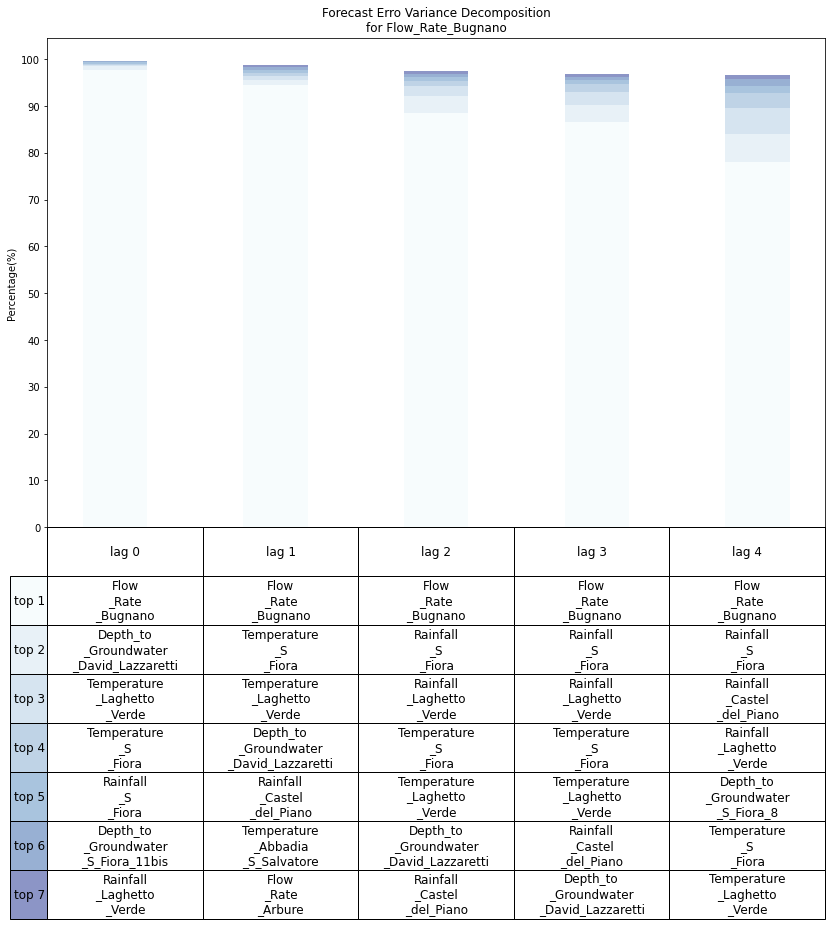

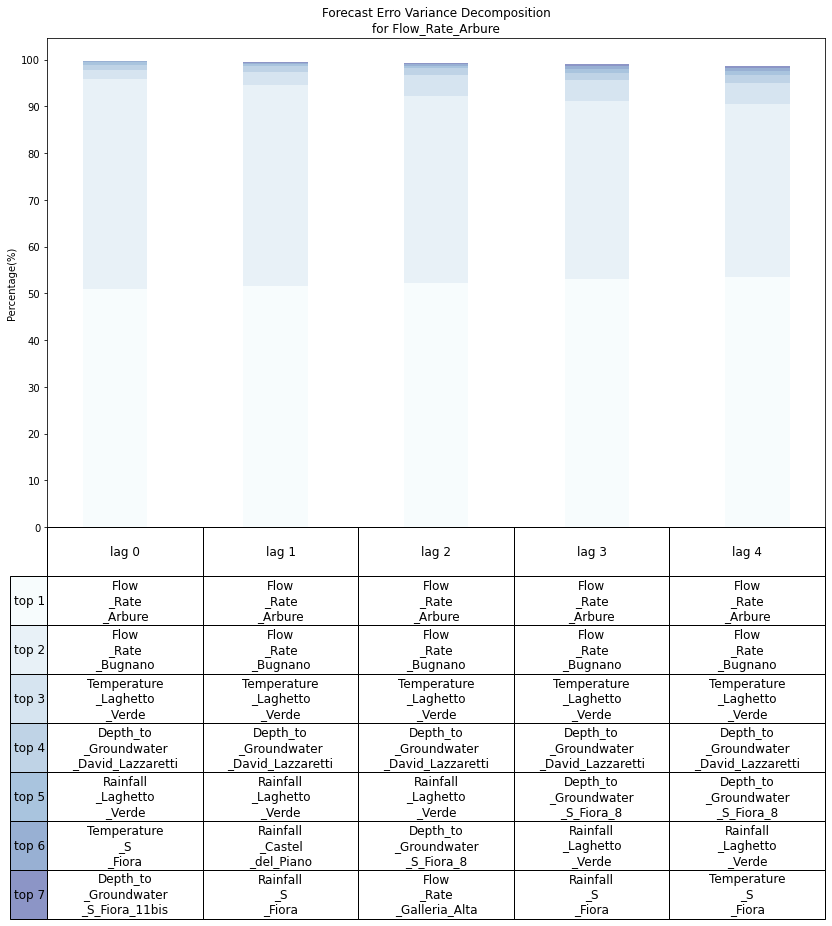

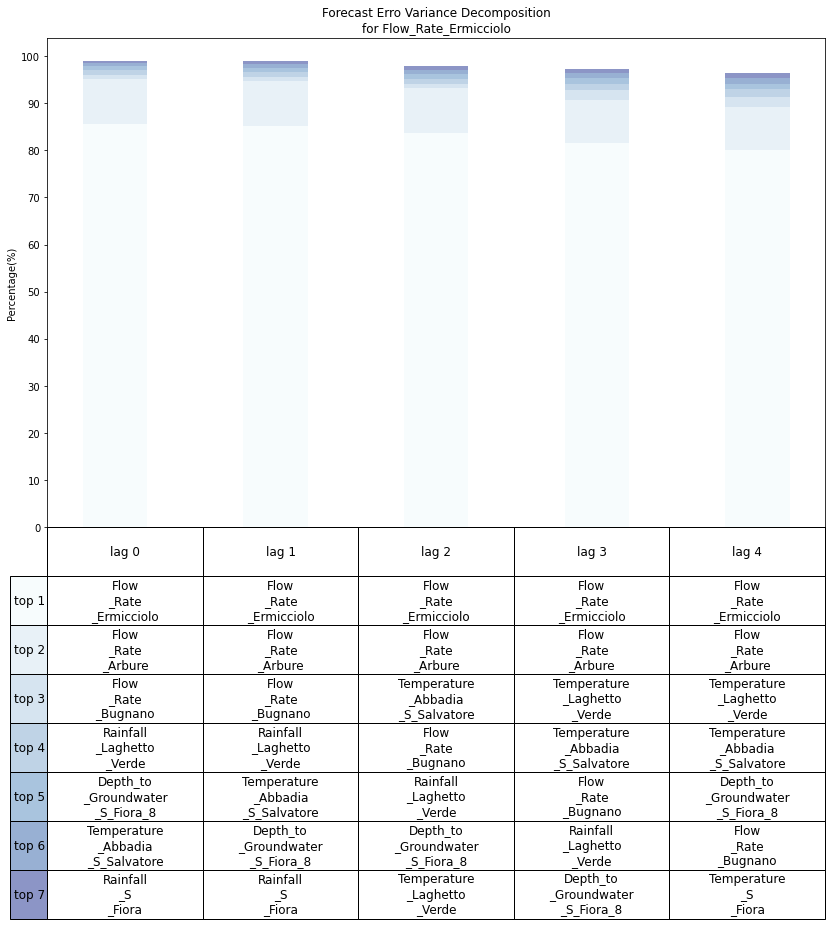

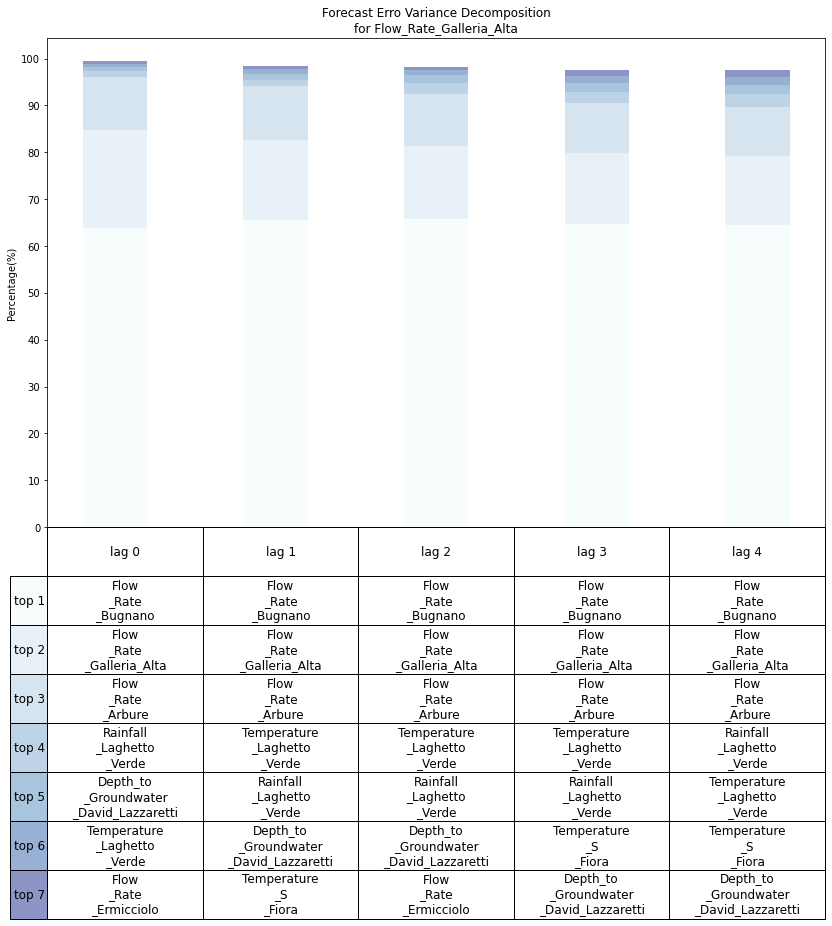

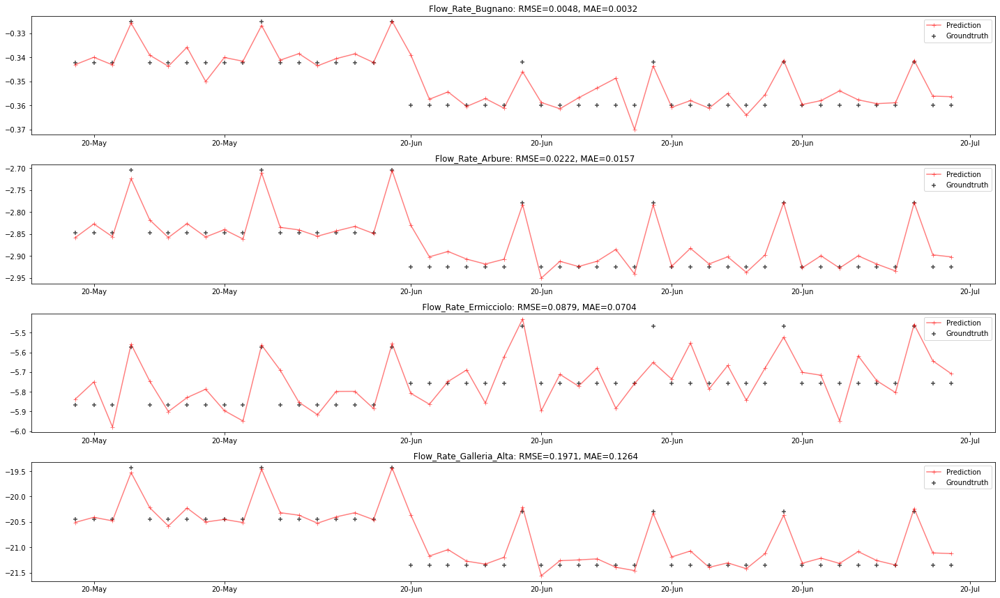

In [154]:
# OIR analysis leads to insignificant results
if len(I2)>0:
    j = 2
elif len(I1):
    j=1
else:
    j=0
varobj = VARresults(var_model, test, mask=tmask[j:], label_columns=targets) #
varobj.inverse_transform_evaluate(I1, dfimputed, use_mask=True)
varobj.fevd_plot(top=7, figsize=(12, 10))

varobj.plot(use_mask=True, figsize=(20, 12))

The orthogonalized impulse responses were mostly insignificant which is why we will rely on forecast error decomposition. We can clearly see that the flow rate of Bugnano and of Arbure seem to be determining a large portion of the variance. Assuming that the water springs are located on different water bodies, this indicated that all these water bodies are impacted simultaneously by rainfall and the resulting water flows. However, if the slow decay in the flow rate proportions indicate that the entire process of rainfall, the filling of aquifers and the water flow from the spings takes time and is laggy. In the FEVD plot for the water spring Bungnano, we can observe  that the variance proportion of variables other than water springs grows over time. Also, if variables with many lags alone were good predictors by themselves, the order of the VAR as suggested by AIC would be larger. This may indicate that a long-memory process may lead to a better performance. This means that a shock may lead to a relatively persistent change in the water flow. This memory could be caputured by a VECM model. Here are the MAE and RMSE for the VAR model.

In [155]:
mode = 'normal'
use_mask = True
multioutput = 'raw_values' 

## after trransformation
steps=1
var_error_I2(steps=steps, I1=I1, I2=I2, test=test, var_fit=var_model, targets=targets)
print('\n')
steps=7
var_error_I2(steps=steps, I1=I1, I2=I2, test=test, var_fit=var_model, targets=targets)
print('\n')
steps=14
var_error_I2(steps=steps, I1=I1, I2=I2, test=test, var_fit=var_model, targets=targets)
print('\n')
steps=28
var_error_I2(steps=steps, I1=I1, I2=I2, test=test, var_fit=var_model, targets=targets)

VAR: Number of prediction steps:  1
Flow_Rate_Bugnano           : RMSE= 0.0383; MAE= 0.0304
Flow_Rate_Arbure            : RMSE= 0.0222; MAE= 0.0157
Flow_Rate_Ermicciolo        : RMSE= 0.3136; MAE= 0.2942
Flow_Rate_Galleria_Alta     : RMSE= 0.1971; MAE= 0.1264


VAR: Number of prediction steps:  7
Flow_Rate_Bugnano           : RMSE= 0.0306; MAE= 0.0274
Flow_Rate_Arbure            : RMSE= 0.0506; MAE= 0.0422
Flow_Rate_Ermicciolo        : RMSE= 0.1779; MAE= 0.1477
Flow_Rate_Galleria_Alta     : RMSE= 0.4927; MAE= 0.3748


VAR: Number of prediction steps:  14
Flow_Rate_Bugnano           : RMSE= 0.0253; MAE= 0.0238
Flow_Rate_Arbure            : RMSE= 0.0952; MAE= 0.0889
Flow_Rate_Ermicciolo        : RMSE= 0.0966; MAE= 0.0845
Flow_Rate_Galleria_Alta     : RMSE= 0.8950; MAE= 0.8185


VAR: Number of prediction steps:  28
Flow_Rate_Bugnano           : RMSE= 0.0042; MAE= 0.0038
Flow_Rate_Arbure            : RMSE= 0.1457; MAE= 0.1435
Flow_Rate_Ermicciolo        : RMSE= 0.0737; MAE= 0.0653
Flow_Rat

## Amiata: Daily VECM

Next, we will continue with the fitting of a VECM model.

In [156]:
dfvecm = dfimputed.copy()
dfvecm.loc[:, I2] = dfimputed[I2].diff()
dfvecm.dropna(inplace=True)
N = dfvecm.shape[0]
train, test = dfvecm[:int(0.9*N)], dfvecm[int(0.9*N):]
_, tmask = mask[:int(0.9*N)], mask[int(0.9*N):]

VECM order:  {'aic': 7, 'bic': 0, 'hqic': 0, 'fpe': 7}


Johansen cointegration test using maximum eigenvalue test statistic with 5% significance level
r_0 r_1 test statistic critical value
-------------------------------------
  0   1          329.5            nan
  1   2          263.8            nan
  2   3          232.1            nan
  3   4          217.3          76.57
  4   5          212.7          70.54
  5   6          189.8          64.50
  6   7          165.5          58.43
  7   8          152.4          52.36
  8   9          47.46          46.23
  9  10          41.00          40.08
 10  11          31.25          33.88
-------------------------------------


Johansen cointegration test using trace test statistic with 5% significance level
r_0 r_1 test statistic critical value
-------------------------------------
  0  15          1914.            nan
  1  15          1584.            nan
  2  15          1320.            nan
  3  15          1088.          335.0
  4 

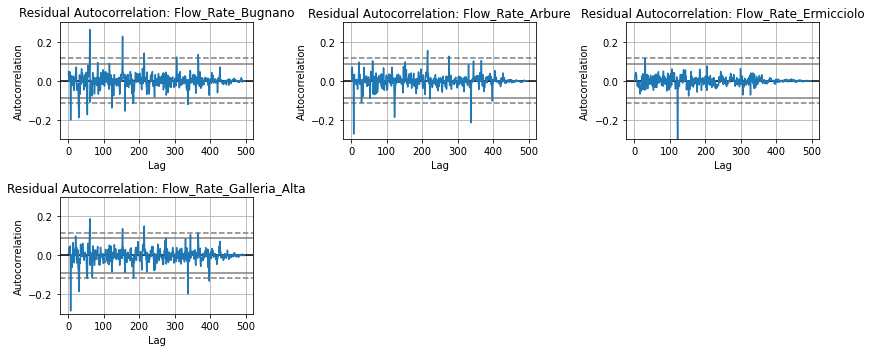

In [157]:
vecmobj = VECM(train.astype(float), test, det='ci', mask=tmask[1:], label_columns=targets)

vecm_order = vecm.select_order(data=train, maxlags=7)
vecm_order = vecm_order.selected_orders
print('VECM order: ', vecm_order)
print('\n')
vecm_order = vecm_order['aic']
vecm_coint = vecm.select_coint_rank(endog=train, k_ar_diff=1, det_order=0, method='maxeig')
print(vecm_coint.summary())
print('\n')
vecm_coint = vecm.select_coint_rank(endog=train, k_ar_diff=1, det_order=0, method='trace')
print(vecm_coint.summary())
print('\n')
vecm_coint = vecm_coint.rank
print('Chosen cointegration order is ', vecm_coint, '.')

res = vecmobj.select_lag(maxlags=12, ic='aic', inplace=True, verbose=True) 
res = vecmobj.select_coint_rank(method='trace', alpha=0.05, inplace=True, verbose=True)
vecmobj.build()

print(end='\n'*2)
print(vecmobj, end='\n'*2)
print('Durbin-Watson test:')
vecmobj.durbin_watson_test()
vecmobj.residac_plot(cols=targets, figsize=(12,5))

The VECM model choice seems to be fine: The Durbin-Watson test does not reveal any issues with autocorrelation. However, there still seems to be some autocorrelation left at high lag orders. After having chosen the lag order and the order of cointegration, we can analyse the quality of the model fit.

OIR of Flow_Rates to Flow_Rates


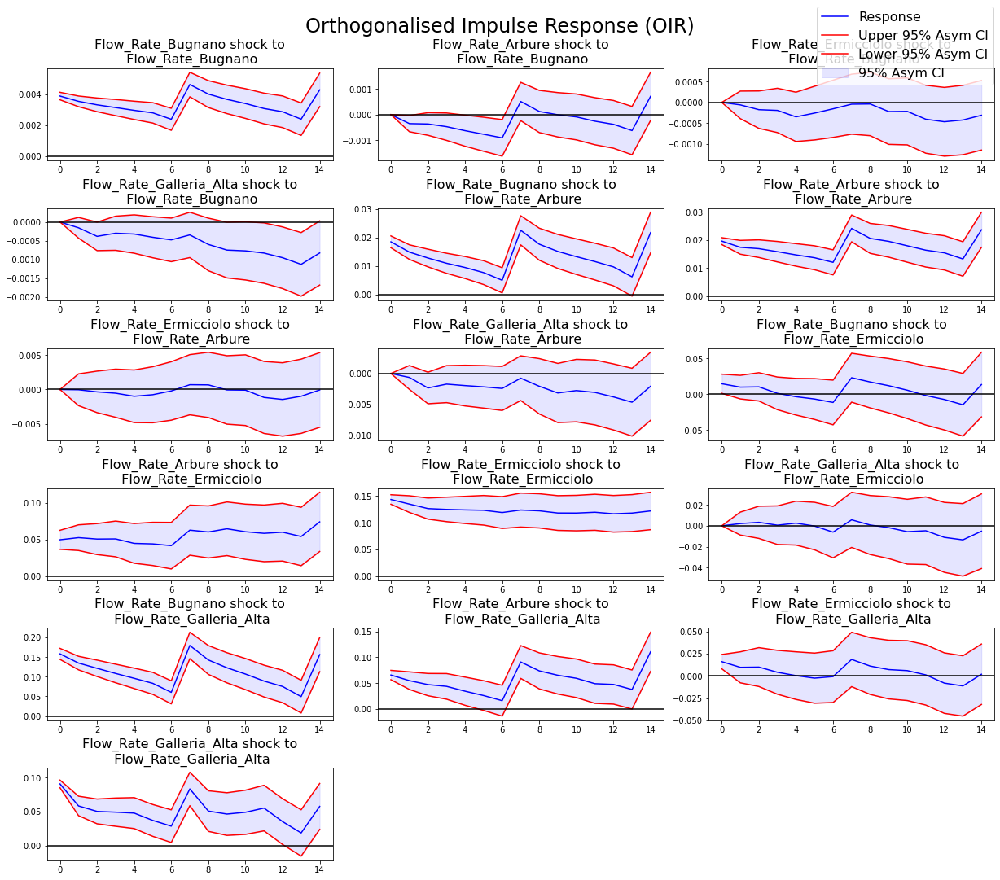

OIR of Rainfalls to Flow_Rates


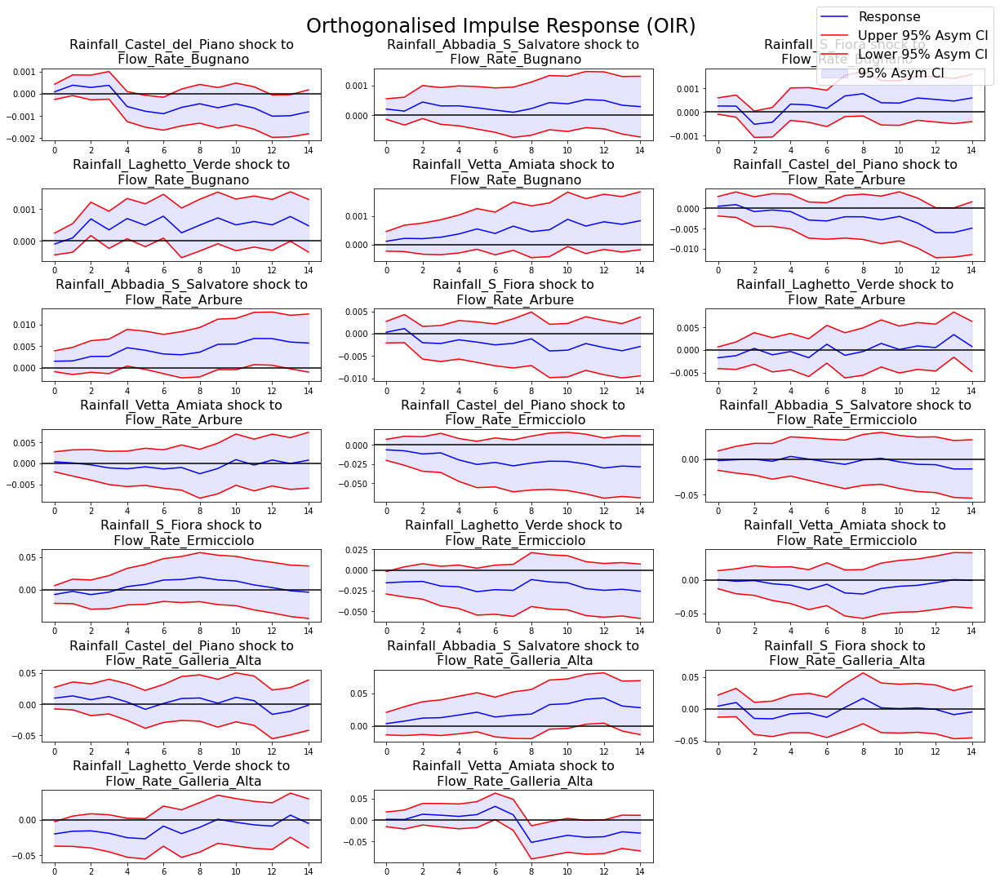

OIR of Depth_to_Groundwaters to Flow_Rates


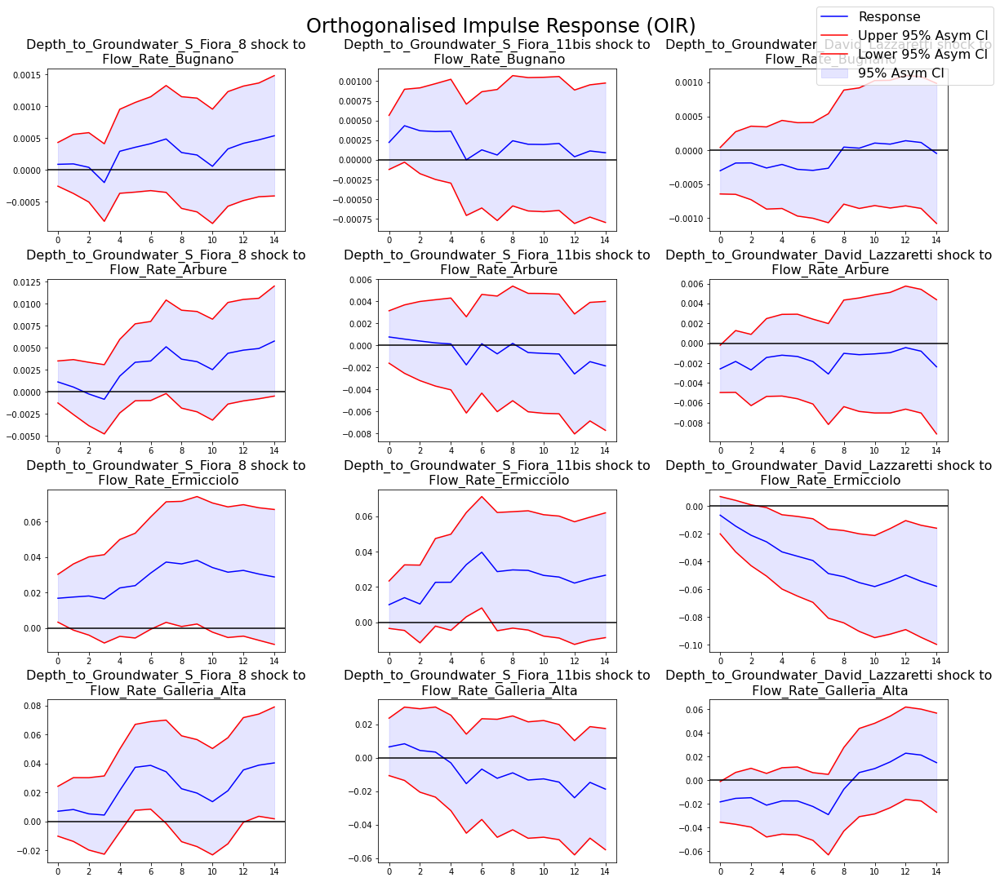

In [158]:
print('OIR of Flow_Rates to Flow_Rates')
vecmobj.irplot(impulse=targets, response=targets, orth=True, method='asym', figsize=(17, 15))
print('OIR of Rainfalls to Flow_Rates')
vecmobj.irplot(impulse=df.filter(regex="Rain.*", axis=1).columns, response=targets, orth=True, method='asym', figsize=(17, 15))
print('OIR of Depth_to_Groundwaters to Flow_Rates')
vecmobj.irplot(impulse=df.filter(regex="Depth.*", axis=1).columns, response=targets, orth=True, method='asym', figsize=(17, 15))

The OIR plots show that the flow rates have strong effects on each other. The rainfall in Laghetto Verde very clearly increases the absolute flow rate of Galleria Alta. An increase in the level of the depth to groundwater in David Lazzaretti bears a long-lasting effect on the flow rate in Ermicciolo.

In [159]:
steps = [1, 7, 14, 28]
for s in steps:
    vecm_rmse_mae(steps=s, train=train, test=test, vecm_order=vecm_order, vecm_coint=vecm_coint)
    print('\n')

Prediction horizon: 1
Flow_Rate_Bugnano  : RMSE =  0.0112 ; MAE =  0.0075
Flow_Rate_Arbure  : RMSE =  0.0825 ; MAE =  0.0546
Flow_Rate_Ermicciolo  : RMSE =  0.1591 ; MAE =  0.1221
Flow_Rate_Galleria_Alta  : RMSE =  0.6151 ; MAE =  0.4048


Prediction horizon: 7
Flow_Rate_Bugnano  : RMSE =  0.0138 ; MAE =  0.0102
Flow_Rate_Arbure  : RMSE =  0.0904 ; MAE =  0.0676
Flow_Rate_Ermicciolo  : RMSE =  0.1907 ; MAE =  0.1538
Flow_Rate_Galleria_Alta  : RMSE =  0.727 ; MAE =  0.5307


Prediction horizon: 14
Flow_Rate_Bugnano  : RMSE =  0.0153 ; MAE =  0.0126
Flow_Rate_Arbure  : RMSE =  0.0938 ; MAE =  0.075
Flow_Rate_Ermicciolo  : RMSE =  0.2092 ; MAE =  0.1726
Flow_Rate_Galleria_Alta  : RMSE =  0.7609 ; MAE =  0.6057


Prediction horizon: 28
Flow_Rate_Bugnano  : RMSE =  0.0169 ; MAE =  0.0154
Flow_Rate_Arbure  : RMSE =  0.0937 ; MAE =  0.0817
Flow_Rate_Ermicciolo  : RMSE =  0.2639 ; MAE =  0.199
Flow_Rate_Galleria_Alta  : RMSE =  0.6981 ; MAE =  0.638




## Summary

VAR and VECM deliver mixed prediction qualities. For Galleria Alta and Abure, the VECM is able to offer better results for prediction horizons of two weeks and above. As it comes to the water spring Bugnano, the VECM seems to offer better prediction results, while VAR predictions for Ermicciole is clearly better than the VECM prediction. 

# Water Spring Lupa

Now, we will turn to the water spring Lupa. The dataset is different from the others because it only has two variables: The rainfall in Terni and the flow rate of the water spring Lupa which is a time series with a peculiar behavior.

## Data Cleansing

In [160]:
dataset = 'Water_Spring_Lupa.csv'
dateparse = lambda x: datetime.strptime(x, '%d/%m/%Y')
df = pd.read_csv(os.path.join(datapath, dataset), index_col='Date', parse_dates=['Date'], date_parser=dateparse)
targets = df.filter(regex='Flow.*', axis=1).columns

# The order of the variables matters for the later analysis.
orderlist = ['Rain.*', 'Temp.*', 'Depth.*', *targets]
collector = []
for regex in orderlist:
    collector.append(df.filter(regex=regex).columns)
df = df.reindex(columns= np.concatenate(collector) )

# define frequency and sort accordingly.
df.index.freq = 'd'
df.sort_index(inplace=True)

# Set weird values to nan
## set nan to Groundwater whose values are 0
df[df.filter(regex='Flow_.*').columns] = df.filter(regex='Flow_.*').replace(0, np.nan)

In the following, some plots will reveal some features of the data that are relevant for the later analysis. Given that the trends of the flow rate are long-lasting, the linear interpolations seems to be a particulary suitable method to imputed the few missing values.

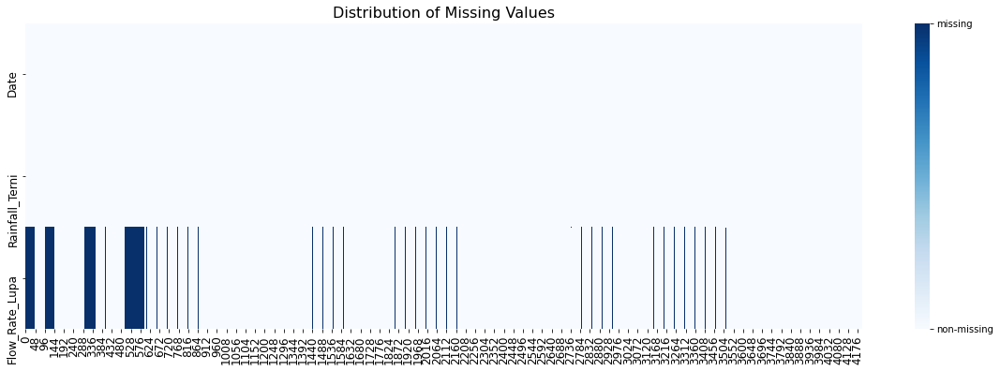

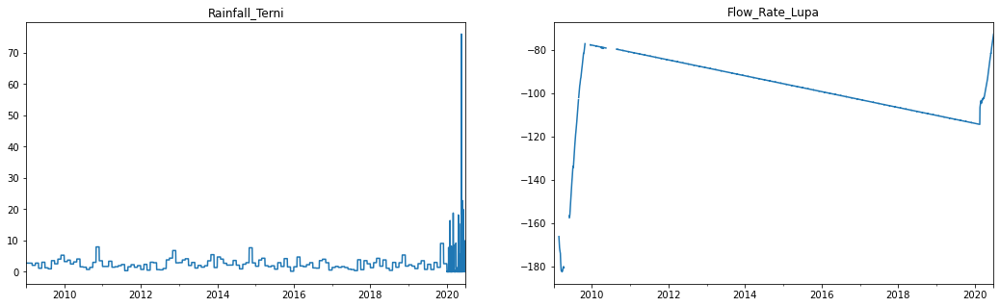

In [161]:
missingval_plot(df.reset_index().T.isna())

fig, ax = plt.subplots(1,2)
df.Rainfall_Terni.plot(ax=ax[0], xlabel='', title='Rainfall_Terni', figsize=(18,5))
df.Flow_Rate_Lupa.plot(ax=ax[1], xlabel='', title='Flow_Rate_Lupa')
plt.show()


We can clearly see here that the flow rate of water spring Lupa has several structural breaks in which a change in the trend occurs. These shifts do not seem to be directly associated with the rainfall in Terni over time – only that the previous increase in the flow rate (or the reduction in the absolute of the flow rate) may have a causal relationship – and the later OIR plots will indicate this causality.

In [162]:
# Record nan positions before imputation
mask = df.isna()
dfimputed = df.copy()

dfimputed = fillna(dfimputed, approach='interpolate', method='linear').copy()

todrop = '2009-02-19'
dfimputed = dfimputed[dfimputed.index > todrop].copy()

mask = mask[mask.index > todrop].copy()
dfimputed = dfimputed.drop('Date', axis=1, errors='ignore')

We drop all data points before 2009-02-19.

In [163]:
# Stationarity tests
adftable = adfuller_table(dfimputed, verbose=False, alpha=0.05, maxlag=60, regression='c') # c instead of ct
display(adftable)

I1 = adftable[adftable['AIC_5%level'] == False].index.values
dfstationary = dfimputed.copy()
dfstationary.loc[:, I1] = dfstationary[I1].diff()
dfstationary.dropna(inplace=True)

,AIC_5%level,AIC_bestlag,BIC_5%level,BIC_bestlag
ADFuller Table alpha=0.05,,,,
Rainfall_Terni,True,60,True,57
Flow_Rate_Lupa,True,34,True,21


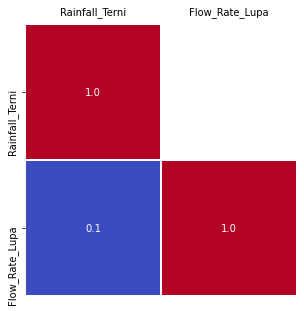

In [164]:
adftable = adfuller_table(dfstationary, verbose=False, alpha=0.05, maxlag=60, regression='ct') # c instead of ct
I2 = adftable[adftable['AIC_5%level'] == False].index.values
dfstationary2 = dfstationary.copy()
dfstationary2.loc[:, I2] = dfstationary[I2].diff()
dfstationary2.dropna(inplace=True)

corrtri_plot(dfstationary2, figsize=(5,5))

adftable = adfuller_table(dfstationary2, verbose=False, alpha=0.05, maxlag=60, regression='ct') # c instead of ct

The flow rate of Lupa and the rainfall in Terni are stationary but very laggy, indicating a long-memory process. We will still continue with a VAR process: First, AR processes are often able to deliver decent predictions even if there is fractional integration in the data. Second, with a VAR process we are able to utilise the rainfall data for our predictions.

In [165]:
N = dfstationary2.shape[0]
train, val, test = dfstationary2[:int(0.8*N)], dfstationary2[int(0.8*N):int(0.9*N)], dfstationary2[int(0.9*N):]
trmask, vmask, tmask = mask[:int(0.8*N)], mask[int(0.8*N):int(0.9*N)], mask[int(0.9*N):]
column_indices = {name: i for i, name in enumerate(train.columns)}
targets_indices = [column_indices[ta] for ta in targets]

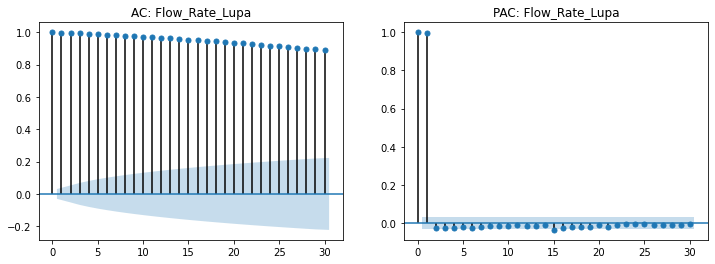

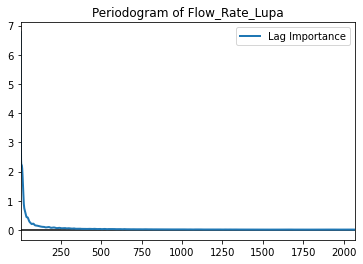

In [166]:
acpac_plot(dfstationary2[targets], figsize=(12, 4))
periodogram(dfstationary2[targets[0]], division=2)

The plots show that there is very large autocorrelation in the data. As we will see next, this explains the need for many lag terms.

## Lupa: Daily VAR

Lag orders accoring to information criteria:
{'aic': 41, 'bic': 15, 'hqic': 32, 'fpe': 41}

Durbin-Watson test:
Rainfall_Terni                  :   2.00
Flow_Rate_Lupa                  :   2.06


Test statistic,Critical value,p-value,df
917.1,277.1,0.000,240


Test statistic,Critical value,p-value,df
2.367e+06,9.488,0.000,4


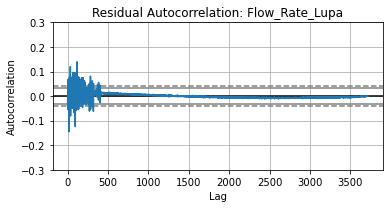

In [167]:
# VAR model 
var_model = VAR(endog=train.append(val))
res = var_model.select_order(maxlags=50, trend='ct')
print('Lag orders accoring to information criteria:')
print(res.selected_orders)
varlag = res.selected_orders['bic']
var_model = var_model.fit(varlag)
# put result into self-defined class
varobj = VARresults(var_model, test , label_columns=targets)
print('\nDurbin-Watson test:')
_ = varobj.durbin_watson_test()

display(var_model.test_whiteness(nlags=varlag*5, signif=0.05, adjusted=False).summary())
display(varobj.model.test_normality().summary())

varobj.residac_plot(cols=targets, figsize=(15,3))

In [168]:
mode = 'normal'
use_mask = True
multioutput = 'raw_values' 

steps=1
var_error_I2(steps=steps, I1=I1, I2=I2, test=test, var_fit=var_model, targets=targets)
print('\n')
steps=7
var_error_I2(steps=steps, I1=I1, I2=I2, test=test, var_fit=var_model, targets=targets)
print('\n')
steps=14
var_error_I2(steps=steps, I1=I1, I2=I2, test=test, var_fit=var_model, targets=targets)
print('\n')
steps=28
var_error_I2(steps=steps, I1=I1, I2=I2, test=test, var_fit=var_model, targets=targets)

VAR: Number of prediction steps:  1
Flow_Rate_Lupa              : RMSE= 0.4206; MAE= 0.0944


VAR: Number of prediction steps:  7
Flow_Rate_Lupa              : RMSE= 1.4715; MAE= 0.5708


VAR: Number of prediction steps:  14
Flow_Rate_Lupa              : RMSE= 2.4280; MAE= 1.2444


VAR: Number of prediction steps:  28
Flow_Rate_Lupa              : RMSE= 4.1490; MAE= 2.8514


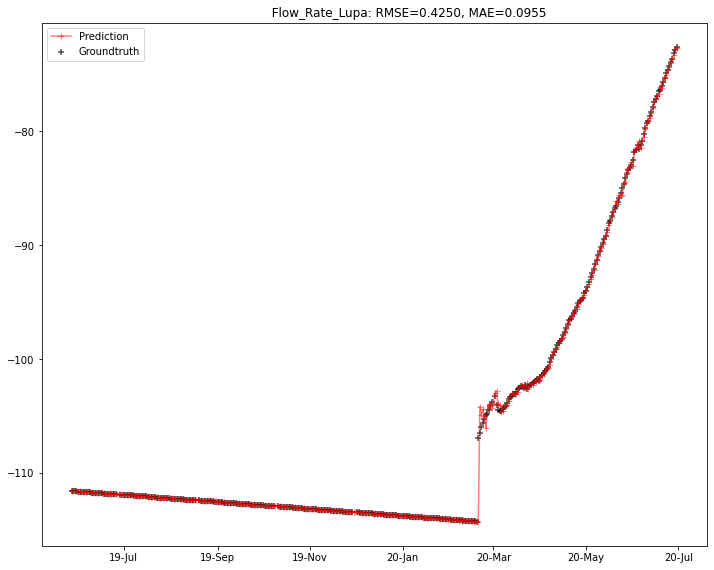

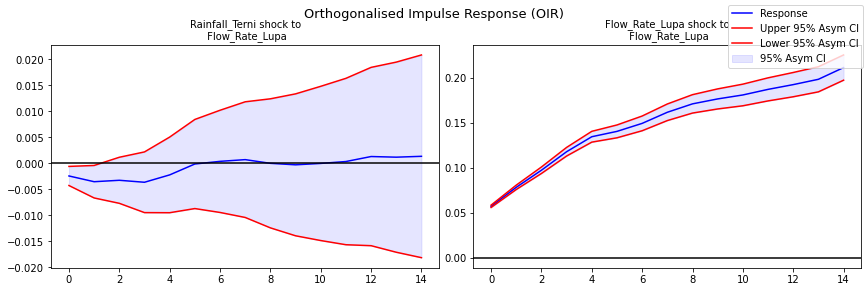

In [169]:
# OIR analysis leads to insignificant results
if len(I2)>0:
    j = 2
elif len(I1):
    j=1
else:
    j=0
varobj = VARresults(var_model, test, mask=tmask[j:], label_columns=targets) #
varobj.inverse_transform_evaluate(I1, dfimputed, use_mask=True)

varobj.plot(use_mask=True, figsize=(10,8))

varobj.irplot(impulse=train.columns, response=targets, orth=True, method='asym', figsize=(12, 4), 
             fontsize=10, supfontsize=13)

## Summary

While the impulse response function for rainfall indicates that rain slightly increases the flow rate (in the absolute), an shock on the flow rate to itself causes a rippeling over the long run. This emphasizes the importance observing this water spring closely, since a short-term shock can have severe long-lasting effects. Since the ADF test resulted in both variables being stationary and rainfall and flow rate are not comoving, fitting a VECM model does not bring any extra benefits.

# Water Spring Madonna di Canneto

Now we get to analyse the water spring Madonna di Canneto. This dataset consists of one rainfall, one temperature and one depth to groundwater level variable.

## Data Cleansing

In [170]:
dataset = 'Water_Spring_Madonna_di_Canneto.csv'
dateparse = lambda x: datetime.strptime(x, '%d/%m/%Y')
targets = ['Flow_Rate_Madonna_di_Canneto']
df = pd.read_csv(os.path.join(datapath, dataset), index_col='Date', parse_dates=['Date'])

# The order of the variables matters for the later analysis.
orderlist = ['Rain.*', 'Temp.*', 'Depth.*', *targets]
collector = []
for regex in orderlist:
    collector.append(df.filter(regex=regex).columns)
df = df.reindex(columns= np.concatenate(collector) )

# define frequency and sort accordingly.
#df.index.freq = 'd'
df.sort_index(inplace=True)

# Set weird values to nan
## set nan to Groundwater whose values are 0
df[df.filter(regex='Depth_.*').columns] = df.filter(regex='Depth_.*').replace(0, np.nan)
## set nan to Volume whose values are 0
df[df.filter(regex='Flow_.*').columns] = df.filter(regex='Flow.*').replace(0, np.nan)
## set nan to Temperature whose values are 0
df[df.filter(regex='Temperature_.*').columns] = df.filter(regex='Temperature_.*').replace(0, np.nan)

In the following, some plots will reveal some features of the data that are relevant for the later analysis. In order to have a time slot that is representative of all the variables, we will use those data from 2016 onwards. The depths to groundwater – as in the previous datasets – appear very laggy and non-stationary. The same case can eb made for flow rates.

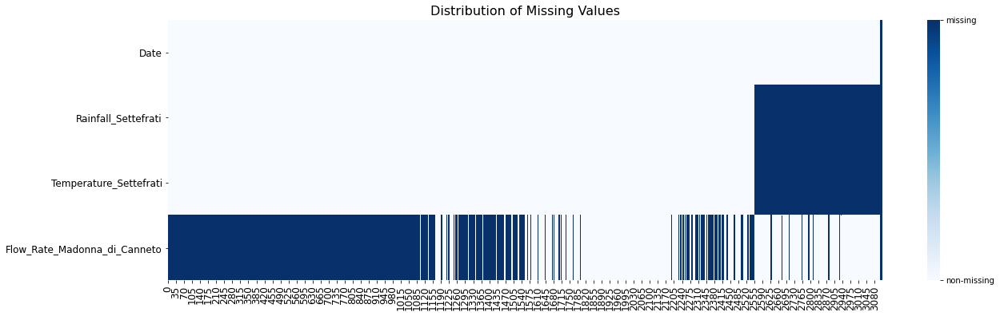

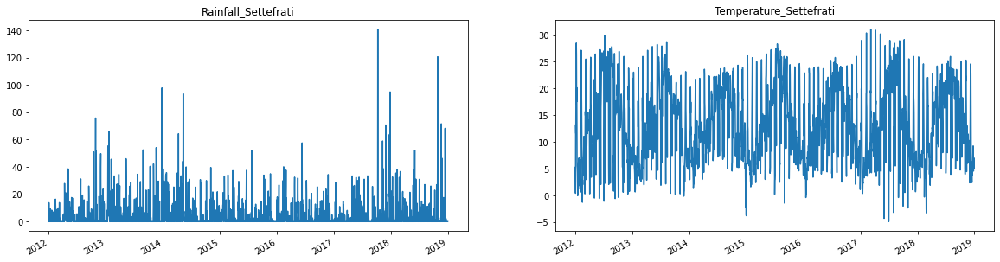

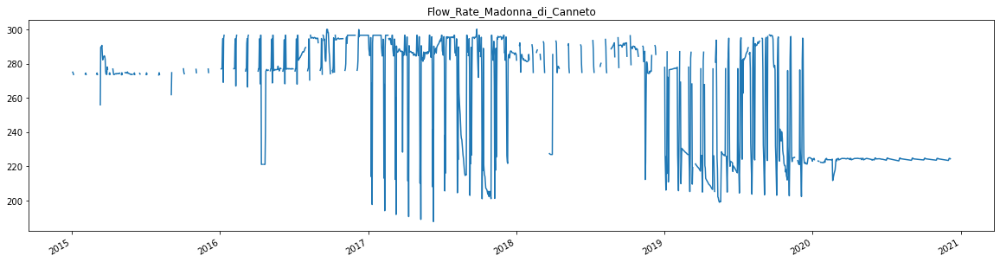

In [171]:
# water_spring_feature_plots(df)
missingval_plot(df.reset_index().T.isna())

fig, ax = plt.subplots(1,2)
df.Rainfall_Settefrati.plot(ax=ax[0], xlabel='', title='Rainfall_Settefrati', figsize=(20,5))
df.Temperature_Settefrati.plot(ax=ax[1], xlabel='', title='Temperature_Settefrati')
plt.show()
df.Flow_Rate_Madonna_di_Canneto.plot(xlabel='', title='Flow_Rate_Madonna_di_Canneto', figsize=(20,5))
plt.show()

In [172]:
# Record nan positions before imputation
mask = df.isna()
dfimputed = df.copy()

todrop = df[df.Rainfall_Settefrati.isna()].index.min()

dfimputed = dfimputed[dfimputed.index < todrop].copy()
mask = mask[mask.index < todrop].copy()

dfimputed = fillna(dfimputed, approach='interpolate', method='linear').copy()

todrop = '2015-01-03'
dfimputed = dfimputed[dfimputed.index > todrop].copy()
mask = mask[mask.index > todrop].copy()

We will only use the data between 2015 and 2019 for our analysis.

In [173]:
# Stationarity tests
adftable = adfuller_table(dfimputed, verbose=False, alpha=0.05, maxlag=30, regression='ct')
display(adftable)

I1 = adftable[adftable['AIC_5%level'] == False].index.values
dfstationary = dfimputed.copy()
dfstationary.loc[:, I1] = dfstationary[I1].diff()
dfstationary.dropna(inplace=True)

,AIC_5%level,AIC_bestlag,BIC_5%level,BIC_bestlag
ADFuller Table alpha=0.05,,,,
Rainfall_Settefrati,True,0,True,0
Temperature_Settefrati,False,30,False,29
Flow_Rate_Madonna_di_Canneto,True,29,True,4


Checking again with an ADF test for stationarity: 


,AIC_5%level,AIC_bestlag,BIC_5%level,BIC_bestlag
ADFuller Table alpha=0.05,,,,
Rainfall_Settefrati,True,0,True,0
Temperature_Settefrati,True,34,True,30
Flow_Rate_Madonna_di_Canneto,True,33,True,31


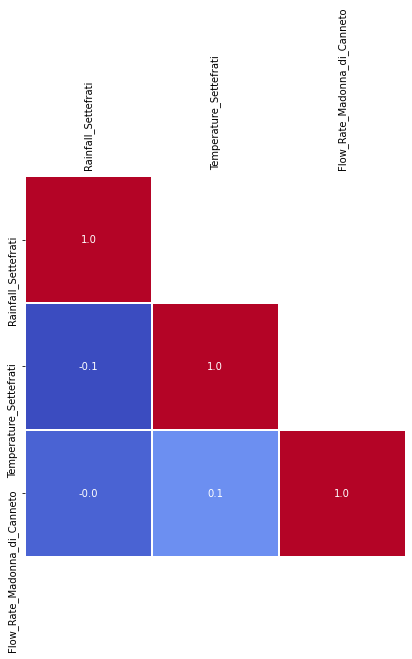

In [174]:
adftable = adfuller_table(dfstationary, verbose=False, alpha=0.05, maxlag=35, regression='ct')
print('Checking again with an ADF test for stationarity: ')
display(adftable)

I2 = adftable[adftable['AIC_5%level'] == False].index.values
dfstationary2 = dfstationary.copy()
dfstationary2.loc[:, I2] = dfstationary[I2].diff()
dfstationary2.dropna(inplace=True)

corrtri_plot(dfstationary2, figsize=(7,7))

dfstationary2 = dfstationary2.drop('Date', axis=1, errors='ignore')

In [175]:
N = dfstationary2.shape[0]
train, val, test = dfstationary2[:int(0.8*N)], dfstationary2[int(0.8*N):int(0.9*N)], dfstationary2[int(0.9*N):]
trmask, vmask, tmask = mask[:int(0.8*N)], mask[int(0.8*N):int(0.9*N)], mask[int(0.9*N):]
column_indices = {name: i for i, name in enumerate(train.columns)}
targets_indices = [column_indices[ta] for ta in targets]

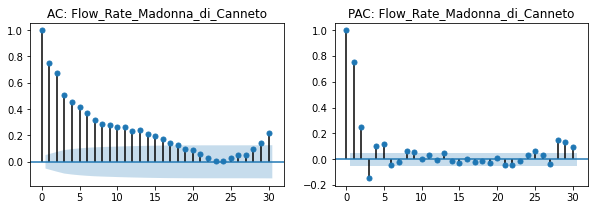

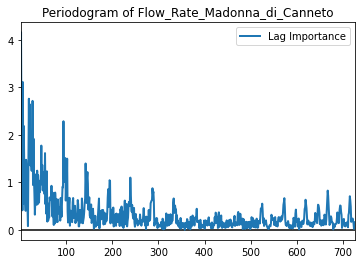

In [176]:
acpac_plot(dfstationary2[targets], figsize=(10, 3) )
periodogram(dfstationary2[targets[0]], division=2)

## Madonna di Canneto: Daily VAR

Lag orders accoring to information criteria:
{'aic': 32, 'bic': 8, 'hqic': 32, 'fpe': 32}

 Durbin-Watson test:
Rainfall_Settefrati             :   2.00
Temperature_Settefrati          :   2.00
Flow_Rate_Madonna_di_Canneto    :   1.97


Test statistic,Critical value,p-value,df
945.8,328.6,0.000,288


Test statistic,Critical value,p-value,df
1.479e+05,12.59,0.000,6


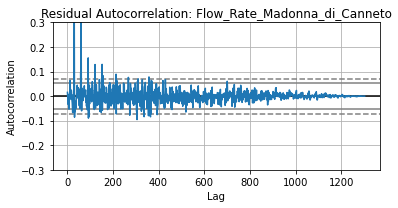

In [177]:
var_model = VAR(endog=train.append(val))
res = var_model.select_order(maxlags=50, trend='ct')
print('Lag orders accoring to information criteria:')
print(res.selected_orders)
varlag = res.selected_orders['bic']
var_model = var_model.fit(varlag)
# put result into self-defined class
varobj = VARresults(var_model, test , label_columns=targets)
print('\n Durbin-Watson test:')
_ = varobj.durbin_watson_test()

display(var_model.test_whiteness(nlags=varlag*5, signif=0.05, adjusted=False).summary())
display(varobj.model.test_normality().summary())

varobj.residac_plot(cols=targets, figsize=(15,3))

Although short-term autocorrelation does not cause any problems (as indicated by the Durbin-Watson test), there is some autocorrelations at high lag orders as can be seen in the autocorrelation plot and in the Portmanteau-test at larger lag orders.

In [178]:
mode = 'normal'
use_mask = True
multioutput = 'raw_values' 
## after transformation
steps=1
var_error_I2(steps=steps, I1=I1, I2=I2, test=test, var_fit=var_model, targets=targets)
print('\n')
steps=7
var_error_I2(steps=steps, I1=I1, I2=I2, test=test, var_fit=var_model, targets=targets)
print('\n')
steps=14
var_error_I2(steps=steps, I1=I1, I2=I2, test=test, var_fit=var_model, targets=targets)
print('\n')
steps=28
var_error_I2(steps=steps, I1=I1, I2=I2, test=test, var_fit=var_model, targets=targets)

VAR: Number of prediction steps:  1
Flow_Rate_Madonna_di_Canneto: RMSE= 9.5089; MAE= 5.3967


VAR: Number of prediction steps:  7
Flow_Rate_Madonna_di_Canneto: RMSE=14.0742; MAE=10.3333


VAR: Number of prediction steps:  14
Flow_Rate_Madonna_di_Canneto: RMSE=13.0118; MAE=10.9436


VAR: Number of prediction steps:  28
Flow_Rate_Madonna_di_Canneto: RMSE=13.9059; MAE=11.4635


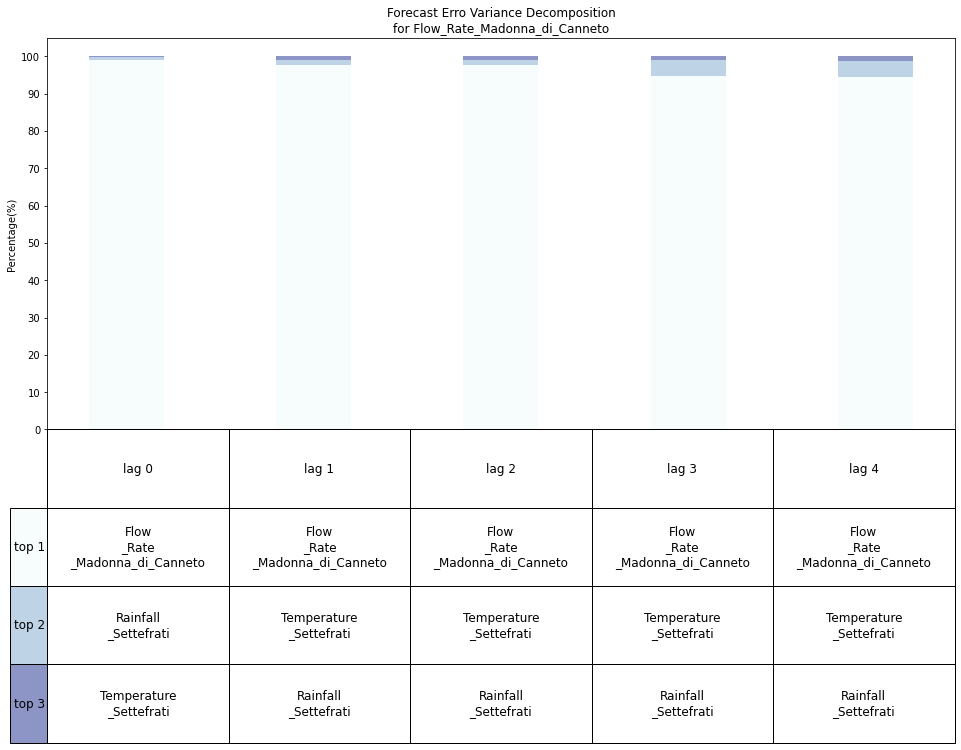

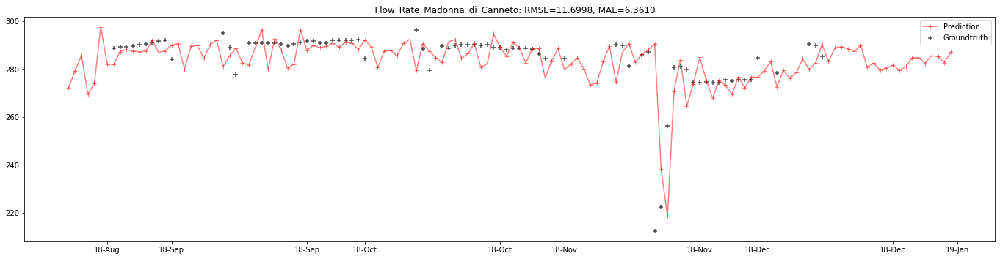

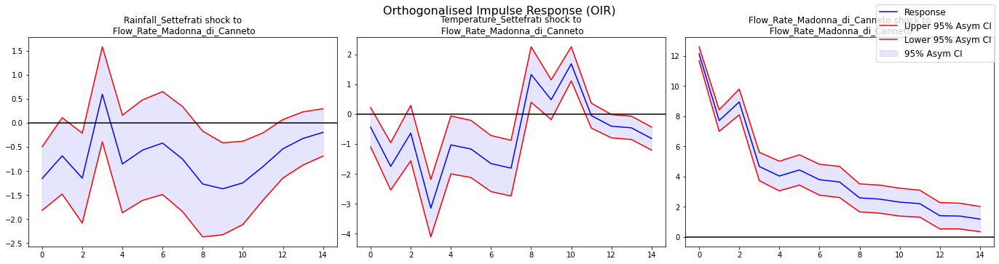

In [179]:
# OIR analysis leads to insignificant results
if len(I2)>0:
    j = 2
elif len(I1):
    j=1
else:
    j=0
varobj = VARresults(var_model, test, mask=tmask[j:], label_columns=targets) #
varobj.inverse_transform_evaluate(I1, dfimputed, use_mask=True)
varobj.fevd_plot(top=3)

varobj.plot(use_mask=True, figsize=(19, 5))
varobj.irplot(impulse=train.columns, response=targets, orth=True, method='asym', figsize=(19, 5), 
             fontsize=12, supfontsize=16)

The FEVD plot reveals that the most important feature that describes the flow rate at Madonna di Canneto is the flow rate itself. Also, the time series relies on many lags. This means that a shock in the flow rate leads to a relatively persistent change in the water flow. This long-term memory could be caputured with a VECM model.

## Madonna di Canneto: Daily VECM

In [180]:
dfvecm = dfimputed.copy()
dfvecm.loc[:, I2] = dfimputed[I2].diff()
dfvecm.dropna(inplace=True)
dfvecm=dfvecm.drop('Date', axis=1, errors='ignore')
N = dfvecm.shape[0]
train, test = dfvecm[:int(0.9*N)], dfvecm[int(0.9*N):]
_, tmask = mask[:int(0.9*N)], mask[int(0.9*N):]

VECM order:  {'aic': 12, 'bic': 2, 'hqic': 8, 'fpe': 12}


Johansen cointegration test using maximum eigenvalue test statistic with 5% significance level
r_0 r_1 test statistic critical value
-------------------------------------
  0   1          458.5          21.13
  1   2          161.3          14.26
  2   3          87.40          3.841
-------------------------------------


Johansen cointegration test using trace test statistic with 5% significance level
r_0 r_1 test statistic critical value
-------------------------------------
  0   3          707.1          29.80
  1   3          248.7          15.49
  2   3          87.40          3.841
-------------------------------------


Chosen cointegration order is  3 .


Endogenous data shape: (1312, 3)
Selected lag order: 12
Cointegration rank: 3
Deterministic term: ci

Durbin-Watson test:
Rainfall_Settefrati             :   2.00
Temperature_Settefrati          :   2.00
Flow_Rate_Madonna_di_Canneto    :   2.00


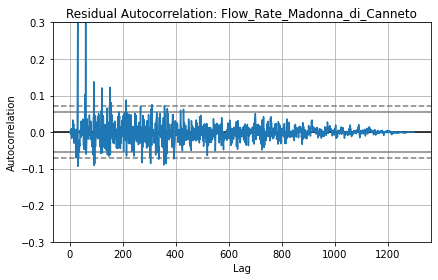

In [181]:
vecmobj = VECM(train.astype(float), test, det='ci', mask=tmask[1:], label_columns=targets)

vecm_order = vecm.select_order(data=train, maxlags=20)
#print(vecm_order.summary())
vecm_order = vecm_order.selected_orders
print('VECM order: ', vecm_order)
print('\n')
vecm_order = vecm_order['aic']
vecm_coint = vecm.select_coint_rank(endog=train, k_ar_diff=1, det_order=0, method='maxeig')
print(vecm_coint.summary())
print('\n')
vecm_coint = vecm.select_coint_rank(endog=train, k_ar_diff=1, det_order=0, method='trace')
print(vecm_coint.summary())
print('\n')
vecm_coint = vecm_coint.rank
print('Chosen cointegration order is ', vecm_coint, '.')

res = vecmobj.select_lag(maxlags=12, ic='aic', inplace=True, verbose=True) 
#print('lag {} has been stored.'.format(res))
res = vecmobj.select_coint_rank(method='trace', alpha=0.05, inplace=True, verbose=True)
#print('coint_rank {} has been stored.'.format(res))
vecmobj.build()

print(end='\n'*2)
print(vecmobj, end='\n'*2)
print('Durbin-Watson test:')
vecmobj.durbin_watson_test()

vecmobj.residac_plot(cols=targets, figsize=(17,4))

The VECM model choice seems to be fine: The Durbin-Watson test does not reveal any issues with short-term  autocorrelation. After having chosen the lag order and the order of cointegration, we can analyse the quality of the model fit.

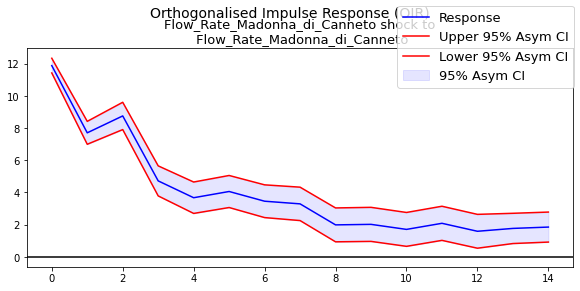

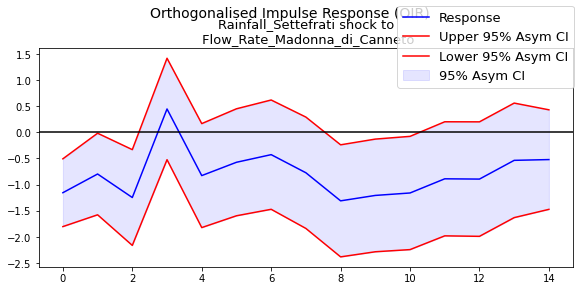

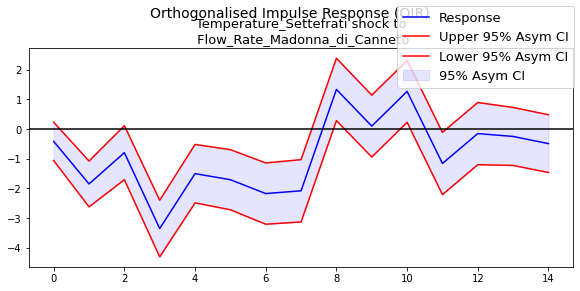

In [182]:
vecmobj.irplot(impulse=targets, response=targets, orth=True, method='asym', figsize=(8, 4), fontsize=13, supfontsize=14)
vecmobj.irplot(impulse=df.filter(regex="Rain.*", axis=1).columns, response=targets, orth=True, 
               method='asym', figsize=(8, 4), fontsize=13, supfontsize=14)
vecmobj.irplot(impulse=df.filter(regex="Temp.*", axis=1).columns, response=targets, orth=True, 
               method='asym', figsize=(8, 4), fontsize=13, supfontsize=14)

Rainfall leads to a stronger flow rate at Madonna di Canneto as does the temperature in Settefrati. A sudden shock in the flow rate seems to be followed by a slow normalization of the flow rate. This indicates that a change in the flow rate means that this change will persist over several weeks. It also means that this is a long-memory process.

In [183]:
steps = [1, 7, 14, 28]
for s in steps:
    vecm_rmse_mae(steps=s, train=train, test=test, vecm_order=vecm_order, vecm_coint=vecm_coint)
    print('\n')

Prediction horizon: 1
Flow_Rate_Madonna_di_Canneto  : RMSE =  11.6846 ; MAE =  6.4348


Prediction horizon: 7
Flow_Rate_Madonna_di_Canneto  : RMSE =  12.8215 ; MAE =  8.9599


Prediction horizon: 14
Flow_Rate_Madonna_di_Canneto  : RMSE =  12.0066 ; MAE =  9.6939


Prediction horizon: 28
Flow_Rate_Madonna_di_Canneto  : RMSE =  13.2674 ; MAE =  10.6139




## Summary

The VECM model leads to lower prediction MAE and RMSE compared than the VAR model for all predictions with a prediction horizon larger than a week. Even though the ADF test did not indicate the need of differencing, cointegration seems seems to benefit the prediction qulaity. VECM also requires a lower lag order than the VAR specification, even though it is not fully capable of reducing the high-lag autocorrelation.

# Conclusion

We've implemented VAR, VECM, and LSTM models to predict 1 day, last 7 days, and last 14 days performance. Feature analysis is not only given in the VAR model via OIR and FEVD plots but is also presented in LSTM via sensitivity analysis. In the best situation, a feature is double confirmed to be important when both feature analysis in VAR and LSTM models give it top ranks. In VAR, we not only prudently derive models and give various testing to see appropriateness of the model, but also conduct various settings on models and report them in each section. Although LSTM is not perfectly fine tuned, in most cases it provides decent forecasts and gives reasonable results about feature importance. In the Doganella and Luco datasets where missing data provide an obstacle, we are conservative to give conclusions. And when calculating the MAE/RMSE in each dataset, we scale the data back to the original levels in order to accurately reflect the true performance.

In the future, further studies can be done to create models that evaluate predictions over longer horizons. Features may interact in different patterns and early warning signals of shortening water supply may be uncovered. Also, since the data revealed long memory in many cases, a multivariate version of fractional integration (i.e. processes with an order of integration between zero and one) may be useful to deal with large lag orders. Such models may require fewer parameters and can be used to predict over long horizons. We attempted to tackle the problem of large lags with the use of VECM models. 


# References

* [Cross-batch statefulness- Working with RNNs](https://keras.io/guides/working_with_rnns/)
* [Time Series Forecasting, Tensorflow](https://www.tensorflow.org/tutorials/structured_data/time_series#top_of_page)
* [Combine LSTM and VAR for Multivariate Time Series Forecasting](https://towardsdatascience.com/combine-lstm-and-var-for-multivariate-time-series-forecasting-abdcb3c7939b)
* [How to Build VAR model](https://www.machinelearningplus.com/time-series/vector-autoregression-examples-python/)
* [statsmodels.tsa.vector_ar.var_model](https://www.statsmodels.org/dev/_modules/statsmodels/tsa/vector_ar/var_model.html#VARResults.irf_errband_mc)
* [The Unreasonable Effectiveness of Recurrent Neural Networks](http://karpathy.github.io/2015/05/21/rnn-effectiveness/)
* [Aquifer-Wikipedia](https://en.wikipedia.org/wiki/Aquifer#:~:text=An%20aquifer%20is%20an%20underground,of%20aquifers%20is%20called%20hydrogeology.)
* [How Stream is Measures](https://www.usgs.gov/special-topic/water-science-school/science/how-streamflow-measured?qt-science_center_objects=0#qt-science_center_objects)